# Aici incepe programul

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (6,6)

from tensorflow.keras import backend as K
from tensorflow.keras.layers import Layer
from tensorflow.keras import initializers, regularizers, constraints
from sklearn.metrics import classification_report
from tensorflow.keras.layers import Dense, Input, LSTM, Bidirectional, Activation, Conv1D, GRU, TimeDistributed
from tensorflow.keras.layers import Dropout, Embedding, GlobalMaxPooling1D, MaxPooling1D, Add, Flatten, SpatialDropout1D
from tensorflow.keras.layers import GlobalAveragePooling1D, BatchNormalization, concatenate
from keras.layers import Reshape, merge, Concatenate, Lambda, Average
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.initializers import Constant
from keras.layers.merge import add
import sklearn
import joblib
import pickle
from tensorflow.keras.preprocessing import sequence
from tensorflow.keras.preprocessing.text import Tokenizer, text_to_word_sequence
from keras.utils import np_utils

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import psutil
# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory
import sys
import os
print(os.listdir("C:/Users/live_/Beautifulsupa"))
import re
# Any results you write to the current directory are saved as output.
from nltk.stem import PorterStemmer
from langdetect import detect

['.ipynb_checkpoints', 'Agricutural and Biological Sciences', 'articles.txt', 'articol', 'articol.txt', 'Arts and Humanities', 'Biochemistry, Genetics and Molecular Biology', 'Business, Management and Accounting', 'C', 'Categori.csv', 'Categori.xlsx', 'CevaNou.json', 'Chemical Engineering', 'Chemistry', 'continut1.json', 'data.json', 'datasez.json', 'Decision Sciences', 'Dentistry', 'dict.json', 'domeniul trecutului', 'Earth and Planetary Sciences', 'Economics, Econometrics and Finance', 'Energy', 'Engineering', 'glove.6B.100d.txt', 'glove.6B.300d.txt', 'JSON READ.ipynb', 'Mathematics', 'MetodaBert.ipynb', 'Models', 'News_Category_Dataset_v2.json', 'oooooooooooo', 'TextCNN (1).ipynb', 'TFIDF_Models.ipynb', 'TFIDF_Models22.ipynb', 'Untitled.ipynb', 'web.ipynb', 'Word2Vec_Models.ipynb']


In [ ]:
# pentru a lua informatie relevanta textul trebuie sa aiba peste 1500 charaactere
# textul trebuie tradus din anumite limbi

# Functii de curatare

In [2]:
def remove_non_ascii(text):
    return ''.join([i if ord(i) < 128 else ' ' for i in text])

def remove_stopwords(text):
    cachedStopWords = stopwords.words("english")
    text = ' '.join([word for word in text.split() if word not in cachedStopWords])
    return text

def remove_punctuation(text):
    copy = re.sub(r'[^\w\s]', ' ', text)
    return copy

def remove_numbers(text):
    return re.sub(r'[0-9]+','',text)

def remove_links(text):
    return re.sub('http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|[!*\(\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))+', '', 
                  text, flags=re.MULTILINE)
def remove_spaces(text):
    return " ".join(text.split())

def preprocessing(text):
    text = remove_non_ascii(text)
    text = remove_links(text)
    text = remove_numbers(text)
    text = remove_punctuation(text)
    text = remove_stopwords(text)
    text = text.lower()
    text = re.sub(r'\b\w{1,3}\b', '',text)
    text = remove_spaces(text)
    return text

In [3]:
txt = "abra     ksoikx   ssx"
remove_spaces(txt)

'abra ksoikx ssx'

# Varianta 1 : toate categoriile

In [3]:
#AICI FOLOSESC TOATE CATEGORIILE CULESE
ChunkSize = 10
MyList = []
#Pentru a citi un fisier mare trebuie sa citim folosind chunk de 10 elemente
for chunk in pd.read_json('/bigdata/users-data/sergiu.sabou/Beautifulsupa/web 2.0/AllCategories.json', chunksize = ChunkSize,lines=True):
    print(chunk.shape)
    print("="*66)
    print(chunk.head(2))
    print("="*66)
    MyList.append(chunk)
#Inainte de pd.concat aveam numarul elementelor din fisier erau impartite in chunkuri de 10 elemente
df = pd.concat(MyList,axis=0)

#Aici facem curatarea efectiva
lungime =len(df.Content)-1
for i in range(lungime):
    print(i)
    #IF-ul este necesar deoarece exista cateva elemente care nu au continut deloc
    if df.Content[i]:
        df.Content[i] =  remove_stopwords(remove_non_ascii(re.sub(r'\b\w{1,3}\b', '', remove_punctuation(remove_numbers(df.Content[i])))))
        df.Title[i] = remove_stopwords(remove_non_ascii(re.sub(r'\b\w{1,3}\b', '', remove_punctuation(remove_numbers(df.Title[i])))))
    else:
        df = df.drop(i)
        i=i-1
        lungime = lungime-1
        print('UITATE AICI')

# Ultimul element este formatat ca tip dictionar si pentru a putea folosi anumite functii trebuie sa il elminam
df.drop(index=df.index[-1], 
        axis=0, 
        inplace=True)
# Din neatentie am adaugat o categorie care nu exista asa ca o stergem aici
df = df.loc[df["Category"] != "zx"]

df.head()

(10, 5)
                  Category                                              Title  \
0  Artificial Intelligence            Autonomous reciprocity: context matters   
1  Artificial Intelligence  Drones, robots and perceived autonomy: implica...   

  Keywords                                            Content  \
0     NONE  \nIn continuing the debate on actionable ethic...   
1     NONE  \nIntroductionThis Special Issue explores perc...   

      SuperCategory  
0  Computer Science  
1  Computer Science  
(10, 5)
                   Category  \
10  Artificial Intelligence   
11  Artificial Intelligence   

                                                Title  \
10  What is the message of the robot medium? Consi...   
11  Autonomous Reboot: Kant, the categorical imper...   

                                             Keywords  \
10  Robots, Robotics, Media ecology, Medium, Mobil...   
11  Autonomy, Artificial moral agent, AMA, Machine...   

                                        

131  \nAbstractFeature Selection (FS) is an importa...  Computer Science  
(10, 5)
                    Category  \
140  Artificial Intelligence   
141  Artificial Intelligence   

                                                 Title  \
140  Bio-plausible digital implementation of a rewa...   
141  Developments in the detection of diabetic reti...   

                                              Keywords  \
140  R-STDP, STDP, Synaptic plasticity, Neuromorphi...   
141  Diabetic retinopathy, Retina, Retinopathy, Com...   

                                               Content     SuperCategory  
140  \nAbstractReward-modulated Spike-Timing-Depend...  Computer Science  
141  \nAbstractThe exponential increase in the numb...  Computer Science  
(10, 5)
                    Category  \
150  Artificial Intelligence   
151  Artificial Intelligence   

                                                 Title  \
150  Attention-based hybrid CNN-LSTM and spectral d...   
151  The effects of touc

(10, 5)
                    Category  \
360  Artificial Intelligence   
361  Artificial Intelligence   

                                                 Title Keywords  \
360  Correction to: Identification of time series m...     NONE   
361  Editorial of special issue on emerging topics ...     NONE   

                                               Content     SuperCategory  
360  \nCorrection to: Neural Computing and Applicat...  Computer Science  
361  \nIn the last decade, major breakthroughs have...  Computer Science  
(10, 5)
                    Category  \
370  Artificial Intelligence   
371  Artificial Intelligence   

                                                 Title  \
370  CHS-Net: A Deep Learning Approach for Hierarch...   
371  Partitioned hybrid learning of Bayesian networ...   

                                              Keywords  \
370  COVID-19, Coronavirus, CT images, Deep learnin...   
371  Bayesian networks, Directed acyclic graphs, St...   

             

(10, 5)
                    Category  \
620  Artificial Intelligence   
621  Artificial Intelligence   

                                                 Title  \
620  Effects of Similarity Score Functions in Atten...   
621  Machine and cognitive intelligence for human h...   

                                              Keywords  \
620  Attention mechanism, Question answering, Deep ...   
621  Machine intelligence, Cognitive intelligence, ...   

                                               Content     SuperCategory  
620  \nAbstractAttention mechanisms have been incor...  Computer Science  
621  \nAbstractBrain informatics is a novel interdi...  Computer Science  
(10, 5)
                    Category  \
630  Artificial Intelligence   
631  Artificial Intelligence   

                                                 Title  \
630  Correction to: A two-stage Bayesian semiparame...   
631  A hybrid salp swarm algorithm based on TLBO fo...   

                                        

(10, 5)
                    Category  \
890  Artificial Intelligence   
891  Artificial Intelligence   

                                                 Title  \
890  An efficient procedure for mining egocentric t...   
891  The role of AI technology in prediction, diagn...   

                                              Keywords  \
890  Network motifs, Temporal networks, Graph minin...   
891  AI technology, Prediction, Diagnosis, Treatmen...   

                                               Content     SuperCategory  
890  \nAbstractTemporal graphs are structures which...  Computer Science  
891  \nAbstractArtificial intelligence (AI) is a fa...  Computer Science  
(10, 5)
                    Category  \
900  Artificial Intelligence   
901  Artificial Intelligence   

                                                 Title  \
900                                    Expected passes   
901  Using proposed optimization algorithm for solv...   

                                        

(10, 5)
                                  Category  \
1120  Computational Theory and Mathematics   
1121  Computational Theory and Mathematics   

                                             Title Keywords  \
1120      Session-based concurrency, declaratively     NONE   
1121  Finite automata with undirected state graphs     NONE   

                                                Content     SuperCategory  
1120  \nAbstractSession-based concurrency is a type-...  Computer Science  
1121  \nAbstractWe investigate finite automata whose...  Computer Science  
(10, 5)
                                  Category  \
1130  Computational Theory and Mathematics   
1131  Computational Theory and Mathematics   

                                                  Title  \
1130  Hierarchical heuristics for Boolean-reasoning-...   
1131                 Spotting When Algorithms Are Wrong   

                                               Keywords  \
1130                                               

(10, 5)
                                  Category  \
1350  Computational Theory and Mathematics   
1351  Computational Theory and Mathematics   

                                                  Title  \
1350      From parametric trace slicing to rule systems   
1351  Time-space trade-offs in population protocols ...   

                                               Keywords  \
1350  Runtime verification, Runtime monitoring, Para...   
1351  Distributed computing, Majority, Population pr...   

                                                Content     SuperCategory  
1350  \nAbstractParametric runtime verification is t...  Computer Science  
1351  \nAbstractPopulation protocols are a model for...  Computer Science  
(10, 5)
                                  Category  \
1360  Computational Theory and Mathematics   
1361  Computational Theory and Mathematics   

                                                  Title  \
1360  A novel hybrid BPSO–SCA approach for feature s...   
1361

(10, 5)
                                  Category  \
1600  Computational Theory and Mathematics   
1601  Computational Theory and Mathematics   

                                                  Title Keywords  \
1600                                            Preface     NONE   
1601  Guest Editorial: Special Issue on Algorithms a...     NONE   

                                                Content     SuperCategory  
1600  \nThis special issue of Numerical Algorithms i...  Computer Science  
1601  \nThe graph is an important data structure; it...  Computer Science  
(10, 5)
                                  Category  \
1610  Computational Theory and Mathematics   
1611  Computational Theory and Mathematics   

                                                  Title Keywords  \
1610  Correction to: Longest Common Substring with A...     NONE   
1611  Guest Editorial: Special Issue on Theoretical ...     NONE   

                                                Content     SuperCat

(10, 5)
                                  Category  \
1860  Computational Theory and Mathematics   
1861  Computational Theory and Mathematics   

                                                  Title  \
1860  Sparsification Upper and Lower Bounds for Grap...   
1861  Fixed-Parameter Tractable Distances to Sparse ...   

                                               Keywords  \
1860  Sparsification, Graph coloring, Hamiltonian cy...   
1861  Fixed-parameter tractable, Parameterized compl...   

                                                Content     SuperCategory  
1860  \nAbstractWe present several sparsification lo...  Computer Science  
1861  \nAbstractWe show that for various classes (ma...  Computer Science  
(10, 5)
                                  Category  \
1870  Computational Theory and Mathematics   
1871  Computational Theory and Mathematics   

                                                  Title  \
1870  Developing an Efficient Pattern Discovery Meth...   
1871

(10, 5)
                                         Category  \
2130  Computer Graphics and Computer-Aided Design   
2131  Computer Graphics and Computer-Aided Design   

                                                  Title  \
2130  Real-time FPGA-based implementation of the AKA...   
2131  Improved single image dehazing methods for res...   

                                               Keywords  \
2130  AKAZE, FPGA, Nonlinear scale space, Hardware d...   
2131  Single image dehazing, Dark channel prior, Low...   

                                                Content     SuperCategory  
2130  \nAbstractThe first step in a scale invariant ...  Computer Science  
2131  \nAbstractImage dehazing is an increasingly wi...  Computer Science  
(10, 5)
                                         Category  \
2140  Computer Graphics and Computer-Aided Design   
2141  Computer Graphics and Computer-Aided Design   

                                                  Title  \
2140  A history of cr

(10, 5)
                                         Category  \
2420  Computer Graphics and Computer-Aided Design   
2421  Computer Graphics and Computer-Aided Design   

                                                  Title  \
2420  Dynamically loading IFC models on a web browse...   
2421  Correction to: Mixed prototypes for the evalua...   

                                               Keywords  \
2420  Building information modelling, Industry found...   
2421                                               NONE   

                                                Content     SuperCategory  
2420  \nAbstractIndustry foundation classes (IFC) is...  Computer Science  
2421  \nCorrection to: Virtual Reality https://doi.o...  Computer Science  
(10, 5)
                                         Category  \
2430  Computer Graphics and Computer-Aided Design   
2431  Computer Graphics and Computer-Aided Design   

                                                  Title  \
2430  An efficient da

(10, 5)
                                  Category  \
2740  Computer Networks and Communications   
2741  Computer Networks and Communications   

                                                  Title  \
2740  A perceptual measure for evaluating the resynt...   
2741  NCCollab: collaborative behavior tree authorin...   

                                               Keywords  \
2740  Automatic music transcription, Audio resynthes...   
2741  Behavior tree, Collaboration, Game AI, Game de...   

                                                Content     SuperCategory  
2740  \nAbstractThis study focuses on the perception...  Computer Science  
2741  \nAbstractGame development is a collective pro...  Computer Science  
(10, 5)
                                  Category  \
2750  Computer Networks and Communications   
2751  Computer Networks and Communications   

                                                  Title  \
2750  Visual classification of dumpsters with capsul...   
2751

(10, 5)
                                  Category  \
3000  Computer Networks and Communications   
3001  Computer Networks and Communications   

                                                  Title  \
3000  Deep reinforcement learning based control for ...   
3001  User encoding for clustering in very sparse re...   

                                               Keywords  \
3000  Autonomous Vehicles, Deep Reinforcement Learni...   
3001  Recommender systems, Preference learning, Matr...   

                                                Content     SuperCategory  
3000  \nAbstractNowadays, Artificial Intelligence (A...  Computer Science  
3001  \nAbstractRecommender Systems are a very usefu...  Computer Science  
(10, 5)
                                  Category  \
3010  Computer Networks and Communications   
3011  Computer Networks and Communications   

                                                  Title  \
3010  Shape binary patterns: an efficient local desc...   
3011

(10, 5)
                                  Category  \
3270  Computer Networks and Communications   
3271  Computer Networks and Communications   

                                                  Title  \
3270  Towards Service and Networking Intelligence fo...   
3271  A study on the sentiments and psychology of tw...   

                                               Keywords  \
3270  Intelligent network operations and management,...   
3271  Coronavirus, Sentiment analysis, Lockdown, COV...   

                                                Content     SuperCategory  
3270  \nAbstractThis article presents a report on AP...  Computer Science  
3271  \nAbstractThe outbreak of the novel Coronaviru...  Computer Science  
(10, 5)
                                  Category  \
3280  Computer Networks and Communications   
3281  Computer Networks and Communications   

                                                  Title Keywords  \
3280  Content-based multimedia indexing (CBMI 2018) ..

(10, 5)
                                  Category  \
3540  Computer Networks and Communications   
3541  Computer Networks and Communications   

                                                  Title  \
3540  An efficient and secure data sharing scheme fo...   
3541  A survey on data analysis on large-Scale wirel...   

                                               Keywords  \
3540     Big data, Security, Integrity, Cloud computing   
3541  Stream processing, Big data, Wireless, Data mi...   

                                                Content     SuperCategory  
3540  \nAbstractWith the development of big data and...  Computer Science  
3541  \nAbstractIn this paper we focus on knowledge ...  Computer Science  
(10, 5)
                                  Category  \
3550  Computer Networks and Communications   
3551  Computer Networks and Communications   

                                                  Title  \
3550  A Responsible Internet to Increase Trust in th...   
3551

(10, 5)
                           Category  \
3810  Computer Science Applications   
3811  Computer Science Applications   

                                                  Title  \
3810   A classification framework for data marketplaces   
3811  A generalized fault-detection software reliabi...   

                                               Keywords  \
3810  Data-as-a-Service, Data marketplace,  Data mar...   
3811  Non-homogeneous Poisson process, Software reli...   

                                                Content     SuperCategory  
3810  \nAbstractTrading data as a commodity has beco...  Computer Science  
3811  \nAbstractMany software reliability growth mod...  Computer Science  
(10, 5)
                           Category  \
3820  Computer Science Applications   
3821  Computer Science Applications   

                                                  Title  \
3820  Structure of frequent itemsets with extended d...   
3821  ENSO-based tropical cyclone forecasting 

(10, 5)
                                     Category  \
4070  Computer Vision and Pattern Recognition   
4071  Computer Vision and Pattern Recognition   

                                                  Title  \
4070  Identification of time series models using spa...   
4071  Decision response of subway evacuation signs b...   

                                               Keywords  \
4070  Time series prediction, Takagi–Sugeno fuzzy sy...   
4071  Brain component characteristics, Subway safety...   

                                                Content     SuperCategory  
4070  \nAbstractSimplifying fuzzy models, including ...  Computer Science  
4071  \nAbstractDue to safety issues when passengers...  Computer Science  
(10, 5)
                                     Category  \
4080  Computer Vision and Pattern Recognition   
4081  Computer Vision and Pattern Recognition   

                                                  Title  \
4080  Multi-criteria text mining model for CO

(10, 5)
                                     Category  \
4350  Computer Vision and Pattern Recognition   
4351  Computer Vision and Pattern Recognition   

                                                  Title  \
4350  Pattern recognition methodologies for pollen g...   
4351          Augmented reality-based border management   

                                               Keywords  \
4350  Machine learning, Deep learning, Pollen classi...   
4351  Augmented reality, Border management, Informat...   

                                                Content     SuperCategory  
4350  \nAbstractIn a large number of scientific area...  Computer Science  
4351  \nAbstractA proficient border management has t...  Computer Science  
(10, 5)
                                     Category  \
4360  Computer Vision and Pattern Recognition   
4361  Computer Vision and Pattern Recognition   

                                                  Title  \
4360  Motion pattern-based crowd scene classi

(10, 5)
                                     Category  \
4630  Computer Vision and Pattern Recognition   
4631  Computer Vision and Pattern Recognition   

                                                  Title  \
4630  Spherical panorama compositing through depth e...   
4631  Eye movements to absent objects during mental ...   

                                               Keywords  \
4630  Spherical panorama, Depth estimation, Virtual ...   
4631  Virtual reality, Mental imagery, Visual memory...   

                                                Content     SuperCategory  
4630  \nAbstractIn this paper, we propose to work in...  Computer Science  
4631  \nAbstractThe role of eye movements in mental ...  Computer Science  
(10, 5)
                                     Category  \
4640  Computer Vision and Pattern Recognition   
4641  Computer Vision and Pattern Recognition   

                                                  Title  \
4640  An evaluation of a virtual atlas of por

(10, 5)
                                     Category  \
4900  Computer Vision and Pattern Recognition   
4901  Computer Vision and Pattern Recognition   

                                                  Title  \
4900  Low-cost ultrasonic based object detection and...   
4901  Guest Editorial: Scale Space and Variational M...   

                                               Keywords  \
4900  Collision avoidance, Fault tolerance, Mobile r...   
4901                                               NONE   

                                                Content     SuperCategory  
4900  \nAbstractThis work focuses on the development...  Computer Science  
4901  \nThis topical issue of the Journal of Mathema...  Computer Science  
(10, 5)
                                     Category  \
4910  Computer Vision and Pattern Recognition   
4911  Computer Vision and Pattern Recognition   

                                                  Title  \
4910  Image Morphing in Deep Feature Spaces: 

(10, 5)
                       Category  \
5190  Hardware and Architecture   
5191  Hardware and Architecture   

                                                  Title Keywords  \
5190  Mitteilungen der GI im Informatik Spektrum 6/2020     NONE   
5191  Personalisierte Podcasts – Vom Massenmedium zu...     NONE   

                                                Content     SuperCategory  
5190  \nAus Vorstand und PräsidiumZur finanziellen L...  Computer Science  
5191  \nZusammenfassungCorona hat viele Mitarbeiter ...  Computer Science  
(10, 5)
                       Category  \
5200  Hardware and Architecture   
5201  Hardware and Architecture   

                                                  Title  \
5200  A tight lower bound for semi-synchronous colla...   
5201  Ein Blick auf aktuelle Entwicklungen bei Block...   

                                               Keywords  \
5200  Finite automata, Graph exploration, Mobile robots   
5201                                       

(10, 5)
                        Category  \
5460  Human-Computer Interaction   
5461  Human-Computer Interaction   

                                                  Title  \
5460  HiveRel: hexagons visualization for relationsh...   
5461  Investigating the effectiveness of a HyFlex cy...   

                                               Keywords  \
5460  Exploratory search, knowledge acquisition, inf...   
5461  IT in education, Blended learning, HyFlex peda...   

                                                Content     SuperCategory  
5460  \nAbstractThe growing abundance in complex net...  Computer Science  
5461  \nAbstract\nHyFlex termed as hybrid-flexibilit...  Computer Science  
(10, 5)
                        Category  \
5470  Human-Computer Interaction   
5471  Human-Computer Interaction   

                                                  Title  \
5470  A machine learning enabled affective E-learnin...   
5471  Factors predicting videoconferencing fatigue a...   

    

(10, 5)
                        Category  \
5710  Human-Computer Interaction   
5711  Human-Computer Interaction   

                                                  Title  \
5710  Usability of a telehealth solution based on TV...   
5711  Constraining peripheral perception in instant ...   

                                               Keywords  \
5710  Telehealth, Remote patient monitoring, TV inte...   
5711  Peripheral perception, Agile software developm...   

                                                Content     SuperCategory  
5710  \nAbstractRemote monitoring of biometric data ...  Computer Science  
5711  \nAbstractColocated software development teams...  Computer Science  
(10, 5)
                        Category  \
5720  Human-Computer Interaction   
5721  Human-Computer Interaction   

                                                  Title  \
5720  Examining the influence of pre-service teacher...   
5721  Impact of digital boards on hand and neck musc...   

    

(10, 5)
                        Category  \
5990  Human-Computer Interaction   
5991  Human-Computer Interaction   

                                                  Title  \
5990                  What do you mean by learning lab?   
5991  Correction to: Changing Categorical Work in He...   

                                               Keywords  \
5990  Learning Lab, Pedagogical innovation, Digital ...   
5991                                               NONE   

                                                Content     SuperCategory  
5990  \nAbstractDigital and innovation competencies ...  Computer Science  
5991  \n\nCorrection to: Computer Supported Cooperat...  Computer Science  
(10, 5)
                        Category  \
6000  Human-Computer Interaction   
6001  Human-Computer Interaction   

                                                  Title  \
6000  Now you see it, now you don’t: dynamism amplif...   
6001  Harmonize: a shared environment for extended i...   

    

(10, 5)
                        Category  \
6250  Human-Computer Interaction   
6251  Human-Computer Interaction   

                                                  Title  \
6250  SignText: a web-based tool for providing acces...   
6251  Forecasting major impacts of COVID-19 pandemic...   

                                               Keywords  \
6250                                               NONE   
6251  Corona virus, Mathematical modelling, COVID-19...   

                                                Content     SuperCategory  
6250  \nAbstractLack of Sign Language-based learning...  Computer Science  
6251  \nAbstractThe pandemic caused by the coronavir...  Computer Science  
(10, 5)
                        Category  \
6260  Human-Computer Interaction   
6261  Human-Computer Interaction   

                                                  Title  \
6260  Three-dimensional modeled environments versus ...   
6261  Managing digital accessibility at universities...   

    

(10, 5)
                 Category                                              Title  \
6440  Information Systems  Early timing analysis based on scenario requir...   
6441  Information Systems  Virtual Laboratories- A historical review and ...   

                                               Keywords  \
6440  Scenario-based requirements, Platform modeling...   
6441  Virtual laboratories, Higher education, Biblio...   

                                                Content     SuperCategory  
6440  \nAbstractDistributed, software-intensive syst...  Computer Science  
6441  \nAbstractOnline and virtual teaching–learning...  Computer Science  
(10, 5)
                 Category                                              Title  \
6450  Information Systems  Whether to flip Extreme Apprenticeship: which ...   
6451  Information Systems  Microgenetic analysis of written languaging at...   

                                               Keywords  \
6450  Cognitive apprenticeship, Extre

(10, 5)
                 Category                                              Title  \
6670  Information Systems  Exploring technology readiness and practices o...   
6671  Information Systems  Users opinion and emotion understanding in soc...   

                                               Keywords  \
6670  Technology readiness, Saudi Arabia, Students-t...   
6671  COVID-19 Vaccine, Emotions analysis, Deep Lear...   

                                                Content     SuperCategory  
6670  \nAbstractThis study aims to explore kindergar...  Computer Science  
6671  \nAbstractOnline social platforms or social pl...  Computer Science  
(10, 5)
                 Category                                              Title  \
6680  Information Systems  Evaluating professional development for blende...   
6681  Information Systems                       Humanoid robots go to school   

                                               Keywords  \
6680  Blended learning, evaluative fr

(10, 5)
                 Category                                              Title  \
6910  Information Systems  Online learning: How do brick and mortar schoo...   
6911  Information Systems  Enhancing decision-making in user-centered web...   

                                               Keywords  \
6910  Virtual schools, School choice, Online learnin...   
6911  User-centered web application development, Inf...   

                                                Content     SuperCategory  
6910  \nAbstractThe Covid-19 pandemic forced many Am...  Computer Science  
6911  \nAbstractThe World Wide Web has become a comm...  Computer Science  
(10, 5)
                 Category                                              Title  \
6920  Information Systems  Indian government E-learning initiatives in re...   
6921  Information Systems  Online teaching self-efficacy during COVID-19:...   

                                               Keywords  \
6920  Information and Communications 

(10, 5)
                 Category                                              Title  \
7150  Information Systems  Counterfactual attribute-based visual explanat...   
7151  Information Systems  Incremental communication patterns in online s...   

                                               Keywords  \
7150  Explainable AI, Counterfactual, Explanations, ...   
7151  Temporal networks, Online social networks, Onl...   

                                                Content     SuperCategory  
7150  \nAbstractIn this paper, our aim is to provide...  Computer Science  
7151  \nAbstractIn the last decades, temporal networ...  Computer Science  
(10, 5)
                 Category                                              Title  \
7160  Information Systems  A framework for dependency estimation in heter...   
7161  Information Systems  Multimodal news analytics using measures of cr...   

                                               Keywords  \
7160  Data Mining, Multivariate Stati

(10, 5)
               Category                                              Title  \
7420  Signal Processing  Crack image recognition on fracture mechanics ...   
7421  Signal Processing  On the Reconstruction of 3-Uniform Hypergraphs...   

                                               Keywords  \
7420  Pavement crack, Fracture mechanics, Valley edg...   
7421  3-Uniform hypergraphs, Degree sequences, Recon...   

                                                Content     SuperCategory  
7420  \nAbstractThe recognition of pavement cracks i...  Computer Science  
7421  \nAbstractA nonnegative integer sequence is k-...  Computer Science  
(10, 5)
               Category                                              Title  \
7430  Signal Processing  A Novel Threshold-Based Segmentation Method fo...   
7431  Signal Processing                   Elastic 3D–2D Image Registration   

                                               Keywords  \
7430                                             

(10, 5)
               Category                                              Title  \
7680  Signal Processing  Temporal Scale Selection in Time-Causal Scale ...   
7681  Signal Processing  Sharpening filter for false color imaging of d...   

                                               Keywords  \
7680  Scale space, Scale, Scale selection, Temporal,...   
7681  X-ray imaging, Image processing, False color, ...   

                                                Content     SuperCategory  
7680  \nAbstractWhen designing and developing scale ...  Computer Science  
7681  \nAbstractDual-energy X-ray imaging has a vast...  Computer Science  
(10, 5)
               Category                                              Title  \
7690  Signal Processing  Moment-Based Angular Difference Estimation Bet...   
7691  Signal Processing  Automated Parameter Selection for Total Variat...   

                                               Keywords  \
7690  Computed tomography, Tomographic reconstruc

(10, 5)
      Category                                              Title  \
7930  Software  Modelling in low-code development: a multi-voc...   
7931  Software  Efficient transformation capabilities of singl...   

                                               Keywords  \
7930  Low-code development, Modelling, Model-driven ...   
7931  Private information retrieval, Information-the...   

                                                Content     SuperCategory  
7930  \nAbstractIn 2014, a new software development ...  Computer Science  
7931  \nAbstractPrivate information retrieval (PIR) ...  Computer Science  
(10, 5)
      Category                                              Title  \
7940  Software  Incremental execution of temporal graph querie...   
7941  Software  Model-driven development of asynchronous messa...   

                                               Keywords  \
7940  Runtime models, History-awareness, Historic da...   
7941  Publish/subscribe, Cyber-physical syst

8161  \nAbstractData analytics is the crucial step t...  Computer Science  
(10, 5)
      Category                                              Title  \
8170  Software  Engineering digital motivation in businesses: ...   
8171  Software  Formalising the Hybrid ERTMS Level 3 specifica...   

                                               Keywords  \
8170  Conceptual modelling, Digital motivation, Huma...   
8171     ERTMS, Event-B, iUML-B, Refinement, Validation   

                                                Content     SuperCategory  
8170  \nAbstractDigital motivation refers to the use...  Computer Science  
8171  \nAbstractWe demonstrate refinement-based form...  Computer Science  
(10, 5)
      Category                                              Title  \
8180  Software  Systematic review of matching techniques used ...   
8181  Software  Introduction to the Special Issue devoted to S...   

                                               Keywords  \
8180  Model matching, Model

(10, 5)
      Category                                              Title  \
8410  Software  Improving agile requirements: the Quality User...   
8411  Software          Special issue on NETYS’14 selected papers   

                                               Keywords  \
8410  User stories, Requirements quality, AQUSA, QUS...   
8411                                               NONE   

                                                Content     SuperCategory  
8410  \nAbstractUser stories are a widely adopted re...  Computer Science  
8411  \nComputer systems evolved to be highly distri...  Computer Science  
(10, 5)
      Category                                              Title  \
8420  Software   Generating test case chains for reactive systems   
8421  Software  A systematic process for obtaining the behavio...   

                                               Keywords  \
8420  Test case generation, Reactive systems, Test o...   
8421  Context-sensitive systems, Behavior, S

8691  \nAbstractTwo patterns of bacterial growth res...  
(10, 5)
                            SuperCategory  \
8700  Agricutural and Biological Sciences   
8701  Agricutural and Biological Sciences   

                                               Category  \
8700  Agricultural and Biological Sciences (miscella...   
8701  Agricultural and Biological Sciences (miscella...   

                                                  Title  \
8700  Pseudogenization of the rhizobium-responsive E...   
8701  Improving the anthocyanin accumulation of hypo...   

                                               Keywords  \
8700  EXOPOLYSACCHARIDE RECEPTOR, EPR3, Parasponia, ...   
8701  Hemin, Anthocyanin, Nitric oxide, Heme oxygena...   

                                                Content  
8700  \nAbstractBackgroundNodule symbiosis with diaz...  
8701  \nAbstractBackgroundThe health benefits of ant...  
(10, 5)
                            SuperCategory  \
8710  Agricutural and Biological Scie

8961  \nAbstractBackgroundPlant AT-rich sequence and...  
(10, 5)
                            SuperCategory  \
8970  Agricutural and Biological Sciences   
8971  Agricutural and Biological Sciences   

                                               Category  \
8970  Agricultural and Biological Sciences (miscella...   
8971  Agricultural and Biological Sciences (miscella...   

                                                  Title  \
8970  Soil water repellence increased early wheat gr...   
8971  Small Farmers Large Field (SFLF): a synchroniz...   

                                               Keywords  \
8970  Furrow sowing, Root growth, Sandy loam, Water ...   
8971  Synchronized farming, Participatory action res...   

                                                Content  
8970  \nAbstract\nPurpose\nSoil water repellence cau...  
8971  \nAbstractThis study pilots the collective act...  
(10, 5)
                            SuperCategory  \
8980  Agricutural and Biological Scie

9221  \nAbstractBase rot, caused by Ceratocystis par...  
(10, 5)
                            SuperCategory  \
9230  Agricutural and Biological Sciences   
9231  Agricutural and Biological Sciences   

                                               Category  \
9230  Agricultural and Biological Sciences (miscella...   
9231  Agricultural and Biological Sciences (miscella...   

                                                  Title  \
9230  Aus der § 64 LFGB-Arbeitsgruppe MALDI-TOF: Lei...   
9231  Chemical Attraction of Gall Midge Pollinators ...   

                                               Keywords  \
9230  MALDI-TOF-MS, Validierung, Identifizierung, Le...   
9231  Chemical communication, Cucumber aldehyde, Flo...   

                                                Content  
9230  \nAbstractMatrix-assisted laser-desorption/ion...  
9231  \nAbstractFlowering plants often use chemical ...  
(10, 5)
                            SuperCategory  \
9240  Agricutural and Biological Scie

(10, 5)
                            SuperCategory  \
9490  Agricutural and Biological Sciences   
9491  Agricutural and Biological Sciences   

                                               Category  \
9490  Agricultural and Biological Sciences (miscella...   
9491  Agricultural and Biological Sciences (miscella...   

                                                  Title  \
9490  Salinity and food security in southwest coasta...   
9491  Structure and management of traditional agrofo...   

                                               Keywords  \
9490  Salinity, Saltwater intrusion, Food security, ...   
9491  Traditional wine growing systems, Agroforestry...   

                                                Content  
9490  \nAbstractThe rising salinity of land and wate...  
9491  \nAbstractIn the south of Bolivia, a group of ...  
(10, 5)
                            SuperCategory  \
9500  Agricutural and Biological Sciences   
9501  Agricutural and Biological Sciences   

    

(10, 5)
                            SuperCategory                   Category  \
9730  Agricutural and Biological Sciences  Agronomy and Crop Science   
9731  Agricutural and Biological Sciences  Agronomy and Crop Science   

                                                  Title  \
9730  Wheat and maize relay-planting with straw cove...   
9731  Field evaluation of the entomopathogenic fungi...   

                                               Keywords  \
9730  Oasis region, Relay-planting, Soil water stora...   
9731  Entomopathogenic fungi, Metarhizium anisopliae...   

                                                Content  
9730  \nAbstractFamily farms in populated countries ...  
9731  \nAbstractBackgroundWhite grubs are highly pol...  
(10, 5)
                            SuperCategory                   Category  \
9740  Agricutural and Biological Sciences  Agronomy and Crop Science   
9741  Agricutural and Biological Sciences  Agronomy and Crop Science   

                    

(10, 5)
                            SuperCategory                   Category  \
9980  Agricutural and Biological Sciences  Agronomy and Crop Science   
9981  Agricutural and Biological Sciences  Agronomy and Crop Science   

                                                  Title  \
9980  Monitoring airborne inoculum for improved plan...   
9981  Characteristics of “work in agriculture” scien...   

                                               Keywords  \
9980  Biosurveillance,, Decision support systems,, E...   
9981  Work, Agriculture, Bibliometric analysis, Comm...   

                                                Content  
9980  \nAbstractGlobal demand for pesticide-free foo...  
9981  \nAbstractWork is a central concern for sustai...  
(10, 5)
                            SuperCategory                   Category  \
9990  Agricutural and Biological Sciences  Agronomy and Crop Science   
9991  Agricutural and Biological Sciences  Agronomy and Crop Science   

                    

(10, 5)
                             SuperCategory                   Category  \
10240  Agricutural and Biological Sciences  Agronomy and Crop Science   
10241  Agricutural and Biological Sciences  Agronomy and Crop Science   

                                                   Title  \
10240  Assessment of the buffering and adaptive mecha...   
10241  Different Seed Selection and Conservation Prac...   

                                                Keywords  \
10240          Modelling, Hazards, Resilience, Economics   
10241  Seed saving, landraces, seed selection, Capsic...   

                                                 Content  
10240  \nAbstractThe sustainability of livestock syst...  
10241  \nAbstractDifferent Seed Selection and Conserv...  
(10, 5)
                             SuperCategory                   Category  \
10250  Agricutural and Biological Sciences  Agronomy and Crop Science   
10251  Agricutural and Biological Sciences  Agronomy and Crop Science   

     

(10, 5)
                             SuperCategory                   Category  \
10510  Agricutural and Biological Sciences  Agronomy and Crop Science   
10511  Agricutural and Biological Sciences  Agronomy and Crop Science   

                                                   Title  \
10510  Sustainable management of the vine mealybug in...   
10511  Determination of Suitable Extractant for Estim...   

                                                Keywords  \
10510  Planococcus ficus, Grapevine, Cultural control...   
10511  Arsenic, Extractant, Correlation studies, Haza...   

                                                 Content  
10510  \nAbstractThe vine mealybug (VMB), Planococcus...  
10511  \nAbstractExtractant for estimating plant avai...  
(10, 5)
                             SuperCategory                   Category  \
10520  Agricutural and Biological Sciences  Agronomy and Crop Science   
10521  Agricutural and Biological Sciences  Agronomy and Crop Science   

     

(10, 5)
                             SuperCategory                    Category  \
10790  Agricutural and Biological Sciences  Animal Science and Zoology   
10791  Agricutural and Biological Sciences  Animal Science and Zoology   

                                                   Title  \
10790  ABO blood groups and the risk of SARS-CoV-2 in...   
10791  Effects of an oil-based substrate (The Water C...   

                                                Keywords  \
10790  ABO blood groups, SARS-CoV-2 infection, COVID-...   
10791  Freshwater crayfish, Cherax cainii, Water qual...   

                                                 Content  
10790  \nAbstractThere is no doubt that genetic facto...  
10791  \nAbstractTwo experiments were conducted to ev...  
(10, 5)
                             SuperCategory                    Category  \
10800  Agricutural and Biological Sciences  Animal Science and Zoology   
10801  Agricutural and Biological Sciences  Animal Science and Zoology   


11071  \nAbstractThe longevity-homeoviscous adaptatio...  
(10, 5)
                             SuperCategory                    Category  \
11080  Agricutural and Biological Sciences  Animal Science and Zoology   
11081  Agricutural and Biological Sciences  Animal Science and Zoology   

                                                   Title  \
11080  Quantitative abilities of invertebrates: a met...   
11081  Genetic adaptation to urban living: molecular ...   

                                                Keywords  \
11080  Animal cognition, Comparative psychology, Disc...   
11081  Adaptation, ADCY1, Genetic differentiation, SN...   

                                                 Content  
11080  \nAbstractQuantitative abilities are widely re...  
11081  \nAbstractStudies of wild boar, Sus scrofa Lin...  
(10, 5)
                             SuperCategory                    Category  \
11090  Agricutural and Biological Sciences  Animal Science and Zoology   
11091  Agricutu

(10, 5)
                             SuperCategory                    Category  \
11350  Agricutural and Biological Sciences  Animal Science and Zoology   
11351  Agricutural and Biological Sciences  Animal Science and Zoology   

                                                   Title  \
11350  Anti-fertility effect of three inorganic salts...   
11351  First report of entomopathogenic nematode Stei...   

                                                Keywords  \
11350  Massylaea vermiculata, Inorganic salts, Toxico...   
11351  Entomopathogenic nematodes, Steinernema surkhe...   

                                                 Content  
11350  \nAbstractBackgroundThe ovotestis gland (the h...  
11351  \nAbstractBackgroundEntomopathogenic nematodes...  
(10, 5)
                             SuperCategory                    Category  \
11360  Agricutural and Biological Sciences  Animal Science and Zoology   
11361  Agricutural and Biological Sciences  Animal Science and Zoology   


(10, 5)
                             SuperCategory         Category  \
11670  Agricutural and Biological Sciences  Aquatic Science   
11671  Agricutural and Biological Sciences  Aquatic Science   

                                                   Title  \
11670  F. Schiemer, D. Simon, U.S. Amarasinghe & J. M...   
11671  Influence of physicochemical water quality on ...   

                                                Keywords  \
11670                                               NONE   
11671  Seasonal wetland, Physicochemical parameters, ...   

                                                 Content  
11670  \nThis publication is the result of fruitful c...  
11671  \nAbstractThe present study aims to assess the...  
(10, 5)
                             SuperCategory         Category  \
11680  Agricutural and Biological Sciences  Aquatic Science   
11681  Agricutural and Biological Sciences  Aquatic Science   

                                                   Title  \
11680

(10, 5)
                             SuperCategory         Category  \
11960  Agricutural and Biological Sciences  Aquatic Science   
11961  Agricutural and Biological Sciences  Aquatic Science   

                                                   Title  \
11960  Comparative genome analysis of 52 fish species...   
11961  Same but different: aquatic prey capture in pa...   

                                                Keywords  \
11960  Fish, Evolution, Repeat, Transposon, Microsate...   
11961                                               NONE   

                                                 Content  
11960  \nAbstractBackgroundRepetitive elements make u...  
11961  \nAbstractPaedomorphosis describes the retenti...  
(10, 5)
                             SuperCategory         Category  \
11970  Agricutural and Biological Sciences  Aquatic Science   
11971  Agricutural and Biological Sciences  Aquatic Science   

                                                   Title  \
11970

(10, 5)
                             SuperCategory         Category  \
12200  Agricutural and Biological Sciences  Aquatic Science   
12201  Agricutural and Biological Sciences  Aquatic Science   

                                                   Title  \
12200  Would the control of invasive alien plants red...   
12201  A dynamic model of some malaria-transmitting a...   

                                                Keywords  \
12200  Invasive alien plants, Biological control, Env...   
12201                  Anopheles gambiae, Model, Malaria   

                                                 Content  
12200  \nAbstractVector control has been the most eff...  
12201  \nAbstractBackgroundMost of the current biophy...  
(10, 5)
                             SuperCategory         Category  \
12210  Agricutural and Biological Sciences  Aquatic Science   
12211  Agricutural and Biological Sciences  Aquatic Science   

                                                   Title  \
12210

(10, 5)
                             SuperCategory         Category  \
12450  Agricutural and Biological Sciences  Aquatic Science   
12451  Agricutural and Biological Sciences  Aquatic Science   

                                                   Title  \
12450  Are Waterfowl Food Resources Limited during Sp...   
12451  Levels of Polycyclic Aromatic Hydrocarbons in ...   

                                                Keywords  \
12450  Wetlands restoration program, WRP, Food resour...   
12451                                               NONE   

                                                 Content  
12450  \nAbstractAccurate bioenergetic carrying capac...  
12451  \nAbstractThe incidence and spatial distributi...  
(10, 5)
                             SuperCategory         Category  \
12460  Agricutural and Biological Sciences  Aquatic Science   
12461  Agricutural and Biological Sciences  Aquatic Science   

                                                   Title  \
12460

(10, 5)
                             SuperCategory  \
12730  Agricutural and Biological Sciences   
12731  Agricutural and Biological Sciences   

                                           Category  \
12730  Ecology, Evolution, Behavior and Systematics   
12731  Ecology, Evolution, Behavior and Systematics   

                                                   Title  \
12730  Fern and lycophyte niche displacement under pr...   
12731  Faecal Microbiota Divergence in Allopatric Pop...   

                                                Keywords  \
12730  IPCC, Honduras, Temperature, Precipitation, Ce...   
12731  Faecal microbiota, Podarcis lilfordi, Podarcis...   

                                                 Content  
12730  \nAbstractFerns and lycophytes are excellent m...  
12731  \nAbstract\nGut microbial communities provide ...  
(10, 5)
                             SuperCategory  \
12740  Agricutural and Biological Sciences   
12741  Agricutural and Biological Sciences   

 

(10, 5)
                             SuperCategory  \
13010  Agricutural and Biological Sciences   
13011  Agricutural and Biological Sciences   

                                           Category  \
13010  Ecology, Evolution, Behavior and Systematics   
13011  Ecology, Evolution, Behavior and Systematics   

                                                   Title Keywords  \
13010  Correction to: Allochromatium tepidum, sp. nov...     NONE   
13011  Correction to: Selection strategy for damping-...     NONE   

                                                 Content  
13010  \nCorrection to: Archives of Microbiology (202...  
13011  \n\nCorrection to: Plant and Soil\n\n\nhttps:/...  
(10, 5)
                             SuperCategory  \
13020  Agricutural and Biological Sciences   
13021  Agricutural and Biological Sciences   

                                           Category  \
13020  Ecology, Evolution, Behavior and Systematics   
13021  Ecology, Evolution, Behavior and Syste

13291  \nAbstractFreshwater systems are projected to ...  
(10, 5)
                             SuperCategory  \
13300  Agricutural and Biological Sciences   
13301  Agricutural and Biological Sciences   

                                           Category  \
13300  Ecology, Evolution, Behavior and Systematics   
13301  Ecology, Evolution, Behavior and Systematics   

                                                   Title  \
13300  Changes in native and introduced host–parasite...   
13301  Improving fermentation of Saccharina latissima...   

                                                Keywords  \
13300  Host–parasite interactions, Bipartite networks...   
13301  Macroalgae, Saccharina latissima, Alaria escul...   

                                                 Content  
13300  \nAbstractIntroduced species can alter the dyn...  
13301  \nAbstractRapid deterioration of harvested mac...  
(10, 5)
                             SuperCategory  \
13310  Agricutural and Biological S

(10, 5)
                             SuperCategory      Category  \
13580  Agricutural and Biological Sciences  Food Science   
13581  Agricutural and Biological Sciences  Food Science   

                                                   Title  \
13580  Sertoli cell and spermatogonial development in...   
13581  Inhibiting nuclear factor erythroid 2 related ...   

                                                Keywords  \
13580  Pig, Sertoli cell, Spermatogenesis, Spermatogo...   
13581  Autophagy, Bovine mammary epithelial cells, NF...   

                                                 Content  
13580  \nAbstractBackgroundSpermatogenesis is an intr...  
13581  \nAbstractBackgroundIn early lactation, bovine...  
(10, 5)
                             SuperCategory      Category  \
13590  Agricutural and Biological Sciences  Food Science   
13591  Agricutural and Biological Sciences  Food Science   

                                                   Title  \
13590  Stories of Chang

(10, 5)
                             SuperCategory      Category  \
13850  Agricutural and Biological Sciences  Food Science   
13851  Agricutural and Biological Sciences  Food Science   

                                                   Title  \
13850  Realizing urban food policy: a discursive inst...   
13851  Cembranoids of Soft Corals: Recent Updates and...   

                                                Keywords  \
13850  Food policy, Food systems, Local governance, D...   
13851  Cembranoids, Diterpene, Soft corals, Sarcophyt...   

                                                 Content  
13850  \nAbstractTo overcome pressing food system cha...  
13851  \nAbstractSoft corals are well-known as excell...  
(10, 5)
                             SuperCategory      Category  \
13860  Agricutural and Biological Sciences  Food Science   
13861  Agricutural and Biological Sciences  Food Science   

                                                   Title  \
13860  Oral administrat

(10, 5)
                             SuperCategory      Category  \
14140  Agricutural and Biological Sciences  Food Science   
14141  Agricutural and Biological Sciences  Food Science   

                                                   Title  \
14140  Genotoxicity and Safety Pharmacology Studies o...   
14141  Correction to: Effects of dietary hemp seed oi...   

                                                Keywords  \
14140  Alstoniascholaris, Indole alkaloids extract, G...   
14141                                               NONE   

                                                 Content  
14140  \nAbstractIndole alkaloids extract (IAAS) was ...  
14141  \n\nCorrection to: J Anim Sci Biotechnolo\n\nh...  
(10, 5)
                             SuperCategory      Category  \
14150  Agricutural and Biological Sciences  Food Science   
14151  Agricutural and Biological Sciences  Food Science   

                                                   Title  \
14150  The use of milk 

(10, 5)
                             SuperCategory      Category  \
14430  Agricutural and Biological Sciences  Food Science   
14431  Agricutural and Biological Sciences  Food Science   

                                                   Title  \
14430  LC–ESI–IT-MS/MS and MALDI-TOF Approach: Identi...   
14431  Status quo of chemical weed control in rice in...   

                                                Keywords  \
14430  Catechins, Tannins, Morphine-like effect, Anti...   
14431  Herbicides, Glyphosate, 2,4-D, Farmers, Subsis...   

                                                 Content  
14430  \nAbstractWe recognize the chemical compositio...  
14431  \nAbstractIf future rice production is to cont...  
(10, 5)
                             SuperCategory      Category  \
14440  Agricutural and Biological Sciences  Food Science   
14441  Agricutural and Biological Sciences  Food Science   

                                                   Title  \
14440  Jugular arginine

14711  \nAbstractMain conclusion\nPlastoglobules are ...  
(10, 5)
                             SuperCategory  Category  \
14720  Agricutural and Biological Sciences  Forestry   
14721  Agricutural and Biological Sciences  Forestry   

                                                   Title  \
14720  Plant evolutionary ecology in mountain regions...   
14721  Covariation between plant biodiversity and soi...   

                                                Keywords  \
14720  Alpine biogeography, Biodiversity, Environment...   
14721   2B-PLS, Plant and soil, Vegetation, Soil enzymes   

                                                 Content  
14720  \nAbstractThis special issue of the journal Al...  
14721  \nAbstractBoth climate and land-use changes, i...  
(10, 5)
                             SuperCategory  Category  \
14730  Agricutural and Biological Sciences  Forestry   
14731  Agricutural and Biological Sciences  Forestry   

                                                

14981  \nAbstractMain conclusionVarious phenolic comp...  
(10, 5)
                             SuperCategory  Category  \
14990  Agricutural and Biological Sciences  Forestry   
14991  Agricutural and Biological Sciences  Forestry   

                                                   Title  \
14990  Wood forming tissue-specific expression of PdS...   
14991  Phenological study of congeneric Myrcia specie...   

                                                Keywords  \
14990  Saccharification, Biomass, Cell wall compositi...   
14991  Abiotic factors, Forest ecology, Phenophases, ...   

                                                 Content  
14990  \nAbstractDevelopment of strategies to deconst...  
14991  \nAbstractAlthough important, phenological stu...  
(10, 5)
                             SuperCategory  Category  \
15000  Agricutural and Biological Sciences  Forestry   
15001  Agricutural and Biological Sciences  Forestry   

                                                

(10, 5)
                             SuperCategory  Category  \
15260  Agricutural and Biological Sciences  Forestry   
15261  Agricutural and Biological Sciences  Forestry   

                                                   Title  \
15260  Transcriptional and post-transcriptional regul...   
15261  Spatial distribution and impacts of climate ch...   

                                                Keywords  \
15260  Gene expression, Japanese larch, LaSCL6, micro...   
15261  Ecological niche modeling, Climate change, Mil...   

                                                 Content  
15260  \nAbstractKey messageExpression analysis of La...  
15261  \nAbstractAfrican teak (Milicia excelsa (Welw....  
(10, 5)
                             SuperCategory  Category  \
15270  Agricutural and Biological Sciences  Forestry   
15271  Agricutural and Biological Sciences  Forestry   

                                                   Title  \
15270  Using harvester data from on-board compu

15541  \nAbstractBackgroundIn contrast with the negli...  
(10, 5)
                             SuperCategory  Category  \
15550  Agricutural and Biological Sciences  Forestry   
15551  Agricutural and Biological Sciences  Forestry   

                                                   Title  \
15550  Rapid nitrogen loss from ectomycorrhizal pine ...   
15551  Assessing seed desiccation responses of native...   

                                                Keywords  \
15550  Ectomycorrhizas, Nitrogen, Nitrogen priming, N...   
15551  Ex situ conservation, Orthodox seeds, Recalcit...   

                                                 Content  
15550  \nAbstractEctomycorrhizal fungi supply their p...  
15551  \nAbstractNative trees from the Caribbean were...  
(10, 5)
                             SuperCategory      Category  \
15560  Agricutural and Biological Sciences  Horticulture   
15561  Agricutural and Biological Sciences  Horticulture   

                                    

(10, 5)
                             SuperCategory      Category  \
15800  Agricutural and Biological Sciences  Horticulture   
15801  Agricutural and Biological Sciences  Horticulture   

                                                   Title  \
15800  Natural history of Arabidopsis thaliana and oo...   
15801  Hydrological, geochemical and land use drivers...   

                                                Keywords  \
15800  Hyaloperonospora parasitica, Albugo candida, D...   
15801  Climate change, Coastal carbon, Estuaries, Hyd...   

                                                 Content  
15800  \nAbstractMolecular ecology of plant–microbe i...  
15801  \nAbstractGreenhouse gas (GHG) emissions from ...  
(10, 5)
                             SuperCategory      Category  \
15810  Agricutural and Biological Sciences  Horticulture   
15811  Agricutural and Biological Sciences  Horticulture   

                                                   Title  \
15810  Growth, chemical

16051  \nAbstractThe present study focuses on the eva...  
(10, 5)
                             SuperCategory      Category  \
16060  Agricutural and Biological Sciences  Horticulture   
16061  Agricutural and Biological Sciences  Horticulture   

                                                   Title  \
16060  Biofabrication of silver nanoparticles from Ps...   
16061  Ion uptake of marigold under saline growth con...   

                                                Keywords  \
16060  Silver nanoparticles, Tobacco mosaic virus, X-...   
16061  Bedding plant, Micronutrient and macronutrient...   

                                                 Content  
16060  \nAbstractA microbe-based silver nanoparticle ...  
16061  \nAbstractSalinity is one of most significant ...  
(10, 5)
                             SuperCategory      Category  \
16070  Agricutural and Biological Sciences  Horticulture   
16071  Agricutural and Biological Sciences  Horticulture   

                        

(10, 5)
                             SuperCategory      Category  \
16350  Agricutural and Biological Sciences  Horticulture   
16351  Agricutural and Biological Sciences  Horticulture   

                                                   Title  \
16350  Anpassungsstrategien an Klimawandelfolgen für ...   
16351  Characterization and structural analysis of wi...   

                                                Keywords  \
16350  Olive (, Wein (, CO, Hagelnetze, Klimawandel, ...   
16351  Seed Coat, Abscission Zone, Palisade Layer, Wi...   

                                                 Content  
16350  \nZusammenfassungZur Abschlussveranstaltung de...  
16351  \nAbstractBackgroundIn pea seeds (Pisum sativu...  
(10, 5)
                             SuperCategory      Category  \
16360  Agricutural and Biological Sciences  Horticulture   
16361  Agricutural and Biological Sciences  Horticulture   

                                                   Title  \
16360  The economic pot

(10, 5)
                             SuperCategory        Category  \
16650  Agricutural and Biological Sciences  Insect Science   
16651  Agricutural and Biological Sciences  Insect Science   

                                                   Title  \
16650  How farmers think about insects: perceptions o...   
16651  Insect pollinator dependence of shea (Vitellar...   

                                                Keywords  \
16650  Landscape labs, Agricultural system, Ecosystem...   
16651  Fruit set, Inflorescence, Insect pollinator de...   

                                                 Content  
16650  \nAbstractAn alarming decrease of insects in n...  
16651  \nAbstractShea (Vitellaria paradoxa C.F. Gaert...  
(10, 5)
                             SuperCategory        Category  \
16660  Agricutural and Biological Sciences  Insect Science   
16661  Agricutural and Biological Sciences  Insect Science   

                                                   Title  \
16660  Sex-

(10, 5)
                             SuperCategory        Category  \
16930  Agricutural and Biological Sciences  Insect Science   
16931  Agricutural and Biological Sciences  Insect Science   

                                                   Title  \
16930  Potential of two insectivorous avian species a...   
16931  Harman and norharman, metabolites of the entom...   

                                                Keywords  \
16930  Nucleopolyhedrosis virus, House sparrow, Cattl...   
16931  Serotonin, Phagocytosis, Harman, Norharman, In...   

                                                 Content  
16930  \nAbstractThe polyhedral inclusion bodies (PIB...  
16931  \nAbstractBackgroundAlthough the β-carboline a...  
(10, 5)
                             SuperCategory        Category  \
16940  Agricutural and Biological Sciences  Insect Science   
16941  Agricutural and Biological Sciences  Insect Science   

                                                   Title  \
16940  Betw

(10, 5)
                             SuperCategory        Category  \
17190  Agricutural and Biological Sciences  Insect Science   
17191  Agricutural and Biological Sciences  Insect Science   

                                                   Title  \
17190  De novo transcriptome analysis for examination...   
17191  Use of semiochemicals for surveillance and con...   

                                                Keywords  \
17190  Stick insect, RNA sequencing, Transcriptome as...   
17191  Semiochemicals, Kairomones, Behavior, Monitori...   

                                                 Content  
17190  \nAbstractObjectiveInsects are the most evolut...  
17191  \nAbstractReliance on broad-spectrum insectici...  
(10, 5)
                             SuperCategory        Category  \
17200  Agricutural and Biological Sciences  Insect Science   
17201  Agricutural and Biological Sciences  Insect Science   

                                                   Title  \
17200  Prof

(10, 5)
                             SuperCategory        Category  \
17440  Agricutural and Biological Sciences  Insect Science   
17441  Agricutural and Biological Sciences  Insect Science   

                                                   Title  \
17440  Characterization of the spectrum of insecticid...   
17441  \nRhodnius prolixus interaction with Trypanoso...   

                                                Keywords  \
17440  RNAi, Specificity, Coleoptera, Activity spectr...   
17441  Rhodnius prolixus, Trypanosoma rangeli, Immune...   

                                                 Content  
17440  \nAbstractThe sequence specificity of the endo...  
17441  \nAbstractBackground\nTrypanosoma rangeli is a...  
(10, 5)
                             SuperCategory        Category  \
17450  Agricutural and Biological Sciences  Insect Science   
17451  Agricutural and Biological Sciences  Insect Science   

                                                   Title  \
17450  Nucl

(10, 5)
                             SuperCategory       Category  \
17720  Agricutural and Biological Sciences  Plant Science   
17721  Agricutural and Biological Sciences  Plant Science   

                                                   Title  \
17720  Specialty molecules from plants and in vitro c...   
17721                              Universalistic legacy   

                                                Keywords  \
17720  Botanical drug, Active pharmaceutical ingredie...   
17721                                               NONE   

                                                 Content  
17720  \nAbstractFew therapeutic specialty molecules ...  
17721  \n\n\nSince the days when the botanist Matthia...  
(10, 5)
                             SuperCategory       Category  \
17730  Agricutural and Biological Sciences  Plant Science   
17731  Agricutural and Biological Sciences  Plant Science   

                                                   Title  \
17730  Experiment

(10, 5)
                             SuperCategory       Category  \
18020  Agricutural and Biological Sciences  Plant Science   
18021  Agricutural and Biological Sciences  Plant Science   

                                                   Title  \
18020  Allocation costs of regeneration: tail regener...   
18021  Integrating Aquatic Metabolism and Net Ecosyst...   

                                                Keywords  \
18020  Autotomy, Resource allocation, Trade-offs, Pod...   
18021  Primary productivity, wetland biogeochemical c...   

                                                 Content  
18020  \nAbstractThe balance of energy allocated to d...  
18021  \nAbstractHow aquatic primary productivity inf...  
(10, 5)
                             SuperCategory       Category  \
18030  Agricutural and Biological Sciences  Plant Science   
18031  Agricutural and Biological Sciences  Plant Science   

                                                   Title  \
18030  Recent cha

(10, 5)
                             SuperCategory       Category  \
18290  Agricutural and Biological Sciences  Plant Science   
18291  Agricutural and Biological Sciences  Plant Science   

                                                   Title  \
18290  Prospective-randomized study comparing clinica...   
18291  A hybrid CNN–SVM classifier for weed recogniti...   

                                                Keywords  \
18290  Microwell group culture, Individual culture, H...   
18291  Winter rape seeding, Weed recognition, Convolu...   

                                                 Content  
18290  \nAbstractCulturing embryos together in a micr...  
18291  \nAbstractBackgroundWeed recognition is key fo...  
(10, 5)
                             SuperCategory       Category  \
18300  Agricutural and Biological Sciences  Plant Science   
18301  Agricutural and Biological Sciences  Plant Science   

                                                   Title  \
18300  Maize plan

(10, 5)
                             SuperCategory      Category  \
18590  Agricutural and Biological Sciences  Soil Science   
18591  Agricutural and Biological Sciences  Soil Science   

                                                   Title Keywords  \
18590  Correction to: Effect of sieving and sample st...     NONE   
18591  Expression of concern: “Hassan W, David J (201...     NONE   

                                                 Content  
18590  \n\n\n\nCorrection to: Biology and Fertility o...  
18591  \n\n\nThe Editors-in-Chief would like to alert...  
(10, 5)
                             SuperCategory      Category  \
18600  Agricutural and Biological Sciences  Soil Science   
18601  Agricutural and Biological Sciences  Soil Science   

                                                   Title Keywords  \
18600  Comment on “Hassan W, David J (2014) Effect of...     NONE   
18601  Correction to: Spatial distribution mapping an...     NONE   

                             

(10, 5)
                             SuperCategory      Category  \
18970  Agricutural and Biological Sciences  Soil Science   
18971  Agricutural and Biological Sciences  Soil Science   

                                                   Title  \
18970  Seven years of biochar amendment has a negligi...   
18971  The hydrologic record of karst systems: linkin...   

                                                Keywords  \
18970  Biochar, Paddy soil, Soil phosphorus fractiona...   
18971                   Speleothem, δ, CO, Soil moisture   

                                                 Content  
18970  \nAbstractLittle attention has been paid to ho...  
18971  \nAbstractSpeleothem carbonates are precipitat...  
(10, 5)
                             SuperCategory      Category  \
18980  Agricutural and Biological Sciences  Soil Science   
18981  Agricutural and Biological Sciences  Soil Science   

                                                   Title Keywords  \
18980   A gold

(10, 5)
                             SuperCategory      Category  \
19260  Agricutural and Biological Sciences  Soil Science   
19261  Agricutural and Biological Sciences  Soil Science   

                                                   Title  \
19260  Soil nutrient maps of Sub-Saharan Africa: asse...   
19261  A meta-analysis of changes in soil organic car...   

                                                Keywords  \
19260  Macro-nutrients, Micro-nutrients, Random fores...   
19261  Soil organic carbon stock change, Afforestatio...   

                                                 Content  
19260  \nAbstractSpatial predictions of soil macro an...  
19261  \nAbstract\nKey message\n\nDifferent tree spec...  
(10, 5)
                             SuperCategory      Category  \
19270  Agricutural and Biological Sciences  Soil Science   
19271  Agricutural and Biological Sciences  Soil Science   

                                                   Title  \
19270  Soil greenhouse 

(10, 5)
                             SuperCategory      Category  \
19540  Agricutural and Biological Sciences  Soil Science   
19541  Agricutural and Biological Sciences  Soil Science   

                                                   Title  \
19540  Boreal forest soil is a significant and divers...   
19541   Modelling Soil Moisture in Hyper-Arid Conditions   

                                                Keywords  \
19540  Volatile organic compound, Boreal forest, Soil...   
19541  Hyper-arid soils, Land-surface models, Soil mo...   

                                                 Content  
19540  \nAbstractAimsVegetation emissions of volatile...  
19541  \nAbstractIn most land-surface models, the evo...  
(10, 5)
                             SuperCategory      Category  \
19550  Agricutural and Biological Sciences  Soil Science   
19551  Agricutural and Biological Sciences  Soil Science   

                                                   Title  \
19550  Phospholipid fat

19771  \nAbstractIn prehistoric human populations, te...  
(10, 5)
             SuperCategory                          Category  \
19780  Arts and Humanities  Archeology (arts and humanities)   
19781  Arts and Humanities  Archeology (arts and humanities)   

                                                   Title  \
19780  Nunalleq, Stories from the Village of Our Ance...   
19781  Back to basics: returning to the evidence and ...   

                                                Keywords  \
19780  Community archaeology, Co-design, Digital heri...   
19781  Archaeology, Comparative approaches, Evidence,...   

                                                 Content  
19780  \nAbstractIn 2017, the Nunalleq Project initia...  
19781  \nAbstractIn this article we advocate a return...  
(10, 5)
             SuperCategory                          Category  \
19790  Arts and Humanities  Archeology (arts and humanities)   
19791  Arts and Humanities  Archeology (arts and humanities)   



(10, 5)
             SuperCategory                          Category  \
20010  Arts and Humanities  Archeology (arts and humanities)   
20011  Arts and Humanities  Archeology (arts and humanities)   

                                                   Title  \
20010  Interactions and Pastoralism Along the Souther...   
20011  Past and Present at Wonderwerk Cave (Northern ...   

                                    Keywords  \
20010  Sudan, Indian Ocean trade, Jebel Moya   
20011                                   NONE   

                                                 Content  
20010  \nAbstractThe Nilotic Meroitic state, in what ...  
20011  \n\n\nIntroductionThe Northern Cape Province a...  
(10, 5)
             SuperCategory                          Category  \
20020  Arts and Humanities  Archeology (arts and humanities)   
20021  Arts and Humanities  Archeology (arts and humanities)   

                                           Title Keywords  \
20020  Looking Towards the Horizon

(10, 5)
             SuperCategory                             Category  \
20280  Arts and Humanities  Arts and Humanities (miscellaneous)   
20281  Arts and Humanities  Arts and Humanities (miscellaneous)   

                                                   Title  \
20280  Special issue Anthropocene matters: envisionin...   
20281     The Emergence of Educational Hypogamy in India   

                                           Keywords  \
20280                                          NONE   
20281  Assortative mating, Gender, Education, India   

                                                 Content  
20280  \n\n\nAs a temporal and analytical framework, ...  
20281  \nAbstractWith rising education among women ac...  
(10, 5)
             SuperCategory                             Category  \
20290  Arts and Humanities  Arts and Humanities (miscellaneous)   
20291  Arts and Humanities  Arts and Humanities (miscellaneous)   

                                                   Title

(10, 5)
             SuperCategory                             Category  \
20490  Arts and Humanities  Arts and Humanities (miscellaneous)   
20491  Arts and Humanities  Arts and Humanities (miscellaneous)   

                                                   Title  \
20490             Research evaluation and Mode 2 science   
20491  Teaching College in the Time of COVID-19: Gend...   

                                                Keywords  \
20490  Research, Science mode 2, Peer review, Bibliom...   
20491  Emotional labor, Status shield, COVID-19, Coll...   

                                                 Content  
20490  \nAbstractThis paper analyzes the characterist...  
20491  \nAbstractThe COVID-19 pandemic placed new tea...  
(10, 5)
             SuperCategory                             Category  \
20500  Arts and Humanities  Arts and Humanities (miscellaneous)   
20501  Arts and Humanities  Arts and Humanities (miscellaneous)   

                                         

(10, 5)
             SuperCategory                             Category  \
20720  Arts and Humanities  Arts and Humanities (miscellaneous)   
20721  Arts and Humanities  Arts and Humanities (miscellaneous)   

                                                   Title  \
20720  Failed surrogate conceptions: social and ethic...   
20721  Some Observations on Wrongfulness, Responsibil...   

                                                Keywords  \
20720  Commercial surrogacy, Missed/failed conception...   
20721  International legal capacity, State responsibi...   

                                                 Content  
20720  \nAbstractBackgroundDuring a commercial surrog...  
20721  \nAbstractIn this article, I argue that intern...  
(10, 5)
             SuperCategory                             Category  \
20730  Arts and Humanities  Arts and Humanities (miscellaneous)   
20731  Arts and Humanities  Arts and Humanities (miscellaneous)   

                                         

(10, 5)
             SuperCategory                             Category  \
20950  Arts and Humanities  Arts and Humanities (miscellaneous)   
20951  Arts and Humanities  Arts and Humanities (miscellaneous)   

                                                   Title  \
20950  The Moral Consideration of Artificial Entities...   
20951  The poetics of vulnerability: creative writing...   

                                                Keywords  \
20950  Artificial intelligence, Robots, Rights, Moral...   
20951  Creative writing, Psychosis, Young adults, Pau...   

                                                 Content  
20950  \nAbstractEthicists, policy-makers, and the ge...  
20951  \nAbstractThere is a growing interest in the a...  
(10, 5)
             SuperCategory                             Category  \
20960  Arts and Humanities  Arts and Humanities (miscellaneous)   
20961  Arts and Humanities  Arts and Humanities (miscellaneous)   

                                         

(10, 5)
             SuperCategory  Category  \
21190  Arts and Humanities  Classics   
21191  Arts and Humanities  Classics   

                                                   Title  \
21190  Frank M. Andrews: A Pioneer in Social Indicato...   
21191  Contextual liberalism: the ordoliberal approac...   

                                                Keywords  \
21190                                               NONE   
21191  Ordoliberalism, Neoliberalism, German historic...   

                                                 Content  
21190  \n\n\n\n\nFrank Meredith Andrews (1935–1992) w...  
21191  \nAbstractThis article highlights the various ...  
(10, 5)
             SuperCategory  Category  \
21200  Arts and Humanities  Classics   
21201  Arts and Humanities  Classics   

                                                   Title  \
21200  Left ventricular dysfunction and subclinical a...   
21201  Correction to: Successful retrieval of dislodg...   

                      

(10, 5)
             SuperCategory  Category  \
21490  Arts and Humanities  Classics   
21491  Arts and Humanities  Classics   

                                                   Title  \
21490  The fabric of Post-Western sociology: ecologie...   
21491  The Sexual Contract 30 Years on: A Conversatio...   

                                                Keywords  \
21490  Sociology of knowledge, Cosmopolitanism, Orien...   
21491  Feminism, Biography, Patriarchies, Sexual cont...   

                                                 Content  
21490  \nAbstractFor several centuries, the history o...  
21491  \nAbstractThis reflection is based on a conver...  
(10, 5)
             SuperCategory  Category  \
21500  Arts and Humanities  Classics   
21501  Arts and Humanities  Classics   

                                                   Title  \
21500  Interaural Correlation Fails to Account for De...   
21501  A proteomic repertoire of autoantigens identif...   

                      

(10, 5)
             SuperCategory  Category  \
21690  Arts and Humanities  Classics   
21691  Arts and Humanities  Classics   

                                                   Title  \
21690  Re-Thinking Management: Insights from Western ...   
21691  Existential Reciprocity: Respect, Encounter, a...   

                                                Keywords  \
21690  Humanistic management, Humanism, Human action,...   
21691  Confucian philosophy, ethics, propriety, respe...   

                                                 Content  
21690  \nAbstractA variety of theories of management ...  
21691  \nAbstractA pervasive misunderstanding of Conf...  
(10, 5)
             SuperCategory  Category  \
21700  Arts and Humanities  Classics   
21701  Arts and Humanities  Classics   

                                                   Title  \
21700  Guillain–Barré syndrome spectrum associated wi...   
21701  Use of intubation introducers through a suprag...   

                      

(10, 5)
             SuperCategory  Category  \
21920  Arts and Humanities  Classics   
21921  Arts and Humanities  Classics   

                                                   Title  \
21920  Commentary on “E. Mugnaini and A. Floris, The ...   
21921  The Middle Path and Pure Experience: A Re-Eval...   

                                                Keywords  \
21920                                               NONE   
21921  Nishida Kitarō, Inoue Enryō, Pure experience, ...   

                                                 Content  
21920  \n\n\nOne of the accomplishments of Enrico’s l...  
21921  \nAbstractNishida Kitarō’s (1870–1945) theory ...  
(10, 5)
             SuperCategory  Category  \
21930  Arts and Humanities  Classics   
21931  Arts and Humanities  Classics   

                                                   Title  \
21930  Marginality and convexity in partition functio...   
21931  Analyses of the peripheral immunome following ...   

                      

(10, 5)
             SuperCategory  Category  \
22080  Arts and Humanities  Classics   
22081  Arts and Humanities  Classics   

                                                   Title  \
22080             Mikhail Lifshits: an enigmatic Marxist   
22081  EvoS: A Prescription for What Ails Pre-Medical...   

                                                Keywords  \
22080                                               NONE   
22081  Evolutionary studies (EvoS), Pre-medical educa...   

                                                 Content  
22080  \n\n\nMikhail Lifshits (Lifschitz, Лифшиц, 190...  
22081  \nAbstractPre-medical students are certainly a...  
(10, 5)
             SuperCategory  Category  \
22090  Arts and Humanities  Classics   
22091  Arts and Humanities  Classics   

                                                   Title  \
22090  Case report of a 45-year old female Fabry dise...   
22091  Xue-Fu-Zhu-Yu capsule in the treatment of qi s...   

                      

(10, 5)
             SuperCategory      Category  \
22420  Arts and Humanities  Conservation   
22421  Arts and Humanities  Conservation   

                                                   Title  \
22420  Ready-to-use workflows for the implementation ...   
22421   Captivity for Conservation? Zoos at a Crossroads   

                                                Keywords  \
22420  Amphibians, Application, Conservation genetics...   
22421  Future zoo, Animal welfare, Species conservati...   

                                                 Content  
22420  \nAbstractWe present a conservation genetics t...  
22421  \nAbstractThis paper illuminates a variety of ...  
(10, 5)
             SuperCategory      Category  \
22430  Arts and Humanities  Conservation   
22431  Arts and Humanities  Conservation   

                                                   Title  \
22430  Conservation perspectives of small-scale priva...   
22431  Mind the gaps when using science to address co...   

(10, 5)
             SuperCategory      Category  \
22730  Arts and Humanities  Conservation   
22731  Arts and Humanities  Conservation   

                                                   Title  \
22730  Single-cell transcriptome conservation in cryo...   
22731  Sex-specific connectivity modelling for brown ...   

                                                Keywords  \
22730  Single-cell genomics, RNA sequencing, Transcri...   
22731  Landscape connectivity, MaxEnt, Circuit theory...   

                                                 Content  
22730  \nAbstractA variety of single-cell RNA prepara...  
22731  \nAbstractContextRomania is currently one of t...  
(10, 5)
             SuperCategory      Category  \
22740  Arts and Humanities  Conservation   
22741  Arts and Humanities  Conservation   

                                                   Title  \
22740  Multi-species sequence comparison reveals cons...   
22741  Appealing to Goodwill or YOLO-Promoting Conser...   

23001  \n\n\nIntroduction\nRisk analysis processes ha...  
(10, 5)
             SuperCategory      Category  \
23010  Arts and Humanities  Conservation   
23011  Arts and Humanities  Conservation   

                                                   Title  \
23010  Implications of salep collection for the conse...   
23011  Impacts of environmental conservation programs...   

                                                Keywords  \
23010  Orchids, Salep, Non Timber Forest Products (NT...   
23011  Payment for ecosystem services (PES), Guizhou ...   

                                                 Content  
23010  \nAbstractBackgroundIn Epirus, Greece, orchids...  
23011  \nAbstractIn 1999, the Grain to Green Program ...  
(10, 5)
             SuperCategory      Category  \
23020  Arts and Humanities  Conservation   
23021  Arts and Humanities  Conservation   

                                                   Title  \
23020  Galápagos and Californian sea lions are separa...   


(10, 5)
             SuperCategory                           Category  \
23290  Arts and Humanities  History and Philosophy of Science   
23291  Arts and Humanities  History and Philosophy of Science   

                                                   Title  \
23290  Limits and benefits of participatory agenda se...   
23291      Sociotechnical imaginaries of a secure future   

                                                Keywords  \
23290  Participatory agenda setting, Research and inn...   
23291  Security studies, Futures studies, Security fo...   

                                                 Content  
23290  \nAbstractCurrent governance of science, techn...  
23291  \nAbstractThe article examines the increasingl...  
(10, 5)
             SuperCategory                           Category  \
23300  Arts and Humanities  History and Philosophy of Science   
23301  Arts and Humanities  History and Philosophy of Science   

                                                   Ti

(10, 5)
             SuperCategory                           Category  \
23530  Arts and Humanities  History and Philosophy of Science   
23531  Arts and Humanities  History and Philosophy of Science   

                                                   Title  \
23530  The Radical Technology Inquirer (RTI) tool for...   
23531  How to justify beliefs about the future - some...   

                                                Keywords  \
23530  Futures research, Quality, Tools, Radical Tech...   
23531  Epistemology, Futures studies, Internalism, Ex...   

                                                 Content  
23530  \nAbstractThis paper contributes to the recent...  
23531  \nAbstractThis elaboration will explore the ep...  
(10, 5)
             SuperCategory                           Category  \
23540  Arts and Humanities  History and Philosophy of Science   
23541  Arts and Humanities  History and Philosophy of Science   

                                                   Ti

(10, 5)
             SuperCategory                  Category  \
23780  Arts and Humanities  Language and Linguistics   
23781  Arts and Humanities  Language and Linguistics   

                                                   Title  \
23780  Dramatische Dispositive – vor der Zeit des The...   
23781          Das vormoderne Drama als Mediendispositiv   

                                                Keywords  \
23780                                               NONE   
23781  Mediendispositiv, Medialität, Jacob Ayrer, The...   

                                                 Content  
23780  \n\n\nDie Idee zu diesem Heft entstand im Zuge...  
23781  \nZusammenfassungSchon die Vorrede zu den nach...  
(10, 5)
             SuperCategory                  Category  \
23790  Arts and Humanities  Language and Linguistics   
23791  Arts and Humanities  Language and Linguistics   

                                                   Title  \
23790  Donald Trump, the Reality Show: Populism

24051  \n\n\nSpiders use crack-shaped slit organs nea...  
(10, 5)
             SuperCategory Category  \
24060  Arts and Humanities    Music   
24061  Arts and Humanities    Music   

                                                   Title  \
24060               Sound of music—or is it noise in OR?   
24061  Use of music during vaginal birth and caesarea...   

                                                Keywords  \
24060                                               NONE   
24061  Survey, Sound, Obstetrics, Staff, Midwives, Birth   

                                                 Content  
24060  \n\n\nDr. Evan O’Neill Kane from Pennsylvania,...  
24061  \nAbstractPurposeEvidence abounds about the be...  
(10, 5)
             SuperCategory Category  \
24070  Arts and Humanities    Music   
24071  Arts and Humanities    Music   

                                                   Title  \
24070  Wine and music (III): so what if music influen...   
24071  Wine and music (I): on 

(10, 5)
             SuperCategory Category  \
24320  Arts and Humanities    Music   
24321  Arts and Humanities    Music   

                                                   Title  \
24320  Biomimetic spectro-temporal features for music...   
24321  The Australian national binge drinking campaig...   

                                                Keywords  \
24320  Support Vector Machine Classifier, Musical Ins...   
24321  Young People, Binge Drinking, Inconsistent Con...   

                                                 Content  
24320  \nAbstractThe identity of musical instruments ...  
24321  \nAbstractBackgroundThe Australian Government ...  
(10, 5)
             SuperCategory Category  \
24330  Arts and Humanities    Music   
24331  Arts and Humanities    Music   

                                                   Title  \
24330  Exploring Frequency-Dependent Brain Networks f...   
24331  Portraying a grim illness: lung cancer in nove...   

                            

24551  \nAbstractWe investigated how visual and audit...  
(10, 5)
             SuperCategory Category  \
24560  Arts and Humanities    Music   
24561  Arts and Humanities    Music   

                                                   Title  \
24560                   Wine psychology: basic & applied   
24561  Sequences in popular cinema generate inconsist...   

                                                Keywords  \
24560  Wine, Experiential marketing, Packaging, Glass...   
24561  Continuity, Events, Movies, Narrative, Scene, ...   

                                                 Content  
24560  \nAbstractBasic cognitive research can help to...  
24561  \nAbstractPopular movies have an event structu...  
(10, 5)
             SuperCategory Category  \
24570  Arts and Humanities    Music   
24571  Arts and Humanities    Music   

                                                   Title  \
24570         Automatic Recognition of Lyrics in Singing   
24571  Analysis of impact of a

24771  \nAbstractPsychiatric symptoms and stress are ...  
(10, 5)
             SuperCategory Category  \
24780  Arts and Humanities    Music   
24781  Arts and Humanities    Music   

                                                   Title  \
24780  Harmonizing Artificial Intelligence for Social...   
24781  Pitch direction on the perception of major and...   

                                                Keywords  \
24780  Ethics of AI, Harmony, Takt, Human-technology ...   
24781    Music perception, Musical mode, Pitch direction   

                                                 Content  
24780  \nAbstractTo become more broadly applicable, p...  
24781  \nAbstractOne factor affecting the qualia of m...  
(10, 5)
             SuperCategory Category  \
24790  Arts and Humanities    Music   
24791  Arts and Humanities    Music   

                                                   Title  \
24790  Gestalt structures in multi-person intersubjec...   
24791  Are physical activity, 

25011  \nAbstractGroup agents can act, and they can h...  
(10, 5)
             SuperCategory    Category  \
25020  Arts and Humanities  Philosophy   
25021  Arts and Humanities  Philosophy   

                                                   Title  \
25020                         The Real Myth of Coherence   
25021  The Theological Philosophy of William Temple: ...   

                                                Keywords  \
25020                                               NONE   
25021  William Temple, Theodicy, Desire Argument, Chr...   

                                                 Content  
25020  \nAbstractIn this paper, I offer a novel view ...  
25021  \nAbstractIn this paper, I will investigate th...  
(10, 5)
             SuperCategory    Category  \
25030  Arts and Humanities  Philosophy   
25031  Arts and Humanities  Philosophy   

                                                   Title  \
25030  Horwich’s Epistemological Fundamentality and F...   
25031  Value

(10, 5)
             SuperCategory    Category  \
25250  Arts and Humanities  Philosophy   
25251  Arts and Humanities  Philosophy   

                                                   Title  \
25250  Embodied Institutions and Epistemic Exclusions...   
25251  The Grave Resolution to the Gamer’s Dilemma: a...   

                                                Keywords  \
25250  Epistemic power, Affect, Emotion, Social imagi...   
25251  Gamer’s dilemma, Computer games, Graveness, Vi...   

                                                 Content  
25250  \nAbstractThis paper explores the intersection...  
25251  \nAbstractIn this paper a new resolution to th...  
(10, 5)
             SuperCategory    Category  \
25260  Arts and Humanities  Philosophy   
25261  Arts and Humanities  Philosophy   

                                                   Title Keywords  \
25260         Can desire-satisfaction alienate our good?     NONE   
25261  Being Sure and Living Well: How Security Affec

25491  \nAbstractThis article examines the connection...  
(10, 5)
             SuperCategory    Category  \
25500  Arts and Humanities  Philosophy   
25501  Arts and Humanities  Philosophy   

                                                   Title  \
25500  Is It Morally Legitimate to Punish the Late St...   
25501  Anti-Exceptionalism About Requirements of Epis...   

                                                Keywords  \
25500                 Punishment, Dementia, Expressivism   
25501  Rational requirements, Fixed point thesis, A p...   

                                                 Content  
25500  \nAbstractAre we justified in keeping the deme...  
25501  \nAbstractI argue for the unexceptionality of ...  
(10, 5)
             SuperCategory    Category  \
25510  Arts and Humanities  Philosophy   
25511  Arts and Humanities  Philosophy   

                                                   Title  \
25510    Toward a More Credible Principle of Beneficence   
25511  The M

(10, 5)
             SuperCategory    Category  \
25730  Arts and Humanities  Philosophy   
25731  Arts and Humanities  Philosophy   

                                                   Title  \
25730      Can a Bodily Theorist of Pain Speak Mandarin?   
25731  Solving a Wicked Problem in Deep Time: Nuclear...   

                                                Keywords  \
25730  Pain, Bodily theories of pain, Cross-linguisti...   
25731                                               NONE   

                                                 Content  
25730  \nAbstractAccording to a bodily view of pain, ...  
25731  \n\n\nIf ever there was an unprecedented scien...  
(10, 5)
             SuperCategory    Category  \
25740  Arts and Humanities  Philosophy   
25741  Arts and Humanities  Philosophy   

                                                   Title  \
25740  Neyman-Pearson Hypothesis Testing, Epistemic R...   
25741  Grant Review Feedback: Appropriateness and Use...   

          

(10, 5)
             SuperCategory    Category  \
25970  Arts and Humanities  Philosophy   
25971  Arts and Humanities  Philosophy   

                                               Title  \
25970       On behalf of a bi-level account of trust   
25971  Conjoined twinning & biological individuation   

                                                Keywords  \
25970  Virtue epistemology, Sosa, Trust, Competence, ...   
25971  Biological individuation, Conjoined twins, Ani...   

                                                 Content  
25970  \nAbstractA bi-level account of trust is devel...  
25971  \nAbstractIn dicephalus conjoined twinning, it...  
(10, 5)
             SuperCategory    Category  \
25980  Arts and Humanities  Philosophy   
25981  Arts and Humanities  Philosophy   

                                                   Title  \
25980  Reality and Super-Reality: Properties of a Mat...   
25981                          Mereology and time travel   

                      

(10, 5)
             SuperCategory           Category  \
26230  Arts and Humanities  Religious Studies   
26231  Arts and Humanities  Religious Studies   

                                                   Title  \
26230  A Reply to Anders’ ‘Mind, Mortality and Materi...   
26231  Return to the womb: feminine creative imagery ...   

                                                Keywords  \
26230  Death, Materialism, van Inwagen, Personal iden...   
26231  Menstrual Blood, Sexual Fluid, Hindu Tradition...   

                                                 Content  
26230  \nAbstractIn his paper ‘Mind, Mortality and Ma...  
26231  \nAbstractThis paper examines the Tantric ritu...  
(10, 5)
             SuperCategory           Category  \
26240  Arts and Humanities  Religious Studies   
26241  Arts and Humanities  Religious Studies   

                                            Title  \
26240  On the naturalization of karma and rebirth   
26241                           Editorial p

(10, 5)
             SuperCategory                         Category  \
26350  Arts and Humanities  Visual Arts and Performing Arts   
26351  Arts and Humanities  Visual Arts and Performing Arts   

                                                   Title  \
26350  Transforming Learning Environments in Early Ch...   
26351  Expressive Flamenco ©: An Emerging Expressive ...   

                                                Keywords  \
26350  Early childhood education, Sustainability, Art...   
26351  Expressive arts therapy, Dance/movement therap...   

                                                 Content  
26350  \nAbstractUNESCO’s Education for Sustainable D...  
26351  \nAbstractExpressive Flamenco© theory and prax...  
(10, 5)
             SuperCategory                         Category  \
26360  Arts and Humanities  Visual Arts and Performing Arts   
26361  Arts and Humanities  Visual Arts and Performing Arts   

                                                   Title  \
26360

(10, 5)
             SuperCategory                         Category  \
26540  Arts and Humanities  Visual Arts and Performing Arts   
26541  Arts and Humanities  Visual Arts and Performing Arts   

                                                   Title  \
26540  BoVW model based on adaptive local and global ...   
26541  Researching arts, culture, migration and chang...   

                                                Keywords  \
26540  Query-by-image, Visual feature integration, Ad...   
26541              Migration, Arts, Culture, Methodology   

                                                 Content  
26540  \nAbstractThe core of a content-based image re...  
26541  \nAbstractThe paper first discusses why it is ...  
(10, 5)
             SuperCategory                         Category  \
26550  Arts and Humanities  Visual Arts and Performing Arts   
26551  Arts and Humanities  Visual Arts and Performing Arts   

                                                   Title  \
26550

(10, 5)
             SuperCategory                         Category  \
26650  Arts and Humanities  Visual Arts and Performing Arts   
26651  Arts and Humanities  Visual Arts and Performing Arts   

                                                   Title  \
26650  Abstracts for the Ninth American Conference on...   
26651  Understanding visual lip-based biometric authe...   

                                                Keywords  \
26650                                               NONE   
26651  Lip-based, Biometric, Authentication, One-shot...   

                                                 Content  
26650  \n\n\nM-001Application of PK/PD Modeling in Le...  
26651  \nAbstractThis paper explores the suitability ...  
(10, 5)
             SuperCategory                         Category  \
26660  Arts and Humanities  Visual Arts and Performing Arts   
26661  Arts and Humanities  Visual Arts and Performing Arts   

                                                   Title Keywords

(10, 5)
             SuperCategory                         Category  \
26780  Arts and Humanities  Visual Arts and Performing Arts   
26781  Arts and Humanities  Visual Arts and Performing Arts   

                                                   Title  \
26780  Time course of brain activity during the proce...   
26781  Images of the unseen: extrapolating visual rep...   

                                                Keywords  \
26780                                               NONE   
26781  Grounded Cognition, Deep Learning, Distributio...   

                                                 Content  
26780  \nAbstractGrounded cognition theories assume t...  
26781  \nAbstractTheories of grounded cognition assum...  
(10, 5)
             SuperCategory                         Category  \
26790  Arts and Humanities  Visual Arts and Performing Arts   
26791  Arts and Humanities  Visual Arts and Performing Arts   

                                                   Title  \
26790

(10, 5)
             SuperCategory                         Category  \
26930  Arts and Humanities  Visual Arts and Performing Arts   
26931  Arts and Humanities  Visual Arts and Performing Arts   

                                                   Title Keywords  \
26930  Presented Abstracts from the Thirty Sixth Annu...     NONE   
26931                         21st ESICM Annual Congress     NONE   

                                                 Content  
26930  \n\n\nTaylor J. Berninger1,2, Margaret Bradbur...  
26931  \n\n\nOral PresentationsSepsis: Basic studies:...  
(10, 5)
             SuperCategory                         Category  \
26940  Arts and Humanities  Visual Arts and Performing Arts   
26941  Arts and Humanities  Visual Arts and Performing Arts   

                                                   Title  \
26940  Intersection of reality and fiction in art per...   
26941  Individual differences in mental imagery in di...   

                                      

(10, 5)
             SuperCategory                         Category  \
27090  Arts and Humanities  Visual Arts and Performing Arts   
27091  Arts and Humanities  Visual Arts and Performing Arts   

                                                   Title  \
27090  40th International Symposium on Intensive Care...   
27091  Modifying upper-limb inter-joint coordination ...   

                                                Keywords  \
27090                                               NONE   
27091  Upper-limb robotic exoskeletons, Rehabilitatio...   

                                                 Content  
27090  \n\n\nP001 Physiological emergence of amyloid-...  
27091  \nAbstractBackgroundThe possibility to modify ...  
(10, 5)
             SuperCategory                         Category  \
27100  Arts and Humanities  Visual Arts and Performing Arts   
27101  Arts and Humanities  Visual Arts and Performing Arts   

                                                   Title  \
27100

(10, 5)
             SuperCategory                         Category  \
27260  Arts and Humanities  Visual Arts and Performing Arts   
27261  Arts and Humanities  Visual Arts and Performing Arts   

                                                   Title  \
27260  An end-to-end text spotter with text relation ...   
27261  Assessing the impact of knowledge communicatio...   

                                                Keywords  \
27260  Scene text spotting, Graph convolutional netwo...   
27261  Knowledge translation, Evidence-informed polic...   

                                                 Content  
27260  \nAbstractReading text in images automatically...  
27261  \nAbstractBackgroundThe use of research eviden...  
(10, 5)
             SuperCategory                         Category  \
27270  Arts and Humanities  Visual Arts and Performing Arts   
27271  Arts and Humanities  Visual Arts and Performing Arts   

                                                   Title  \
27270

(10, 5)
                                      SuperCategory      Category  \
27550  Biochemistry, Genetics and Molecular Biology  Biochemistry   
27551  Biochemistry, Genetics and Molecular Biology  Biochemistry   

                                                   Title  \
27550  From complex data to biological insight: ‘DEKE...   
27551  Synthesis and biological evaluation of (20S,24...   

                                                Keywords  \
27550  Network inference, Feature selection, Machine ...   
27551  (20S,24, α-glucosidase inhibitors, PTP1B inhib...   

                                                 Content  
27550  \nAbstractNetwork inference is a valuable appr...  
27551  \nAbstractThe dammarane triterpenoid (20S,24R)...  
(10, 5)
                                      SuperCategory      Category  \
27560  Biochemistry, Genetics and Molecular Biology  Biochemistry   
27561  Biochemistry, Genetics and Molecular Biology  Biochemistry   

                             

27841  \nAbstractAnnexin A5 (anxA5) is a marker for a...  
(10, 5)
                                      SuperCategory      Category  \
27850  Biochemistry, Genetics and Molecular Biology  Biochemistry   
27851  Biochemistry, Genetics and Molecular Biology  Biochemistry   

                                                   Title  \
27850  \nAstrocytes as Perspective Targets of Exercis...   
27851  Wide spread and diversity of mutation in the g...   

                                                Keywords  \
27850  Caloric restriction, Exercise, Synaptic plasti...   
27851  Corynebacterium striatum, Multi-drug resistanc...   

                                                 Content  
27850  \nAbstractEnhanced mental and physical activit...  
27851  \nAbstractBackgroundCorynebacterium striatum w...  
(10, 5)
                                      SuperCategory      Category  \
27860  Biochemistry, Genetics and Molecular Biology  Biochemistry   
27861  Biochemistry, Genetics and Molecu

(10, 5)
                                      SuperCategory      Category  \
28150  Biochemistry, Genetics and Molecular Biology  Biochemistry   
28151  Biochemistry, Genetics and Molecular Biology  Biochemistry   

                                                   Title  \
28150  Current advances in the function and biogenesi...   
28151  Expression and enhancement of FABP4 in septocl...   

                                                Keywords  \
28150                                               NONE   
28151  Septoclasts, FABP4, FABP5, Growth plate, PPARγ...   

                                                 Content  
28150  \n\n\nIntroductionThe 7th Open European Peroxi...  
28151  \nAbstractIn our previous study, fatty acid-bi...  
(10, 5)
                                      SuperCategory      Category  \
28160  Biochemistry, Genetics and Molecular Biology  Biochemistry   
28161  Biochemistry, Genetics and Molecular Biology  Biochemistry   

                             

(10, 5)
                                      SuperCategory  \
28320  Biochemistry, Genetics and Molecular Biology   
28321  Biochemistry, Genetics and Molecular Biology   

                                                Category  \
28320  Biochemistry, Genetics and Molecular Biology (...   
28321  Biochemistry, Genetics and Molecular Biology (...   

                                                   Title  \
28320  In Loving Memory of Professor Joachim Messing,...   
28321  Tumor cell metabolism: the marriage of molecul...   

                                                Keywords  \
28320                                               NONE   
28321  Specific Enzyme Activity, Molecular Technology...   

                                                 Content  
28320  \n\n\nWe deeply grieve that our beloved and re...  
28321  \nAbstractMetabolic transformations of maligna...  
(10, 5)
                                      SuperCategory  \
28330  Biochemistry, Genetics and Molecular

28471  \n\n\nN1 The German HNPCC consortium: aims, st...  
(10, 5)
                                      SuperCategory  \
28480  Biochemistry, Genetics and Molecular Biology   
28481  Biochemistry, Genetics and Molecular Biology   

                                                Category  \
28480  Biochemistry, Genetics and Molecular Biology (...   
28481  Biochemistry, Genetics and Molecular Biology (...   

                                                   Title  \
28480                                 ESP Abstracts 2013   
28481  Development and pilot testing of a three-dimen...   

                                                Keywords  \
28480                                               NONE   
28481  Evolution, NGSS, Curriculum, Secondary, Teachi...   

                                                 Content  
28480  \n\n\n\nOral Free Paper Sessions\nSunday, 1 Se...  
28481  \nAbstractTo realize the promise of the Next G...  
(10, 5)
                                      S

(10, 5)
                                      SuperCategory  \
28700  Biochemistry, Genetics and Molecular Biology   
28701  Biochemistry, Genetics and Molecular Biology   

                                                Category  \
28700  Biochemistry, Genetics and Molecular Biology (...   
28701  Biochemistry, Genetics and Molecular Biology (...   

                                                   Title  \
28700  Practicing Dialectics of Technoscience during ...   
28701  Factors influencing minority student decisions...   

                                                Keywords  \
28700  Philosophy of technoscience, Dialectics, Concr...   
28701                     Diversity, Underrepresentation   

                                                 Content  
28700  \nAbstractThis paper develops a dialectical me...  
28701  \nAbstractBackgroundWithout an understanding o...  
(10, 5)
                                      SuperCategory  \
28710  Biochemistry, Genetics and Molecular

(10, 5)
                                      SuperCategory  \
28870  Biochemistry, Genetics and Molecular Biology   
28871  Biochemistry, Genetics and Molecular Biology   

                                                Category  \
28870  Biochemistry, Genetics and Molecular Biology (...   
28871  Biochemistry, Genetics and Molecular Biology (...   

                                                   Title  \
28870  Comparative genomics of canine hemoglobin gene...   
28871  Genotype–phenotype correlations and novel mole...   

                                                Keywords  \
28870  Canine, Hemoglobin, Globin, Genetics, Comparat...   
28871                                               NONE   

                                                 Content  
28870  \nAbstractBackgroundThe main function of hemog...  
28871  \nAbstractBackgroundWe aimed to define the cli...  
(10, 5)
                                      SuperCategory  \
28880  Biochemistry, Genetics and Molecular

(10, 5)
                                      SuperCategory  \
29050  Biochemistry, Genetics and Molecular Biology   
29051  Biochemistry, Genetics and Molecular Biology   

                                                Category  \
29050  Biochemistry, Genetics and Molecular Biology (...   
29051  Biochemistry, Genetics and Molecular Biology (...   

                                                   Title  \
29050  The physiological and molecular mechanisms of ...   
29051  The rate of the molecular clock and the cost o...   

                                                Keywords  \
29050  Rhizosphere interaction, Nitrogen uptake, Nitr...   
29051  Inclusion Body, Protein Data Bank, Molecular C...   

                                                 Content  
29050  \nAbstractBackgroundThe mixing of Eucalyptus w...  
29051  \nAbstractBackgroundThe nature of the protein ...  
(10, 5)
                                      SuperCategory  \
29060  Biochemistry, Genetics and Molecular

(10, 5)
                                      SuperCategory  \
29240  Biochemistry, Genetics and Molecular Biology   
29241  Biochemistry, Genetics and Molecular Biology   

                                                Category  \
29240  Biochemistry, Genetics and Molecular Biology (...   
29241  Biochemistry, Genetics and Molecular Biology (...   

                                                   Title  \
29240  Oral Presentation Abstracts, 25th Annual Meeti...   
29241  Cofactors are Remnants of Life’s Origin and Ea...   

                                                Keywords  \
29240                                               NONE   
29241  Cofactors, Coenzymes, RNA world, Origin of lif...   

                                                 Content  
29240  \n\n\nAssessment\nIMPACT OF AN ONSITE NIGHT IN...  
29241  \nAbstractThe RNA World is one of the most wid...  
(10, 5)
                                      SuperCategory  \
29250  Biochemistry, Genetics and Molecular

                                      SuperCategory    Category  \
29530  Biochemistry, Genetics and Molecular Biology  Biophysics   
29531  Biochemistry, Genetics and Molecular Biology  Biophysics   

                                                   Title Keywords  \
29530  Reconceptualizing BME Authentic Learning in th...     NONE   
29531  Using Evaluative Data to Assess Virtual Learni...     NONE   

                                                 Content  
29530  \n\n\nChallenge StatementENGR100 is the Univer...  
29531  \n\n\nChallenge StatementOur diverse, Hispanic...  
(10, 5)
                                      SuperCategory    Category  \
29540  Biochemistry, Genetics and Molecular Biology  Biophysics   
29541  Biochemistry, Genetics and Molecular Biology  Biophysics   

                                                   Title  \
29540  Synchronous vs. Asynchronous vs. Blended Remot...   
29541  Adapting a Neural Engineering Summer Camp for ...   

                      

(10, 5)
                                      SuperCategory    Category  \
29860  Biochemistry, Genetics and Molecular Biology  Biophysics   
29861  Biochemistry, Genetics and Molecular Biology  Biophysics   

                                                   Title Keywords  \
29860  Introduction to the Special Section on Clinica...     NONE   
29861  The impact of diversity, bias and stereotype: ...     NONE   

                                                 Content  
29860  \n\n\nThroughout the history of conventional d...  
29861  \n\n\nIntroductionThe demand for individuals w...  
(10, 5)
                                      SuperCategory    Category  \
29870  Biochemistry, Genetics and Molecular Biology  Biophysics   
29871  Biochemistry, Genetics and Molecular Biology  Biophysics   

                                                   Title  \
29870  A Well-Controlled Nucleus Pulposus Tissue Cult...   
29871  Simultaneous Surface-Near and Solution Fluores...   

              

(10, 5)
                                      SuperCategory    Category  \
30180  Biochemistry, Genetics and Molecular Biology  Biophysics   
30181  Biochemistry, Genetics and Molecular Biology  Biophysics   

                                                   Title  \
30180  Three-Wall Segment (TriSeg) Model Describing M...   
30181                                          Editorial   

                                                Keywords  \
30180  Pulmonary hypertension, Septal motion, Adaptat...   
30181                                               NONE   

                                                 Content  
30180  \nAbstractA mathematical model (TriSeg model) ...  
30181  \n\n\nEffective with next month’s issue (Janua...  
(10, 5)
                                      SuperCategory    Category  \
30190  Biochemistry, Genetics and Molecular Biology  Biophysics   
30191  Biochemistry, Genetics and Molecular Biology  Biophysics   

                                         

(10, 5)
                                      SuperCategory       Category  \
30450  Biochemistry, Genetics and Molecular Biology  Biotechnology   
30451  Biochemistry, Genetics and Molecular Biology  Biotechnology   

                                                   Title  \
30450  Hydrogel supplemented with human platelet lysa...   
30451  Homogenous multifunctional microspheres induce...   

                                                Keywords  \
30450  HPL, SHED, Secretome, Osteogenesis, Angiogenes...   
30451  Fe, Ferroptosis, Homogenous drug-loaded micros...   

                                                 Content  
30450  \nAbstractStem cells from human exfoliated dec...  
30451  \nAbstractTranscatheter arterial chemoemboliza...  
(10, 5)
                                      SuperCategory       Category  \
30460  Biochemistry, Genetics and Molecular Biology  Biotechnology   
30461  Biochemistry, Genetics and Molecular Biology  Biotechnology   

                       

30711  \nAbstractBackgroundWhile immune checkpoint in...  
(10, 5)
                                      SuperCategory       Category  \
30720  Biochemistry, Genetics and Molecular Biology  Biotechnology   
30721  Biochemistry, Genetics and Molecular Biology  Biotechnology   

                                                   Title Keywords  \
30720  Correction to: Influence of precursor ions on ...     NONE   
30721  Author Correction: Relationship Between CASP9 ...     NONE   

                                                 Content  
30720  \n\n\nCorrection to: Chemical Papers https://d...  
30721  \n\n\n\nAuthor Correction: Applied Biochemistr...  
(10, 5)
                                      SuperCategory       Category  \
30730  Biochemistry, Genetics and Molecular Biology  Biotechnology   
30731  Biochemistry, Genetics and Molecular Biology  Biotechnology   

                                                   Title  \
30730  Novel Molecules derived from 3-O-(6-galloylglu...  

30971  \nAbstractBackgroundEfficient and topical deli...  
(10, 5)
                                      SuperCategory       Category  \
30980  Biochemistry, Genetics and Molecular Biology  Biotechnology   
30981  Biochemistry, Genetics and Molecular Biology  Biotechnology   

                                                   Title  \
30980  Isolation of Antibodies Against the Spike Prot...   
30981  On the effect of the inlet configuration for a...   

                                                Keywords  \
30980  SARS-CoV spike protein, Competitive immunoassa...   
30981  Computational fluid dynamics, Multi-phase flow...   

                                                 Content  
30980  \nAbstractSeveral endemic corona viruses (eCoV...  
30981  \nAbstractSludge recirculation mixing in anaer...  
(10, 5)
                                      SuperCategory       Category  \
30990  Biochemistry, Genetics and Molecular Biology  Biotechnology   
30991  Biochemistry, Genetics and M

(10, 5)
                                      SuperCategory       Category  \
31240  Biochemistry, Genetics and Molecular Biology  Biotechnology   
31241  Biochemistry, Genetics and Molecular Biology  Biotechnology   

                                                   Title  \
31240  Evolution of biofilm-forming pathogenic bacter...   
31241  Co-delivery of nanoparticle and molecular drug...   

                                                Keywords  \
31240  Nanoparticle, Antibiotic resistance, Pseudomon...   
31241  Disulfiram, Mesoporous organosilica, Copper, P...   

                                                 Content  
31240  \nAbstractBackgroundTreatment of bacterial bio...  
31241  \nAbstractBackgroundIn comparison with traditi...  
(10, 5)
                                      SuperCategory       Category  \
31250  Biochemistry, Genetics and Molecular Biology  Biotechnology   
31251  Biochemistry, Genetics and Molecular Biology  Biotechnology   

                       

(10, 5)
                                      SuperCategory         Category  \
31520  Biochemistry, Genetics and Molecular Biology  Cancer Research   
31521  Biochemistry, Genetics and Molecular Biology  Cancer Research   

                                                   Title  \
31520  Deletion of TRIB3 disrupts the tumor progressi...   
31521  The value of preoperative sentinel lymph node ...   

                                                Keywords  \
31520         Integrin αvβ3, TRIB3, FAK/AKT, Lung cancer   
31521  Breast cancer, Contrast agents, Sentinel lymph...   

                                                 Content  
31520  \nAbstractBackgroundIntegrin αvβ3 has been pro...  
31521  \nAbstractObjectiveThe study conducted a multi...  
(10, 5)
                                      SuperCategory         Category  \
31530  Biochemistry, Genetics and Molecular Biology  Cancer Research   
31531  Biochemistry, Genetics and Molecular Biology  Cancer Research   

           

(10, 5)
                                      SuperCategory         Category  \
31810  Biochemistry, Genetics and Molecular Biology  Cancer Research   
31811  Biochemistry, Genetics and Molecular Biology  Cancer Research   

                                                   Title  \
31810  Correction: Psychotropic and anti-epileptic dr...   
31811  CAR race to cancer immunotherapy: from CAR T, ...   

                                                Keywords  \
31810                                               NONE   
31811  Chimeric antigen receptor (CAR), CAR macrophag...   

                                                 Content  
31810  \n\n\n\nCorrection to: BMC Cancer 21, 248 (202...  
31811  \nAbstractAdoptive cell therapy with chimeric ...  
(10, 5)
                                      SuperCategory         Category  \
31820  Biochemistry, Genetics and Molecular Biology  Cancer Research   
31821  Biochemistry, Genetics and Molecular Biology  Cancer Research   

           

32081  \nAbstractBackgroundThe role of skeletal muscl...  
(10, 5)
                                      SuperCategory         Category  \
32090  Biochemistry, Genetics and Molecular Biology  Cancer Research   
32091  Biochemistry, Genetics and Molecular Biology  Cancer Research   

                                                   Title  \
32090  Strategies to overcome the main challenges of ...   
32091  Prognostic value and immune relevancy of a com...   

                                                Keywords  \
32090  CRISPR, Cas9, Cancer therapy, Gene editing, Ge...   
32091  Glioblastoma (GBM), Cell death index, Immune i...   

                                                 Content  
32090  \nAbstractCRISPR/Cas9 (clustered regularly int...  
32091  \nAbstractBackgroundGlioblastoma (GBM) is cons...  
(10, 5)
                                      SuperCategory         Category  \
32100  Biochemistry, Genetics and Molecular Biology  Cancer Research   
32101  Biochemistry, Gene

32351  \nAbstractPost-traumatic stress disorder (PTSD...  
(10, 5)
                                      SuperCategory      Category  \
32360  Biochemistry, Genetics and Molecular Biology  Cell Biology   
32361  Biochemistry, Genetics and Molecular Biology  Cell Biology   

                                                   Title  \
32360  Prenatal Stress Impairs Spinal Cord Oligodendr...   
32361  Establishing the functional relevancy of white...   

                                                Keywords  \
32360  Prenatal stress, Experimental autoimmune encep...   
32361  White matter, Fascicles, Functional magnetic r...   

                                                 Content  
32360  \nAbstractOne of the most substantial and esta...  
32361  \nAbstractFor over a century, researchers have...  
(10, 5)
                                      SuperCategory      Category  \
32370  Biochemistry, Genetics and Molecular Biology  Cell Biology   
32371  Biochemistry, Genetics and Molecu

(10, 5)
                                      SuperCategory      Category  \
32620  Biochemistry, Genetics and Molecular Biology  Cell Biology   
32621  Biochemistry, Genetics and Molecular Biology  Cell Biology   

                                                   Title  \
32620  Fingolimod Rescues Memory and Improves Patholo...   
32621  Frontal and parietal EEG alpha asymmetry: a la...   

                                                Keywords  \
32620  Alzheimer’s disease, FTY720, Sphingosine-1-pho...   
32621  Electroencephalogram (EEG), Frontal alpha asym...   

                                                 Content  
32620  \nAbstractTherapeutic strategies for Alzheimer...  
32621  \nAbstractEEG resting-state alpha asymmetry is...  
(10, 5)
                                      SuperCategory      Category  \
32630  Biochemistry, Genetics and Molecular Biology  Cell Biology   
32631  Biochemistry, Genetics and Molecular Biology  Cell Biology   

                             

(10, 5)
                                      SuperCategory      Category  \
32900  Biochemistry, Genetics and Molecular Biology  Cell Biology   
32901  Biochemistry, Genetics and Molecular Biology  Cell Biology   

                                                   Title  \
32900  Glaucocalyxin A suppresses multiple myeloma pr...   
32901  Systematic analyses of the role of prognostic ...   

                                                Keywords  \
32900  STAT3, Apoptosis, Cell cycle, Glaucocalyxin A,...   
32901  EIF3A, Clear cell renal cell carcinoma, N6-met...   

                                                 Content  
32900  \nAbstractBackgroundMultiple myeloma (MM) is t...  
32901  \nAbstractBackgroundEukaryotic initiation fact...  
(10, 5)
                                      SuperCategory      Category  \
32910  Biochemistry, Genetics and Molecular Biology  Cell Biology   
32911  Biochemistry, Genetics and Molecular Biology  Cell Biology   

                             

33171  \nAbstractLeukemia is a lethal cancer in which...  
(10, 5)
                                      SuperCategory      Category  \
33180  Biochemistry, Genetics and Molecular Biology  Cell Biology   
33181  Biochemistry, Genetics and Molecular Biology  Cell Biology   

                                                   Title  \
33180  EFNA3 as a predictor of clinical prognosis and...   
33181  Licorice extract inhibits growth of non-small ...   

                                                Keywords  \
33180  EFNA3, Lung cancer, Prognosis, Biomarker, Immu...   
33181  Tumor microenvironment, NSCLC, Licorice, Syste...   

                                                 Content  
33180  \nAbstractBackgroundEphrin receptors (Eph) and...  
33181  \nAbstractBackgroundTargeting tumor microenvir...  
(10, 5)
                                      SuperCategory      Category  \
33190  Biochemistry, Genetics and Molecular Biology  Cell Biology   
33191  Biochemistry, Genetics and Molecu

(10, 5)
                                      SuperCategory               Category  \
33430  Biochemistry, Genetics and Molecular Biology  Clinical Biochemistry   
33431  Biochemistry, Genetics and Molecular Biology  Clinical Biochemistry   

                                                   Title  \
33430  Network topology dynamics of circulating bioma...   
33431  Increased protein intake affects pro-opiomelan...   

                                                Keywords  \
33430  Aging, Immunosenescence, Cytomegalovirus, Infl...   
33431  Older adults, Randomized Controlled trial, Dai...   

                                                 Content  
33430  \nAbstractBackgroundCytokines are signaling mo...  
33431  \nAbstractBackgroundAdequate protein intake am...  
(10, 5)
                                      SuperCategory               Category  \
33440  Biochemistry, Genetics and Molecular Biology  Clinical Biochemistry   
33441  Biochemistry, Genetics and Molecular Biology  C

(10, 5)
                                      SuperCategory               Category  \
33740  Biochemistry, Genetics and Molecular Biology  Clinical Biochemistry   
33741  Biochemistry, Genetics and Molecular Biology  Clinical Biochemistry   

                                                   Title  \
33740  The art of targeting gut microbiota for tackli...   
33741         The genomics of micronutrient requirements   

                                                Keywords  \
33740  Obesity, Gut microbiota, Fecal transplantation...   
33741     System nutrition, Micronutrient, Omics, N-of-1   

                                                 Content  
33740  \nAbstractRecently, a great deal of interest h...  
33741  \nAbstractHealthy nutrition is accepted as a c...  
(10, 5)
                                      SuperCategory               Category  \
33750  Biochemistry, Genetics and Molecular Biology  Clinical Biochemistry   
33751  Biochemistry, Genetics and Molecular Biology  C

(10, 5)
                                      SuperCategory               Category  \
34040  Biochemistry, Genetics and Molecular Biology  Clinical Biochemistry   
34041  Biochemistry, Genetics and Molecular Biology  Clinical Biochemistry   

                                                   Title  \
34040  Zinc deficiency or excess within the physiolog...   
34041  Dietary compounds as potent inhibitors of the ...   

                                                Keywords  \
34040  Zinc, Cytotoxicity, DNA damage, Genomic stabil...   
34041                          Cancer, Inhibitors, STAT3   

                                                 Content  
34040  \nAbstractZinc (Zn) is an essential component ...  
34041  \nAbstractSignal transducers and activators of...  
(10, 5)
                                      SuperCategory               Category  \
34050  Biochemistry, Genetics and Molecular Biology  Clinical Biochemistry   
34051  Biochemistry, Genetics and Molecular Biology  C

(10, 5)
                                      SuperCategory               Category  \
34350  Biochemistry, Genetics and Molecular Biology  Developmental Biology   
34351  Biochemistry, Genetics and Molecular Biology  Developmental Biology   

                                                   Title  \
34350  Whole-genome analysis reveals the contribution...   
34351  Population analysis of retrotransposons in gir...   

                                                Keywords  \
34350  Transposable elements, Retrotransposons, Autis...   
34351  Giraffe, Ruminantia, Structural variation, Gen...   

                                                 Content  
34350  \nAbstractBackgroundRetrotransposons have been...  
34351  \nAbstractBackgroundThe majority of structural...  
(10, 5)
                                      SuperCategory               Category  \
34360  Biochemistry, Genetics and Molecular Biology  Developmental Biology   
34361  Biochemistry, Genetics and Molecular Biology  D

(10, 5)
                                      SuperCategory               Category  \
34630  Biochemistry, Genetics and Molecular Biology  Developmental Biology   
34631  Biochemistry, Genetics and Molecular Biology  Developmental Biology   

                                                   Title  \
34630  Incomer, a DD36E family of Tc1/mariner transpo...   
34631  The model of local axon homeostasis - explaini...   

                                                Keywords  \
34630            Tc1/mariner, DD36E, Horizontal transfer   
34631  Drosophila, neurodegeneration, axons, actin, c...   

                                                 Content  
34630  \nAbstractBackgroundThe Tc1/mariner superfamil...  
34631  \nAbstractAxons are the slender, cable-like, u...  
(10, 5)
                                      SuperCategory               Category  \
34640  Biochemistry, Genetics and Molecular Biology  Developmental Biology   
34641  Biochemistry, Genetics and Molecular Biology  D

(10, 5)
                                      SuperCategory               Category  \
34880  Biochemistry, Genetics and Molecular Biology  Developmental Biology   
34881  Biochemistry, Genetics and Molecular Biology  Developmental Biology   

                                                   Title  \
34880  Diversity of P-element piRNA production among ...   
34881    Cell transfer technology for tissue engineering   

                                                Keywords  \
34880  Ping-pong-paired piRNA, Natural populations, H...   
34881  Cell-based therapy, Cell transfer, Cell transp...   

                                                 Content  
34880  \nAbstractBackgroundTransposition of P element...  
34881  \nAbstractWe recently developed novel cell tra...  
(10, 5)
                                      SuperCategory               Category  \
34890  Biochemistry, Genetics and Molecular Biology  Developmental Biology   
34891  Biochemistry, Genetics and Molecular Biology  D

(10, 5)
                                      SuperCategory               Category  \
35160  Biochemistry, Genetics and Molecular Biology  Developmental Biology   
35161  Biochemistry, Genetics and Molecular Biology  Developmental Biology   

                                                   Title  \
35160  Transcriptional control of GABAergic neuronal ...   
35161                      Mobile DNA: an evolving field   

                                                Keywords  \
35160  Helt, Dlx2, Sox14, GABAergic thalamus, Neuroge...   
35161  Transposable Element, Mobile Element, Genome E...   

                                                 Content  
35160  \nAbstractBackgroundThe thalamus is often defi...  
35161  \nAbstractDuring the Mobile Genetic Elements a...  
(10, 5)
                                      SuperCategory               Category  \
35170  Biochemistry, Genetics and Molecular Biology  Developmental Biology   
35171  Biochemistry, Genetics and Molecular Biology  D

35441  \nAbstractBackgroundTo investigate the effect ...  
(10, 5)
                                      SuperCategory       Category  \
35450  Biochemistry, Genetics and Molecular Biology  Endocrinology   
35451  Biochemistry, Genetics and Molecular Biology  Endocrinology   

                                                   Title  \
35450  An inherent T cell deficit in healthy males to...   
35451  Muscle metabolism and atrophy: let’s talk abou...   

                                                Keywords  \
35450  Cryptococcus neoformans, Cryptococcosis, Immun...   
35451  Muscle atrophy, Disuse, Cancer cachexia, Mitoc...   

                                                 Content  
35450  \nAbstractBackgroundCryptococcus neoformans, t...  
35451  \nAbstractSkeletal muscle health is a strong p...  
(10, 5)
                                      SuperCategory       Category  \
35460  Biochemistry, Genetics and Molecular Biology  Endocrinology   
35461  Biochemistry, Genetics and M

(10, 5)
                                      SuperCategory       Category  \
35720  Biochemistry, Genetics and Molecular Biology  Endocrinology   
35721  Biochemistry, Genetics and Molecular Biology  Endocrinology   

                                                   Title  \
35720  Not all depression is created equal: sex inter...   
35721  Steroid concentrations in antepartum and postp...   

                                                Keywords  \
35720  Depression, Sex difference, Cancer, Epilepsy, ...   
35721  Saliva, Steroid, Enzyme immunoassay, Radioimmu...   

                                                 Content  
35720  \nAbstractDepression is a common mental disord...  
35721  \nAbstractBackgroundSaliva has been advocated ...  
(10, 5)
                                      SuperCategory       Category  \
35730  Biochemistry, Genetics and Molecular Biology  Endocrinology   
35731  Biochemistry, Genetics and Molecular Biology  Endocrinology   

                       

35981  \nAbstractVariants in the CDH23 gene are known...  
(10, 5)
                                      SuperCategory  Category  \
35990  Biochemistry, Genetics and Molecular Biology  Genetics   
35991  Biochemistry, Genetics and Molecular Biology  Genetics   

                                                   Title  \
35990  Effect of expansion of human umbilical cord bl...   
35991  Target residence of Cas9: challenges and oppor...   

                                                Keywords  \
35990  CD34, Haematopoietic stem cells, Cell expansio...   
35991  CRISPR/Cas9, Genome editing, Target residence,...   

                                                 Content  
35990  \nAbstractThe use of CD34 + cell-based therapi...  
35991  \nAbstractCRISPR/Cas9 genome editing is a late...  
(10, 5)
                                      SuperCategory  Category  \
36000  Biochemistry, Genetics and Molecular Biology  Genetics   
36001  Biochemistry, Genetics and Molecular Biology  Genetic

(10, 5)
                                      SuperCategory  Category  \
36240  Biochemistry, Genetics and Molecular Biology  Genetics   
36241  Biochemistry, Genetics and Molecular Biology  Genetics   

                                                   Title  \
36240  Recent Progresses in Electrochemical DNA Biose...   
36241  CYP2C9*3 Increases the Ibuprofen Response of H...   

                                                Keywords  \
36240  miRNA, Electrochemical detection, Amplificatio...   
36241  CYP2C9, Ibuprofen, Patent ductus arteriosus, P...   

                                                 Content  
36240  \nAbstractMicroRNAs (miRNAs), as the small, no...  
36241  \nAbstractHemodynamically significant patent d...  
(10, 5)
                                      SuperCategory  Category  \
36250  Biochemistry, Genetics and Molecular Biology  Genetics   
36251  Biochemistry, Genetics and Molecular Biology  Genetics   

                                                   Ti

(10, 5)
                                      SuperCategory  Category  \
36420  Biochemistry, Genetics and Molecular Biology  Genetics   
36421  Biochemistry, Genetics and Molecular Biology  Genetics   

                                                   Title  \
36420  In the family: access to, and communication of...   
36421  Mutational and clinical spectrum of Japanese p...   

                                                Keywords  \
36420                                               NONE   
36421  ENG, ACVRL1, Hereditary hemorrhagic telangiect...   

                                                 Content  
36420  \nAbstractHow an individual’s genetic informat...  
36421  \nAbstractBackgroundHereditary hemorrhagic tel...  
(10, 5)
                                      SuperCategory  Category  \
36430  Biochemistry, Genetics and Molecular Biology  Genetics   
36431  Biochemistry, Genetics and Molecular Biology  Genetics   

                                                   Ti

36671  \n\n\nCorrection to: Cell and Tissue Research ...  
(10, 5)
                                      SuperCategory  Category  \
36680  Biochemistry, Genetics and Molecular Biology  Genetics   
36681  Biochemistry, Genetics and Molecular Biology  Genetics   

                                                   Title  \
36680  Constitutional 2p16.3 deletion including MSH6 ...   
36681  Choose and stay on one out of two paths: disti...   

                                                Keywords  \
36680  FBXO11, DLBCL (diffuse large B-cell lymphoma),...   
36681                                               NONE   

                                                 Content  
36680  \nAbstractWe describe a case of a boy with neu...  
36681  \n\n\nSpecific constitutional (epi)genetic alt...  
(10, 5)
                                      SuperCategory  Category  \
36690  Biochemistry, Genetics and Molecular Biology  Genetics   
36691  Biochemistry, Genetics and Molecular Biology  Genetic

(10, 5)
                                      SuperCategory           Category  \
36950  Biochemistry, Genetics and Molecular Biology  Molecular Biology   
36951  Biochemistry, Genetics and Molecular Biology  Molecular Biology   

                                                   Title  \
36950  An overview of HCV molecular biology, replicat...   
36951  Inherited Follicular Epithelial-Derived Thyroi...   

                                                Keywords  \
36950      HCV, replication, HCV entry, immune responses   
36951  Thyroid cancer, Familial non-medullary thyroid...   

                                                 Content  
36950  \nAbstractHepatitis C virus (HCV) causes acute...  
36951  \nAbstract\nCancer derived from thyroid follic...  
(10, 5)
                                      SuperCategory           Category  \
36960  Biochemistry, Genetics and Molecular Biology  Molecular Biology   
36961  Biochemistry, Genetics and Molecular Biology  Molecular Biology   


(10, 5)
                                      SuperCategory           Category  \
37070  Biochemistry, Genetics and Molecular Biology  Molecular Biology   
37071  Biochemistry, Genetics and Molecular Biology  Molecular Biology   

                                                   Title  \
37070  Emerging landscape of molecular interaction ne...   
37071  Recent Advances in Cellular and Molecular Bioe...   

                                                Keywords  \
37070  Centrality, disease mechanisms, hybrid network...   
37071  Engineering biological systems, Research trans...   

                                                 Content  
37070  \nAbstractNetwork biology finds application in...  
37071  \nAbstractIn January of 2020, the Biomedical E...  
(10, 5)
                                      SuperCategory           Category  \
37080  Biochemistry, Genetics and Molecular Biology  Molecular Biology   
37081  Biochemistry, Genetics and Molecular Biology  Molecular Biology   


(10, 5)
                                      SuperCategory           Category  \
37280  Biochemistry, Genetics and Molecular Biology  Molecular Biology   
37281  Biochemistry, Genetics and Molecular Biology  Molecular Biology   

                                                   Title  \
37280  The common ground of genomics and systems biology   
37281  RETRACTED ARTICLE: Upregulation of miR-21 and ...   

                                                Keywords  \
37280  System Biology, Gene Regulatory Network, Flux ...   
37281  Lymph Node Metastasis, Hepatocellular Carcinom...   

                                                 Content  
37280  \nAbstractThe rise of systems biology is inter...  
37281  \n\n\n\nRETRACTED ARTICLE: Tumor Biol.\n\nDOI ...  
(10, 5)
                                      SuperCategory           Category  \
37290  Biochemistry, Genetics and Molecular Biology  Molecular Biology   
37291  Biochemistry, Genetics and Molecular Biology  Molecular Biology   


(10, 5)
                                      SuperCategory           Category  \
37480  Biochemistry, Genetics and Molecular Biology  Molecular Biology   
37481  Biochemistry, Genetics and Molecular Biology  Molecular Biology   

                                                   Title  \
37480  The biology and role of CD44 in cancer progres...   
37481  \n57\nth\nEASD Annual Meeting of the European ...   

                                                Keywords  \
37480  CD44, Cancer, Signaling transduction, Tumorige...   
37481                                               NONE   

                                                 Content  
37480  \nAbstractCD44, a non-kinase transmembrane gly...  
37481  \n\n\n\n27 September – 1 October 2021\n\nAbstr...  
(10, 5)
                                      SuperCategory           Category  \
37490  Biochemistry, Genetics and Molecular Biology  Molecular Biology   
37491  Biochemistry, Genetics and Molecular Biology  Molecular Biology   


(10, 5)
                                      SuperCategory           Category  \
37710  Biochemistry, Genetics and Molecular Biology  Molecular Biology   
37711  Biochemistry, Genetics and Molecular Biology  Molecular Biology   

                                                   Title  \
37710  Size Exclusion Chromatography-Ion Mobility-Mas...   
37711                Evolutionary biology at BGRSSB-2016   

                                                Keywords  \
37710  Ion mobility, Mass spectrometry, Native protei...   
37711  Genetic Genealogist, Functional Transcription ...   

                                                 Content  
37710  \nAbstractNoncovalent interactions are essenti...  
37711  \n\n\nThis special BMC Evolutionary Biology BG...  
(10, 5)
                                      SuperCategory           Category  \
37720  Biochemistry, Genetics and Molecular Biology  Molecular Biology   
37721  Biochemistry, Genetics and Molecular Biology  Molecular Biology   


(10, 5)
                                      SuperCategory            Category  \
38000  Biochemistry, Genetics and Molecular Biology  Molecular Medicine   
38001  Biochemistry, Genetics and Molecular Biology  Molecular Medicine   

                                                   Title  \
38000  Elevated RIF1 participates in the epigenetic a...   
38001  Increased plasmablasts enhance T cell-mediated...   

                                                Keywords  \
38000  RIF1, MuERV-L, Epigenetic modifications, Zygot...   
38001  Autoimmunity, B cell subset, Plasmablast, T ce...   

                                                 Content  
38000  \nAbstractBackgroundMaternal obesity impairs e...  
38001  \nAbstractBackgroundAlthough type 1 diabetes (...  
(10, 5)
                                      SuperCategory            Category  \
38010  Biochemistry, Genetics and Molecular Biology  Molecular Medicine   
38011  Biochemistry, Genetics and Molecular Biology  Molecular Medici

(10, 5)
                                      SuperCategory            Category  \
38270  Biochemistry, Genetics and Molecular Biology  Molecular Medicine   
38271  Biochemistry, Genetics and Molecular Biology  Molecular Medicine   

                                                   Title  \
38270  Fast and long-lasting immune response to S-tri...   
38271  Addressing the ‘hypoxia paradox’ in severe COV...   

                                                Keywords  \
38270  COVID-19, SARS-CoV-2, S-trimer, PIKA, Vaccine,...   
38271  Recombinant human EPO, Darbepoetin, Neuroprote...   

                                                 Content  
38270  \nAbstractIn the face of the emerging variants...  
38271  \nAbstractBackgroundSince fall 2019, SARS-CoV-...  
(10, 5)
                                      SuperCategory            Category  \
38280  Biochemistry, Genetics and Molecular Biology  Molecular Medicine   
38281  Biochemistry, Genetics and Molecular Biology  Molecular Medici

(10, 5)
                                      SuperCategory            Category  \
38560  Biochemistry, Genetics and Molecular Biology  Molecular Medicine   
38561  Biochemistry, Genetics and Molecular Biology  Molecular Medicine   

                                                   Title  \
38560  Phosphorylated Tau protein in the myenteric pl...   
38561  A Pharmacological Batch of Mongersen that Down...   

                                                Keywords  \
38560  Choline acetyltransferase, Enteric nervous sys...   
38561                                               NONE   

                                                 Content  
38560  \nAbstractTau protein is of primary importance...  
38561  \nAbstractBackgroundA recent phase III trial d...  
(10, 5)
                                      SuperCategory            Category  \
38570  Biochemistry, Genetics and Molecular Biology  Molecular Medicine   
38571  Biochemistry, Genetics and Molecular Biology  Molecular Medici

(10, 5)
                                      SuperCategory    Category  \
38850  Biochemistry, Genetics and Molecular Biology  Physiology   
38851  Biochemistry, Genetics and Molecular Biology  Physiology   

                                                   Title  \
38850  Brown adipose tissue thermogenesis among a sma...   
38851  Effect of High-Intensity Intermittent Hypoxic ...   

                                                Keywords  \
38850  Brown adipose tissue, Cold stress, Non-shiveri...   
38851  1-min all-out shuttle run, Anaerobic performan...   

                                                 Content  
38850  \nAbstractIntroductionInterest in human physio...  
38851  \nAbstractPurposeTo investigate the effects of...  
(10, 5)
                                      SuperCategory    Category  \
38860  Biochemistry, Genetics and Molecular Biology  Physiology   
38861  Biochemistry, Genetics and Molecular Biology  Physiology   

                                         

(10, 5)
                                      SuperCategory    Category  \
39130  Biochemistry, Genetics and Molecular Biology  Physiology   
39131  Biochemistry, Genetics and Molecular Biology  Physiology   

                                                   Title  \
39130  Comparison of Cardiorespiratory and Metabolic ...   
39131  High-altitude decompression strain can be redu...   

                                                Keywords  \
39130  Kettlebell sport, Blood lactate, Blood pressur...   
39131  Altitude decompression sickness, Decompression...   

                                                 Content  
39130  \nAbstractPurposesIn kettlebell sport (KS) hal...  
39131  \nAbstractRecent observations suggest that dev...  
(10, 5)
                                      SuperCategory    Category  \
39140  Biochemistry, Genetics and Molecular Biology  Physiology   
39141  Biochemistry, Genetics and Molecular Biology  Physiology   

                                         

(10, 5)
                                      SuperCategory    Category  \
39420  Biochemistry, Genetics and Molecular Biology  Physiology   
39421  Biochemistry, Genetics and Molecular Biology  Physiology   

                                                   Title  \
39420  Neurogenic substance P—influences on action po...   
39421  Lithium enhances exercise-induced glycogen bre...   

                                                Keywords  \
39420  SP, CGRP, Renal innervation, Neuronal cell cul...   
39421  Lithium, Exercise, T1DM, Glycogen breakdown, G...   

                                                 Content  
39420  \nAbstractWe recently showed that a substance ...  
39421  \nAbstractThe purpose of this study was to inv...  
(10, 5)
                                      SuperCategory    Category  \
39430  Biochemistry, Genetics and Molecular Biology  Physiology   
39431  Biochemistry, Genetics and Molecular Biology  Physiology   

                                         

(10, 5)
                                      SuperCategory    Category  \
39720  Biochemistry, Genetics and Molecular Biology  Physiology   
39721  Biochemistry, Genetics and Molecular Biology  Physiology   

                                                   Title  \
39720          Glucose transporters in pancreatic islets   
39721  Intermittent versus continuous enteral nutriti...   

                                                Keywords  \
39720  Glucose transport, Pancreatic islet, β-Cell, α...   
39721  Glucagon, Glucagon-like peptide-1, Glucose, In...   

                                                 Content  
39720  \nAbstractThe fine-tuning of glucose uptake me...  
39721  \nAbstractPurposeTo compare endocrine response...  
(10, 5)
                                      SuperCategory    Category  \
39730  Biochemistry, Genetics and Molecular Biology  Physiology   
39731  Biochemistry, Genetics and Molecular Biology  Physiology   

                                         

(10, 5)
                                      SuperCategory            Category  \
39990  Biochemistry, Genetics and Molecular Biology  Structural Biology   
39991  Biochemistry, Genetics and Molecular Biology  Structural Biology   

                                                   Title  \
39990  More than meets the I: the diverse antiviral a...   
39991  Genome modification of CXCR4 by Staphylococcus...   

                                                Keywords  \
39990  IFITM Proteins, Interferon-induced Transmembra...   
39991  CXCR4, HIV-1, Primary CD4, Adeno-associated vi...   

                                                 Content  
39990  \nAbstractThe first responders of human antivi...  
39991  \nAbstractBackgroundThe CRISPR/Cas9 system has...  
(10, 5)
                                      SuperCategory            Category  \
40000  Biochemistry, Genetics and Molecular Biology  Structural Biology   
40001  Biochemistry, Genetics and Molecular Biology  Structural Biolo

(10, 5)
                                      SuperCategory            Category  \
40300  Biochemistry, Genetics and Molecular Biology  Structural Biology   
40301  Biochemistry, Genetics and Molecular Biology  Structural Biology   

                                                   Title  \
40300  HIV-1 protease cleaves the serine-threonine ki...   
40301  Furin-dependent CCL17-fused recombinant toxin ...   

                                                Keywords  \
40300  HIV-1 protease, Receptor-interacting protein k...   
40301  HTLV-1, CCR4, CCL17/TARC, Pseudomonasexotoxin,...   

                                                 Content  
40300  \nAbstractBackgroundHIV-1 protease (PR) is ess...  
40301  \nAbstractBackgroundAdult T-cell leukemia (ATL...  
(10, 5)
                                      SuperCategory            Category  \
40310  Biochemistry, Genetics and Molecular Biology  Structural Biology   
40311  Biochemistry, Genetics and Molecular Biology  Structural Biolo

(10, 5)
                                      SuperCategory            Category  \
40610  Biochemistry, Genetics and Molecular Biology  Structural Biology   
40611  Biochemistry, Genetics and Molecular Biology  Structural Biology   

                                                   Title  \
40610  The kinetics of HTLV-1 proviral load after all...   
40611  Follow-up of HTLV-1 positive individuals in th...   

                                                Keywords  \
40610  Elderly Patient, Virus Type, Conditioning Regi...   
40611  Infectious Disease, Cancer Research, Clinical ...   

                                                 Content  
40610  \n\n\nAdult T-cell leukemia/lymphoma (ATL) is ...  
40611  \n\n\nBackgroundHTLV-1 proviral load (PVL) is ...  
(10, 5)
                                      SuperCategory            Category  \
40620  Biochemistry, Genetics and Molecular Biology  Structural Biology   
40621  Biochemistry, Genetics and Molecular Biology  Structural Biolo

(10, 5)
                             SuperCategory    Category  \
40890  Business, Management and Accounting  Accounting   
40891  Business, Management and Accounting  Accounting   

                                                   Title  \
40890  Social networks in coworking spaces and indivi...   
40891         The home bias and the local bias: A survey   

                                                Keywords  \
40890  Coworking spaces, Creative performance, Social...   
40891  Home bias, Local bias, Domestic bias, Behaviou...   

                                                 Content  
40890  \nAbstractCoworking spaces (CWS) are open crea...  
40891  \nAbstractThe home bias like the disposition e...  
(10, 5)
                             SuperCategory    Category  \
40900  Business, Management and Accounting  Accounting   
40901  Business, Management and Accounting  Accounting   

                                                   Title  \
40900  New work: New motivation? A 

(10, 5)
                             SuperCategory    Category  \
41140  Business, Management and Accounting  Accounting   
41141  Business, Management and Accounting  Accounting   

                                                   Title  \
41140  Board monitoring efficiency and the value of c...   
41141  From Energy as a Commodity to Energy as a Serv...   

                                                Keywords  \
41140  Conservative accounting, Corporate governance,...   
41141  Smart energy services, Smart services, Classif...   

                                                 Content  
41140  \nAbstractThis paper provides a theoretical ex...  
41141  \nAbstractThe Internet of Things penetrates al...  
(10, 5)
                             SuperCategory    Category  \
41150  Business, Management and Accounting  Accounting   
41151  Business, Management and Accounting  Accounting   

                                                   Title  \
41150  Correction to: Technostress 

(10, 5)
                             SuperCategory    Category  \
41400  Business, Management and Accounting  Accounting   
41401  Business, Management and Accounting  Accounting   

                                                   Title  \
41400  The multi-vehicle stochastic-dynamic inventory...   
41401  The Influence of the Organizational Structure,...   

                                                Keywords  \
41400  Bike sharing, Dynamic vehicle routing, Invento...   
41401  Accrual Accounting, Institutional Theory, Muni...   

                                                 Content  
41400  \nAbstractWe address the operational managemen...  
41401  \nAbstractDespite its benefits, municipalities...  
(10, 5)
                             SuperCategory    Category  \
41410  Business, Management and Accounting  Accounting   
41411  Business, Management and Accounting  Accounting   

                                                   Title  \
41410  Does design matter when visu

(10, 5)
                             SuperCategory    Category  \
41660  Business, Management and Accounting  Accounting   
41661  Business, Management and Accounting  Accounting   

                         Title Keywords  \
41660                 In Kürze     NONE   
41661  Controlling-Mindset 4.0     NONE   

                                                 Content  
41660  \n\n\nCrowdfunding als Finanzierungsinstrument...  
41661  \n\n\n\nLiebe Leserinnen und Leser,\ndie Herau...  
(10, 5)
                             SuperCategory    Category  \
41670  Business, Management and Accounting  Accounting   
41671  Business, Management and Accounting  Accounting   

                                                   Title  \
41670  How do work-family balance practices affect wo...   
41671  Why it is hard to explain Chinese face?—FACE m...   

                                                Keywords  \
41670  Work-family balance practices, Work-family con...   
41671  Face, Reflective Mo

(10, 5)
                             SuperCategory  \
41910  Business, Management and Accounting   
41911  Business, Management and Accounting   

                                    Category  \
41910  Business and International Management   
41911  Business and International Management   

                                                   Title  \
41910  Toward an integrated framework of corporate ve...   
41911  From the editors: Reflections on the nexus of ...   

                                                Keywords  \
41910  Organizational ambidexterity, Corporate ventur...   
41911                                               NONE   

                                                 Content  
41910  \nAbstractIn times of changing business enviro...  
41911  \n\n\nIntroductionInternational Organizations ...  
(10, 5)
                             SuperCategory  \
41920  Business, Management and Accounting   
41921  Business, Management and Accounting   

                      

42161  \n\n\nTHE 2009 JIBS DECADE AWARDThe first issu...  
(10, 5)
                             SuperCategory  \
42170  Business, Management and Accounting   
42171  Business, Management and Accounting   

                                    Category  \
42170  Business and International Management   
42171  Business and International Management   

                                                   Title Keywords  \
42170  Letter from the Editor-in-Chief: Time in inter...     NONE   
42171  From the Editors: Student samples in internati...     NONE   

                                                 Content  
42170  \n\n\nIssue 40.4 consists of eight articles, s...  
42171  \nAbstractThe JIBS Statement of Editorial Poli...  
(10, 5)
                             SuperCategory  \
42180  Business, Management and Accounting   
42181  Business, Management and Accounting   

                                    Category                            Title  \
42180  Business and International Ma

(10, 5)
                             SuperCategory  \
42420  Business, Management and Accounting   
42421  Business, Management and Accounting   

                                                Category  \
42420  Business, Management and Accounting (miscellan...   
42421  Business, Management and Accounting (miscellan...   

                                                   Title  \
42420  Big science and innovation: gestation lag from...   
42421  The Five Diamond Method for Explorative Busine...   

                                                Keywords  \
42420  Big science, CERN, Innovation, Public procurem...   
42421  Business process management, Explorative BPM, ...   

                                                 Content  
42420  \nAbstractCERN, the European Organization for ...  
42421  \nAbstractExplorative business process managem...  
(10, 5)
                             SuperCategory  \
42430  Business, Management and Accounting   
42431  Business, Management and A

(10, 5)
                             SuperCategory  \
42670  Business, Management and Accounting   
42671  Business, Management and Accounting   

                                                Category  \
42670  Business, Management and Accounting (miscellan...   
42671  Business, Management and Accounting (miscellan...   

                                                   Title  \
42670  The world economy will need even more globaliz...   
42671  Filling the void of family leadership: institu...   

                                                Keywords  \
42670  globalization, global supply chain strategies,...   
42671  Triple helix, Industry 4.0, Business model, Fa...   

                                                 Content  
42670  \nAbstractInstead of the dire predictions of a...  
42671  \nAbstractWe examine whether the probability o...  
(10, 5)
                             SuperCategory  \
42680  Business, Management and Accounting   
42681  Business, Management and A

(10, 5)
                             SuperCategory  \
42910  Business, Management and Accounting   
42911  Business, Management and Accounting   

                                                Category  \
42910  Business, Management and Accounting (miscellan...   
42911  Business, Management and Accounting (miscellan...   

                                                   Title  \
42910  Human-related capabilities in big data analyti...   
42911  Green product awareness effect on green purcha...   

                                                Keywords  \
42910  Big data analytics, Human capabilities, Big da...   
42911  Green products awareness, Green marketing, Gre...   

                                                 Content  
42910  \nAbstractThis study intends to provide schola...  
42911  \nAbstractThe indiscriminate consumption patte...  
(10, 5)
                             SuperCategory  \
42920  Business, Management and Accounting   
42921  Business, Management and A

(10, 5)
                             SuperCategory  \
43150  Business, Management and Accounting   
43151  Business, Management and Accounting   

                                                Category  \
43150  Business, Management and Accounting (miscellan...   
43151  Business, Management and Accounting (miscellan...   

                                                   Title  \
43150  The role of social capital in the institutiona...   
43151  Combating overreporting of deductions in tax r...   

                                                Keywords  \
43150  Social capital, Regional place marketing, Inst...   
43151  Tax compliance, Tax evasion, Deductions, Prefi...   

                                                 Content  
43150  \nAbstractThis paper aims to study the outcome...  
43151  \nAbstractWe experimentally analyze three anti...  
(10, 5)
                             SuperCategory  \
43160  Business, Management and Accounting   
43161  Business, Management and A

(10, 5)
                             SuperCategory              Category  \
43390  Business, Management and Accounting  Industrial Relations   
43391  Business, Management and Accounting  Industrial Relations   

                                                   Title  \
43390  Analysis of the influence of process complexit...   
43391  Degradation and transfer of polyacrylamide bas...   

                                                Keywords  \
43390  Digital manufacturing system, Assembly(ing), P...   
43391                                               NONE   

                                                 Content  
43390  \nAbstractThe diversification of products incr...  
43391  \n\n\nFlocculants are widely used in numerous ...  
(10, 5)
                             SuperCategory              Category  \
43400  Business, Management and Accounting  Industrial Relations   
43401  Business, Management and Accounting  Industrial Relations   

                                   

(10, 5)
                             SuperCategory              Category  \
43630  Business, Management and Accounting  Industrial Relations   
43631  Business, Management and Accounting  Industrial Relations   

                                                   Title  \
43630  Electron bunchers for industrial RF linear acc...   
43631  Relations between air pollution and vascular d...   

                                                Keywords  \
43630                                               NONE   
43631  Air pollution, Exposure assessment, Carotid ar...   

                                                 Content  
43630  \nAbstractThe acceleration of electrons in res...  
43631  \nAbstractBackgroundAir pollution has been sho...  
(10, 5)
                             SuperCategory              Category  \
43640  Business, Management and Accounting  Industrial Relations   
43641  Business, Management and Accounting  Industrial Relations   

                                   

(10, 5)
                             SuperCategory              Category  \
43830  Business, Management and Accounting  Industrial Relations   
43831  Business, Management and Accounting  Industrial Relations   

                                                   Title  \
43830  Did the German Model Survive the Labor Market ...   
43831  The heterogeneous influence of economic growth...   

                                                Keywords  \
43830  Labor market reforms, Systemic unemployment, S...   
43831  Environmental pollution, Economic development,...   

                                                 Content  
43830  \nAbstractThis paper discusses the specific fe...  
43831  \nAbstractThis study aims to investigate the i...  
(10, 5)
                             SuperCategory              Category  \
43840  Business, Management and Accounting  Industrial Relations   
43841  Business, Management and Accounting  Industrial Relations   

                                   

(10, 5)
                             SuperCategory              Category  \
44020  Business, Management and Accounting  Industrial Relations   
44021  Business, Management and Accounting  Industrial Relations   

                                                   Title  \
44020  Technology convergence, open innovation, and d...   
44021  Configuration of biological wastewater treatme...   

                                                Keywords  \
44020  The fourth industrial revolution, Dynamic econ...   
44021  Bacterial diversity, Bacterial community struc...   

                                                 Content  
44020  \nAbstractThe world economy has been confronti...  
44021  \nAbstractThe structure of microbial consortia...  
(10, 5)
                             SuperCategory              Category  \
44030  Business, Management and Accounting  Industrial Relations   
44031  Business, Management and Accounting  Industrial Relations   

                                   

(10, 5)
                             SuperCategory              Category  \
44220  Business, Management and Accounting  Industrial Relations   
44221  Business, Management and Accounting  Industrial Relations   

                                                   Title  \
44220  Maternal residential proximity to chlorinated ...   
44221                                  Beyond dichotomy?   

                                                Keywords  \
44220  Air pollution, Chlorinated solvents, Congenita...   
44221                                               NONE   

                                                 Content  
44220  \nAbstractBackgroundSome studies have noted an...  
44221  \n\n\nIntroductionIn its most recent Strategic...  
(10, 5)
                             SuperCategory              Category  \
44230  Business, Management and Accounting  Industrial Relations   
44231  Business, Management and Accounting  Industrial Relations   

                                   

(10, 5)
                             SuperCategory                        Category  \
44460  Business, Management and Accounting  Management Information Systems   
44461  Business, Management and Accounting  Management Information Systems   

                                                   Title Keywords  \
44460  Special section on the role of information tec...     NONE   
44461  Introduction: Advances in IoT research and app...     NONE   

                                                 Content  
44460  \n\n\nIntroductionMuch of the radical transfor...  
44461  \n\n\nThe future of the Internet will consist ...  
(10, 5)
                             SuperCategory                        Category  \
44470  Business, Management and Accounting  Management Information Systems   
44471  Business, Management and Accounting  Management Information Systems   

                                                   Title Keywords  \
44470  Green information systems & technologies – thi...    

(10, 5)
                             SuperCategory  \
44700  Business, Management and Accounting   
44701  Business, Management and Accounting   

                                      Category  \
44700  Management of Technology and Innovation   
44701  Management of Technology and Innovation   

                                                   Title  \
44700  C﻿hief digital officers: the state of the art ...   
44701  Integrating immediate gains with sustainable p...   

                                                Keywords  \
44700  Chief digital officer, Systematic literature r...   
44701  Change, Framework synthesis, Innovation, Parad...   

                                                 Content  
44700  \nAbstractThere is a lively debate on chief di...  
44701  \nAbstractDigital technologies introduce chang...  
(10, 5)
                             SuperCategory  \
44710  Business, Management and Accounting   
44711  Business, Management and Accounting   

                

(10, 5)
                             SuperCategory  \
44950  Business, Management and Accounting   
44951  Business, Management and Accounting   

                                      Category  \
44950  Management of Technology and Innovation   
44951  Management of Technology and Innovation   

                                                   Title  \
44950  International perspectives on innovation: intr...   
44951  Multi-disciplinarity breeds diversity: the inf...   

                                                Keywords  \
44950                                             L2, O3   
44951  Technological diversity, Multi-disciplinarity,...   

                                                 Content  
44950  \n\n\nThe set of issues one must deal with acr...  
44951  \nAbstractNanotechnology is an emerging and pr...  
(10, 5)
                             SuperCategory  \
44960  Business, Management and Accounting   
44961  Business, Management and Accounting   

                

(10, 5)
                             SuperCategory  \
45210  Business, Management and Accounting   
45211  Business, Management and Accounting   

                                      Category  \
45210  Management of Technology and Innovation   
45211  Management of Technology and Innovation   

                                                   Title  \
45210  Customer service quality and benchmarking in p...   
45211  Quality management and innovation: new insight...   

                                                Keywords  \
45210  Customer service quality, Benchmarking, Bus co...   
45211  Social quality management, Technical quality m...   

                                                 Content  
45210  \nAbstractAs contracting of public transport s...  
45211  \nAbstractWith increasing market competition, ...  
(10, 5)
                             SuperCategory  \
45220  Business, Management and Accounting   
45221  Business, Management and Accounting   

                

45491  \n\n\nPublic diplomacy studies have been playi...  
(10, 5)
                             SuperCategory   Category  \
45500  Business, Management and Accounting  Marketing   
45501  Business, Management and Accounting  Marketing   

                                                   Title  \
45500  Media multitasking, advertising appeal, and ge...   
45501  Gaming innovation ecosystem: actors, roles and...   

                                                Keywords  \
45500  Media multitasking, Advertising appeal, Gender...   
45501  Co-innovation, Ecosystems, Co-creation, Game d...   

                                                 Content  
45500  \nAbstractDespite the knowledge that women eng...  
45501  \nAbstractBurgeoning research on innovation ec...  
(10, 5)
                             SuperCategory   Category  \
45510  Business, Management and Accounting  Marketing   
45511  Business, Management and Accounting  Marketing   

                                          

(10, 5)
                             SuperCategory   Category  \
45740  Business, Management and Accounting  Marketing   
45741  Business, Management and Accounting  Marketing   

                                                   Title  \
45740  Do sustainable institutional investors contrib...   
45741  Crowdsourcing and open innovation: a systemati...   

                                                Keywords  \
45740  Sustainable investors, Institutional investors...   
45741  Crowdsourcing, Open innovation, Systematic lit...   

                                                 Content  
45740  \nAbstractIn light of current climate change d...  
45741  \nAbstractIn recent years, Open Innovation (OI...  
(10, 5)
                             SuperCategory   Category  \
45750  Business, Management and Accounting  Marketing   
45751  Business, Management and Accounting  Marketing   

                                                   Title  \
45750  Innovation in the digital economy:

(10, 5)
                             SuperCategory   Category  \
45990  Business, Management and Accounting  Marketing   
45991  Business, Management and Accounting  Marketing   

                                                   Title  \
45990  Why systematic review papers and meta-analyses...   
45991  Accurately measuring willingness to pay for co...   

                                                Keywords  \
45990                                               NONE   
45991  Willingness to pay, Reservation price, Pricing...   

                                                 Content  
45990  \n\n\nIntroductionThis special issue is unique...  
45991  \nAbstractConsumers’ willingness to pay (WTP) ...  
(10, 5)
                             SuperCategory   Category  \
46000  Business, Management and Accounting  Marketing   
46001  Business, Management and Accounting  Marketing   

                                                   Title  \
46000  Managing autonomy in university–in

(10, 5)
                             SuperCategory   Category  \
46240  Business, Management and Accounting  Marketing   
46241  Business, Management and Accounting  Marketing   

                                                   Title  \
46240  Research diversity in accounting doctoral educ...   
46241  Citation metrics as an additional indicator fo...   

                                                Keywords  \
46240  Accounting journals, Accounting research, Doct...   
46241  Citation metrics, German business schools, Res...   

                                                 Content  
46240  \nAbstractUS positivistic accounting research ...  
46241  \nAbstractThis paper investigates the potentia...  
(10, 5)
                             SuperCategory   Category  \
46250  Business, Management and Accounting  Marketing   
46251  Business, Management and Accounting  Marketing   

                                                   Title Keywords  \
46250                  The futur

(10, 5)
                             SuperCategory  \
46530  Business, Management and Accounting   
46531  Business, Management and Accounting   

                                                Category  \
46530  Organizational Behavior and Human Resource Man...   
46531  Organizational Behavior and Human Resource Man...   

                                                   Title  \
46530  Sustainability nudges in the context of custom...   
46531  Decentralized modular production to increase s...   

                                                Keywords  \
46530  Mass customization, Sustainability, Customer c...   
46531  Small-scale modular production, Chemical indus...   

                                                 Content  
46530  \nAbstractIn this study, we shed light on the ...  
46531  \nAbstractIn the chemical industry, shortened ...  
(10, 5)
                             SuperCategory  \
46540  Business, Management and Accounting   
46541  Business, Management and A

(10, 5)
                             SuperCategory  \
46770  Business, Management and Accounting   
46771  Business, Management and Accounting   

                                                Category  \
46770  Organizational Behavior and Human Resource Man...   
46771  Organizational Behavior and Human Resource Man...   

                                                   Title  \
46770  A world of difference? The impact of corporate...   
46771  Commentary of the Special Issue in Organizatio...   

                                                Keywords  \
46770  Corporate venture capital (CVC), Valuation, St...   
46771                                               NONE   

                                                 Content  
46770  \nAbstractCorporate venture capital (CVC) inve...  
46771  \n\n\nThe five papers in this special issue ar...  
(10, 5)
                             SuperCategory  \
46780  Business, Management and Accounting   
46781  Business, Management and A

(10, 5)
                             SuperCategory                 Category  \
47050  Business, Management and Accounting  Strategy and Management   
47051  Business, Management and Accounting  Strategy and Management   

                                                   Title  \
47050  Competitive Advantages in a Hostile, Regulated...   
47051  What’s so special about born globals, their en...   

                                                Keywords  \
47050  Internationalisation theories, Competitive adv...   
47051  born globals, internalization theory, survival...   

                                                 Content  
47050  \nAbstractInternational business literature ha...  
47051  \nAbstractThere is near unanimity among intern...  
(10, 5)
                             SuperCategory                 Category  \
47060  Business, Management and Accounting  Strategy and Management   
47061  Business, Management and Accounting  Strategy and Management   

                 

(10, 5)
                             SuperCategory                 Category  \
47280  Business, Management and Accounting  Strategy and Management   
47281  Business, Management and Accounting  Strategy and Management   

                                                   Title  \
47280  The population ecology of undesigned systems: ...   
47281  Disaggregating the headquarters: implications ...   

                                                Keywords  \
47280  Inter-organizational dynamics, Population ecol...   
47281  Corporate R&D HQ, Divisional HQ, Regional HQ, ...   

                                                 Content  
47280  \nAbstractThe application of ecological concep...  
47281  \nAbstractThis study explores the relations be...  
(10, 5)
                             SuperCategory                 Category  \
47290  Business, Management and Accounting  Strategy and Management   
47291  Business, Management and Accounting  Strategy and Management   

                 

(10, 5)
                             SuperCategory                 Category  \
47520  Business, Management and Accounting  Strategy and Management   
47521  Business, Management and Accounting  Strategy and Management   

                                                   Title  \
47520  Bitcoin and the rise of decentralized autonomo...   
47521      Rocket Internet: organizing a startup factory   

                                                Keywords  \
47520  Decentralized autonomous organization, Blockch...   
47521  Organization design, Incubator, Company builde...   

                                                 Content  
47520  \nAbstractBitcoin represents the first real-wo...  
47521  \nAbstractWhile some firms build cars or smart...  
(10, 5)
                             SuperCategory                 Category  \
47530  Business, Management and Accounting  Strategy and Management   
47531  Business, Management and Accounting  Strategy and Management   

                 

(10, 5)
                             SuperCategory                 Category  \
47770  Business, Management and Accounting  Strategy and Management   
47771  Business, Management and Accounting  Strategy and Management   

                                                   Title  \
47770  Multilevel models in international business re...   
47771  From the Editors: Endogeneity in international...   

                                                Keywords  \
47770  multilevel models, mixed linear methods, level...   
47771  international business research, research desi...   

                                                 Content  
47770  \nAbstractMultiple-level (or mixed linear) mod...  
47771  \nAbstractThis essay builds on the exposition ...  
(10, 5)
                             SuperCategory                 Category  \
47780  Business, Management and Accounting  Strategy and Management   
47781  Business, Management and Accounting  Strategy and Management   

                 

(10, 5)
              SuperCategory        Category  \
48050  Chemical Engineering  Bioengineering   
48051  Chemical Engineering  Bioengineering   

                                                   Title  \
48050  Review on the extraction of bioactive compound...   
48051  An efficient and specific CRISPR-Cas9 genome e...   

                                                Keywords  \
48050  Fruit by-products, Extraction technologies, Bi...   
48051  Genome editing, CRISPR/Cas9, Soybean, Stable t...   

                                                 Content  
48050  \nAbstractThe by-products produced from fruit ...  
48051  \nAbstractBackgroundGenome editing by CRISPR/C...  
(10, 5)
              SuperCategory        Category  \
48060  Chemical Engineering  Bioengineering   
48061  Chemical Engineering  Bioengineering   

                                                   Title  \
48060  PID controls: the forgotten bioprocess parameters   
48061  Hydrodynamic cavitation for lignoc

(10, 5)
              SuperCategory        Category  \
48330  Chemical Engineering  Bioengineering   
48331  Chemical Engineering  Bioengineering   

                                                   Title  \
48330  Aqueous enzymatic protein and lipid release fr...   
48331  A novel strategy for efficient disaccharides s...   

                                                Keywords  \
48330  Microalgae, Lipid, Extraction, Enzyme, Biorefi...   
48331  β-Glucosidase, Hydropathy index, Disaccharide ...   

                                                 Content  
48330  \nAbstractAdvances in biochemical and molecula...  
48331  \nAbstractOligosaccharides have important ther...  
(10, 5)
              SuperCategory        Category  \
48340  Chemical Engineering  Bioengineering   
48341  Chemical Engineering  Bioengineering   

                                                   Title  \
48340  Induced extracellular production of stilbenes ...   
48341  One-step heating strategy for effi

(10, 5)
              SuperCategory        Category  \
48610  Chemical Engineering  Bioengineering   
48611  Chemical Engineering  Bioengineering   

                                                   Title  \
48610  Production of succinate from simply purified c...   
48611  A paratransgenic strategy to block transmissio...   

                                                Keywords  \
48610  Escherichia coli, Succinate, Crude glycerol, A...   
48611  Xylella fastidiosa, Pantoea agglomerans, Homal...   

                                                 Content  
48610  \nAbstractBackgroundCrude glycerol is a main b...  
48611  \nAbstractBackgroundArthropod-borne diseases r...  
(10, 5)
              SuperCategory        Category  \
48620  Chemical Engineering  Bioengineering   
48621  Chemical Engineering  Bioengineering   

                                                   Title  \
48620  Turn on the Mtr pathway genes under pLacI prom...   
48621  The nicotine-degrading enzyme NicA

(10, 5)
              SuperCategory        Category  \
48890  Chemical Engineering  Bioengineering   
48891  Chemical Engineering  Bioengineering   

                                                   Title  \
48890  Effects of hot-washing process on structure an...   
48891  A comparison between quantitative PCR and drop...   

                                                Keywords  \
48890  Corn stover, Hot-washing, Glass transition tem...   
48891  microRNAs, Lung cancer, Serum biomarkers, qPCR...   

                                                 Content  
48890  \nAbstractBackgroundCellulase adsorption of li...  
48891  \nAbstractBackgroundSelected microRNAs (miRNAs...  
(10, 5)
              SuperCategory        Category  \
48900  Chemical Engineering  Bioengineering   
48901  Chemical Engineering  Bioengineering   

                                                   Title  \
48900  Characterization of an L-arabinose isomerase f...   
48901  Investigating the mechanism of nan

(10, 5)
              SuperCategory   Category  \
49180  Chemical Engineering  Catalysis   
49181  Chemical Engineering  Catalysis   

                                                   Title  \
49180  Clinoptilolite as a natural, active zeolite ca...   
49181  Synthesis of graphene foams and their sorption...   

                                                Keywords  \
49180  Chemical transformation of geraniol, Clinoptil...   
49181  Graphene, Graphene foam, Surface area, Acrylic...   

                                                 Content  
49180  \nAbstractThis work presented the studies with...  
49181  \nAbstractThe influence of preparation conditi...  
(10, 5)
              SuperCategory   Category  \
49190  Chemical Engineering  Catalysis   
49191  Chemical Engineering  Catalysis   

                                                   Title  \
49190  H2 Evolution Upon Hydrolysis of Ammonia-Borane...   
49191  Structural and Morphological Characterization ...   

          

49481  \n\n\nI welcome you to this special issue of E...  
(10, 5)
              SuperCategory   Category  \
49490  Chemical Engineering  Catalysis   
49491  Chemical Engineering  Catalysis   

                                                   Title  \
49490  Enhanced CO2 Methanation by New Microstructure...   
49491  Transition metal-substituted Keggin-type polyo...   

                                                Keywords  \
49490  Sabatier reaction, Microstructured reactor, Co...   
49491  Keggin-type heteropoly salts, Oxidation, Hydro...   

                                                 Content  
49490  \nAbstractA novel multichannel minireactor wit...  
49491  \nAbstractThe adipic acid (AA) production was ...  
(10, 5)
              SuperCategory   Category  \
49500  Chemical Engineering  Catalysis   
49501  Chemical Engineering  Catalysis   

                                                   Title  \
49500  Comparative analysis of stability of tricyclic...   
49501  Effec

(10, 5)
              SuperCategory   Category  \
49780  Chemical Engineering  Catalysis   
49781  Chemical Engineering  Catalysis   

                                                   Title  \
49780  Electrochemical Behavior of a Pd Thin Film Ele...   
49781  Preparative Aspects of Supported Ni2P Catalyst...   

                                                Keywords  \
49780  Pd limited volume electrode, Hydrogen sorption...   
49781  Hydrodeoxygenation, Nickel phosphide, Silica, ...   

                                                 Content  
49780  \nAbstractPd limited volume electrodes (LVE) w...  
49781  \nAbstractSupported Ni2P was evaluated as a hy...  
(10, 5)
              SuperCategory   Category  \
49790  Chemical Engineering  Catalysis   
49791  Chemical Engineering  Catalysis   

                                                   Title  \
49790                   What is the Order of a Reaction?   
49791  Hydrogen production from biomass woodchips usi...   

          

50081  \nAbstractRotomolded uncompatibilized composit...  
(10, 5)
              SuperCategory                              Category  \
50090  Chemical Engineering  Chemical Engineering (miscellaneous)   
50091  Chemical Engineering  Chemical Engineering (miscellaneous)   

                                                   Title  \
50090  Interaction between favipiravir and hydroxychl...   
50091  Multistep batch-flow hybrid synthesis of a ter...   

                                                Keywords  \
50090  Favipiravir, Hydroxychloroquine, Drug interact...   
50091  Multistep organometallic reaction, Batch-flow ...   

                                                 Content  
50090  \nAbstractHydroxychloroquine (HCQ) and favipir...  
50091  \nAbstractA three-step batch-flow hybrid proce...  
(10, 5)
              SuperCategory                              Category  \
50100  Chemical Engineering  Chemical Engineering (miscellaneous)   
50101  Chemical Engineering  Chemical En

(10, 5)
              SuperCategory                              Category  \
50370  Chemical Engineering  Chemical Engineering (miscellaneous)   
50371  Chemical Engineering  Chemical Engineering (miscellaneous)   

                                                   Title  \
50370  Binary mixtures of choline chloride-based deep...   
50371  Effect of cobalt (nickel) oxide on the propert...   

                                                Keywords  \
50370  Glyceline, Ethaline, Reline, Green solvent, Di...   
50371  Hot coal gas, Desulphurization, Hydrogen sulph...   

                                                 Content  
50370  \nAbstractA suitable green solvent for extract...  
50371  \nAbstractZn–Ti–Co(Ni) sorbents for H2S remova...  
(10, 5)
              SuperCategory                              Category  \
50380  Chemical Engineering  Chemical Engineering (miscellaneous)   
50381  Chemical Engineering  Chemical Engineering (miscellaneous)   

                             

(10, 5)
              SuperCategory                              Category  \
50670  Chemical Engineering  Chemical Engineering (miscellaneous)   
50671  Chemical Engineering  Chemical Engineering (miscellaneous)   

                                                   Title  \
50670  Preface to the Special Issue on “Heterogeneous...   
50671  \nEffects of Modified Used Cooking Oil on Stru...   

                                                Keywords  \
50670                                               NONE   
50671  Polyurethane, Foams, Cellular structure, Bio-p...   

                                                 Content  
50670  \n\n\nHeterogeneous photocatalysis, the subjec...  
50671  \nAbstractThe aim of this work is to evaluate ...  
(10, 5)
              SuperCategory                              Category  \
50680  Chemical Engineering  Chemical Engineering (miscellaneous)   
50681  Chemical Engineering  Chemical Engineering (miscellaneous)   

                             

50971  \n\n\nOn page 143, right column, Section Fundi...  
(10, 5)
              SuperCategory                              Category  \
50980  Chemical Engineering  Chemical Engineering (miscellaneous)   
50981  Chemical Engineering  Chemical Engineering (miscellaneous)   

                                                   Title  \
50980  Catalytic Effect of Transition Metals (Copper,...   
50981  Fungi-based treatment of real brewery waste st...   

                                                Keywords  \
50980  Sugar foams, Transition metals, Porosity, Phys...   
50981  Micro-brewery, Pleurotus ostreatus, Submerged ...   

                                                 Content  
50980  \nAbstractRecently, bio-based carbon foams hav...  
50981  \nAbstractNutrient-rich liquid waste streams g...  
(10, 5)
              SuperCategory                              Category  \
50990  Chemical Engineering  Chemical Engineering (miscellaneous)   
50991  Chemical Engineering  Chemical En

(10, 5)
              SuperCategory                    Category  \
51140  Chemical Engineering  Chemical Health and Safety   
51141  Chemical Engineering  Chemical Health and Safety   

                                                   Title  \
51140  Infection prevention and patient safety improv...   
51141         Environmental contaminants and food safety   

                                                Keywords  \
51140  Sodium Hypochlorite, Coverage Ratio, Patient S...   
51141  Food Safety, Environmental Contaminant, Concen...   

                                                 Content  
51140  \n\n\nIntroductionThe technology developed by ...  
51141  \n\n\nFood safety is threatened by numerous co...  
(10, 5)
              SuperCategory                    Category  \
51150  Chemical Engineering  Chemical Health and Safety   
51151  Chemical Engineering  Chemical Health and Safety   

                                                   Title  \
51150  Evaluation of nutritio

(10, 5)
              SuperCategory                    Category  \
51240  Chemical Engineering  Chemical Health and Safety   
51241  Chemical Engineering  Chemical Health and Safety   

                                                   Title  \
51240  Drug Safety Issues Covered by Lay Media: A Coh...   
51241  Genotoxicity and Safety Pharmacology Studies o...   

                                                Keywords  \
51240                                               NONE   
51241  Alstoniascholaris, Indole alkaloids extract, G...   

                                                 Content  
51240  \nAbstractBackgroundSome drug safety issues co...  
51241  \nAbstractIndole alkaloids extract (IAAS) was ...  
(10, 5)
              SuperCategory                    Category  \
51250  Chemical Engineering  Chemical Health and Safety   
51251  Chemical Engineering  Chemical Health and Safety   

                                                   Title  \
51250  Kirk–Othmer Chemical T

(10, 5)
              SuperCategory                    Category  \
51390  Chemical Engineering  Chemical Health and Safety   
51391  Chemical Engineering  Chemical Health and Safety   

                                                   Title  \
51390  Exposure of health workers in primary health c...   
51391  Chronic oral safety study of the aqueous extra...   

                                                Keywords  \
51390  Health Worker, Primary Health Care Centre, Pri...   
51391  Chronic toxicity, Combretum molle, Wistar rats...   

                                                 Content  
51390  \nAbstractBackgroundIn order to avoid prolifer...  
51391  \nAbstractBackgroundCombretum molle R.B/G. Don...  
(10, 5)
              SuperCategory                    Category  \
51400  Chemical Engineering  Chemical Health and Safety   
51401  Chemical Engineering  Chemical Health and Safety   

                                                   Title  \
51400  33rd Annual Meeting & 

(10, 5)
              SuperCategory                    Category  \
51590  Chemical Engineering  Chemical Health and Safety   
51591  Chemical Engineering  Chemical Health and Safety   

                                                   Title Keywords  \
51590            \nEAP 2019 Congress and Master Course\n     NONE   
51591  Letter in response to: “Randomised open label ...     NONE   

                                                 Content  
51590  \n\n\n\nOral Presentations\n\n735\n\nAdolescen...  
51591  \n\n\nPeer Review reports\n\n\n\nAs founders o...  
(10, 5)
              SuperCategory                    Category  \
51600  Chemical Engineering  Chemical Health and Safety   
51601  Chemical Engineering  Chemical Health and Safety   

                                                   Title  \
51600  iHIVARNA phase IIa, a randomized, placebo-cont...   
51601  Drug Interactions in Parkinson’s Disease: Safe...   

                                                Keywords  \
51

(10, 5)
              SuperCategory                    Category  \
51800  Chemical Engineering  Chemical Health and Safety   
51801  Chemical Engineering  Chemical Health and Safety   

                                                   Title  \
51800  The use of indigenous ecological resources for...   
51801  Physical and chemical impacts on marine organisms   

                                                Keywords  \
51800  African crop pests, Biological control agents,...   
51801                                               NONE   

                                                 Content  
51800  \nAbstractReducing the losses from crop pests ...  
51801  \n\n\nIntroductionWhen standing on the calm se...  
(10, 5)
              SuperCategory                    Category  \
51810  Chemical Engineering  Chemical Health and Safety   
51811  Chemical Engineering  Chemical Health and Safety   

                                                   Title  \
51810  Studies of the efficac

(10, 5)
              SuperCategory                    Category  \
51960  Chemical Engineering  Chemical Health and Safety   
51961  Chemical Engineering  Chemical Health and Safety   

                                                   Title  \
51960  An alternative mebendazole formulation for cys...   
51961  EFSA’s toxicological assessment of aspartame: ...   

                                                Keywords  \
51960  Mebendazole oily suspension, Cystic echinococc...   
51961  Aspartame, EFSA, Appraisal, Asymmetry, Public ...   

                                                 Content  
51960  \nAbstractBackgroundCystic echinococcosis is a...  
51961  \nAbstractBackgroundA detailed appraisal is pr...  
(10, 5)
              SuperCategory                    Category  \
51970  Chemical Engineering  Chemical Health and Safety   
51971  Chemical Engineering  Chemical Health and Safety   

                                                   Title  \
51970  Spatial distribution o

(10, 5)
              SuperCategory                       Category  \
52110  Chemical Engineering  Colloid and Surface Chemistry   
52111  Chemical Engineering  Colloid and Surface Chemistry   

                                                   Title  \
52110  Aggregation of montmorillonite and organic mat...   
52111  Prof. DSc Vladimir Sergeyev celebrates his 60t...   

                                                Keywords  \
52110  Montmorillonite, Chitin, Humic Acid, Electrica...   
52111                                               NONE   

                                                 Content  
52110  \nAbstractBackgroundThe dispersion-aggregation...  
52111  \n\n\nVladimir Sergeyev graduated from the Dep...  
(10, 5)
              SuperCategory                       Category  \
52120  Chemical Engineering  Colloid and Surface Chemistry   
52121  Chemical Engineering  Colloid and Surface Chemistry   

                                                   Title  \
52120  Spec

(10, 5)
              SuperCategory                       Category  \
52260  Chemical Engineering  Colloid and Surface Chemistry   
52261  Chemical Engineering  Colloid and Surface Chemistry   

                                                   Title  \
52260  Facile synthesis of hollow urchin-like gold na...   
52261  Size, Stability, and Porosity of Mesoporous Na...   

                                                Keywords  \
52260  Hollow structure, Urchin-like structure, Gold ...   
52261  Porosity, Porous silicon, Mesoporous silica na...   

                                                 Content  
52260  \nAbstractThe galvanic replacement reaction be...  
52261  \nAbstractSilicon-based mesoporous nanoparticl...  
(10, 5)
              SuperCategory                       Category  \
52270  Chemical Engineering  Colloid and Surface Chemistry   
52271  Chemical Engineering  Colloid and Surface Chemistry   

                                                   Title  \
52270  Labe

(10, 5)
              SuperCategory                       Category  \
52470  Chemical Engineering  Colloid and Surface Chemistry   
52471  Chemical Engineering  Colloid and Surface Chemistry   

                                                   Title  \
52470  Investigation on the role of the molecular wei...   
52471  Investigation on the role of the molecular wei...   

                                                Keywords  \
52470  Polyvinyl pyrrolidone, Molecular weight, Nanow...   
52471  Polyvinyl pyrrolidone, Molecular weight, Nanow...   

                                                 Content  
52470  \nAbstractServing as shape control agent, poly...  
52471  \nAbstractServing as shape control agent, poly...  
(10, 5)
              SuperCategory                       Category  \
52480  Chemical Engineering  Colloid and Surface Chemistry   
52481  Chemical Engineering  Colloid and Surface Chemistry   

                                                   Title  \
52480      

(10, 5)
              SuperCategory                       Category  \
52730  Chemical Engineering  Colloid and Surface Chemistry   
52731  Chemical Engineering  Colloid and Surface Chemistry   

                                                   Title  \
52730  One-step, Rapid and Green Synthesis of Multifu...   
52731  Excited-State Dynamics in Colloidal Semiconduc...   

                                                Keywords  \
52730  One-step, Green, Multifunctional, Tumor imagin...   
52731  Semiconductor nanocrystals, Colloids, Exciton ...   

                                                 Content  
52730  \nAbstractGold nanoparticles (GNPs) have alway...  
52731  \nAbstractColloidal semiconductor nanocrystals...  
(10, 5)
              SuperCategory                       Category  \
52740  Chemical Engineering  Colloid and Surface Chemistry   
52741  Chemical Engineering  Colloid and Surface Chemistry   

                                                   Title  \
52740  Coll

(10, 5)
              SuperCategory                       Category  \
52960  Chemical Engineering  Colloid and Surface Chemistry   
52961  Chemical Engineering  Colloid and Surface Chemistry   

                                                   Title  \
52960  Sensitive Detection of SARS-CoV-2 Using a Nove...   
52961  Influence of organic molecules on the aggregat...   

                                                Keywords  \
52960  Surface plasmon resonance (SPR), SARS-CoV-2, A...   
52961  TiO, Anatase, Aggregation, Adsorption, Organic...   

                                                 Content  
52960  \nAbstractThe coronavirus (COVID-19) pandemic ...  
52961  \nAbstractEngineered nanoparticles released in...  
(10, 5)
              SuperCategory                       Category  \
52970  Chemical Engineering  Colloid and Surface Chemistry   
52971  Chemical Engineering  Colloid and Surface Chemistry   

                                                   Title  \
52970  Infl

(10, 5)
              SuperCategory                   Category  \
53200  Chemical Engineering  Filtration and Separation   
53201  Chemical Engineering  Filtration and Separation   

                                                   Title  \
53200  A review on fabrication of nanofibers via elec...   
53201  Analysis of microplastics in drinking water an...   

                                                Keywords  \
53200  Electrospinning, Nanofibers, Polymers, Collect...   
53201  Microplastic, Micro-Raman spectroscopy, Micro-...   

                                                 Content  
53200  \nAbstractIn the history of modern science, na...  
53201  \nAbstractMicroplastics are a widespread conta...  
(10, 5)
              SuperCategory                   Category  \
53210  Chemical Engineering  Filtration and Separation   
53211  Chemical Engineering  Filtration and Separation   

                                                   Title  \
53210  CE-UV/VIS and CE-MS for moni

(10, 5)
              SuperCategory                   Category  \
53380  Chemical Engineering  Filtration and Separation   
53381  Chemical Engineering  Filtration and Separation   

                                                   Title  \
53380  Transport and retention of differently coated ...   
53381  A comprehensive review of nanoparticles applic...   

                                                Keywords  \
53380  Cerium dioxide mobility, Nanomaterial transpor...   
53381  Nanoparticles, Nanotechnology, Nanofluids, Review   

                                                 Content  
53380  \nAbstractWhere surface-functionalized enginee...  
53381  \nAbstractWith the increased attention toward ...  
(10, 5)
              SuperCategory                   Category  \
53390  Chemical Engineering  Filtration and Separation   
53391  Chemical Engineering  Filtration and Separation   

                                                   Title  \
53390  Potential applications of ap

(10, 5)
              SuperCategory                   Category  \
53610  Chemical Engineering  Filtration and Separation   
53611  Chemical Engineering  Filtration and Separation   

                                                   Title  \
53610  A green tactic for the synthesis of classical ...   
53611  Lead Speciation in the Dusts Emitted from Non-...   

                                                Keywords  \
53610  Benign catalysts, Renewable resources, Sustain...   
53611                Lead, Metallurgy, Dusts, Speciation   

                                                 Content  
53610  \nAbstractThe biowaste curd water generated af...  
53611  \nAbstractThe paper presents results for the s...  
(10, 5)
              SuperCategory                   Category  \
53620  Chemical Engineering  Filtration and Separation   
53621  Chemical Engineering  Filtration and Separation   

                                                   Title  \
53620  Preparation of 93Mo solution

(10, 5)
              SuperCategory                   Category  \
53800  Chemical Engineering  Filtration and Separation   
53801  Chemical Engineering  Filtration and Separation   

                                                   Title  \
53800  Heterogeneity of mesenchymal stem cell-derived...   
53801  Self-Assembly MXene-rGO/CoNi Film with Massive...   

                                                Keywords  \
53800  Extracellular vesicles, Mesenchymal Stem Cells...   
53801  MXene, Microwave absorption, Composite materia...   

                                                 Content  
53800  \nAbstractExtracellular vesicles (EVs) are cel...  
53801  \nHighlights\n\n\nThe rGO/CoNi nanosheets embe...  
(10, 5)
              SuperCategory                   Category  \
53810  Chemical Engineering  Filtration and Separation   
53811  Chemical Engineering  Filtration and Separation   

                                                   Title  \
53810  Chronic kidney disease incre

54011  \nAbstractApplication of the method of fundame...  
(10, 5)
              SuperCategory                           Category  \
54020  Chemical Engineering  Fluid Flow and Transfer Processes   
54021  Chemical Engineering  Fluid Flow and Transfer Processes   

                                                   Title  \
54020  Influence of operational parameters on the flu...   
54021  Thermo-fluid-dynamic analysis of the flow in a...   

                                                Keywords  \
54020  Packed bed reactor, External mass transfer, Sa...   
54021  Particle Image Velocimetry, Nusselt Number, Tu...   

                                                 Content  
54020  \nAbstractThe influence of mass transfer on pr...  
54021  \nAbstractInfrared thermography has been emplo...  
(10, 5)
              SuperCategory                           Category  \
54030  Chemical Engineering  Fluid Flow and Transfer Processes   
54031  Chemical Engineering  Fluid Flow and Transfer Pr

54141  \nAbstractThis study presents the exploration ...  
(10, 5)
              SuperCategory                           Category  \
54150  Chemical Engineering  Fluid Flow and Transfer Processes   
54151  Chemical Engineering  Fluid Flow and Transfer Processes   

                                                   Title  \
54150  MHD Natural Convection Flow of Casson Nanoflui...   
54151  Comparative study of high-pressure fluid flow ...   

                                                Keywords  \
54150  Casson fluid, Chemical reaction, Slip conditio...   
54151  Fluid flow, Porous media, Spheres, CFD, DEM-CF...   

                                                 Content  
54150  \nAbstractIn the present work, the effects of ...  
54151  \nAbstractAn isothermal compressible single-ph...  
(10, 5)
              SuperCategory                           Category  \
54160  Chemical Engineering  Fluid Flow and Transfer Processes   
54161  Chemical Engineering  Fluid Flow and Transfer Pr

(10, 5)
              SuperCategory                           Category  \
54310  Chemical Engineering  Fluid Flow and Transfer Processes   
54311  Chemical Engineering  Fluid Flow and Transfer Processes   

                                                   Title  \
54310  Effects of viscous dissipation on MHD natural ...   
54311  Dependence of fluid flow on cleat aperture dis...   

                                                Keywords  \
54310  Natural convection, Uniform surface temperatur...   
54311           CBM, Cleat, Coal, Permeability, Raniganj   

                                                 Content  
54310  \nAbstractAn analysis is presented to investig...  
54311  \nAbstractDimensions and mutual relationships ...  
(10, 5)
              SuperCategory                           Category  \
54320  Chemical Engineering  Fluid Flow and Transfer Processes   
54321  Chemical Engineering  Fluid Flow and Transfer Processes   

                                               

54451  \n\n\n..P144 Post traumatic cerebral thromboph...  
(10, 5)
              SuperCategory                           Category  \
54460  Chemical Engineering  Fluid Flow and Transfer Processes   
54461  Chemical Engineering  Fluid Flow and Transfer Processes   

                                                   Title  \
54460  Heat transfer enhancement from an inclined pla...   
54461  Self-lubricating triboactive (Cr,Al)N+Mo:S coa...   

                                                Keywords  \
54460  Variable porosity, Nanofluids, Solar radiation...   
54461                                               NONE   

                                                 Content  
54460  \nAbstractThis work involves the numerical sim...  
54461  \nAbstractWithin this study, self-lubricating ...  
(10, 5)
              SuperCategory                           Category  \
54470  Chemical Engineering  Fluid Flow and Transfer Processes   
54471  Chemical Engineering  Fluid Flow and Transfer Pr

(10, 5)
              SuperCategory                           Category  \
54700  Chemical Engineering  Fluid Flow and Transfer Processes   
54701  Chemical Engineering  Fluid Flow and Transfer Processes   

                                                   Title  \
54700  Biomechanical factors related to occlusal load...   
54701  Flow field designs developed by comprehensive ...   

                                                Keywords  \
54700  Complete denture, Pain, Mastication efficiency...   
54701  Computational fluid dynamics, Redox-flow batte...   

                                                 Content  
54700  \nAbstractOwing to economic conditions, remova...  
54701  \nAbstractDifferent flow field designs are kno...  
(10, 5)
              SuperCategory                           Category  \
54710  Chemical Engineering  Fluid Flow and Transfer Processes   
54711  Chemical Engineering  Fluid Flow and Transfer Processes   

                                               

(10, 5)
              SuperCategory                           Category  \
54810  Chemical Engineering  Fluid Flow and Transfer Processes   
54811  Chemical Engineering  Fluid Flow and Transfer Processes   

                                                   Title  \
54810  Hydrodynamic modulation of pluripotent stem cells   
54811  Nusselt number correlation for turbulent heat ...   

                                                Keywords  \
54810  Pluripotent Stem Cell, Microfluidic Device, Mi...   
54811  Gas-cooled nuclear reactor, Space nuclear powe...   

                                                 Content  
54810  \nAbstractControlled expansion and differentia...  
54811  \nAbstractA gas-cooled nuclear reactor combine...  
(10, 5)
              SuperCategory                           Category  \
54820  Chemical Engineering  Fluid Flow and Transfer Processes   
54821  Chemical Engineering  Fluid Flow and Transfer Processes   

                                               

(10, 5)
              SuperCategory                           Category  \
54960  Chemical Engineering  Fluid Flow and Transfer Processes   
54961  Chemical Engineering  Fluid Flow and Transfer Processes   

                                                   Title  \
54960  An efficient hybrid model for thermal analysis...   
54961                                            Posters   

                                                Keywords  \
54960  Deep borehole heat exchanger, Efficient modeli...   
54961                                               NONE   

                                                 Content  
54960  \nAbstractThe deep borehole heat exchanger (DB...  
54961  \n\n\nPostersAD CLINICAL TRIALS AND COVID-19\n...  
(10, 5)
              SuperCategory                           Category  \
54970  Chemical Engineering  Fluid Flow and Transfer Processes   
54971  Chemical Engineering  Fluid Flow and Transfer Processes   

                                               

(10, 5)
              SuperCategory                          Category  \
55250  Chemical Engineering  Process Chemistry and Technology   
55251  Chemical Engineering  Process Chemistry and Technology   

                                                   Title  \
55250  Effectiveness of protocol-based pharmacotherap...   
55251             COVID-19: Reasons for Guarded Optimism   

                                                Keywords  \
55250  PBPM, Community pharmacists, Hospital pharmaci...   
55251                                               NONE   

                                                 Content  
55250  \nAbstractBackgroundPharmaceutical care of cap...  
55251  \n\n\nCoronaviruses have been known to be pote...  
(10, 5)
              SuperCategory                          Category  \
55260  Chemical Engineering  Process Chemistry and Technology   
55261  Chemical Engineering  Process Chemistry and Technology   

                                                   Ti

(10, 5)
              SuperCategory                          Category  \
55570  Chemical Engineering  Process Chemistry and Technology   
55571  Chemical Engineering  Process Chemistry and Technology   

                                                   Title  \
55570                   Pharmacogenetics of Cannabinoids   
55571  A questionnaire survey of pharmacists regardin...   

                                                Keywords  \
55570                                               NONE   
55571  Granulocyte Colony-stimulating factor, Febrile...   

                                                 Content  
55570  \nAbstractAlthough the application of medical ...  
55571  \nAbstractBackgroundClinical practice guidelin...  
(10, 5)
              SuperCategory                          Category  \
55580  Chemical Engineering  Process Chemistry and Technology   
55581  Chemical Engineering  Process Chemistry and Technology   

                                                   Ti

55881  \nAbstractBackgroundIn this study, neostigmine...  
(10, 5)
              SuperCategory                          Category  \
55890  Chemical Engineering  Process Chemistry and Technology   
55891  Chemical Engineering  Process Chemistry and Technology   

                                                   Title  \
55890  N-Substituted indole carbohydrazide derivative...   
55891  Immunomodulatory effects of Ziziphora tenuior ...   

                                                Keywords  \
55890  Anti-platelet aggregation, Indole, N-acylhydra...   
55891  Ziziphora tenuior L, Immunomodulation, Dendrit...   

                                                 Content  
55890  \nAbstractBackgroundPlatelet aggregation is on...  
55891  \nAbstractBackgroundZiziphora tenuior L. (Kaku...  
(10, 5)
              SuperCategory                          Category  \
55900  Chemical Engineering  Process Chemistry and Technology   
55901  Chemical Engineering  Process Chemistry and Technolog

(10, 5)
      SuperCategory              Category  \
56180     Chemistry  Analytical Chemistry   
56181     Chemistry  Analytical Chemistry   

                                                   Title  \
56180  Voltammetric biosensor for coronavirus spike p...   
56181  Signal-on photoelectrochemical immunoassay for...   

                                                Keywords  \
56180  COVID-19, Spike protein, Screen-printed electr...   
56181  Photoelectrochemical, Competitive immunoassay,...   

                                                 Content  
56180  \nAbstract\nThe rapid spread of the novel huma...  
56181  \nAbstractNowadays, the epidemic, employment, ...  
(10, 5)
      SuperCategory              Category  \
56190     Chemistry  Analytical Chemistry   
56191     Chemistry  Analytical Chemistry   

                                                   Title  \
56190  Application of near-infrared spectroscopy to a...   
56191  Robert Kellner Lecture awarded to ABC author K

(10, 5)
      SuperCategory              Category  \
56470     Chemistry  Analytical Chemistry   
56471     Chemistry  Analytical Chemistry   

                                                   Title  \
56470  Cyclodextrin-assisted surface-enhanced Raman s...   
56471  Paper and thread as media for the frugal detec...   

                                                Keywords  \
56470  Cyclodextrins, SERS, Inclusion complexes, Mole...   
56471  Urinary tract infection, Detection, Paper, Thr...   

                                                 Content  
56470  \nAbstractNumerous approaches have been propos...  
56471  \nAbstractUrinary tract infections (UTIs) make...  
(10, 5)
      SuperCategory              Category  \
56480     Chemistry  Analytical Chemistry   
56481     Chemistry  Analytical Chemistry   

                                                   Title  \
56480  Behavior of structural lightweight concrete pr...   
56481  Correction to: A metal-organic zeolitic framew

(10, 5)
      SuperCategory              Category  \
56760     Chemistry  Analytical Chemistry   
56761     Chemistry  Analytical Chemistry   

                                                   Title  \
56760  Feasibility study on the use of elemental prof...   
56761  Development and Validation of a UHPLC-MS/MS Me...   

                                                Keywords  \
56760  Rice, Basmati, Thai, Elemental profile, Energy...   
56761  Fusarium, Onion, Fumonisin, Moniliformin, Beau...   

                                                 Content  
56760  \nAbstractAmong the thousands of existing rice...  
56761  \nAbstractFusarium basal rot (FBR) of onion is...  
(10, 5)
      SuperCategory              Category  \
56770     Chemistry  Analytical Chemistry   
56771     Chemistry  Analytical Chemistry   

                                                   Title  \
56770  Energy and exergy analysis of a novel turbo-co...   
56771  Investigation of different dietary-fibre-ingre

57111  \n\n\nOn first opening this book it appeared t...  
(10, 5)
      SuperCategory                   Category  \
57120     Chemistry  Chemistry (miscellaneous)   
57121     Chemistry  Chemistry (miscellaneous)   

                                                   Title  \
57120  CITAC Award 2010: Three Most Interesting Paper...   
57121  US regulatory approaches to chemistry, manufac...   

                                                Keywords  \
57120                                               NONE   
57121  Dietary Supplement, Plant Part, General Pathwa...   

                                                 Content  
57120  \n\n\nEvery year the Cooperation on Internatio...  
57121  \n\n\nMany botanical products are used widely ...  
(10, 5)
      SuperCategory                   Category  \
57130     Chemistry  Chemistry (miscellaneous)   
57131     Chemistry  Chemistry (miscellaneous)   

                                                   Title  \
57130  Erratum to: The n

(10, 5)
      SuperCategory                   Category  \
57470     Chemistry  Chemistry (miscellaneous)   
57471     Chemistry  Chemistry (miscellaneous)   

                                                   Title  \
57470  Tribo-Chemistry of Phosphonium-Derived Ionic L...   
57471  Gas Phase Ion Chemistry to Determine Isoaspart...   

                                                Keywords  \
57470  Ionic liquid, Surface chemistry, Lubricant che...   
57471  Mass spectrometry, Isobaric peptide, Post-tran...   

                                                 Content  
57470  \nAbstractThe tribological properties of room ...  
57471  \nAbstractProof of concept evidence is present...  
(10, 5)
      SuperCategory                   Category  \
57480     Chemistry  Chemistry (miscellaneous)   
57481     Chemistry  Chemistry (miscellaneous)   

                                                   Title  \
57480  Chemistry for cultural heritage: connecting pa...   
57481  Herman F. Mark –

(10, 5)
      SuperCategory                   Category  \
57730     Chemistry  Chemistry (miscellaneous)   
57731     Chemistry  Chemistry (miscellaneous)   

                                                   Title  \
57730  Characterization of Phase Chemistry and Partit...   
57731  Is bog water chemistry affected by increasing ...   

                                                Keywords  \
57730                                               NONE   
57731  Bogs, Deposition, Nitrogen, Sulfur, Oil sands,...   

                                                 Content  
57730  \nAbstractA family of novel polycrystalline Ni...  
57731  \nAbstractNitrogen and sulfur emissions from o...  
(10, 5)
      SuperCategory                   Category  \
57740     Chemistry  Chemistry (miscellaneous)   
57741     Chemistry  Chemistry (miscellaneous)   

                                                   Title  \
57740  Chemistry, information and Frank: a tribute to...   
57741  Functional micro

57921  \nAbstractThe general chemistry curriculum inc...  
(10, 5)
      SuperCategory                   Category  \
57930     Chemistry  Chemistry (miscellaneous)   
57931     Chemistry  Chemistry (miscellaneous)   

                                                   Title  \
57930  Chemical physics: The standing of a mature dis...   
57931                                   Meet Our Authors   

                                                Keywords  \
57930  Photonic Crystal, Clathrate, Inclusion Compoun...   
57931                                               NONE   

                                                 Content  
57930  \nAbstractIt is always promising and enticing ...  
57931  \n\n\n\nDebra Rolison\nGuest Editor for this i...  
(10, 5)
      SuperCategory                   Category         Title Keywords  \
57940     Chemistry  Chemistry (miscellaneous)  Editorial 56     NONE   
57941     Chemistry  Chemistry (miscellaneous)  Introduction     NONE   

               

(10, 5)
      SuperCategory          Category  \
58210     Chemistry  Electrochemistry   
58211     Chemistry  Electrochemistry   

                                                   Title  \
58210  Recent Progresses in Oxygen Reduction Reaction...   
58211  A miniaturized solid-contact potentiometric mu...   

                                                Keywords  \
58210  Oxygen reduction reaction, Electrocatalyst, Pr...   
58211  Potentiometric multisensor platform, Personali...   

                                                 Content  
58210  \nAbstractElectrochemical energy storage syste...  
58211  \nAbstractThis paper describes a miniaturized ...  
(10, 5)
      SuperCategory          Category  \
58220     Chemistry  Electrochemistry   
58221     Chemistry  Electrochemistry   

                                                   Title  \
58220  A continuum model for yttria-stabilized zircon...   
58221  Correction to: Articles with DOIs 10.1007/s419...   

                

58531  \n\n\nThe special issue of Electrocatalysis is...  
(10, 5)
      SuperCategory          Category  \
58540     Chemistry  Electrochemistry   
58541     Chemistry  Electrochemistry   

                                                   Title  \
58540  Enhancement of activity of PtRh nanoparticles ...   
58541  Polymer anion-selective membranes for electrol...   

                                                Keywords  \
58540  Bimetallic PtRh nanoparticles, Molybdenum oxid...   
58541  Water electrolysis, Alkaline environment, Poly...   

                                                 Content  
58540  \nAbstractElectrocatalytic systems utilizing c...  
58541  \nAbstractAn attempt was made to increase the ...  
(10, 5)
      SuperCategory          Category  \
58550     Chemistry  Electrochemistry   
58551     Chemistry  Electrochemistry   

                                                   Title Keywords  \
58550  Guest editors’ tribute to Nina Fjodorovna Zakh...     NONE   


58831  \nAbstractThis study applies the ‘Flexible-Acc...  
(10, 5)
      SuperCategory             Category  \
58840     Chemistry  Inorganic Chemistry   
58841     Chemistry  Inorganic Chemistry   

                                                   Title  \
58840  Identification of Potential Inhibitors of SARS...   
58841  The impact of metakaolin, silica fume and fly ...   

                                                Keywords  \
58840  Molecular docking, Allium roseumL., COVID-19, ...   
58841  High strength cement paste, Metakaolin, Silica...   

                                                 Content  
58840  \nAbstractThe recent outbreak of the respirato...  
58841  \nAbstractThe effects of elevated temperatures...  
(10, 5)
      SuperCategory             Category  \
58850     Chemistry  Inorganic Chemistry   
58851     Chemistry  Inorganic Chemistry   

                                                   Title  \
58850  Studies on electrochemical dissolution of sint...   


59121  \nAbstractIodine evaporated from lead–bismuth ...  
(10, 5)
      SuperCategory             Category  \
59130     Chemistry  Inorganic Chemistry   
59131     Chemistry  Inorganic Chemistry   

                                                   Title Keywords  \
59130  Erratum to: BIS(PYRIDYL) ANCILLARY LIGANDS AND...     NONE   
59131  Correction to: On the optimization of a vertic...     NONE   

                                                 Content  
59130  \n\n\nThe original article there was a mistake...  
59131  \n\n\nCorrection to: Journal of Thermal Analys...  
(10, 5)
      SuperCategory             Category  \
59140     Chemistry  Inorganic Chemistry   
59141     Chemistry  Inorganic Chemistry   

                                                   Title  \
59140  A revised formulation of the generalized subsy...   
59141  Correction to: Thermal decomposition of rice h...   

                                                Keywords  \
59140  Vibrational spectroscopy, 

(10, 5)
      SuperCategory             Category  \
59440     Chemistry  Inorganic Chemistry   
59441     Chemistry  Inorganic Chemistry   

                                                   Title  \
59440  Aromatic C–H⋯π, C–H⋯O and parallel aromatic–ar...   
59441  Synthesis of a New Chloro Antimony Complex wit...   

                                                Keywords  \
59440  Crystal structure, Porphyrin, Non-covalent int...   
59441  Antimony material, X-ray diffraction, Hirshfel...   

                                                 Content  
59440  \nAbstractAnalysis of the crystal packing of t...  
59441  \nAbstractThe new organic–inorganic hybrid mat...  
(10, 5)
      SuperCategory             Category  \
59450     Chemistry  Inorganic Chemistry   
59451     Chemistry  Inorganic Chemistry   

                                                   Title  \
59450  Continuous-flow synthesis and application of p...   
59451  Translating batch electrochemistry to single-p...   

(10, 5)
      SuperCategory           Category  \
59740     Chemistry  Organic Chemistry   
59741     Chemistry  Organic Chemistry   

                                                   Title  \
59740  Ru-functionalized Ni-doped dual phases of α/γ-...   
59741  Poly(vinyl alcohol) membranes-inspired heteroc...   

                                                Keywords  \
59740  Fe, Dual phases, Nanosheets, Gas sensor, Aceto...   
59741  PVA membranes, Antibacterial, Drug carriers, H...   

                                                 Content  
59740  \nAbstractLately novel strategies to enhance t...  
59741  \nAbstractChemical modification of poly(vinyl ...  
(10, 5)
      SuperCategory           Category  \
59750     Chemistry  Organic Chemistry   
59751     Chemistry  Organic Chemistry   

                                                   Title  \
59750  Continuous synthesis of bromoalkyl glycosides ...   
59751  Multistep batch-flow hybrid synthesis of a ter...   

          

60021  \nAbstractThe carboxylated butadiene–acrylonit...  
(10, 5)
      SuperCategory           Category  \
60030     Chemistry  Organic Chemistry   
60031     Chemistry  Organic Chemistry   

                                                   Title  \
60030  Electrosynthesis of 3,3′,5,5’-Tetramethyl-2,2′...   
60031  A facile approach for the preparation of polyc...   

                                                Keywords  \
60030  Electrosynthesis, Oxidation, Phenol, Anode, Bi...   
60031  Electrospinning, Taylor cone, Beaded fiber, Pa...   

                                                 Content  
60030  \nAbstract3,3′,5,5’-Tetramethyl-2,2′-biphenol ...  
60031  \nAbstractThe present day environmental issues...  
(10, 5)
      SuperCategory           Category  \
60040     Chemistry  Organic Chemistry   
60041     Chemistry  Organic Chemistry   

                                                   Title  \
60040  Determination of sulfonamide residues in anima...   
60041  Analy

60311  \n\n\nIt is been a good year for the journal a...  
(10, 5)
      SuperCategory           Category  \
60320     Chemistry  Organic Chemistry   
60321     Chemistry  Organic Chemistry   

                                                   Title  \
60320  Eu1 − xSrxAu4Cd2: a ferromagnetic solid soluti...   
60321        Nucleoside Analogs with Fleximer Nucleobase   

                                                Keywords  \
60320  Crystal structure, Lanthanoids, Metals, Solid ...   
60321  pyrimidine, riboside, triazole, antitumor acti...   

                                                 Content  
60320  \nAbstractSamples of the solid solution Eu1–xS...  
60321  \nThis review article is devoted to the so-cal...  
(10, 5)
      SuperCategory           Category  \
60330     Chemistry  Organic Chemistry   
60331     Chemistry  Organic Chemistry   

                                                   Title  \
60330  Hemicellulose binding and the spacing of cellu...   
60331  1-(3-

(10, 5)
      SuperCategory           Category  \
60610     Chemistry  Organic Chemistry   
60611     Chemistry  Organic Chemistry   

                                                   Title  \
60610  Experiments on the magnetic enrichment of rare...   
60611  Quantitation of Super Basic Peptides in Biolog...   

                                                Keywords  \
60610  Microflow, Spectrophotometry, Rare-earth eleme...   
60611  Cell-penetrating peptides, Antimicrobial pepti...   

                                                 Content  
60610  \nAbstractAn attempt is made to achieve a cont...  
60611  \nAbstractPeptides represent a promising modal...  
(10, 5)
      SuperCategory           Category  \
60620     Chemistry  Organic Chemistry   
60621     Chemistry  Organic Chemistry   

                                                   Title  \
60620  Overcoming Challenges in Structural Characteri...   
60621  Identification of Cross-linked Peptides Using ...   

          

(10, 5)
      SuperCategory                            Category  \
60910     Chemistry  Physical and Theoretical Chemistry   
60911     Chemistry  Physical and Theoretical Chemistry   

                                                   Title  \
60910  Advantages of in vivo measurement of human ski...   
60911  Solid wood impregnated with a bio-based phase ...   

                                                Keywords  \
60910  Direct calorimetry, Medical calorimetry, Skin ...   
60911  Beech, Bio-based PCMs, Building applications, ...   

                                                 Content  
60910  \nAbstractThermal conductivity of the skin has...  
60911  \nAbstractWood impregnated with a multicompone...  
(10, 5)
      SuperCategory                            Category  \
60920     Chemistry  Physical and Theoretical Chemistry   
60921     Chemistry  Physical and Theoretical Chemistry   

                                                   Title  \
60920  Polyurethane foams fro

61191  \nAbstractWe present a new approach for the as...  
(10, 5)
      SuperCategory                            Category  \
61200     Chemistry  Physical and Theoretical Chemistry   
61201     Chemistry  Physical and Theoretical Chemistry   

                                                   Title  \
61200  Biomedical Applications of Functionalized Gold...   
61201  A bound iron porphyrin is redox active in hybr...   

                                                Keywords  \
61200  Gold nanoparticles, Biosensing, Bioimaging, Ca...   
61201  Photosynthesis, Electron transfer, Protein des...   

                                                 Content  
61200  \nAbstractMetal nanoparticles are widely appli...  
61201  \nAbstractIn this paper we report the design o...  
(10, 5)
      SuperCategory                            Category  \
61210     Chemistry  Physical and Theoretical Chemistry   
61211     Chemistry  Physical and Theoretical Chemistry   

                              

(10, 5)
      SuperCategory                            Category  \
61480     Chemistry  Physical and Theoretical Chemistry   
61481     Chemistry  Physical and Theoretical Chemistry   

                                                   Title  \
61480  Modification of Surface Properties of Colloida...   
61481  The Selective Oxidation of Cyclohexane via In-...   

                                                Keywords  \
61480  Ni, Poly(vinyl alcohol) adsorption, Macromolec...   
61481  Palladium, Vanadium, Hydrogen peroxide, Cycloh...   

                                                 Content  
61480  \nAbstractThe adsorption and electrokinetic pr...  
61481  \nAbstractThe oxidation of cyclohexane via the...  
(10, 5)
      SuperCategory                            Category  \
61490     Chemistry  Physical and Theoretical Chemistry   
61491     Chemistry  Physical and Theoretical Chemistry   

                                                   Title  \
61490  Pulsating flow in a ch

(10, 5)
      SuperCategory      Category  \
61840     Chemistry  Spectroscopy   
61841     Chemistry  Spectroscopy   

                                                   Title Keywords  \
61840  Erratum to: Methyl labeling and TROSY NMR spec...     NONE   
61841  Correction to: Impedance spectroscopy and inve...     NONE   

                                                 Content  
61840  \n\n\nErratum to: J Biomol NMR (2015) 62:239–2...  
61841  \n\n\nCorrection to: Applied Physics A (2021) ...  
(10, 5)
      SuperCategory      Category  \
61850     Chemistry  Spectroscopy   
61851     Chemistry  Spectroscopy   

                                                   Title  \
61850  Domain interactions of C-terminal Src Kinase d...   
61851  Luminescence properties of hexagonal boron nit...   

                                                Keywords  \
61850  Dynamic Light Scattering, Kinase Domain, Size ...   
61851                                               NONE   

             

(10, 5)
      SuperCategory      Category  \
62180     Chemistry  Spectroscopy   
62181     Chemistry  Spectroscopy   

                                                   Title  \
62180  Childhood temporal lobe epilepsy: correlation ...   
62181  Fast quantitative determination of microbial r...   

                                                Keywords  \
62180  Temporal lobe epilepsy, Electroencephalography...   
62181  High Performance Liquid Chromatography, Biosur...   

                                                 Content  
62180  \nAbstractBackgroundThe diagnosis of epilepsy ...  
62181  \nAbstractBackgroundVibrational spectroscopic ...  
(10, 5)
      SuperCategory      Category  \
62190     Chemistry  Spectroscopy   
62191     Chemistry  Spectroscopy   

                                                   Title  \
62190  Body composition in male elite athletes, compa...   
62191  Internal oxidation process in diluted Fe–Cr al...   

                                        

62481  \nAbstractSolid-state Nuclear Magnetic Resonan...  
(10, 5)
      SuperCategory      Category  \
62490     Chemistry  Spectroscopy   
62491     Chemistry  Spectroscopy   

                                                   Title  \
62490  Characterization of asteroid analogues by mean...   
62491  31Р NMR Spectroscopy of Adsorbed Probe Molecul...   

                                                Keywords  \
62490  Asteroid analogue materials, Emissivity measur...   
62491  zeolites, probe molecules, 31Р MAS NMR spectro...   

                                                 Content  
62490  \nAbstractThe last decades have seen a large n...  
62491  \nAbstractThe review analyzes the potential of...  
(10, 5)
      SuperCategory      Category  \
62500     Chemistry  Spectroscopy   
62501     Chemistry  Spectroscopy   

                                                   Title  \
62500  Light scattering corrections to linear dichroi...   
62501  Metabolic mapping by use of high-re

(10, 5)
           SuperCategory                           Category  \
62720  Decision Sciences  Decision Sciences (miscellaneous)   
62721  Decision Sciences  Decision Sciences (miscellaneous)   

                                                   Title  \
62720  Science and structured decision making: fulfil...   
62721  Capsule Commentary on Saha et al., Impact of P...   

                                                Keywords  \
62720  Adaptive management, Structured decision makin...   
62721                                               NONE   

                                                 Content  
62720  \nAbstractScientists and policy makers have sh...  
62721  \n\n\nDo we need a more diverse workforce to a...  
(10, 5)
           SuperCategory                           Category  \
62730  Decision Sciences  Decision Sciences (miscellaneous)   
62731  Decision Sciences  Decision Sciences (miscellaneous)   

                                                   Title  \
62730

(10, 5)
           SuperCategory                           Category  \
63030  Decision Sciences  Decision Sciences (miscellaneous)   
63031  Decision Sciences  Decision Sciences (miscellaneous)   

                                                   Title  \
63030  Correction to: Recent advances in multiple cri...   
63031  The perspectives of iranian physicians and pat...   

                                                Keywords  \
63030                                               NONE   
63031  Patient decision aid tool, Qualitative study, ...   

                                                 Content  
63030  \n\n\nCorrection to: Int. J. Mach. Learn. & Cy...  
63031  \nAbstractBackgroundPatient preference is one ...  
(10, 5)
           SuperCategory                           Category  \
63040  Decision Sciences  Decision Sciences (miscellaneous)   
63041  Decision Sciences  Decision Sciences (miscellaneous)   

                                                   Title  \
63040

(10, 5)
           SuperCategory                           Category  \
63330  Decision Sciences  Decision Sciences (miscellaneous)   
63331  Decision Sciences  Decision Sciences (miscellaneous)   

                                                   Title  \
63330  Spatial decision dynamics during wayfinding: i...   
63331  PEGASUS: the Design of an Intervention to Faci...   

                                                Keywords  \
63330  Navigation, Decision-making, Wayfinding, Spati...   
63331  PEGASUS, Behaviour change, COM-B, Shared decis...   

                                                 Content  
63330  \nAbstractIntersections are critical decision ...  
63331  \nAbstractStudies have found varying levels of...  
(10, 5)
           SuperCategory                           Category  \
63340  Decision Sciences  Decision Sciences (miscellaneous)   
63341  Decision Sciences  Decision Sciences (miscellaneous)   

                                                   Title  \
63340

(10, 5)
           SuperCategory                           Category  \
63590  Decision Sciences  Decision Sciences (miscellaneous)   
63591  Decision Sciences  Decision Sciences (miscellaneous)   

                                                   Title  \
63590  A novel approach to build accurate and diverse...   
63591  Special issue on “Pythagorean fuzzy set and it...   

                                                Keywords  \
63590  Decision tree forest, Random forest, C4.5, Cla...   
63591                                               NONE   

                                                 Content  
63590  \nAbstractDecision tree is one of the best exp...  
63591  \n\n\nMultiple attribute decision making (MADM...  
(10, 5)
           SuperCategory                           Category  \
63600  Decision Sciences  Decision Sciences (miscellaneous)   
63601  Decision Sciences  Decision Sciences (miscellaneous)   

                                                   Title  \
63600

63841  \nZusammenfassungEmil J. Gumbel ist der Namens...  
(10, 5)
           SuperCategory                                    Category  \
63850  Decision Sciences  Management Science and Operations Research   
63851  Decision Sciences  Management Science and Operations Research   

                                                   Title  \
63850  CenetBiplot: a new proposal of sparse and orth...   
63851  Small area estimation of socioeconomic indicat...   

                                                Keywords  \
63850  Sparse biplot, Constrained singular value deco...   
63851  Bivariate model, Fay–Herriot model, Median inc...   

                                                 Content  
63850  \nAbstractIn this work, a new mathematical alg...  
63851  \nAbstractSocioeconomic indicators play a cruc...  
(10, 5)
           SuperCategory                                    Category  \
63860  Decision Sciences  Management Science and Operations Research   
63861  Decision Sciences 

64101  \n\n\nCorrection to: AStA Advances in Statisti...  
(10, 5)
           SuperCategory                                    Category  \
64110  Decision Sciences  Management Science and Operations Research   
64111  Decision Sciences  Management Science and Operations Research   

                                                   Title  \
64110       Multi-part balanced incomplete-block designs   
64111  The effect of omitted covariates in marginal a...   

                                                Keywords  \
64110  Balanced incomplete-block design, Basket trial...   
64111  Asymptotic bias, Confounding, Marginal, Partia...   

                                                 Content  
64110  \nAbstractWe consider designs for cancer trial...  
64111  \nAbstractThere have been many advances in sta...  
(10, 5)
           SuperCategory                                    Category  \
64120  Decision Sciences  Management Science and Operations Research   
64121  Decision Sciences 

(10, 5)
           SuperCategory                                 Category  \
64400  Decision Sciences  Statistics, Probability and Uncertainty   
64401  Decision Sciences  Statistics, Probability and Uncertainty   

                                                   Title  \
64400             When did coronavirus arrive in Europe?   
64401  A hierarchical clustering method for random in...   

                                                Keywords  \
64400       Coronavirus, Europe, Counterfactual approach   
64401  Random intervals, Similarity measure, Bootstra...   

                                                 Content  
64400  \nAbstractThe first cluster of coronavirus cas...  
64401  \nAbstractA new clustering method for random i...  
(10, 5)
           SuperCategory                                 Category  \
64410  Decision Sciences  Statistics, Probability and Uncertainty   
64411  Decision Sciences  Statistics, Probability and Uncertainty   

                             

64651  \nAbstractThe paper discusses very general ext...  
(10, 5)
           SuperCategory                                 Category  \
64660  Decision Sciences  Statistics, Probability and Uncertainty   
64661  Decision Sciences  Statistics, Probability and Uncertainty   

                                                   Title  \
64660  Stochastic dominance relations for generalised...   
64661  Models for autoregressive processes of bounded...   

                                                Keywords  \
64660  Stochastic dominance, T–X family, Generalised ...   
64661  Binomial autoregressive models, Count time ser...   

                                                 Content  
64660  \nAbstractInvestigating stochastic dominance w...  
64661  \nAbstractWe focus on purely autoregressive (A...  
(10, 5)
           SuperCategory                                 Category  \
64670  Decision Sciences  Statistics, Probability and Uncertainty   
64671  Decision Sciences  Statistics, Pr

(10, 5)
           SuperCategory                                 Category  \
64940  Decision Sciences  Statistics, Probability and Uncertainty   
64941  Decision Sciences  Statistics, Probability and Uncertainty   

                                      Title Keywords  \
64940  Portrait of Yorkshire and The Humber     NONE   
64941                     Women in business     NONE   

                                                 Content  
64940  \nAbstractYorkshire and The Humber has:\n\n\na...  
64941  \nAbstractThe role women have in business and ...  
(10, 5)
      SuperCategory          Category  \
64950     Dentistry  Dental Assisting   
64951     Dentistry  Dental Assisting   

                                                   Title  \
64950  Erratum to: Matrix-assisted laser desorption/i...   
64951  Blood and saliva contamination on protective e...   

                                                Keywords  \
64950                                               NONE   
64951

65211  \nAbstractIntroductionThe development of vario...  
(10, 5)
      SuperCategory          Category  \
65220     Dentistry  Dental Assisting   
65221     Dentistry  Dental Assisting   

                                                   Title  \
65220   Occlusal overload with dental implants: a review   
65221  Usability assessment of an electronic health r...   

                                                Keywords  \
65220                                               NONE   
65221  Electronic oral health record, Cognitive ergon...   

                                                 Content  
65220  \nAbstractControversy persists as to the role ...  
65221  \nAbstractIn this paper we present the develop...  
(10, 5)
      SuperCategory          Category  \
65230     Dentistry  Dental Assisting   
65231     Dentistry  Dental Assisting   

                                                   Title  \
65230  Integration of digital dental casts in cone be...   
65231  Prevalence 

(10, 5)
      SuperCategory          Category  \
65390     Dentistry  Dental Assisting   
65391     Dentistry  Dental Assisting   

                                                   Title  \
65390  10th Anniversary of the European Association f...   
65391  The association of the Bolsa Familia Program w...   

                                                Keywords  \
65390                                               NONE   
65391  Brazil, Children, Conditional cash transfer, O...   

                                                 Content  
65390  \nAbstractIn 2019, the EPMA celebrated its 10t...  
65391  \nAbstractBackgroundSeveral studies have demon...  
(10, 5)
      SuperCategory          Category  \
65400     Dentistry  Dental Assisting   
65401     Dentistry  Dental Assisting   

                                                   Title  \
65400                                          Abstracts   
65401  Predicting professional school performance wit...   

                

65561  \nAbstractObjectivesThe purpose of this study ...  
(10, 5)
      SuperCategory          Category  \
65570     Dentistry  Dental Assisting   
65571     Dentistry  Dental Assisting   

                                                   Title  \
65570  Dentist perceptions about the value of teleden...   
65571  Oral health status and treatment needs among p...   

                                                Keywords  \
65570     Dentist perceptions, Access to care, Insurance   
65571  Dental caries/epidemiology, Dental health surv...   

                                                 Content  
65570  \nAbstractBackgroundTeledentistry has expanded...  
65571  \nAbstractBackgroundSevere mental disorders ha...  
(10, 5)
      SuperCategory          Category  \
65580     Dentistry  Dental Assisting   
65581     Dentistry  Dental Assisting   

                                                   Title  \
65580  Developing and evaluating the implementation o...   
65581  What impact

(10, 5)
      SuperCategory          Category  \
65710     Dentistry  Dental Assisting   
65711     Dentistry  Dental Assisting   

                                                   Title  \
65710  Health Impact Assessment: A Missed Opportunity...   
65711  Proceedings of the Addiction Health Services R...   

                                                Keywords  \
65710  Social determinants of health, Equity, Policy,...   
65711                                               NONE   

                                                 Content  
65710  \nAbstractIntroduction Public health professio...  
65711  \n\n\nA1 “Patient characteristics associated w...  
(10, 5)
      SuperCategory          Category  \
65720     Dentistry  Dental Assisting   
65721     Dentistry  Dental Assisting   

                                                   Title  \
65720  Income and wealth as correlates of socioeconom...   
65721  Comparison of caries detection methods using v...   

                

65921  \nAbstractBackgroundPrimary care nurses and al...  
(10, 5)
      SuperCategory          Category  \
65930     Dentistry  Dental Assisting   
65931     Dentistry  Dental Assisting   

                                                   Title  \
65930  Task-shifting: experiences and opinions of hea...   
65931  Cognitive impairment and edentulism among olde...   

                                                Keywords  \
65930  Health Worker, Health Centre, Regional Hospita...   
65931  Cognitive impairment, Edentulism, Dentures, Al...   

                                                 Content  
65930  \nAbstractBackgroundThis paper describes the t...  
65931  \nAbstractBackgroundThe scientific link betwee...  
(10, 5)
      SuperCategory          Category  \
65940     Dentistry  Dental Assisting   
65941     Dentistry  Dental Assisting   

                                                   Title  \
65940  Maxillofacial Nursing: Assessing the Knowledge...   
65941  Geo-mapping

(10, 5)
      SuperCategory        Category  \
66240     Dentistry  Dental Hygiene   
66241     Dentistry  Dental Hygiene   

                                                   Title  \
66240  Response to a letter to the editor titled, “We...   
66241  The effect of intermittent hypoxia and fecal m...   

                                                Keywords  \
66240                                               NONE   
66241  Colorectal cancer, Obstructive sleep apnea syn...   

                                                 Content  
66240  \n\n\nTo the Editors-in-Chief:We thank Dr. Tom...  
66241  \nAbstractPurposeColorectal cancer (CRC) is on...  
(10, 5)
      SuperCategory        Category  \
66250     Dentistry  Dental Hygiene   
66251     Dentistry  Dental Hygiene   

                                                   Title  \
66250  Effects of nasal high flow on sympathovagal ba...   
66251  Association between lung function decline and ...   

                            

(10, 5)
      SuperCategory        Category  \
66550     Dentistry  Dental Hygiene   
66551     Dentistry  Dental Hygiene   

                                                   Title  \
66550  TMJ pathomorphology in patients with JIA-radio...   
66551  Bilateral Central Giant Cell Granuloma of the ...   

                                                Keywords  \
66550  Juvenile idiopathic arthritis, TMJ, OPT, Asymm...   
66551  Central Giant cells granuloma, Cherubism-like ...   

                                                 Content  
66550  \nAbstractBackgroundJuvenile idiopathic arthri...  
66551  \nAbstractIn literature there are few reports ...  
(10, 5)
      SuperCategory        Category  \
66560     Dentistry  Dental Hygiene   
66561     Dentistry  Dental Hygiene   

                                                   Title  \
66560  Photodynamic and photobiological effects of li...   
66561  Relationships between MRI fat distributions an...   

                            

(10, 5)
      SuperCategory        Category  \
66880     Dentistry  Dental Hygiene   
66881     Dentistry  Dental Hygiene   

                                                   Title  \
66880                     An Update on Gnathic Pathology   
66881  Shear bond strength of different retainer wire...   

                                                Keywords  \
66880                                               NONE   
66881  Retainer, Wire, Adhesive, Sandblasting, Shear ...   

                                                 Content  
66880  \n\n\nOver the past decade, there have been ma...  
66881  \nAbstractIntroductionWe aimed to compare the ...  
(10, 5)
      SuperCategory        Category  \
66890     Dentistry  Dental Hygiene   
66891     Dentistry  Dental Hygiene   

                                                   Title  \
66890  Near-infrared low-level laser stimulation of t...   
66891  Mandibular reconstruction using plates prebent...   

                            

(10, 5)
      SuperCategory      Category  \
67180     Dentistry  Oral Surgery   
67181     Dentistry  Oral Surgery   

                                                   Title  \
67180  Skin-Disease Specific and Generic Psychometric...   
67181  Drug Persistence of Biologic Treatments in Pso...   

                                                Keywords  \
67180  Psoriasis, Quality of life, Satisfaction with ...   
67181  Biologics, Persistence, Psoriasis, Real-world ...   

                                                 Content  
67180  \nAbstractIntroductionPsychosocial problems of...  
67181  \nAbstractIntroductionBiologic treatments for ...  
(10, 5)
      SuperCategory      Category  \
67190     Dentistry  Oral Surgery   
67191     Dentistry  Oral Surgery   

                                                   Title  \
67190  Prevalence and incidence of idiopathic subglot...   
67191  Association of COVID-19 with Rhino-Cerebral Mu...   

                                        

(10, 5)
      SuperCategory      Category  \
67490     Dentistry  Oral Surgery   
67491     Dentistry  Oral Surgery   

                                                   Title  \
67490                Zum Kongress der DGCH mit der DGMKG   
67491  Two-Year US Pharmacovigilance Report on Brodal...   

                                                Keywords  \
67490                                               NONE   
67491  Adverse events, Brodalumab, Pharmacovigilance,...   

                                                 Content  
67490  \n\n\nLiebe MKG’lerinnen und MKG’ler,die Verbi...  
67491  \nAbstractIntroductionBrodalumab is a human in...  
(10, 5)
      SuperCategory      Category  \
67500     Dentistry  Oral Surgery   
67501     Dentistry  Oral Surgery   

                                                   Title  \
67500  Topical Probiotics in Dermatological Therapy a...   
67501  Characteristics of Patients with Psoriasis Tre...   

                                        

(10, 5)
      SuperCategory      Category  \
67800     Dentistry  Oral Surgery   
67801     Dentistry  Oral Surgery   

                                                   Title  \
67800  Clinical and Instrumental Objective Evidence o...   
67801  Rapid Response of Biologic Treatments of Moder...   

                                                Keywords  \
67800  Brittle nails, Nails, OCT, Onychoscopy, RCM, W...   
67801                Biologics, Meta-analysis, Psoriasis   

                                                 Content  
67800  \nAbstractIntroductionBrittle nails are fragil...  
67801  \nAbstract IntroductionRapid improvement of ps...  
(10, 5)
      SuperCategory      Category  \
67810     Dentistry  Oral Surgery   
67811     Dentistry  Oral Surgery   

                                                   Title  \
67810  Examining seasonal variation in epistaxis in a...   
67811  Evaluating the effectiveness of adjuvant radio...   

                                        

(10, 5)
      SuperCategory      Category  \
68100     Dentistry  Orthodontics   
68101     Dentistry  Orthodontics   

                                                   Title  \
68100  Changes in health-related quality of life afte...   
68101  Correction to: Three-dimensional soft tissue c...   

                                                Keywords  \
68100  Oral health-related quality of life, Orthognat...   
68101                                               NONE   

                                                 Content  
68100  \nAbstractObjectiveTo evaluate changes in gene...  
68101  \n\n\n\nCorrection to: Prog Orthod (2019) 20:2...  
(10, 5)
      SuperCategory      Category  \
68110     Dentistry  Orthodontics   
68111     Dentistry  Orthodontics   

                                                   Title  \
68110  Seeking adverse effects in systematic reviews ...   
68111  Examination of orthodontic expenditures and tr...   

                                        

(10, 5)
      SuperCategory      Category  \
68400     Dentistry  Orthodontics   
68401     Dentistry  Orthodontics   

                                                   Title  \
68400  The effect of two different types of forces on...   
68401  Surgery first – protocols and techniques for o...   

                                                Keywords  \
68400  Root resorption, Dentine phosphoprotein, Gingi...   
68401  Orthodontic Treatment, Tooth Movement, Orthodo...   

                                                 Content  
68400  \nAbstractBackgroundThe purpose of this 2-arm-...  
68401  \n\n\nSurgery first concept in orthognathic su...  
(10, 5)
      SuperCategory      Category  \
68410     Dentistry  Orthodontics   
68411     Dentistry  Orthodontics   

                                                   Title  \
68410  Displacements prediction from 3D finite elemen...   
68411  Early diagnosed impacted maxillary canines and...   

                                        

(10, 5)
      SuperCategory      Category  \
68690     Dentistry  Orthodontics   
68691     Dentistry  Orthodontics   

                                                   Title  \
68690  SOPEZ: study for the optimization of ergonomic...   
68691  Restricted upper airway dimensions in patients...   

                                                Keywords  \
68690  Musculoskeletal disorders, Dentist, Dental ass...   
68691                                               NONE   

                                                 Content  
68690  \nAbstractBackgroundMusculoskeletal disorders ...  
68691  \nAbstractBackgroundThis retrospective, cross-...  
(10, 5)
      SuperCategory      Category  \
68700     Dentistry  Orthodontics   
68701     Dentistry  Orthodontics   

                                                   Title  \
68700  The microbial changes in subgingival plaques o...   
68701  Role of anatomical sites and correlated risk f...   

                                        

(10, 5)
      SuperCategory      Category  \
68980     Dentistry  Periodontics   
68981     Dentistry  Periodontics   

                                                   Title  \
68980  Periodontitis associated with plasminogen defi...   
68981  Influence of exposing dental implants into the...   

                                                Keywords  \
68980  Periodontal disease, Periodontal therapy, Orph...   
68981  Maxillary sinus, Dental implant, Maxillary sin...   

                                                 Content  
68980  \nAbstractBackgroundPlasminogen deficiency is ...  
68981  \nAbstractBackgroundAfter tooth loss, the post...  
(10, 5)
      SuperCategory      Category  \
68990     Dentistry  Periodontics   
68991     Dentistry  Periodontics   

                                                   Title  \
68990  Estimating costs of periodontal treatment in p...   
68991  Answer controversies about hemostatic properti...   

                                        

(10, 5)
      SuperCategory      Category  \
69300     Dentistry  Periodontics   
69301     Dentistry  Periodontics   

                                                   Title  \
69300  Harvesting of autogenous grafts for gingival r...   
69301  Osteoblast Lineage Cells Can Discriminate Micr...   

                                                Keywords  \
69300  Gingival recession, Root coverage, Connective ...   
69301  Human mesenchymal stem cells, Osteoblast diffe...   

                                                 Content  
69300  \nAbstractThe ultimate aim of periodontal plas...  
69301  \nAbstractTitanium (Ti) and Ti alloys are used...  
(10, 5)
      SuperCategory      Category  \
69310     Dentistry  Periodontics   
69311     Dentistry  Periodontics   

                                                   Title  \
69310  The accuracy and reliability of digital measur...   
69311  High throughput DNA sequencing to detect diffe...   

                                        

(10, 5)
                      SuperCategory             Category  \
69590  Earth and Planetary Sciences  Atmospheric Science   
69591  Earth and Planetary Sciences  Atmospheric Science   

                                                   Title  \
69590  Temperature response to the June 2020 solar ec...   
69591  Optimised gravity anomaly fields from along-tr...   

                                                Keywords  \
69590  FORMOSAT-7/COSMIC-2, Radio occultation, Solar ...   
69591  Marine gravity anomalies, Altimetry data, Fast...   

                                                 Content  
69590  \nAbstractThis study explores the response of ...  
69591  \nAbstractMarine gravity anomalies are crucial...  
(10, 5)
                      SuperCategory             Category  \
69600  Earth and Planetary Sciences  Atmospheric Science   
69601  Earth and Planetary Sciences  Atmospheric Science   

                                                   Title  \
69600                  

(10, 5)
                      SuperCategory             Category  \
69840  Earth and Planetary Sciences  Atmospheric Science   
69841  Earth and Planetary Sciences  Atmospheric Science   

                                                   Title  \
69840  Climate effects on US infrastructure: the econ...   
69841  Correction to: Development of a GNSS‑IR instru...   

                                                Keywords  \
69840  Rail, Roads, Coastal development, Infrastructu...   
69841                                               NONE   

                                                 Content  
69840  \nAbstractChanges in temperature, precipitatio...  
69841  \n\n\nCorrection to: GPS Solutions (2021) 25:1...  
(10, 5)
                      SuperCategory             Category  \
69850  Earth and Planetary Sciences  Atmospheric Science   
69851  Earth and Planetary Sciences  Atmospheric Science   

                                                   Title  \
69850  Coupled investig

(10, 5)
                      SuperCategory             Category  \
70110  Earth and Planetary Sciences  Atmospheric Science   
70111  Earth and Planetary Sciences  Atmospheric Science   

                                                   Title  \
70110  Compensation effect of winter snow on larch gr...   
70111  Re-framing the threat of global warming: an em...   

                                                Keywords  \
70110  Winter snow, Drought, Tree growth, Tree ring c...   
70111  Climate change, Food security, Existential ris...   

                                                 Content  
70110  \nAbstractWinter snow plays a crucial role in ...  
70111  \nAbstractThere is increasing concern that cli...  
(10, 5)
                      SuperCategory             Category  \
70120  Earth and Planetary Sciences  Atmospheric Science   
70121  Earth and Planetary Sciences  Atmospheric Science   

                                                   Title  \
70120  Time–frequency a

70381  \nAbstractScientific climate knowledge is ofte...  
(10, 5)
                      SuperCategory             Category  \
70390  Earth and Planetary Sciences  Atmospheric Science   
70391  Earth and Planetary Sciences  Atmospheric Science   

                                                   Title  \
70390  The strength of green ties: Massachusetts cran...   
70391  Negations in uncertainty lexicon affect attent...   

                                                Keywords  \
70390  Agriculture, Cape Cod, Climate action, Climate...   
70391  Psychology, IPCC, Uncertainty, Communication, ...   

                                                 Content  
70390  \nAbstractThe cranberry, a commodity of social...  
70391  \nAbstractThe Intergovernmental Panel on Clima...  
(10, 5)
                      SuperCategory             Category  \
70400  Earth and Planetary Sciences  Atmospheric Science   
70401  Earth and Planetary Sciences  Atmospheric Science   

                        

(10, 5)
                      SuperCategory                     Category  \
70590  Earth and Planetary Sciences  Computers in Earth Sciences   
70591  Earth and Planetary Sciences  Computers in Earth Sciences   

                                                   Title  \
70590  Next generation earth-to-space telecommand cod...   
70591  Quantifying the Tetrad Effect, Shape Component...   

                                                Keywords  \
70590  Encoding, Low-density parity-check codes, Spac...   
70591  Rare earth elements, europium anomaly, cerium ...   

                                                 Content  
70590  \nAbstractThe Consultative Committee for Space...  
70591  \nAbstractPlots of chondrite-normalised rare e...  
(10, 5)
                      SuperCategory                     Category  \
70600  Earth and Planetary Sciences  Computers in Earth Sciences   
70601  Earth and Planetary Sciences  Computers in Earth Sciences   

                                   

(10, 5)
                      SuperCategory                     Category  \
70740  Earth and Planetary Sciences  Computers in Earth Sciences   
70741  Earth and Planetary Sciences  Computers in Earth Sciences   

                                                   Title  \
70740  Phasor measurement units, WAMS, and their appl...   
70741  Affine-transformation invariant clustering models   

                                                Keywords  \
70740  Phasor measurement unit (PMU), Wide area measu...   
70741  Dirichlet process, Ewens process, Metropolis-H...   

                                                 Content  
70740  \nAbstractThe paper provides a short history o...  
70741  \nAbstractWe develop a cluster process which i...  
(10, 5)
                      SuperCategory                     Category  \
70750  Earth and Planetary Sciences  Computers in Earth Sciences   
70751  Earth and Planetary Sciences  Computers in Earth Sciences   

                                   

(10, 5)
                      SuperCategory                     Category  \
70960  Earth and Planetary Sciences  Computers in Earth Sciences   
70961  Earth and Planetary Sciences  Computers in Earth Sciences   

                                                   Title  \
70960     Cultivating a research agenda for data science   
70961  Evaluation of the trends in jobs and skill-set...   

                                                Keywords  \
70960  Data dissemination, Open source, Science algor...   
70961  Future of work, Jobs and skills analysis, Data...   

                                                 Content  
70960  \nAbstractI describe a research agenda for dat...  
70961  \nAbstractIntroductionFast-emerging technologi...  
(10, 5)
                      SuperCategory                     Category  \
70970  Earth and Planetary Sciences  Computers in Earth Sciences   
70971  Earth and Planetary Sciences  Computers in Earth Sciences   

                                   

71151  \nAbstractThe first international conference f...  
(10, 5)
                      SuperCategory                     Category  \
71160  Earth and Planetary Sciences  Computers in Earth Sciences   
71161  Earth and Planetary Sciences  Computers in Earth Sciences   

                                                   Title  \
71160  Exploring, exploiting and evolving diversity o...   
71161        Beam–Plasma Discharge in Space and in a Lab   

                                                Keywords  \
71160  Water quality, Ecology, Geochemistry, Hydrolog...   
71161  gas discharges, active geophysical experiments...   

                                                 Content  
71160  \nAbstract\nHere, we present a community persp...  
71161  \nAbstractThe process and applications of a sp...  
(10, 5)
                      SuperCategory                     Category  \
71170  Earth and Planetary Sciences  Computers in Earth Sciences   
71171  Earth and Planetary Sciences  Computer

(10, 5)
                      SuperCategory                     Category  \
71360  Earth and Planetary Sciences  Computers in Earth Sciences   
71361  Earth and Planetary Sciences  Computers in Earth Sciences   

                                                   Title  \
71360  The Phase A study of the ESA M4 mission candid...   
71361  Emerging trends in geospatial artificial intel...   

                                                Keywords  \
71360  ARIEL, Cosmic vision, M4, ESA, Phase a study, ...   
71361  Geospatial artificial intelligence, geoAI, Spa...   

                                                 Content  
71360  \nAbstractARIEL, the Atmospheric Remote sensin...  
71361  \nAbstractGeospatial artificial intelligence (...  
(10, 5)
                      SuperCategory                     Category  \
71370  Earth and Planetary Sciences  Computers in Earth Sciences   
71371  Earth and Planetary Sciences  Computers in Earth Sciences   

                                   

(10, 5)
                      SuperCategory  \
71630  Earth and Planetary Sciences   
71631  Earth and Planetary Sciences   

                                           Category  \
71630  Earth and Planetary Sciences (miscellaneous)   
71631  Earth and Planetary Sciences (miscellaneous)   

                                                   Title  \
71630  Role of hard X-ray emission in ionospheric D-l...   
71631  Salinity analysis based on multivariate nonlin...   

                                                Keywords  \
71630               VLF, Ionosphere, Solar flares, X-ray   
71631  Water mass, Multivariate non-linear regression...   

                                                 Content  
71630  \nAbstractAny disturbance of the ionosphere ma...  
71631  \nAbstractTraditionally, temperature-salinity ...  
(10, 5)
                      SuperCategory  \
71640  Earth and Planetary Sciences   
71641  Earth and Planetary Sciences   

                                           

(10, 5)
                      SuperCategory  \
71910  Earth and Planetary Sciences   
71911  Earth and Planetary Sciences   

                                           Category  \
71910  Earth and Planetary Sciences (miscellaneous)   
71911  Earth and Planetary Sciences (miscellaneous)   

                                                   Title Keywords  \
71910  Retraction Note: Application of remote sensing...     NONE   
71911  Retraction Note: Research on comprehensive tre...     NONE   

                                                 Content  
71910  \n\n\n\nRetraction Note to\n: \nArabian Journa...  
71911  \n\n\n\nRetraction Note: Arabian Journal of Ge...  
(10, 5)
                      SuperCategory  \
71920  Earth and Planetary Sciences   
71921  Earth and Planetary Sciences   

                                           Category  \
71920  Earth and Planetary Sciences (miscellaneous)   
71921  Earth and Planetary Sciences (miscellaneous)   

                               

(10, 5)
                      SuperCategory  \
72300  Earth and Planetary Sciences   
72301  Earth and Planetary Sciences   

                                           Category  \
72300  Earth and Planetary Sciences (miscellaneous)   
72301  Earth and Planetary Sciences (miscellaneous)   

                                                   Title  \
72300  Correction to: Inclusion of GPS clock estimate...   
72301  Are only floods with large discharges threaten...   

                                                Keywords  \
72300                                               NONE   
72301  Floods, Yangtze River Basin, Backwater effect,...   

                                                 Content  
72300  \n\n\nCorrection to: Journal of Geodesy (2020)...  
72301  \nAbstractThis study focuses on the evolution ...  
(10, 5)
                      SuperCategory  \
72310  Earth and Planetary Sciences   
72311  Earth and Planetary Sciences   

                                           

(10, 5)
                      SuperCategory                 Category  \
72530  Earth and Planetary Sciences  Earth-Surface Processes   
72531  Earth and Planetary Sciences  Earth-Surface Processes   

                                                   Title  \
72530  Towards a better understanding of landscape pa...   
72531  Mapping of groundwater potential zones in Kill...   

                                                Keywords  \
72530                                               NONE   
72531  Killinochi, Groundwater potential zonation, GI...   

                                                 Content  
72530  \n\n\nThe changing landscapes of the Mongolian...  
72531  \nAbstractGroundwater is a vital natural capit...  
(10, 5)
                      SuperCategory                 Category  \
72540  Earth and Planetary Sciences  Earth-Surface Processes   
72541  Earth and Planetary Sciences  Earth-Surface Processes   

                                                   Title  \

(10, 5)
                      SuperCategory                 Category  \
72780  Earth and Planetary Sciences  Earth-Surface Processes   
72781  Earth and Planetary Sciences  Earth-Surface Processes   

                                                   Title  \
72780  Estimating forest aboveground biomass by low d...   
72781  Emerging importance of holobionts in evolution...   

                                                Keywords  \
72780  LiDAR, Allometric equations, Plant height, Mix...   
72781  Evolution, Symbiont, Hologenome, Holobiont, Pr...   

                                                 Content  
72780  \nAbstractBackgroundEstimation of forest bioma...  
72781  \nAbstractThe existence of microbe free animal...  
(10, 5)
                      SuperCategory                 Category  \
72790  Earth and Planetary Sciences  Earth-Surface Processes   
72791  Earth and Planetary Sciences  Earth-Surface Processes   

                                                   Title  \

(10, 5)
                      SuperCategory                 Category  \
73050  Earth and Planetary Sciences  Earth-Surface Processes   
73051  Earth and Planetary Sciences  Earth-Surface Processes   

                                                   Title  \
73050  Floodplain management in temperate regions: is...   
73051  Multifunctional floodplain management and biod...   

                                                Keywords  \
73050  Biodiversity, Multifunctionality, Floodplain m...   
73051  Ecosystem services, Flood protection, Green in...   

                                                 Content  
73050  \nAbstractBackgroundFloodplains are among the ...  
73051  \nAbstractFloodplain ecosystems are biodiversi...  
(10, 5)
                      SuperCategory                 Category  \
73060  Earth and Planetary Sciences  Earth-Surface Processes   
73061  Earth and Planetary Sciences  Earth-Surface Processes   

                                                   Title  \

73301  \nAbstractNatural events such as floods and la...  
(10, 5)
                      SuperCategory          Category  \
73310  Earth and Planetary Sciences  Economic Geology   
73311  Earth and Planetary Sciences  Economic Geology   

                                                   Title  \
73310  Concurrent mining and reclamation for undergro...   
73311  Sustaining urbanization while undermining sust...   

                                                Keywords  \
73310  Mining subsidence, Farmland and water resource...   
73311  Sand mining, Urban agglomerations, Environment...   

                                                 Content  
73310  \nAbstractLarge scale underground mining of co...  
73311  \nAbstractSand mining is a global activity tha...  
(10, 5)
                      SuperCategory          Category  \
73320  Earth and Planetary Sciences  Economic Geology   
73321  Earth and Planetary Sciences  Economic Geology   

                                          

(10, 5)
                      SuperCategory          Category  \
73520  Earth and Planetary Sciences  Economic Geology   
73521  Earth and Planetary Sciences  Economic Geology   

                                                   Title  \
73520  The current status of mapping karst areas and ...   
73521  Seismic hazard for the Trans Adriatic Pipeline...   

                                                Keywords  \
73520  Subsidence, Geohazards, Sinkholes, Karst, Unit...   
73521  Trans-Adriatic Pipeline, PSHA, Ground motion, ...   

                                                 Content  
73520  \nAbstractSubsidence from sinkhole collapse is...  
73521  \nAbstractThe design of critical facilities ne...  
(10, 5)
                      SuperCategory          Category  \
73530  Earth and Planetary Sciences  Economic Geology   
73531  Earth and Planetary Sciences  Economic Geology   

                                                   Title  \
73530  ISRM Suggested Methods for Rock St

(10, 5)
                      SuperCategory          Category  \
73730  Earth and Planetary Sciences  Economic Geology   
73731  Earth and Planetary Sciences  Economic Geology   

                                                   Title  \
73730  Connecting the Empire: New Research Perspectiv...   
73731  A database of damaging small-to-medium magnitu...   

                                                Keywords  \
73730  Infrastructures, Environment, (Post)colonialis...   
73731  Damaging earthquakes, Earthquakes database, Ea...   

                                                 Content  
73730  \nAbstractIn the academic debate on infrastruc...  
73731  \nAbstractInterest in small-to-medium magnitud...  
(10, 5)
                      SuperCategory          Category  \
73740  Earth and Planetary Sciences  Economic Geology   
73741  Earth and Planetary Sciences  Economic Geology   

                                                   Title  \
73740  The Use of Spatial Data Infrastruc

(10, 5)
                      SuperCategory          Category  \
73980  Earth and Planetary Sciences  Economic Geology   
73981  Earth and Planetary Sciences  Economic Geology   

                                                   Title  \
73980  Deltaic floodplains development and wetland ec...   
73981  Enhancing production and flow of freshwater ec...   

                                                Keywords  \
73980  Ganges–Brahmaputra–Meghna Delta, River system,...   
73981  Climate change, Catchment management, Water re...   

                                                 Content  
73980  \nAbstractThe Ganges delta has a great importa...  
73981  \nAbstractFuture climate change will likely im...  
(10, 5)
                      SuperCategory          Category  \
73990  Earth and Planetary Sciences  Economic Geology   
73991  Earth and Planetary Sciences  Economic Geology   

                                                   Title  \
73990  The conservation value of germplas

74231  \nAbstractCalcite is a highly abundant mineral...  
(10, 5)
                      SuperCategory                    Category  \
74240  Earth and Planetary Sciences  Geochemistry and Petrology   
74241  Earth and Planetary Sciences  Geochemistry and Petrology   

                                                   Title  \
74240  Evolution of chemically induced cracks in alka...   
74241  Composition of Cosmic Spherules from Ferromang...   

                                                Keywords  \
74240  Chemically induced fracturing, Alkali feldspar...   
74241  cosmic spherules, iron–nickel core, cobalt, pl...   

                                                 Content  
74240  \nAbstractA system of edge cracks was applied ...  
74241  \nAbstract—2720 cosmic spherules extracted fro...  
(10, 5)
                      SuperCategory                    Category  \
74250  Earth and Planetary Sciences  Geochemistry and Petrology   
74251  Earth and Planetary Sciences  Geochemistry 

74481  \nAbstractGeological investigations of a part ...  
(10, 5)
                      SuperCategory                    Category  \
74490  Earth and Planetary Sciences  Geochemistry and Petrology   
74491  Earth and Planetary Sciences  Geochemistry and Petrology   

                                                   Title  \
74490  Diversified calcimicrobes in dendrolites of th...   
74491  Reliability of spring recession curve analysis...   

                                                Keywords  \
74490  Calcified microbe, Dendrolite, Leiolite, Epiph...   
74491  Spring hydrograph, Recession curve, Mountain s...   

                                                 Content  
74490  \nAbstractAs a type of non-laminated microbial...  
74491  \nAbstractMountain springs represent one of th...  
(10, 5)
                      SuperCategory                    Category  \
74500  Earth and Planetary Sciences  Geochemistry and Petrology   
74501  Earth and Planetary Sciences  Geochemistry 

(10, 5)
                      SuperCategory                    Category  \
74750  Earth and Planetary Sciences  Geochemistry and Petrology   
74751  Earth and Planetary Sciences  Geochemistry and Petrology   

                                                   Title  \
74750  A model for granite evolution based on non-equ...   
74751  Neoproterozoic crystalline exotic clasts in th...   

                                                Keywords  \
74750  Buoyancy, Fluorite, Complex ions, Principal co...   
74751  Outer Carpathians, Brunovistulia, Exotic block...   

                                                 Content  
74750  \nAbstractWe present 77 new granite whole-rock...  
74751  \nAbstractCrystalline exotic boulders within t...  
(10, 5)
                      SuperCategory                    Category  \
74760  Earth and Planetary Sciences  Geochemistry and Petrology   
74761  Earth and Planetary Sciences  Geochemistry and Petrology   

                                         

(10, 5)
                      SuperCategory                    Category  \
75030  Earth and Planetary Sciences  Geochemistry and Petrology   
75031  Earth and Planetary Sciences  Geochemistry and Petrology   

                                                   Title  \
75030  From nappe stacking to exhumation: Cretaceous ...   
75031  Spectroscopic study of inclusions in gem corun...   

                                                Keywords  \
75030  Geochronology, Cretaceous, Tectonics, Exhumati...   
75031  Colombian corundum, Zircon inclusion, Compress...   

                                                 Content  
75030  \nAbstractNew Ar–Ar muscovite and Rb–Sr biotit...  
75031  \nAbstractMineral inclusions in gem corundum f...  
(10, 5)
                      SuperCategory                    Category  \
75040  Earth and Planetary Sciences  Geochemistry and Petrology   
75041  Earth and Planetary Sciences  Geochemistry and Petrology   

                                         

(10, 5)
                      SuperCategory Category  \
75300  Earth and Planetary Sciences  Geology   
75301  Earth and Planetary Sciences  Geology   

                                                   Title  \
75300  Automated determination of interfacial tension...   
75301  Application of a novel cascade-routing and rei...   

                                                Keywords  \
75300  Interfacial tension (IFT), Contact angle, Imag...   
75301  Cascade-routing and reinfiltration (CRR), Unst...   

                                                 Content  
75300  \nAbstractContact angle and surface tension ar...  
75301  \nAbstractIntegrated hydrological modelling (I...  
(10, 5)
                      SuperCategory Category  \
75310  Earth and Planetary Sciences  Geology   
75311  Earth and Planetary Sciences  Geology   

                                                   Title  \
75310  Comparative performance analysis of different ...   
75311  A novel probe for point inje

(10, 5)
                      SuperCategory Category  \
75550  Earth and Planetary Sciences  Geology   
75551  Earth and Planetary Sciences  Geology   

                                                   Title  \
75550  Mineralogy, geochemistry and origin of the pho...   
75551  Clinopyroxene diversity and magma plumbing sys...   

                                                Keywords  \
75550    Fluorapatite, Anoxic, Oxic, REE, Redox elements   
75551  Geothermobarometry, Cumulate recycling, Clinop...   

                                                 Content  
75550  \nAbstractX-Ray diffraction results for the st...  
75551  \nAbstractCharacterising equilibrium and diseq...  
(10, 5)
                      SuperCategory Category  \
75560  Earth and Planetary Sciences  Geology   
75561  Earth and Planetary Sciences  Geology   

                                                   Title  \
75560  Prospect evaluation based on integrated petrol...   
75561  Geochemical modeling and iso

(10, 5)
                      SuperCategory Category  \
75810  Earth and Planetary Sciences  Geology   
75811  Earth and Planetary Sciences  Geology   

                                                   Title  \
75810  Integrating hazard, exposure, vulnerability an...   
75811  On the relationship between energy input to th...   

                                                Keywords  \
75810  Risk assessment, Risk management, Emergency ma...   
75811  Auroral ion outflow, Polar ionosphere, Auroral...   

                                                 Content  
75810  \nAbstractRisk assessments in volcanic context...  
75811  \nAbstractThe ionosphere is one of the importa...  
(10, 5)
                      SuperCategory Category  \
75820  Earth and Planetary Sciences  Geology   
75821  Earth and Planetary Sciences  Geology   

                                                   Title  \
75820  Enhanced aquathermolysis of extra-heavy oil by...   
75821  Characterization of reservoi

(10, 5)
                      SuperCategory Category  \
76090  Earth and Planetary Sciences  Geology   
76091  Earth and Planetary Sciences  Geology   

                                                   Title  \
76090  Experimental study of one-step economical reta...   
76091  Evaluating the effect of drill string rotation...   

                                                Keywords  \
76090  Retarded mud acid, Organic phosphonic acid, Sa...   
76091  Hole cleaning, Drilled cuttings, Cutting trans...   

                                                 Content  
76090  \nAbstractThe objective of this study is to ex...  
76091  \nAbstractThe most primitive hole challenge is...  
(10, 5)
                      SuperCategory Category  \
76100  Earth and Planetary Sciences  Geology   
76101  Earth and Planetary Sciences  Geology   

                                                   Title  \
76100  Scenario reduction methodologies under uncerta...   
76101  Exploring possible links bet

(10, 5)
                      SuperCategory    Category  \
76360  Earth and Planetary Sciences  Geophysics   
76361  Earth and Planetary Sciences  Geophysics   

                                                   Title  \
76360  Atmospheric trends over the Arctic Ocean in si...   
76361  Synergic use of neural networks model and remo...   

                                                Keywords  \
76360  Arctic Ocean, Climate change, Atmospheric tren...   
76361  Environmental monitoring, Freshwater reservoir...   

                                                 Content  
76360  \nAbstractThe Arctic Coordinated Regional Down...  
76361  \nAbstractFreshwater reservoirs are limited an...  
(10, 5)
                      SuperCategory    Category  \
76370  Earth and Planetary Sciences  Geophysics   
76371  Earth and Planetary Sciences  Geophysics   

                                                   Title  \
76370  Characteristics of the deep sea tsunami excite...   
76371  Propagatio

(10, 5)
                      SuperCategory    Category  \
76620  Earth and Planetary Sciences  Geophysics   
76621  Earth and Planetary Sciences  Geophysics   

                                                   Title  \
76620  Accessories in Kaiserstuhl carbonatites and re...   
76621  Hydro-mechanical Response to Gas Transfer of D...   

                                                Keywords  \
76620  In situ determination of Sr, Nd and Hf isotope...   
76621  Deep geological repository, Coupled process, G...   

                                                 Content  
76620  \nAbstractThe accessories perovskite, pyrochlo...  
76621  \nAbstractDuring recent decades, argillaceous ...  
(10, 5)
                      SuperCategory    Category  \
76630  Earth and Planetary Sciences  Geophysics   
76631  Earth and Planetary Sciences  Geophysics   

                                                   Title  \
76630  Risk assessment framework for Mediterranean ai...   
76631  GIS-based 

(10, 5)
                      SuperCategory    Category  \
76870  Earth and Planetary Sciences  Geophysics   
76871  Earth and Planetary Sciences  Geophysics   

                                                   Title  \
76870  Overturning of the façade in single-nave churc...   
76871  Changes in mean and extreme temperature and pr...   

                                                Keywords  \
76870  Masonry, Discrete element method, Church, Over...   
76871  Model weighting, Climate models, Climate chang...   

                                                 Content  
76870  \nAbstractThe out-of-plane collapse of the faç...  
76871  \nAbstractInternal variability, multiple emiss...  
(10, 5)
                      SuperCategory    Category  \
76880  Earth and Planetary Sciences  Geophysics   
76881  Earth and Planetary Sciences  Geophysics   

                                                   Title  \
76880  Incorporating dwelling mounds into induced sei...   
76881  Synchrotro

(10, 5)
                      SuperCategory    Category  \
77130  Earth and Planetary Sciences  Geophysics   
77131  Earth and Planetary Sciences  Geophysics   

                                                   Title  \
77130  Using improved Swarm’s experimental absolute v...   
77131  GPS, GLONASS, and Galileo orbit geometry varia...   

                                                Keywords  \
77130  Geomagnetism, Magnetic field modeling, IGRF, S...   
77131  Orbit perturbations, General relativity, Semim...   

                                                 Content  
77130  \nAbstractWe describe the way a global model o...  
77131  \nAbstractThree main effects from general rela...  
(10, 5)
                      SuperCategory    Category  \
77140  Earth and Planetary Sciences  Geophysics   
77141  Earth and Planetary Sciences  Geophysics   

                                                   Title  \
77140  Validation of a two-layer depth-averaged model...   
77141  Physics-ba

(10, 5)
                      SuperCategory  \
77380  Earth and Planetary Sciences   
77381  Earth and Planetary Sciences   

                                               Category  \
77380  Geotechnical Engineering and Engineering Geology   
77381  Geotechnical Engineering and Engineering Geology   

                                                   Title  \
77380  NMR Relaxation Modelling in Porous Media with ...   
77381  Correction to: Coastal flood risk within a per...   

                                                Keywords  \
77380  Nuclear magnetic resonance, Relaxation, Porous...   
77381                                               NONE   

                                                 Content  
77380  \nAbstractA pore-scale forward modelling appro...  
77381  \n\n\nCorrection to: Natural Hazards (2021) 10...  
(10, 5)
                      SuperCategory  \
77390  Earth and Planetary Sciences   
77391  Earth and Planetary Sciences   

                               

(10, 5)
                      SuperCategory  \
77640  Earth and Planetary Sciences   
77641  Earth and Planetary Sciences   

                                               Category  \
77640  Geotechnical Engineering and Engineering Geology   
77641  Geotechnical Engineering and Engineering Geology   

                                                   Title  \
77640  Impact of operational temperature changes and ...   
77641  The interplay of Malm carbonate permeability, ...   

                                                Keywords  \
77640  Borehole heat exchanger, Freeze–thaw cycles, G...   
77641  Würm Glaciation, Permafrost, North Alpine Fore...   

                                                 Content  
77640  \nAbstractA large share of the primary energy ...  
77641  \nAbstractThe Molasse Basin in Southern German...  
(10, 5)
                      SuperCategory  \
77650  Earth and Planetary Sciences   
77651  Earth and Planetary Sciences   

                               

(10, 5)
                      SuperCategory  \
77910  Earth and Planetary Sciences   
77911  Earth and Planetary Sciences   

                                               Category  \
77910  Geotechnical Engineering and Engineering Geology   
77911  Geotechnical Engineering and Engineering Geology   

                                                   Title  \
77910  Characteristics of strong ground motion attenu...   
77911  The heuristic vulnerability model: fragility c...   

                                                Keywords  \
77910  Changning earthquake, Ground motion attenuatio...   
77911  Macroseismic vulnerability model, Fragility cu...   

                                                 Content  
77910  \nAbstractA moderate magnitude earthquake with...  
77911  \nAbstractIn the framework of seismic risk ana...  
(10, 5)
                      SuperCategory  \
77920  Earth and Planetary Sciences   
77921  Earth and Planetary Sciences   

                               

(10, 5)
                      SuperCategory  \
78200  Earth and Planetary Sciences   
78201  Earth and Planetary Sciences   

                                               Category  \
78200  Geotechnical Engineering and Engineering Geology   
78201  Geotechnical Engineering and Engineering Geology   

                                                   Title  \
78200  A new method for correcting temperature log pr...   
78201  Characterization of expansive soils treated wi...   

                                                Keywords  \
78200  Temperature correction, Depth-dependent, North...   
78201  Expansive soil, Lignosulfonate, Unconfined com...   

                                                 Content  
78200  \nAbstractTemperature logs recorded shortly af...  
78201  \nAbstractThe current study examines the poten...  
(10, 5)
                      SuperCategory  \
78210  Earth and Planetary Sciences   
78211  Earth and Planetary Sciences   

                               

(10, 5)
                      SuperCategory      Category  \
78450  Earth and Planetary Sciences  Oceanography   
78451  Earth and Planetary Sciences  Oceanography   

                                                   Title  \
78450  Assessment of the Canary current upwelling sys...   
78451  Ocean salinity indices of interannual modes in...   

                                                Keywords  \
78450  Canary current, Coastal upwelling, REMO-OASIS-...   
78451  Sea surface salinity, El Niño–South Oscillatio...   

                                                 Content  
78450  \nAbstractThe Canary current upwelling is one ...  
78451  \nAbstractThis study investigates the interann...  
(10, 5)
                      SuperCategory      Category  \
78460  Earth and Planetary Sciences  Oceanography   
78461  Earth and Planetary Sciences  Oceanography   

                                                   Title  \
78460  Extreme IOD induced tropical Indian Ocean warm...   
78461

(10, 5)
                      SuperCategory      Category  \
78720  Earth and Planetary Sciences  Oceanography   
78721  Earth and Planetary Sciences  Oceanography   

                                                   Title  \
78720  Interannual and decadal covariabilities in Eas...   
78721  An analysis of wind conditions at pedestrian l...   

                                                Keywords  \
78720  East Asian summer monsoon, Western North Pacif...   
78721  Environmental wind engineering, Airflow around...   

                                                 Content  
78720  \nAbstractUnderstanding the variabilities of E...  
78721  \nAbstractThe following article addresses the ...  
(10, 5)
                      SuperCategory      Category  \
78730  Earth and Planetary Sciences  Oceanography   
78731  Earth and Planetary Sciences  Oceanography   

                                                   Title  \
78730  Seismic stratigraphy of the Klints Bank east o...   
78731

(10, 5)
                      SuperCategory      Category  \
78990  Earth and Planetary Sciences  Oceanography   
78991  Earth and Planetary Sciences  Oceanography   

                                                   Title  \
78990  The importance of wind forcing in fjord wave m...   
78991  Asian water tower evinced in total column wate...   

                                                Keywords  \
78990          Fjord, Wave modelling, Wind forcing, SWAN   
78991  Asian water tower, Total column water vapor, T...   

                                                 Content  
78990  \nAbstractAccurate predictions of surface ocea...  
78991  \nAbstractThe total column water vapor (TCWV) ...  
(10, 5)
                      SuperCategory      Category  \
79000  Earth and Planetary Sciences  Oceanography   
79001  Earth and Planetary Sciences  Oceanography   

                                                   Title Keywords  \
79000  Correction to: Influence of ambient temperatur...

(10, 5)
                      SuperCategory      Category  \
79250  Earth and Planetary Sciences  Paleontology   
79251  Earth and Planetary Sciences  Paleontology   

                                                   Title  \
79250  Progress in the study of the Devonian–Carbonif...   
79251  Morphological disparity in extant and extinct ...   

                                                Keywords  \
79250  Devonian–Carboniferous boundary, Western Kazak...   
79251  Coleoidea, Cephalopoda, Development, Ecology, ...   

                                                 Content  
79250  \nAbstractThe Devonian–Carboniferous boundary ...  
79251  \nAbstractThe phragmocone-bearing coleoid ceph...  
(10, 5)
                      SuperCategory      Category  \
79260  Earth and Planetary Sciences  Paleontology   
79261  Earth and Planetary Sciences  Paleontology   

                                                   Title  \
79260  Micro-XRF-inferred depositional history of the...   
79261

(10, 5)
                      SuperCategory      Category  \
79510  Earth and Planetary Sciences  Paleontology   
79511  Earth and Planetary Sciences  Paleontology   

                                                   Title  \
79510  An assessment of chlorophyll preservation in l...   
79511  Diversity patterns and palaeoecology of benthi...   

                                                Keywords  \
79510  Sedimentary pigments, Chlorophyll, Degradation...   
79511  Palaeoecology, Middle Ordovician, Diversificat...   

                                                 Content  
79510  \nAbstractChlorophyll is frequently used as a ...  
79511  \nAbstractThe Dapingian to Darriwilian Kanosh ...  
(10, 5)
                      SuperCategory      Category  \
79520  Earth and Planetary Sciences  Paleontology   
79521  Earth and Planetary Sciences  Paleontology   

                                                   Title  \
79520  Placodont remains (Sauropsida, Sauropterygia) ...   
79521

(10, 5)
                      SuperCategory      Category  \
79780  Earth and Planetary Sciences  Paleontology   
79781  Earth and Planetary Sciences  Paleontology   

                                                   Title  \
79780  Experimental neoichnology of crawling stalked ...   
79781  The internal morphology of primary spines of e...   

                                                Keywords  \
79780  Sea lilies, Traces, Locomotion, Experiments, T...   
79781  Palaeoecology, Pliocene, Pleistocene, Preserva...   

                                                 Content  
79780  \nAbstractStalked crinoids have long been cons...  
79781  \nAbstractThe spines of echinoids are common p...  
(10, 5)
                      SuperCategory      Category  \
79790  Earth and Planetary Sciences  Paleontology   
79791  Earth and Planetary Sciences  Paleontology   

                                                   Title  \
79790  Sedimentary and geochemical characteristics of...   
79791

(10, 5)
                      SuperCategory      Category  \
80060  Earth and Planetary Sciences  Paleontology   
80061  Earth and Planetary Sciences  Paleontology   

                                                   Title  \
80060  Ichnofabrics of shallow-marine mudstone, the r...   
80061  The comparison of archaeobotanical data and th...   

                                                Keywords  \
80060  Marine mudstone, Trace fossils, Ichnofabric, O...   
80061  Archaeobotany, Historical written sources, Use...   

                                                 Content  
80060  \nAbstractAnalysis of the trace fossil associa...  
80061  \nAbstractThis paper presents a comparison of ...  
(10, 5)
                      SuperCategory      Category  \
80070  Earth and Planetary Sciences  Paleontology   
80071  Earth and Planetary Sciences  Paleontology   

                                                   Title  \
80070                 In memoriam Udelgard Körber-Grohne   
80071

(10, 5)
                      SuperCategory                     Category  \
80360  Earth and Planetary Sciences  Space and Planetary Science   
80361  Earth and Planetary Sciences  Space and Planetary Science   

                                                   Title  \
80360  GRAMAT: a comprehensive Matlab toolbox for est...   
80361  CASSIOPE orbit and attitude determination usin...   

                                                Keywords  \
80360  GRACE, Satellite gravimetry, Matlab, Destripin...   
80361  Orbit determination, Attitude determination, C...   

                                                 Content  
80360  \nAbstractIn this paper, we robustly analyze t...  
80361  \nAbstractAs part of the “GPS Attitude, Positi...  
(10, 5)
                      SuperCategory                     Category  \
80370  Earth and Planetary Sciences  Space and Planetary Science   
80371  Earth and Planetary Sciences  Space and Planetary Science   

                                   

(10, 5)
                      SuperCategory      Category  \
80640  Earth and Planetary Sciences  Stratigraphy   
80641  Earth and Planetary Sciences  Stratigraphy   

                                                   Title  \
80640  Dependence of fluid flow on cleat aperture dis...   
80641  Geologically based integrated approach for zon...   

                                                Keywords  \
80640           CBM, Cleat, Coal, Permeability, Raniganj   
80641  Reservoir zonation, Diagenetic impact, Sequenc...   

                                                 Content  
80640  \nAbstractDimensions and mutual relationships ...  
80641  \nAbstractIn this study, our attempt is to int...  
(10, 5)
                      SuperCategory      Category  \
80650  Earth and Planetary Sciences  Stratigraphy   
80651  Earth and Planetary Sciences  Stratigraphy   

                                                   Title  \
80650  Non-invasive sub-surface analysis of the male ...   
80651

(10, 5)
                      SuperCategory      Category  \
80880  Earth and Planetary Sciences  Stratigraphy   
80881  Earth and Planetary Sciences  Stratigraphy   

                                                   Title  \
80880  Late Holocene vegetation, fire, climate and up...   
80881  Tephra, tephrochronology and archaeology – a (...   

                                                Keywords  \
80880  Ecuador, Upper forest line, Fire history, Clim...   
80881  Tephrochronology, Geochemical fingerprinting, ...   

                                                 Content  
80880  \nAbstractLate Holocene vegetation, fire, clim...  
80881  \nAbstractVolcanic eruptions are often, althou...  
(10, 5)
                      SuperCategory      Category  \
80890  Earth and Planetary Sciences  Stratigraphy   
80891  Earth and Planetary Sciences  Stratigraphy   

                                                   Title Keywords  \
80890                                          Editorial

81131  \nAbstractMetal ore extraction in historical t...  
(10, 5)
                      SuperCategory      Category  \
81140  Earth and Planetary Sciences  Stratigraphy   
81141  Earth and Planetary Sciences  Stratigraphy   

                                                   Title  \
81140  Perseverance’s Scanning Habitable Environments...   
81141  Fluid-driven low-grade metamorphism in polydef...   

                                                Keywords  \
81140                                               NONE   
81141  Anchizone, Appalachian orogen, Crystal-chemica...   

                                                 Content  
81140  \nAbstractThe Scanning Habitable Environments ...  
81141  \nAbstractThe Lower Silurian—Lower Devonian Ar...  
(10, 5)
                      SuperCategory      Category  \
81150  Earth and Planetary Sciences  Stratigraphy   
81151  Earth and Planetary Sciences  Stratigraphy   

                                                   Title  \
81150 

(10, 5)
                      SuperCategory      Category  \
81370  Earth and Planetary Sciences  Stratigraphy   
81371  Earth and Planetary Sciences  Stratigraphy   

                                                   Title  \
81370  Systematic and historical biogeography of the ...   
81371  Analytical technique for stability analyses of...   

                                                Keywords  \
81370  Characiformes, Bryconidae, Evolution, Phylogen...   
81371  Jointed rock slopes, Stability technique, Anal...   

                                                 Content  
81370  \nAbstractBackgroundRecent molecular hypothese...  
81371  \nAbstractThe contributions of the current ana...  
(10, 5)
                      SuperCategory      Category  \
81380  Earth and Planetary Sciences  Stratigraphy   
81381  Earth and Planetary Sciences  Stratigraphy   

                                                   Title  \
81380  Investigation of fines migration for a high-pr...   
81381

(10, 5)
                             SuperCategory                    Category  \
81620  Economics, Econometrics and Finance  Economics and Econometrics   
81621  Economics, Econometrics and Finance  Economics and Econometrics   

                                                   Title  \
81620   Retirement routes and the well-being of retirees   
81621  Recent trends in publications of economic hist...   

                                                Keywords  \
81620  Retirement, Life satisfaction, Life cycle, For...   
81621  Scholarly identity, Economics and economic his...   

                                                 Content  
81620  \nAbstractAs the Baby-Boomer generation approa...  
81621  \nAbstractThis article analyses the integratio...  
(10, 5)
                             SuperCategory                    Category  \
81630  Economics, Econometrics and Finance  Economics and Econometrics   
81631  Economics, Econometrics and Finance  Economics and Econometrics   


81871  \nAbstractThis paper introduces into an overla...  
(10, 5)
                             SuperCategory                    Category  \
81880  Economics, Econometrics and Finance  Economics and Econometrics   
81881  Economics, Econometrics and Finance  Economics and Econometrics   

                                                   Title  \
81880  Euro area reform preferences of Central and Ea...   
81881  Competition and microcredit interest rates: in...   

                                                Keywords  \
81880  Euro reform debate, European Integration, Cent...   
81881  Microfinance, Competition, Lerner Index, Micro...   

                                                 Content  
81880  \nAbstractThis study explores the positions of...  
81881  \nAbstractThe limited number of existing paper...  
(10, 5)
                             SuperCategory                    Category  \
81890  Economics, Econometrics and Finance  Economics and Econometrics   
81891  Economic

(10, 5)
                             SuperCategory                    Category  \
82130  Economics, Econometrics and Finance  Economics and Econometrics   
82131  Economics, Econometrics and Finance  Economics and Econometrics   

                                                   Title Keywords  \
82130  Erratum to: Real estate returns predictability...     NONE   
82131  Special Issue: Challenges for Europe 2050: Sel...     NONE   

                                                 Content  
82130  \n\n\nErratum to: Empir Econ DOI 10.1007/s0018...  
82131  \n\n\nThe successful European model is undergo...  
(10, 5)
                             SuperCategory                    Category  \
82140  Economics, Econometrics and Finance  Economics and Econometrics   
82141  Economics, Econometrics and Finance  Economics and Econometrics   

                                                   Title  \
82140  Incorporating GIS data into an agent-based mod...   
82141  Transport link scanner: si

(10, 5)
                             SuperCategory  \
82410  Economics, Econometrics and Finance   
82411  Economics, Econometrics and Finance   

                                                Category  \
82410  Economics, Econometrics and Finance (miscellan...   
82411  Economics, Econometrics and Finance (miscellan...   

                                                   Title  \
82410  From Choice to Performance in Secondary School...   
82411  Fiscal Consolidation, Social Sector Expenditur...   

                                                Keywords  \
82410  Young people, Secondary school, Choice, Perfor...   
82411  Government expenditures, Social expenditures, ...   

                                                 Content  
82410  \nAbstractThis study employs detailed micro-da...  
82411  \nAbstractFollowing the present scale of fisca...  
(10, 5)
                             SuperCategory  \
82420  Economics, Econometrics and Finance   
82421  Economics, Econometrics an

(10, 5)
                             SuperCategory  \
82670  Economics, Econometrics and Finance   
82671  Economics, Econometrics and Finance   

                                                Category  \
82670  Economics, Econometrics and Finance (miscellan...   
82671  Economics, Econometrics and Finance (miscellan...   

                                                   Title  \
82670  Implications of food-for-work programs for con...   
82671  ‘Take the Money and Run’: Dutch Evidence on In...   

                                                Keywords  \
82670  Dietary diversity, Food-based programs, Food-f...   
82671  Divorce, Receipt of inheritance, Bargaining po...   

                                                 Content  
82670  \nAbstractFood-based transfer programs have th...  
82671  \nAbstractThis paper aims to investigate wheth...  
(10, 5)
                             SuperCategory  \
82680  Economics, Econometrics and Finance   
82681  Economics, Econometrics an

(10, 5)
                             SuperCategory  \
82940  Economics, Econometrics and Finance   
82941  Economics, Econometrics and Finance   

                                                Category  \
82940  Economics, Econometrics and Finance (miscellan...   
82941  Economics, Econometrics and Finance (miscellan...   

                                                   Title  \
82940  Robust Estimation of Wage Dispersion with Cens...   
82941  The effect of an electricity tax on aggregate ...   

                                                Keywords  \
82940  Dispersion estimation, Earnings risk, Censorin...   
82941  Electricity tax, Electricity demand, Synthetic...   

                                                 Content  
82940  \nAbstractWe present a semiparametric method t...  
82941  \nAbstractWe estimate the effect of an electri...  
(10, 5)
                             SuperCategory  \
82950  Economics, Econometrics and Finance   
82951  Economics, Econometrics an

(10, 5)
                             SuperCategory  \
83210  Economics, Econometrics and Finance   
83211  Economics, Econometrics and Finance   

                                                Category  \
83210  Economics, Econometrics and Finance (miscellan...   
83211  Economics, Econometrics and Finance (miscellan...   

                                                   Title  \
83210  Maturity and school outcomes in an inflexible ...   
83211  Determinants of foreign direct investment from...   

                                                Keywords  \
83210       Human capital, Entry age, School cutoff date   
83211  Foreign direct investment, OECD member states,...   

                                                 Content  
83210  \nAbstractThe existence of a rigid cutoff date...  
83211  \nAbstractIn the last two decades, Poland beca...  
(10, 5)
                             SuperCategory  \
83220  Economics, Econometrics and Finance   
83221  Economics, Econometrics an

(10, 5)
      SuperCategory                                 Category  \
83430        Energy  Energy Engineering and Power Technology   
83431        Energy  Energy Engineering and Power Technology   

                                                   Title  \
83430  Abstracts from the Energy Informatics.Academy ...   
83431  Electrolysis energy efficiency of highly conce...   

                                                Keywords  \
83430                                               NONE   
83431  Electrolysis, Ferrous chloride, Iron depositio...   

                                                 Content  
83430  \n\n\nWelcome message from the organizers at t...  
83431  \nAbstractAn electrochemical cycle for the gri...  
(10, 5)
      SuperCategory                                 Category  \
83440        Energy  Energy Engineering and Power Technology   
83441        Energy  Energy Engineering and Power Technology   

                                                   Title  \

(10, 5)
      SuperCategory                                 Category  \
83590        Energy  Energy Engineering and Power Technology   
83591        Energy  Energy Engineering and Power Technology   

                                Title  \
83590                        Symposia   
83591  The 2016 Thermal Spray Roadmap   

                                                Keywords  \
83590                                               NONE   
83591  anti-wear and anti-corrosion coatings, biomedi...   

                                                 Content  
83590  \n\n\nSymposiaS1- THE SPRING STUDY: CHARACTERI...  
83591  \nAbstractConsiderable progress has been made ...  
(10, 5)
      SuperCategory                                 Category  \
83600        Energy  Energy Engineering and Power Technology   
83601        Energy  Energy Engineering and Power Technology   

                                                   Title  \
83600  Microalgal hydrogen production: prospects of a...

(10, 5)
      SuperCategory                                 Category  \
83780        Energy  Energy Engineering and Power Technology   
83781        Energy  Energy Engineering and Power Technology   

                                                   Title  \
83780  The application of water–energy nexus in the M...   
83781  Preface to the Special Issue: Creativity and I...   

                                                Keywords  \
83780  Power generation, Fuel manufacturing, Energy-i...   
83781                                               NONE   

                                                 Content  
83780  \nAbstractWater plays an important role in pow...  
83781  \n\n\nThe path to fusion energy is sprinkled w...  
(10, 5)
      SuperCategory                                 Category  \
83790        Energy  Energy Engineering and Power Technology   
83791        Energy  Energy Engineering and Power Technology   

                                                   Title  \

(10, 5)
      SuperCategory                                 Category  \
83980        Energy  Energy Engineering and Power Technology   
83981        Energy  Energy Engineering and Power Technology   

                                                   Title  \
83980  An integrated hybrid renewable energy system: ...   
83981  Energy resource structure and on-going sustain...   

                                                Keywords  \
83980  Integrated system, Rice husk, Renewable source...   
83981  Energy, Sustainable development, Energy policy...   

                                                 Content  
83980  \nAbstractThe sustainable economic advancement...  
83981  \nAbstractNigeria is rich in both conventional...  
(10, 5)
      SuperCategory                                 Category  \
83990        Energy  Energy Engineering and Power Technology   
83991        Energy  Energy Engineering and Power Technology   

                                                   Title  \

(10, 5)
      SuperCategory                                 Category  \
84200        Energy  Energy Engineering and Power Technology   
84201        Energy  Energy Engineering and Power Technology   

                                                   Title  \
84200  Optimizing the Performance of CsPbI3-Based Per...   
84201  Measuring and modeling energy and power consum...   

                                                Keywords  \
84200  All-inorganic CsPbI, Interface engineering, Do...   
84201  ATP biosensor, ATP dynamics, Metabolism, Cellu...   

                                                 Content  
84200  \nHighlights\n\n\nDevice simulations and first...  
84201  \nAbstractBackgroundAdenosine triphosphate (AT...  
(10, 5)
      SuperCategory                                 Category  \
84210        Energy  Energy Engineering and Power Technology   
84211        Energy  Energy Engineering and Power Technology   

                                                   Title  \

(10, 5)
      SuperCategory                                 Category  \
84380        Energy  Energy Engineering and Power Technology   
84381        Energy  Energy Engineering and Power Technology   

                                                   Title  \
84380  Current Implementation Status of Cold Spray Te...   
84381  An advanced hybrid meta-heuristic algorithm fo...   

                                                Keywords  \
84380  application status, cold spray, materials pers...   
84381  Global optimization, Small- and large-scale op...   

                                                 Content  
84380  \nAbstractIn recent years, cold spray technolo...  
84381  \nAbstractAn advanced hybrid algorithm (haDEPS...  
(10, 5)
      SuperCategory                                 Category  \
84390        Energy  Energy Engineering and Power Technology   
84391        Energy  Energy Engineering and Power Technology   

                                                   Title  \

(10, 5)
      SuperCategory                Category  \
84680        Energy  Energy (miscellaneous)   
84681        Energy  Energy (miscellaneous)   

                                                   Title  \
84680  A 3D model of hydraulic fracturing and microse...   
84681  Stratigraphic correlation of wells using discr...   

                                                Keywords  \
84680  Hydraulic fracturing, Rock damage, Microseismi...   
84681  Well logging, Stratigraphic correlation, Strat...   

                                                 Content  
84680  \nAbstractWe present a 3D numerical model for ...  
84681  \nAbstractStratigraphic correlation of wells i...  
(10, 5)
      SuperCategory                Category  \
84690        Energy  Energy (miscellaneous)   
84691        Energy  Energy (miscellaneous)   

                                                   Title  \
84690  Stimuli-responsive nanocarriers for bacterial ...   
84691  How well are we managing E-waste i

(10, 5)
      SuperCategory         Category  \
84980        Energy  Fuel Technology   
84981        Energy  Fuel Technology   

                                                   Title  \
84980  Microtechnologies to fuel neurobiological rese...   
84981  Stochastic techno-economic analysis of alcohol...   

                                                Keywords  \
84980  Microfluidics, Micropatterning, Microfabricati...   
84981  Stochastic techno-economic analysis, Breakeven...   

                                                 Content  
84980  \nAbstractThe interface between engineering an...  
84981  \nAbstractBackgroundAlcohol-to-jet (ATJ) is on...  
(10, 5)
      SuperCategory         Category  \
84990        Energy  Fuel Technology   
84991        Energy  Fuel Technology   

                                                   Title  \
84990  Ceramics improve operating conditions of solid...   
84991  Hydrocracking process of fuel oil using halloy...   

                      

(10, 5)
      SuperCategory         Category  \
85260        Energy  Fuel Technology   
85261        Energy  Fuel Technology   

                                                   Title  \
85260  An afterburner-powered methane/steam reformer ...   
85261  The experimental verification of the multi-fue...   

                                                Keywords  \
85260                                               NONE   
85261  Multi-fuel IC engine, JP-8, Pure rapeseed oil,...   

                                                 Content  
85260  \nAbstractSolid oxide fuel cell (SOFC) systems...  
85261  \nAbstractThe paper presents some research res...  
(10, 5)
      SuperCategory         Category  \
85270        Energy  Fuel Technology   
85271        Energy  Fuel Technology   

                                                   Title  \
85270  Bioprospecting of wild type ethanologenic yeas...   
85271  Car Fuel Economy Simulation Forecast Method Ba...   

                      

(10, 5)
      SuperCategory         Category  \
85520        Energy  Fuel Technology   
85521        Energy  Fuel Technology   

                                                   Title  \
85520  Experimental Investigation of Combined LNT + S...   
85521  Modeling meets science and technology: an intr...   

                                                Keywords  \
85520       NO, LNT, SCR, LNT + SCR, NH, Diesel reformer   
85521  Switchgrass, Integrate Assessment Modeling, So...   

                                                 Content  
85520  \nAbstractIn the present work, an exhaust afte...  
85521  \nAbstractThis article introduces the Climatic...  
(10, 5)
      SuperCategory         Category  \
85530        Energy  Fuel Technology   
85531        Energy  Fuel Technology   

                                                   Title  \
85530  Electric and biomethane-fuelled urban buses: c...   
85531  Oxidation of Soot (Printex® U) in Particulate ...   

                      

(10, 5)
      SuperCategory         Category  \
85770        Energy  Fuel Technology   
85771        Energy  Fuel Technology   

                                                   Title  \
85770  Conversion of waste plastics into low-emissive...   
85771  Opportunities regarding the use of technologie...   

                                                Keywords  \
85770  Waste plastics, Pyrolysis, Alternative fuel, C...   
85771  Sewage sludge, Valorization, Pyrolysis, Gasifi...   

                                                 Content  
85770  \nAbstractPyrolysis of waste plastic is a pros...  
85771  \nAbstractBased on the global need to efficien...  
(10, 5)
      SuperCategory         Category  \
85780        Energy  Fuel Technology   
85781        Energy  Fuel Technology   

                                                   Title  \
85780  Maximizing social benefit from finite energy r...   
85781  Green energy security assessment in Morocco: g...   

                      

(10, 5)
      SuperCategory                        Category  \
85950        Energy  Nuclear Energy and Engineering   
85951        Energy  Nuclear Energy and Engineering   

                                                   Title  \
85950                                     Career Central   
85951  Investigation of the deuteron induced nuclear ...   

                                                Keywords  \
85950                                               NONE   
85951  Lutetium target, Deuteron irradiation, Hf, Lu ...   

                                                 Content  
85950  \n\n\nFACULTY AND RESEARCH SCHOLAR POSITIONSCe...  
85951  \nAbstractIn a systematic study of light charg...  
(10, 5)
      SuperCategory                        Category  \
85960        Energy  Nuclear Energy and Engineering   
85961        Energy  Nuclear Energy and Engineering   

                                                   Title  \
85960  Diverse community energy futures in Saskatchew

(10, 5)
      SuperCategory                        Category  \
86090        Energy  Nuclear Energy and Engineering   
86091        Energy  Nuclear Energy and Engineering   

                                                   Title  \
86090                                The Pioneer Anomaly   
86091  Measurement and Prediction of Phase Transforma...   

                                                Keywords  \
86090  Pioneer Anomaly, Radioisotope Thermoelectric G...   
86091                                               NONE   

                                                 Content  
86090  \nAbstractRadio-metric Doppler tracking data r...  
86091  \nAbstractAccurate prediction of the residual ...  
(10, 5)
      SuperCategory                        Category  \
86100        Energy  Nuclear Energy and Engineering   
86101        Energy  Nuclear Energy and Engineering   

                                                   Title  \
86100  Toward On-Site Closed Nuclear Cycles Not Requi

86221  \nAbstractBackgroundThe robust storage, updati...  
(10, 5)
      SuperCategory                        Category  \
86230        Energy  Nuclear Energy and Engineering   
86231        Energy  Nuclear Energy and Engineering   

                                                   Title Keywords  \
86230  MRS and E-MRS organize summer school on materi...     NONE   
86231  Special Issue on the 1st China Fusion Energy C...     NONE   

                                                 Content  
86230  \n\n\nThe International “Materials for Renewab...  
86231  \n\n\nThe 1st China Fusion Energy Conference (...  
(10, 5)
      SuperCategory                        Category  \
86240        Energy  Nuclear Energy and Engineering   
86241        Energy  Nuclear Energy and Engineering   

                                                   Title  \
86240  Impact assessment of climate policy on Poland'...   
86241  Climate Engineering in an Interconnected World...   

                           

(10, 5)
      SuperCategory                        Category  \
86390        Energy  Nuclear Energy and Engineering   
86391        Energy  Nuclear Energy and Engineering   

                                                   Title Keywords  \
86390  Abstracts from the 13th International Conferen...     NONE   
86391                      Obituary for Vladimir Kukulin     NONE   

                                                 Content  
86390  \n\n\nI1 13th International Conference on Cere...  
86391  \n\n\n\n\nOn December 22, 2020 Vladimir Kukuli...  
(10, 5)
      SuperCategory                        Category  \
86400        Energy  Nuclear Energy and Engineering   
86401        Energy  Nuclear Energy and Engineering   

                                                   Title  \
86400                                     Career Central   
86401  The oleaginous astaxanthin-producing alga Chro...   

                                                Keywords  \
86400                     

(10, 5)
      SuperCategory                        Category  \
86580        Energy  Nuclear Energy and Engineering   
86581        Energy  Nuclear Energy and Engineering   

                                                   Title  \
86580  Nuclear magnetic resonance investigation of wa...   
86581  Relativistic Fluid Dynamics: Physics for Many ...   

                                                Keywords  \
86580  Sugarcane bagasse, Bioethanol, Acid pretreatme...   
86581  Neutron Star, Covariant Derivative, Parallel T...   

                                                 Content  
86580  \nAbstractBackgroundEnzymatic hydrolysis is a ...  
86581  \nAbstractThe relativistic fluid is a highly s...  
(10, 5)
      SuperCategory                        Category  \
86590        Energy  Nuclear Energy and Engineering   
86591        Energy  Nuclear Energy and Engineering   

                                                   Title  \
86590  Comments to the Article “The Behavior of Radia

(10, 5)
      SuperCategory                        Category  \
86750        Energy  Nuclear Energy and Engineering   
86751        Energy  Nuclear Energy and Engineering   

                                                   Title  \
86750  Mechanism, Actuation, Perception, and Control ...   
86751  Energy in Growth Accounting and the Aggregatio...   

                                                Keywords  \
86750  Multilegged robot, Mechanism, Actuation, Perce...   
86751  Aggregation, Cost-share theorem, Economic grow...   

                                                 Content  
86750  \nAbstractMultilegged robots have the potentia...  
86751  \nAbstractWe review the physical aggregation o...  
(10, 5)
      SuperCategory                        Category  \
86760        Energy  Nuclear Energy and Engineering   
86761        Energy  Nuclear Energy and Engineering   

                                                   Title  \
86760  Molybdenum-99 production pathways and the sorb

(10, 5)
      SuperCategory               Category  \
87000   Engineering  Aerospace Engineering   
87001   Engineering  Aerospace Engineering   

                                                   Title  \
87000  Landmarks and new frontiers of computational f...   
87001                                The Pioneer Anomaly   

                                                Keywords  \
87000  Computational fluid dynamics, Numerical algori...   
87001  Pioneer Anomaly, Radioisotope Thermoelectric G...   

                                                 Content  
87000  \nAbstractA narrative of landmarks in computat...  
87001  \nAbstractRadio-metric Doppler tracking data r...  
(10, 5)
      SuperCategory               Category  \
87010   Engineering  Aerospace Engineering   
87011   Engineering  Aerospace Engineering   

                                                   Title  \
87010  Introducing value driven design in engineering...   
87011  The Engineering Radiation Monitor for th

(10, 5)
      SuperCategory               Category  \
87220   Engineering  Aerospace Engineering   
87221   Engineering  Aerospace Engineering   

                                                   Title  \
87220  Microstructure and Mechanical Properties of Wi...   
87221  Cyber-Physical Loops as Drivers of Value Creat...   

                                                Keywords  \
87220  Aluminum–copper–lithium alloy, Wire arc additi...   
87221  NDE 4.0, Use cases, Value proposition, Advance...   

                                                 Content  
87220  \nAbstractAluminum–Lithium (Al–Li) alloy is a ...  
87221  \nAbstractAcross so many industries, non-destr...  
(10, 5)
      SuperCategory               Category  \
87230   Engineering  Aerospace Engineering   
87231   Engineering  Aerospace Engineering   

                                                   Title  \
87230  A review of the mechanical inerter: historical...   
87231  Unfolding the mechanical properties of b

(10, 5)
      SuperCategory               Category  \
87450   Engineering  Aerospace Engineering   
87451   Engineering  Aerospace Engineering   

                                                   Title  \
87450  Multi-attribute optimization-based system deco...   
87451    In memoriam Prof. Mikhail S. Ivanov (1945–2013)   

                                                Keywords  \
87450  Multi-attribute optimization, Robustness, Modu...   
87451                                               NONE   

                                                 Content  
87450  \nAbstractThe final architecture of a complex ...  
87451  \n\n\nProfessor Mikhail Samuilovich Ivanov, an...  
(10, 5)
      SuperCategory               Category  \
87460   Engineering  Aerospace Engineering   
87461   Engineering  Aerospace Engineering   

                                                   Title  \
87460  Formal Safety Assessment of a Marine Seismic S...   
87461  Towards Digital Manufacturing of Smart M

(10, 5)
      SuperCategory               Category  \
87670   Engineering  Aerospace Engineering   
87671   Engineering  Aerospace Engineering   

                                                   Title  \
87670  Characterization of Friction Stir-Welded Polyl...   
87671                     Metalcasting Industry Research   

                                                Keywords  \
87670  FSW, hybrid composites, morphology, PLA, weldi...   
87671                                               NONE   

                                                 Content  
87670  \nAbstractThere are many possible reasons for ...  
87671  \n\n\nSupport of research is critical for Nort...  
(10, 5)
      SuperCategory               Category  \
87680   Engineering  Aerospace Engineering   
87681   Engineering  Aerospace Engineering   

                                                   Title  \
87680                JMSS-1: a new Martian soil simulant   
87681  Drilling of recycled carbon fibre–reinfo

(10, 5)
      SuperCategory               Category  \
87910   Engineering  Aerospace Engineering   
87911   Engineering  Aerospace Engineering   

                                                   Title  \
87910  Wire Laser Arc Additive Manufacture of alumini...   
87911  Effect of permanent magnet material on failure...   

                                                Keywords  \
87910       Additive manufacturing, DED, Aluminium, Zinc   
87911  Failure-pressure, Magnetic fluid seal, Maximum...   

                                                 Content  
87910  \nAbstractAluminium zinc alloys are widely use...  
87911  \nAbstractMaterial properties of permanent mag...  
(10, 5)
      SuperCategory               Category  \
87920   Engineering  Aerospace Engineering   
87921   Engineering  Aerospace Engineering   

                                                   Title  \
87920  Large deflection of composite beams by finite ...   
87921  Recent Developments in the Measurement o

(10, 5)
      SuperCategory      Category  \
88180   Engineering  Architecture   
88181   Engineering  Architecture   

                                                   Title  \
88180  A comparative study of Deep Learning architect...   
88181  Preface to the Special Issue on Methods, Tools...   

                                                Keywords  \
88180  Deep learning, Remote sensing, Maritime events...   
88181                                               NONE   

                                                 Content  
88180  \nAbstractSea monitoring is essential for a be...  
88181  \n\n\nThis issue of the Journal of Signal Proc...  
(10, 5)
      SuperCategory      Category  \
88190   Engineering  Architecture   
88191   Engineering  Architecture   

                                                   Title  \
88190  Recent advancements in mechanical characterisa...   
88191  Guest Editorial for the Special Section on “Al...   

                                        

(10, 5)
      SuperCategory      Category  \
88430   Engineering  Architecture   
88431   Engineering  Architecture   

                                                   Title  \
88430   A Spontaneous Ad Hoc Network to Share WWW Access   
88431  Automatically search an optimal face detector ...   

                                                Keywords  \
88430  Intrusion Detection System, Gateway Node, Serv...   
88431  Face detection, Lightweight network, Real-time...   

                                                 Content  
88430  \nAbstractIn this paper, we propose a secure s...  
88431  \nAbstractFace detection plays an important ro...  
(10, 5)
      SuperCategory      Category  \
88440   Engineering  Architecture   
88441   Engineering  Architecture   

                                                   Title  \
88440  A flexible framework for mobile device forensi...   
88441  Cloud based centralized task control for human...   

                                        

(10, 5)
      SuperCategory      Category  \
88680   Engineering  Architecture   
88681   Engineering  Architecture   

                                                   Title  \
88680  Deep learning assisted cognitive diagnosis for...   
88681  5GhNet: an intelligent QoE aware RAT selection...   

                                                Keywords  \
88680  Acquired brain injury, Cognitive test, Deep le...   
88681  Artificial Intelligence, Double deep reinforce...   

                                                 Content  
88680  \nAbstractIn this article, we expose a system ...  
88681  \nAbstractThe COVID-19 outbreak has stimulated...  
(10, 5)
      SuperCategory      Category  \
88690   Engineering  Architecture   
88691   Engineering  Architecture   

                                                   Title  \
88690  A residential maintenance-free long-term activ...   
88691  Energy-efficiency opportunistic spectrum alloc...   

                                        

(10, 5)
      SuperCategory      Category  \
88930   Engineering  Architecture   
88931   Engineering  Architecture   

                                                   Title  \
88930  Spintronic devices: a promising alternative to...   
88931  Finding Maximum Cliques on the D-Wave Quantum ...   

                                                Keywords  \
88930  Spintronics, Magnetic tunnel junction, Domain ...   
88931  Maximum clique, Quantum annealing, D-Wave 2X, ...   

                                                 Content  
88930  \nAbstractThe field of spintronics has attract...  
88931  \nAbstractThis paper assesses the performance ...  
(10, 5)
      SuperCategory                Category  \
88940   Engineering  Automotive Engineering   
88941   Engineering  Automotive Engineering   

                                                   Title  \
88940  A model predictive control approach for highly...   
88941  Dimensioning of a permanent magnet synchronous...   

          

(10, 5)
      SuperCategory                Category  \
89200   Engineering  Automotive Engineering   
89201   Engineering  Automotive Engineering   

                                                   Title  \
89200  A distributed fault detection scheme in distur...   
89201  Modelling multiple-simultaneous impact problem...   

                                                Keywords  \
89200  Fault detection and isolation, Attack detectio...   
89201  Nonlinear smooth, Contact dynamics, Multiple i...   

                                                 Content  
89200  \nAbstractThis paper deals with the problem of...  
89201  \nAbstractSmooth approaches are able to model ...  
(10, 5)
      SuperCategory                Category  \
89210   Engineering  Automotive Engineering   
89211   Engineering  Automotive Engineering   

                                                   Title  \
89210  Adjoint Complement to the Universal Momentum L...   
89211  Towards the Suitability of Informa

(10, 5)
      SuperCategory                Category  \
89490   Engineering  Automotive Engineering   
89491   Engineering  Automotive Engineering   

                                                   Title  \
89490  An investigation into intermittent electrifica...   
89491  High-speed turbulent gas jets: an LES investig...   

                                                Keywords  \
89490  Railway electrification, CO, Discontinuous ele...   
89491  Turbulent mass transfer, Gas jets, LES, Compre...   

                                                 Content  
89490  \nAbstractA near-term strategy to reduce emiss...  
89491  \nAbstractThe aim of this work is the investig...  
(10, 5)
      SuperCategory                Category  \
89500   Engineering  Automotive Engineering   
89501   Engineering  Automotive Engineering   

                                                   Title  \
89500  Improved high gain observer design for a class...   
89501  Methodology for the Characterisati

(10, 5)
      SuperCategory                Category  \
89780   Engineering  Automotive Engineering   
89781   Engineering  Automotive Engineering   

                                                   Title  \
89780  Kinematics of the motorcar body side deformati...   
89781  Mixing Time Scale Models for Multiple Mapping ...   

                                                Keywords  \
89780  Kinematics of motorcar body deformation, Model...   
89781  Mixing time scale model, Doubly conditioned MM...   

                                                 Content  
89780  \nAbstractThe kinematics of the process of def...  
89781  \nAbstractA novel multiple mapping conditionin...  
(10, 5)
      SuperCategory                Category  \
89790   Engineering  Automotive Engineering   
89791   Engineering  Automotive Engineering   

                                                   Title  \
89790  Thermo-acoustic Instabilities in the PRECCINST...   
89791  Simulation of the Self-Ignition of

90041  \nAbstractTissue degradation plays a crucial r...  
(10, 5)
      SuperCategory                Category  \
90050   Engineering  Biomedical Engineering   
90051   Engineering  Biomedical Engineering   

                                                   Title  \
90050  Development of a 3D subcutaneous construct con...   
90051  Emerging trends and prospects of electroconduc...   

                                                Keywords  \
90050  3D bioprinting, Subcutaneous construct, Type 1...   
90051                                               NONE   

                                                 Content  
90050  \nAbstractType 1 diabetes is caused by insulin...  
90051  \nGraphic abstract\n\n\n\n\nIntroduction3D bio...  
(10, 5)
      SuperCategory                Category  \
90060   Engineering  Biomedical Engineering   
90061   Engineering  Biomedical Engineering   

                                                   Title  \
90060  A Comprehensive Review: Recent Deve

(10, 5)
      SuperCategory                Category  \
90310   Engineering  Biomedical Engineering   
90311   Engineering  Biomedical Engineering   

                                                   Title  \
90310  Patient-specific simulation of stent-graft dep...   
90311  Digestive Enzyme Activity and Protein Degradat...   

                                                Keywords  \
90310  Finite element analysis, TEVAR, Type B aortic ...   
90311  Trypsin, Lipase, Plasma peptide fragments, Int...   

                                                 Content  
90310  \nAbstractThoracic endovascular aortic repair ...  
90311  \nAbstractIntroductionHeart failure is associa...  
(10, 5)
      SuperCategory                Category  \
90320   Engineering  Biomedical Engineering   
90321   Engineering  Biomedical Engineering   

                                                   Title  \
90320  Modeling the spread of dangerous pandemics wit...   
90321  A multiscale optimisation method f

90591  \nAbstractBackgroundCandida albicans is an opp...  
(10, 5)
      SuperCategory                Category  \
90600   Engineering  Biomedical Engineering   
90601   Engineering  Biomedical Engineering   

                                                   Title  \
90600  The analgesic efficacy of extracorporeal shock...   
90601  In vitro delivery efficiencies of nebulizers f...   

                                                Keywords  \
90600  ESW, PVP, PKP, Postmenopausal woman, Osteoporo...   
90601  Nebulizer, Respiratory simulator, Drug deliver...   

                                                 Content  
90600  \nAbstractBackgroundTo explore the analgesic e...  
90601  \nAbstractBackgroundNebulizers are medical dev...  
(10, 5)
      SuperCategory                Category  \
90610   Engineering  Biomedical Engineering   
90611   Engineering  Biomedical Engineering   

                                                   Title  \
90610  How muscle stiffness affects human 

(10, 5)
      SuperCategory                Category  \
90850   Engineering  Biomedical Engineering   
90851   Engineering  Biomedical Engineering   

                                                   Title  \
90850  EgyGene GelAnalyzer4: a powerful image analysi...   
90851  Molecular docking studies of some selected gal...   

                                                Keywords  \
90850  EgyGene, GelAnalyzer, Image analysis, Gel imag...   
90851  In silico, Novel coronavirus, Druglikeness, Ga...   

                                                 Content  
90850  \nAbstractBackgroundGel image analysis is a co...  
90851  \nAbstractBackgroundThe World Health Organizat...  
(10, 5)
      SuperCategory                Category  \
90860   Engineering  Biomedical Engineering   
90861   Engineering  Biomedical Engineering   

                                                   Title  \
90860  Phospholipase A2 enzyme from the venom of Egyp...   
90861  The importance of modeling the hum

(10, 5)
      SuperCategory                   Category  \
91110   Engineering  Building and Construction   
91111   Engineering  Building and Construction   

                                                   Title  \
91110  Assessment of the behavior of reinforced concr...   
91111  Prediction of strain values in reinforcements ...   

                                                Keywords  \
91110  Reinforced concrete beams, Pre-stressed CFRP, ...   
91111  Damage detection, Neural networks, Strain meas...   

                                                 Content  
91110  \nAbstractRehabilitation of weak and damaged s...  
91111  \nAbstractThe level of strain in structural el...  
(10, 5)
      SuperCategory                   Category  \
91120   Engineering  Building and Construction   
91121   Engineering  Building and Construction   

                                                   Title  \
91120  Comparison of nonlinear Von Karman and Cossera...   
91121  Dynamic response

(10, 5)
      SuperCategory                          Category  \
91380   Engineering  Civil and Structural Engineering   
91381   Engineering  Civil and Structural Engineering   

                                                   Title  \
91380  Tannic acid as a novel and green leaching reag...   
91381  A priori estimates for solutions of FitzHugh–R...   

                                                Keywords  \
91380  Spent lithium-ion battery, Reductive leaching,...   
91381  FitzHugh–Rinzel model, Fundamental solution, L...   

                                                 Content  
91380  \nAbstractTannic acid–acetic acid is proposed ...  
91381  \nAbstractThe FitzHugh–Rinzel system is able t...  
(10, 5)
      SuperCategory                          Category  \
91390   Engineering  Civil and Structural Engineering   
91391   Engineering  Civil and Structural Engineering   

                                                   Title  \
91390  Effect of pore modulating additive

(10, 5)
      SuperCategory                          Category  \
91640   Engineering  Civil and Structural Engineering   
91641   Engineering  Civil and Structural Engineering   

                                                   Title  \
91640  Recommendation of RILEM TC 258-AAA: RILEM AAR-...   
91641  Recommendation of RILEM TC 258-AAA: RILEM AAR-...   

                                                Keywords  \
91640  Alkali silica reaction, Performance testing me...   
91641                                               NONE   

                                                 Content  
91640  \nAbstractThe RILEM AAR-11 concrete prism test...  
91641  \nAbstractThis RILEM AAR-10 concrete prism tes...  
(10, 5)
      SuperCategory                          Category  \
91650   Engineering  Civil and Structural Engineering   
91651   Engineering  Civil and Structural Engineering   

                                                   Title  \
91650  Deformation superposition effect o

(10, 5)
      SuperCategory                          Category  \
91910   Engineering  Civil and Structural Engineering   
91911   Engineering  Civil and Structural Engineering   

                                                   Title  \
91910  Correction to: Innovative aerodynamic grain se...   
91911  Mapping travel behavior changes during the COV...   

                                                Keywords  \
91910                                               NONE   
91911  Coronavirus pandemic, Lockdown, Mobility patte...   

                                                 Content  
91910  \n\n\nCorrection to: Archives of Civil and Mec...  
91911  \nAbstractBackgroundCOVID-19 pandemic is a cha...  
(10, 5)
      SuperCategory                          Category  \
91920   Engineering  Civil and Structural Engineering   
91921   Engineering  Civil and Structural Engineering   

                                                   Title  \
91920  Correction to: Network‑Level Heter

(10, 5)
      SuperCategory                          Category  \
92170   Engineering  Civil and Structural Engineering   
92171   Engineering  Civil and Structural Engineering   

                                                   Title  \
92170  The microstructure and creep properties of as-...   
92171  Maintaining critical infrastructure resilience...   

                                                Keywords  \
92170  Magnesium alloys, Mg-sn alloys, Mg-si alloys, ...   
92171  COVID-19, Critical infrastructure protection, ...   

                                                 Content  
92170  \nAbstractMagnesium alloys containing rare ear...  
92171  \nAbstractThe COVID-19 pandemic has the potent...  
(10, 5)
      SuperCategory                          Category  \
92180   Engineering  Civil and Structural Engineering   
92181   Engineering  Civil and Structural Engineering   

                                                   Title  \
92180  Diagonal compression testing of ma

(10, 5)
      SuperCategory                 Category  \
92440   Engineering  Computational Mechanics   
92441   Engineering  Computational Mechanics   

                                                   Title  \
92440  A numerical study of different projection-base...   
92441  Mesh moving techniques in fluid-structure inte...   

                                                Keywords  \
92440  Computational homogenisation, Hyper-reduction,...   
92441  Isogeometric analysis, Arbitrary Lagrangian–Eu...   

                                                 Content  
92440  \nAbstractComputing the macroscopic material r...  
92441  \nAbstractAn important ingredient of any movin...  
(10, 5)
      SuperCategory                 Category  \
92450   Engineering  Computational Mechanics   
92451   Engineering  Computational Mechanics   

                                                   Title  \
92450  A computational framework for polyconvex large...   
92451  Automatised selection of loa

(10, 5)
      SuperCategory                 Category  \
92680   Engineering  Computational Mechanics   
92681   Engineering  Computational Mechanics   

                                                   Title  \
92680  A mesh-independent framework for crack trackin...   
92681  A description of rotations for DEM models of p...   

                                                Keywords  \
92680  Crack-tracking, Continuous-discontinuous trans...   
92681  Rotations, Rotation vector, Rolling, Particles...   

                                                 Content  
92680  \nAbstractWe propose a formulation for trackin...  
92681  \nAbstractIn this work, we show how a vector p...  
(10, 5)
      SuperCategory                 Category  \
92690   Engineering  Computational Mechanics   
92691   Engineering  Computational Mechanics   

                                                   Title  \
92690  Modeling cells spreading, motility, and recept...   
92691  Correction of Scanning Elect

(10, 5)
      SuperCategory                 Category  \
92910   Engineering  Computational Mechanics   
92911   Engineering  Computational Mechanics   

                                                   Title  \
92910  Indentation based strength analysis of adhesiv...   
92911  Investigation on Innovative Dynamic Cutting Fo...   

                                                Keywords  \
92910  Wind turbine blade, Adhesive joints, Stress an...   
92911  Cutting force modelling, Micro-milling, Instan...   

                                                 Content  
92910  \nAbstractWind turbine is a source of non-poll...  
92911  \nAbstractIn this paper, an innovative cutting...  
(10, 5)
      SuperCategory                 Category  \
92920   Engineering  Computational Mechanics   
92921   Engineering  Computational Mechanics   

                                                   Title  \
92920  Bioinspired Multiscale Wrinkling Patterns on C...   
92921                              

(10, 5)
      SuperCategory                 Category  \
93120   Engineering  Computational Mechanics   
93121   Engineering  Computational Mechanics   

                                                   Title  \
93120  Residual stresses in hot bulk formed parts: mi...   
93121  An FFT-based spectral solver for interface dec...   

                                                Keywords  \
93120  Residual stresses, Multiscale simulation, Aust...   
93121  FFT, Interface decohesion, Gradient damage, In...   

                                                 Content  
93120  \nAbstractIn this contribution, the two-scale ...  
93121  \nAbstractThis work presents a fast Fourier tr...  
(10, 5)
      SuperCategory                 Category  \
93130   Engineering  Computational Mechanics   
93131   Engineering  Computational Mechanics   

                                                   Title  \
93130  Stable algorithm for event detection in event-...   
93131  Numerical investigation of t

(10, 5)
      SuperCategory                 Category  \
93240   Engineering  Computational Mechanics   
93241   Engineering  Computational Mechanics   

                                                   Title  \
93240  Determination of Yield Surfaces in Accordance ...   
93241  A time-domain boundary element method for quas...   

                                                Keywords  \
93240  Biaxial tensile test, Cruciform test piece, Yi...   
93241  Boundary element, Heterogeneous characteristic...   

                                                 Content  
93240  \nAbstractBackground: For the standard ISO 168...  
93241  \nAbstractIn the present paper, a boundary ele...  
(10, 5)
      SuperCategory                 Category  \
93250   Engineering  Computational Mechanics   
93251   Engineering  Computational Mechanics   

                                                   Title  \
93250  Dynamical localisation of conduction electrons...   
93251  Calibration of a finite elem

93481  \n\n\nCorrection to: Nonlinear Dyn https://doi...  
(10, 5)
      SuperCategory                         Category  \
93490   Engineering  Control and Systems Engineering   
93491   Engineering  Control and Systems Engineering   

                                                   Title  \
93490  Correction to: Extended State Observer Based R...   
93491  A New Sliding Function for Discrete Predictive...   

                                                Keywords  \
93490                                               NONE   
93491  State time delay systems, discrete sliding mod...   

                                                 Content  
93490  \n\n\nCorrection to: Journal of Electrical Eng...  
93491  \nAbstractThe control of time delay systems is...  
(10, 5)
      SuperCategory                         Category  \
93500   Engineering  Control and Systems Engineering   
93501   Engineering  Control and Systems Engineering   

                                                

(10, 5)
      SuperCategory                         Category  \
93740   Engineering  Control and Systems Engineering   
93741   Engineering  Control and Systems Engineering   

                                                   Title  \
93740  A generative-oriented model-driven design envi...   
93741  Periodic event-triggered modified repetitive c...   

                                                Keywords  \
93740  Video Surveillance, Software Product Line, Ass...   
93741  Modified repetitive control (MRC), Equivalent-...   

                                                 Content  
93740  \nAbstractTo tackle the growing complexity and...  
93741  \nAbstractIn this paper, the periodic signal t...  
(10, 5)
      SuperCategory                         Category  \
93750   Engineering  Control and Systems Engineering   
93751   Engineering  Control and Systems Engineering   

                                                   Title  \
93750  Boosting Sodium Storage of Fe1−xS/MoS2 C

(10, 5)
      SuperCategory                         Category  \
94010   Engineering  Control and Systems Engineering   
94011   Engineering  Control and Systems Engineering   

                                                   Title  \
94010  Energy-efficient power control for contention-...   
94011  Energy potential of a single-fracture, robust,...   

                                                Keywords  \
94010  Power Allocation, Mobile Terminal, Noncooperat...   
94011  Robust EGS, Hydrofracture, Wing fracture, Sing...   

                                                 Content  
94010  \nAbstractThis work derives a distributed and ...  
94011  \nAbstractEngineered Geothermal Systems (EGS) ...  
(10, 5)
      SuperCategory                         Category  \
94020   Engineering  Control and Systems Engineering   
94021   Engineering  Control and Systems Engineering   

                                                   Title  \
94020  Identification-based predictive control 

(10, 5)
      SuperCategory                         Category  \
94280   Engineering  Control and Systems Engineering   
94281   Engineering  Control and Systems Engineering   

                                                   Title  \
94280  Non-canonical amino acid labeling in proteomic...   
94281  Bluetooth in Intelligent Transportation System...   

                                                Keywords  \
94280  Metabolic labeling, Bioorthogonal chemistry, R...   
94281  Bluetooth sensing, Traffic monitoring, Intelli...   

                                                 Content  
94280  \nAbstractMetabolic labeling of proteins with ...  
94281  \nAbstractThe rise of Bluetooth-equipped devic...  
(10, 5)
      SuperCategory                         Category  \
94290   Engineering  Control and Systems Engineering   
94291   Engineering  Control and Systems Engineering   

                                                   Title  \
94290  On improved delay-dependent robust stabi

808
809
810
811
812
813
814
815
816
817
818
819
820
821
822
823
824
825
826
827
828
829
830
831
832
833
834
835
836
837
838
839
840
841
842
843
844
845
846
847
848
849
850
851
852
853
854
855
856
857
858
859
860
861
862
863
864
865
866
867
868
869
870
871
872
873
874
875
876
877
878
879
880
881
882
883
884
885
886
887
888
889
890
891
892
893
894
895
896
897
898
899
900
901
902
903
904
905
906
907
908
909
910
911
912
913
914
915
916
917
918
919
920
921
922
923
924
925
926
927
928
929
930
931
932
933
934
935
936
937
938
939
940
941
942
943
944
945
946
947
948
949
950
951
952
953
954
955
956
957
958
959
960
961
962
963
964
965
966
967
968
969
970
971
972
973
974
975
976
977
978
979
980
981
982
983
984
985
986
987
988
989
990
991
992
993
994
995
996
997
998
999
1000
1001
1002
1003
1004
1005
1006
1007
1008
1009
1010
1011
1012
1013
1014
1015
1016
1017
1018
1019
1020
1021
1022
1023
1024
1025
1026
1027
1028
1029
1030
1031
1032
1033
1034
1035
1036
1037
1038
1039
1040
1041
1042
1043
1044
1045
10

2511
2512
2513
2514
2515
2516
2517
2518
2519
2520
2521
2522
2523
2524
2525
2526
2527
2528
2529
2530
2531
2532
2533
2534
2535
2536
2537
2538
2539
2540
2541
2542
2543
2544
2545
2546
2547
2548
2549
2550
2551
2552
2553
2554
2555
2556
2557
2558
2559
2560
2561
2562
2563
2564
2565
2566
2567
2568
2569
2570
2571
2572
2573
2574
2575
2576
2577
2578
2579
2580
2581
2582
2583
2584
2585
2586
2587
2588
2589
2590
2591
2592
2593
2594
2595
2596
2597
2598
2599
2600
2601
2602
2603
2604
2605
2606
2607
2608
2609
2610
2611
2612
2613
2614
2615
2616
2617
2618
2619
2620
2621
2622
2623
2624
2625
2626
2627
2628
2629
2630
2631
2632
2633
2634
2635
2636
2637
2638
2639
2640
2641
2642
2643
2644
2645
2646
2647
2648
2649
2650
2651
2652
2653
2654
2655
2656
2657
2658
2659
2660
2661
2662
2663
2664
2665
2666
2667
2668
2669
2670
2671
2672
2673
2674
2675
2676
2677
2678
2679
2680
2681
2682
2683
2684
2685
2686
2687
2688
2689
2690
2691
2692
2693
2694
2695
2696
2697
2698
2699
2700
2701
2702
2703
2704
2705
2706
2707
2708
2709
2710


4161
4162
4163
4164
4165
4166
4167
4168
4169
4170
4171
4172
4173
4174
4175
4176
4177
4178
4179
4180
4181
4182
4183
4184
4185
4186
4187
4188
4189
4190
4191
4192
4193
4194
4195
4196
4197
4198
4199
4200
4201
4202
4203
4204
4205
4206
4207
4208
4209
4210
4211
4212
4213
4214
4215
4216
4217
4218
4219
4220
4221
4222
4223
4224
4225
4226
4227
4228
4229
4230
4231
4232
4233
4234
4235
4236
4237
4238
4239
4240
4241
4242
4243
4244
4245
4246
4247
4248
4249
4250
4251
4252
4253
4254
4255
4256
4257
4258
4259
4260
4261
4262
4263
4264
4265
4266
4267
4268
4269
4270
4271
4272
4273
4274
4275
4276
4277
4278
4279
4280
4281
4282
4283
4284
4285
4286
4287
4288
4289
4290
4291
4292
4293
4294
4295
4296
4297
4298
4299
4300
4301
4302
4303
4304
4305
4306
4307
4308
4309
4310
4311
4312
4313
4314
4315
4316
4317
4318
4319
4320
4321
4322
4323
4324
4325
4326
4327
4328
4329
4330
4331
4332
4333
4334
4335
4336
4337
4338
4339
4340
4341
4342
4343
4344
4345
4346
4347
4348
4349
4350
4351
4352
4353
4354
4355
4356
4357
4358
4359
4360


5811
5812
5813
5814
5815
5816
5817
5818
5819
5820
5821
5822
5823
5824
5825
5826
5827
5828
5829
5830
5831
5832
5833
5834
5835
5836
5837
5838
5839
5840
5841
5842
5843
5844
5845
5846
5847
5848
5849
5850
5851
5852
5853
5854
5855
5856
5857
5858
5859
5860
5861
5862
5863
5864
5865
5866
5867
5868
5869
5870
5871
5872
5873
5874
5875
5876
5877
5878
5879
5880
5881
5882
5883
5884
5885
5886
5887
5888
5889
5890
5891
5892
5893
5894
5895
5896
5897
5898
5899
5900
5901
5902
5903
5904
5905
5906
5907
5908
5909
5910
5911
5912
5913
5914
5915
5916
5917
5918
5919
5920
5921
5922
5923
5924
5925
5926
5927
5928
5929
5930
5931
5932
5933
5934
5935
5936
5937
5938
5939
5940
5941
5942
5943
5944
5945
5946
5947
5948
5949
5950
5951
5952
5953
5954
5955
5956
5957
5958
5959
5960
5961
5962
5963
5964
5965
5966
5967
5968
5969
5970
5971
5972
5973
5974
5975
5976
5977
5978
5979
5980
5981
5982
5983
5984
5985
5986
5987
5988
5989
5990
5991
5992
5993
5994
5995
5996
5997
5998
5999
6000
6001
6002
6003
6004
6005
6006
6007
6008
6009
6010


7458
7459
7460
7461
7462
7463
7464
7465
7466
7467
7468
7469
7470
7471
7472
7473
7474
7475
7476
7477
7478
7479
7480
7481
7482
7483
7484
7485
7486
7487
7488
7489
7490
7491
7492
7493
7494
7495
7496
7497
7498
7499
7500
7501
7502
7503
7504
7505
7506
7507
7508
7509
7510
7511
7512
7513
7514
7515
7516
7517
7518
7519
7520
7521
7522
7523
7524
7525
7526
7527
7528
7529
7530
7531
7532
7533
7534
7535
7536
7537
7538
7539
7540
7541
7542
7543
7544
7545
7546
7547
7548
7549
7550
7551
7552
7553
7554
7555
7556
7557
7558
7559
7560
7561
7562
7563
7564
7565
7566
7567
7568
7569
7570
7571
7572
7573
7574
7575
7576
7577
7578
7579
7580
7581
7582
7583
7584
7585
7586
7587
7588
7589
7590
7591
7592
7593
7594
7595
7596
7597
7598
7599
7600
7601
7602
7603
7604
7605
7606
7607
7608
7609
7610
7611
7612
7613
7614
7615
7616
7617
7618
7619
7620
7621
7622
7623
7624
7625
7626
7627
7628
7629
7630
7631
7632
7633
7634
7635
7636
7637
7638
7639
7640
7641
7642
7643
7644
7645
7646
7647
7648
7649
7650
7651
7652
7653
7654
7655
7656
7657


9107
9108
9109
9110
9111
9112
9113
9114
9115
9116
9117
9118
9119
9120
9121
9122
9123
9124
9125
9126
9127
9128
9129
9130
9131
9132
9133
9134
9135
9136
9137
9138
9139
9140
9141
9142
9143
9144
9145
9146
9147
9148
9149
9150
9151
9152
9153
9154
9155
9156
9157
9158
9159
9160
9161
9162
9163
9164
9165
9166
9167
9168
9169
9170
9171
9172
9173
9174
9175
9176
9177
9178
9179
9180
9181
9182
9183
9184
9185
9186
9187
9188
9189
9190
9191
9192
9193
9194
9195
9196
9197
9198
9199
9200
9201
9202
9203
9204
9205
9206
9207
9208
9209
9210
9211
9212
9213
9214
9215
9216
9217
9218
9219
9220
9221
9222
9223
9224
9225
9226
9227
9228
9229
9230
9231
9232
9233
9234
9235
9236
9237
9238
9239
9240
9241
9242
9243
9244
9245
9246
9247
9248
9249
9250
9251
9252
9253
9254
9255
9256
9257
9258
9259
9260
9261
9262
9263
9264
9265
9266
9267
9268
9269
9270
9271
9272
9273
9274
9275
9276
9277
9278
9279
9280
9281
9282
9283
9284
9285
9286
9287
9288
9289
9290
9291
9292
9293
9294
9295
9296
9297
9298
9299
9300
9301
9302
9303
9304
9305
9306


10644
10645
10646
10647
10648
10649
10650
10651
10652
10653
10654
10655
10656
10657
10658
10659
10660
10661
10662
10663
10664
10665
10666
10667
10668
10669
10670
10671
10672
10673
10674
10675
10676
10677
10678
10679
10680
10681
10682
10683
10684
10685
10686
10687
10688
10689
10690
10691
10692
10693
10694
10695
10696
10697
10698
10699
10700
10701
10702
10703
10704
10705
10706
10707
10708
10709
10710
10711
10712
10713
10714
10715
10716
10717
10718
10719
10720
10721
10722
10723
10724
10725
10726
10727
10728
10729
10730
10731
10732
10733
10734
10735
10736
10737
10738
10739
10740
10741
10742
10743
10744
10745
10746
10747
10748
10749
10750
10751
10752
10753
10754
10755
10756
10757
10758
10759
10760
10761
10762
10763
10764
10765
10766
10767
10768
10769
10770
10771
10772
10773
10774
10775
10776
10777
10778
10779
10780
10781
10782
10783
10784
10785
10786
10787
10788
10789
10790
10791
10792
10793
10794
10795
10796
10797
10798
10799
10800
10801
10802
10803
10804
10805
10806
10807
10808
10809
1081

12010
12011
12012
12013
12014
12015
12016
12017
12018
12019
12020
12021
12022
12023
12024
12025
12026
12027
12028
12029
12030
12031
12032
12033
12034
12035
12036
12037
12038
12039
12040
12041
12042
12043
12044
12045
12046
12047
12048
12049
12050
12051
12052
12053
12054
12055
12056
12057
12058
12059
12060
12061
12062
12063
12064
12065
12066
12067
12068
12069
12070
12071
12072
12073
12074
12075
12076
12077
12078
12079
12080
12081
12082
12083
12084
12085
12086
12087
12088
12089
12090
12091
12092
12093
12094
12095
12096
12097
12098
12099
12100
12101
12102
12103
12104
12105
12106
12107
12108
12109
12110
12111
12112
12113
12114
12115
12116
12117
12118
12119
12120
12121
12122
12123
12124
12125
12126
12127
12128
12129
12130
12131
12132
12133
12134
12135
12136
12137
12138
12139
12140
12141
12142
12143
12144
12145
12146
12147
12148
12149
12150
12151
12152
12153
12154
12155
12156
12157
12158
12159
12160
12161
12162
12163
12164
12165
12166
12167
12168
12169
12170
12171
12172
12173
12174
12175
1217

13383
13384
13385
13386
13387
13388
13389
13390
13391
13392
13393
13394
13395
13396
13397
13398
13399
13400
13401
13402
13403
13404
13405
13406
13407
13408
13409
13410
13411
13412
13413
13414
13415
13416
13417
13418
13419
13420
13421
13422
13423
13424
13425
13426
13427
13428
13429
13430
13431
13432
13433
13434
13435
13436
13437
13438
13439
13440
13441
13442
13443
13444
13445
13446
13447
13448
13449
13450
13451
13452
13453
13454
13455
13456
13457
13458
13459
13460
13461
13462
13463
13464
13465
13466
13467
13468
13469
13470
13471
13472
13473
13474
13475
13476
13477
13478
13479
13480
13481
13482
13483
13484
13485
13486
13487
13488
13489
13490
13491
13492
13493
13494
13495
13496
13497
13498
13499
13500
13501
13502
13503
13504
13505
13506
13507
13508
13509
13510
13511
13512
13513
13514
13515
13516
13517
13518
13519
13520
13521
13522
13523
13524
13525
13526
13527
13528
13529
13530
13531
13532
13533
13534
13535
13536
13537
13538
13539
13540
13541
13542
13543
13544
13545
13546
13547
13548
1354

14759
14760
14761
14762
14763
14764
14765
14766
14767
14768
14769
14770
14771
14772
14773
14774
14775
14776
14777
14778
14779
14780
14781
14782
14783
14784
14785
14786
14787
14788
14789
14790
14791
14792
14793
14794
14795
14796
14797
14798
14799
14800
14801
14802
14803
14804
14805
14806
14807
14808
14809
14810
14811
14812
14813
14814
14815
14816
14817
14818
14819
14820
14821
14822
14823
14824
14825
14826
14827
14828
14829
14830
14831
14832
14833
14834
14835
14836
14837
14838
14839
14840
14841
14842
14843
14844
14845
14846
14847
14848
14849
14850
14851
14852
14853
14854
14855
14856
14857
14858
14859
14860
14861
14862
14863
14864
14865
14866
14867
14868
14869
14870
14871
14872
14873
14874
14875
14876
14877
14878
14879
14880
14881
14882
14883
14884
14885
14886
14887
14888
14889
14890
14891
14892
14893
14894
14895
14896
14897
14898
14899
14900
14901
14902
14903
14904
14905
14906
14907
14908
14909
14910
14911
14912
14913
14914
14915
14916
14917
14918
14919
14920
14921
14922
14923
14924
1492

16134
16135
16136
16137
16138
16139
16140
16141
16142
16143
16144
16145
16146
16147
16148
16149
16150
16151
16152
16153
16154
16155
16156
16157
16158
16159
16160
16161
16162
16163
16164
16165
16166
16167
16168
16169
16170
16171
16172
16173
16174
16175
16176
16177
16178
16179
16180
16181
16182
16183
16184
16185
16186
16187
16188
16189
16190
16191
16192
16193
16194
16195
16196
16197
16198
16199
16200
16201
16202
16203
16204
16205
16206
16207
16208
16209
16210
16211
16212
16213
16214
16215
16216
16217
16218
16219
16220
16221
16222
16223
16224
16225
16226
16227
16228
16229
16230
16231
16232
16233
16234
16235
16236
16237
16238
16239
16240
16241
16242
16243
16244
16245
16246
16247
16248
16249
16250
16251
16252
16253
16254
16255
16256
16257
16258
16259
16260
16261
16262
16263
16264
16265
16266
16267
16268
16269
16270
16271
16272
16273
16274
16275
16276
16277
16278
16279
16280
16281
16282
16283
16284
16285
16286
16287
16288
16289
16290
16291
16292
16293
16294
16295
16296
16297
16298
16299
1630

17503
17504
17505
17506
17507
17508
17509
17510
17511
17512
17513
17514
17515
17516
17517
17518
17519
17520
17521
17522
17523
17524
17525
17526
17527
17528
17529
17530
17531
17532
17533
17534
17535
17536
17537
17538
17539
17540
17541
17542
17543
17544
17545
17546
17547
17548
17549
17550
17551
17552
17553
17554
17555
17556
17557
17558
17559
17560
17561
17562
17563
17564
17565
17566
17567
17568
17569
17570
17571
17572
17573
17574
17575
17576
17577
17578
17579
17580
17581
17582
17583
17584
17585
17586
17587
17588
17589
17590
17591
17592
17593
17594
17595
17596
17597
17598
17599
17600
17601
17602
17603
17604
17605
17606
17607
17608
17609
17610
17611
17612
17613
17614
17615
17616
17617
17618
17619
17620
17621
17622
17623
17624
17625
17626
17627
17628
17629
17630
17631
17632
17633
17634
17635
17636
17637
17638
17639
17640
17641
17642
17643
17644
17645
17646
17647
17648
17649
17650
17651
17652
17653
17654
17655
17656
17657
17658
17659
17660
17661
17662
17663
17664
17665
17666
17667
17668
1766

18883
18884
18885
18886
18887
18888
18889
18890
18891
18892
18893
18894
18895
18896
18897
18898
18899
18900
18901
18902
18903
18904
18905
18906
18907
18908
18909
18910
18911
18912
18913
18914
18915
18916
18917
18918
18919
18920
18921
18922
18923
18924
18925
18926
18927
18928
18929
18930
18931
18932
18933
18934
18935
18936
18937
18938
18939
18940
18941
18942
18943
18944
18945
18946
18947
18948
18949
18950
18951
18952
18953
18954
18955
18956
18957
18958
18959
18960
18961
18962
18963
18964
18965
18966
18967
18968
18969
18970
18971
18972
18973
18974
18975
18976
18977
18978
18979
18980
18981
18982
18983
18984
18985
18986
18987
18988
18989
18990
18991
18992
18993
18994
18995
18996
18997
18998
18999
19000
19001
19002
19003
19004
19005
19006
19007
19008
19009
19010
19011
19012
19013
19014
19015
19016
19017
19018
19019
19020
19021
19022
19023
19024
19025
19026
19027
19028
19029
19030
19031
19032
19033
19034
19035
19036
19037
19038
19039
19040
19041
19042
19043
19044
19045
19046
19047
19048
1904

20254
20255
20256
20257
20258
20259
20260
20261
20262
20263
20264
20265
20266
20267
20268
20269
20270
20271
20272
20273
20274
20275
20276
20277
20278
20279
20280
20281
20282
20283
20284
20285
20286
20287
20288
20289
20290
20291
20292
20293
20294
20295
20296
20297
20298
20299
20300
20301
20302
20303
20304
20305
20306
20307
20308
20309
20310
20311
20312
20313
20314
20315
20316
20317
20318
20319
20320
20321
20322
20323
20324
20325
20326
20327
20328
20329
20330
20331
20332
20333
20334
20335
20336
20337
20338
20339
20340
20341
20342
20343
20344
20345
20346
20347
20348
20349
20350
20351
20352
20353
20354
20355
20356
20357
20358
20359
20360
20361
20362
20363
20364
20365
20366
20367
20368
20369
20370
20371
20372
20373
20374
20375
20376
20377
20378
20379
20380
20381
20382
20383
20384
20385
20386
20387
20388
20389
20390
20391
20392
20393
20394
20395
20396
20397
20398
20399
20400
20401
20402
20403
20404
20405
20406
20407
20408
20409
20410
20411
20412
20413
20414
20415
20416
20417
20418
20419
2042

21624
21625
21626
21627
21628
21629
21630
21631
21632
21633
21634
21635
21636
21637
21638
21639
21640
21641
21642
21643
21644
21645
21646
21647
21648
21649
21650
21651
21652
21653
21654
21655
21656
21657
21658
21659
21660
21661
21662
21663
21664
21665
21666
21667
21668
21669
21670
21671
21672
21673
21674
21675
21676
21677
21678
21679
21680
21681
21682
21683
21684
21685
21686
21687
21688
21689
21690
21691
21692
21693
21694
21695
21696
21697
21698
21699
21700
21701
21702
21703
21704
21705
21706
21707
21708
21709
21710
21711
21712
21713
21714
21715
21716
21717
21718
21719
21720
21721
21722
21723
21724
21725
21726
21727
21728
21729
21730
21731
21732
21733
21734
21735
21736
21737
21738
21739
21740
21741
21742
21743
21744
21745
21746
21747
21748
21749
21750
21751
21752
21753
21754
21755
21756
21757
21758
21759
21760
21761
21762
21763
21764
21765
21766
21767
21768
21769
21770
21771
21772
21773
21774
21775
21776
21777
21778
21779
21780
21781
21782
21783
21784
21785
21786
21787
21788
21789
2179

23004
23005
23006
23007
23008
23009
23010
23011
23012
23013
23014
23015
23016
23017
23018
23019
23020
23021
23022
23023
23024
23025
23026
23027
23028
23029
23030
23031
23032
23033
23034
23035
23036
23037
23038
23039
23040
23041
23042
23043
23044
23045
23046
23047
23048
23049
23050
23051
23052
23053
23054
23055
23056
23057
23058
23059
23060
23061
23062
23063
23064
23065
23066
23067
23068
23069
23070
23071
23072
23073
23074
23075
23076
23077
23078
23079
23080
23081
23082
23083
23084
23085
23086
23087
23088
23089
23090
23091
23092
23093
23094
23095
23096
23097
23098
23099
23100
23101
23102
23103
23104
23105
23106
23107
23108
23109
23110
23111
23112
23113
23114
23115
23116
23117
23118
23119
23120
23121
23122
23123
23124
23125
23126
23127
23128
23129
23130
23131
23132
23133
23134
23135
23136
23137
23138
23139
23140
23141
23142
23143
23144
23145
23146
23147
23148
23149
23150
23151
23152
23153
23154
23155
23156
23157
23158
23159
23160
23161
23162
23163
23164
23165
23166
23167
23168
23169
2317

24372
24373
24374
24375
24376
24377
24378
24379
24380
24381
24382
24383
24384
24385
24386
24387
24388
24389
24390
24391
24392
24393
24394
24395
24396
24397
24398
24399
24400
24401
24402
24403
24404
24405
24406
24407
24408
24409
24410
24411
24412
24413
24414
24415
24416
24417
24418
24419
24420
24421
24422
24423
24424
24425
24426
24427
24428
24429
24430
24431
24432
24433
24434
24435
24436
24437
24438
24439
24440
24441
24442
24443
24444
24445
24446
24447
24448
24449
24450
24451
24452
24453
24454
24455
24456
24457
24458
24459
24460
24461
24462
24463
24464
24465
24466
24467
24468
24469
24470
24471
24472
24473
24474
24475
24476
24477
24478
24479
24480
24481
24482
24483
24484
24485
24486
24487
24488
24489
24490
24491
24492
24493
24494
24495
24496
24497
24498
24499
24500
24501
24502
24503
24504
24505
24506
24507
24508
24509
24510
24511
24512
24513
24514
24515
24516
24517
24518
24519
24520
24521
24522
24523
24524
24525
24526
24527
24528
24529
24530
24531
24532
24533
24534
24535
24536
24537
2453

25756
25757
25758
25759
25760
25761
25762
25763
25764
25765
25766
25767
25768
25769
25770
25771
25772
25773
25774
25775
25776
25777
25778
25779
25780
25781
25782
25783
25784
25785
25786
25787
25788
25789
25790
25791
25792
25793
25794
25795
25796
25797
25798
25799
25800
25801
25802
25803
25804
25805
25806
25807
25808
25809
25810
25811
25812
25813
25814
25815
25816
25817
25818
25819
25820
25821
25822
25823
25824
25825
25826
25827
25828
25829
25830
25831
25832
25833
25834
25835
25836
25837
25838
25839
25840
25841
25842
25843
25844
25845
25846
25847
25848
25849
25850
25851
25852
25853
25854
25855
25856
25857
25858
25859
25860
25861
25862
25863
25864
25865
25866
25867
25868
25869
25870
25871
25872
25873
25874
25875
25876
25877
25878
25879
25880
25881
25882
25883
25884
25885
25886
25887
25888
25889
25890
25891
25892
25893
25894
25895
25896
25897
25898
25899
25900
25901
25902
25903
25904
25905
25906
25907
25908
25909
25910
25911
25912
25913
25914
25915
25916
25917
25918
25919
25920
25921
2592

27126
27127
27128
27129
27130
27131
27132
27133
27134
27135
27136
27137
27138
27139
27140
27141
27142
27143
27144
27145
27146
27147
27148
27149
27150
27151
27152
27153
27154
27155
27156
27157
27158
27159
27160
27161
27162
27163
27164
27165
27166
27167
27168
27169
27170
27171
27172
27173
27174
27175
27176
27177
27178
27179
27180
27181
27182
27183
27184
27185
27186
27187
27188
27189
27190
27191
27192
27193
27194
27195
27196
27197
27198
27199
27200
27201
27202
27203
27204
27205
27206
27207
27208
27209
27210
27211
27212
27213
27214
27215
27216
27217
27218
27219
27220
27221
27222
27223
27224
27225
27226
27227
27228
27229
27230
27231
27232
27233
27234
27235
27236
27237
27238
27239
27240
27241
27242
27243
27244
27245
27246
27247
27248
27249
27250
27251
27252
27253
27254
27255
27256
27257
27258
27259
27260
27261
27262
27263
27264
27265
27266
27267
27268
27269
27270
27271
27272
27273
27274
27275
27276
27277
27278
27279
27280
27281
27282
27283
27284
27285
27286
27287
27288
27289
27290
27291
2729

28502
28503
28504
28505
28506
28507
28508
28509
28510
28511
28512
28513
28514
28515
28516
28517
28518
28519
28520
28521
28522
28523
28524
28525
28526
28527
28528
28529
28530
28531
28532
28533
28534
28535
28536
28537
28538
28539
28540
28541
28542
28543
28544
28545
28546
28547
28548
28549
28550
28551
28552
28553
28554
28555
28556
28557
28558
28559
28560
28561
28562
28563
28564
28565
28566
28567
28568
28569
28570
28571
28572
28573
28574
28575
28576
28577
28578
28579
28580
28581
28582
28583
28584
28585
28586
28587
28588
28589
28590
28591
28592
28593
28594
28595
28596
28597
28598
28599
28600
28601
28602
28603
28604
28605
28606
28607
28608
28609
28610
28611
28612
28613
28614
28615
28616
28617
28618
28619
28620
28621
28622
28623
28624
28625
28626
28627
28628
28629
28630
28631
28632
28633
28634
28635
28636
28637
28638
28639
28640
28641
28642
28643
28644
28645
28646
28647
28648
28649
28650
28651
28652
28653
28654
28655
28656
28657
28658
28659
28660
28661
28662
28663
28664
28665
28666
28667
2866

29868
29869
29870
29871
29872
29873
29874
29875
29876
29877
29878
29879
29880
29881
29882
29883
29884
29885
29886
29887
29888
29889
29890
29891
29892
29893
29894
29895
29896
29897
29898
29899
29900
29901
29902
29903
29904
29905
29906
29907
29908
29909
29910
29911
29912
29913
29914
29915
29916
29917
29918
29919
29920
29921
29922
29923
29924
29925
29926
29927
29928
29929
29930
29931
29932
29933
29934
29935
29936
29937
29938
29939
29940
29941
29942
29943
29944
29945
29946
29947
29948
29949
29950
29951
29952
29953
29954
29955
29956
29957
29958
29959
29960
29961
29962
29963
29964
29965
29966
29967
29968
29969
29970
29971
29972
29973
29974
29975
29976
29977
29978
29979
29980
29981
29982
29983
29984
29985
29986
29987
29988
29989
29990
29991
29992
29993
29994
29995
29996
29997
29998
29999
30000
30001
30002
30003
30004
30005
30006
30007
30008
30009
30010
30011
30012
30013
30014
30015
30016
30017
30018
30019
30020
30021
30022
30023
30024
30025
30026
30027
30028
30029
30030
30031
30032
30033
3003

31241
31242
31243
31244
31245
31246
31247
31248
31249
31250
31251
31252
31253
31254
31255
31256
31257
31258
31259
31260
31261
31262
31263
31264
31265
31266
31267
31268
31269
31270
31271
31272
31273
31274
31275
31276
31277
31278
31279
31280
31281
31282
31283
31284
31285
31286
31287
31288
31289
31290
31291
31292
31293
31294
31295
31296
31297
31298
31299
31300
31301
31302
31303
31304
31305
31306
31307
31308
31309
31310
31311
31312
31313
31314
31315
31316
31317
31318
31319
31320
31321
31322
31323
31324
31325
31326
31327
31328
31329
31330
31331
31332
31333
31334
31335
31336
31337
31338
31339
31340
31341
31342
31343
31344
31345
31346
31347
31348
31349
31350
31351
31352
31353
31354
31355
31356
31357
31358
31359
31360
31361
31362
31363
31364
31365
31366
31367
31368
31369
31370
31371
31372
31373
31374
31375
31376
31377
31378
31379
31380
31381
31382
31383
31384
31385
31386
31387
31388
31389
31390
31391
31392
31393
31394
31395
31396
31397
31398
31399
31400
31401
31402
31403
31404
31405
31406
3140

32616
32617
32618
32619
32620
32621
32622
32623
32624
32625
32626
32627
32628
32629
32630
32631
32632
32633
32634
32635
32636
32637
32638
32639
32640
32641
32642
32643
32644
32645
32646
32647
32648
32649
32650
32651
32652
32653
32654
32655
32656
32657
32658
32659
32660
32661
32662
32663
32664
32665
32666
32667
32668
32669
32670
32671
32672
32673
32674
32675
32676
32677
32678
32679
32680
32681
32682
32683
32684
32685
32686
32687
32688
32689
32690
32691
32692
32693
32694
32695
32696
32697
32698
32699
32700
32701
32702
32703
32704
32705
32706
32707
32708
32709
32710
32711
32712
32713
32714
32715
32716
32717
32718
32719
32720
32721
32722
32723
32724
32725
32726
32727
32728
32729
32730
32731
32732
32733
32734
32735
32736
32737
32738
32739
32740
32741
32742
32743
32744
32745
32746
32747
32748
32749
32750
32751
32752
32753
32754
32755
32756
32757
32758
32759
32760
32761
32762
32763
32764
32765
32766
32767
32768
32769
32770
32771
32772
32773
32774
32775
32776
32777
32778
32779
32780
32781
3278

34004
34005
34006
34007
34008
34009
34010
34011
34012
34013
34014
34015
34016
34017
34018
34019
34020
34021
34022
34023
34024
34025
34026
34027
34028
34029
34030
34031
34032
34033
34034
34035
34036
34037
34038
34039
34040
34041
34042
34043
34044
34045
34046
34047
34048
34049
34050
34051
34052
34053
34054
34055
34056
34057
34058
34059
34060
34061
34062
34063
34064
34065
34066
34067
34068
34069
34070
34071
34072
34073
34074
34075
34076
34077
34078
34079
34080
34081
34082
34083
34084
34085
34086
34087
34088
34089
34090
34091
34092
34093
34094
34095
34096
34097
34098
34099
34100
34101
34102
34103
34104
34105
34106
34107
34108
34109
34110
34111
34112
34113
34114
34115
34116
34117
34118
34119
34120
34121
34122
34123
34124
34125
34126
34127
34128
34129
34130
34131
34132
34133
34134
34135
34136
34137
34138
34139
34140
34141
34142
34143
34144
34145
34146
34147
34148
34149
34150
34151
34152
34153
34154
34155
34156
34157
34158
34159
34160
34161
34162
34163
34164
34165
34166
34167
34168
34169
3417

35379
35380
35381
35382
35383
35384
35385
35386
35387
35388
35389
35390
35391
35392
35393
35394
35395
35396
35397
35398
35399
35400
35401
35402
35403
35404
35405
35406
35407
35408
35409
35410
35411
35412
35413
35414
35415
35416
35417
35418
35419
35420
35421
35422
35423
35424
35425
35426
35427
35428
35429
35430
35431
35432
35433
35434
35435
35436
35437
35438
35439
35440
35441
35442
35443
35444
35445
35446
35447
35448
35449
35450
35451
35452
35453
35454
35455
35456
35457
35458
35459
35460
35461
35462
35463
35464
35465
35466
35467
35468
35469
35470
35471
35472
35473
35474
35475
35476
35477
35478
35479
35480
35481
35482
35483
35484
35485
35486
35487
35488
35489
35490
35491
35492
35493
35494
35495
35496
35497
35498
35499
35500
35501
35502
35503
35504
35505
35506
35507
35508
35509
35510
35511
35512
35513
35514
35515
35516
35517
35518
35519
35520
35521
35522
35523
35524
35525
35526
35527
35528
35529
35530
35531
35532
35533
35534
35535
35536
35537
35538
35539
35540
35541
35542
35543
35544
3554

36763
36764
36765
36766
36767
36768
36769
36770
36771
36772
36773
36774
36775
36776
36777
36778
36779
36780
36781
36782
36783
36784
36785
36786
36787
36788
36789
36790
36791
36792
36793
36794
36795
36796
36797
36798
36799
36800
36801
36802
36803
36804
36805
36806
36807
36808
36809
36810
36811
36812
36813
36814
36815
36816
36817
36818
36819
36820
36821
36822
36823
36824
36825
36826
36827
36828
36829
36830
36831
36832
36833
36834
36835
36836
36837
36838
36839
36840
36841
36842
36843
36844
36845
36846
36847
36848
36849
36850
36851
36852
36853
36854
36855
36856
36857
36858
36859
36860
36861
36862
36863
36864
36865
36866
36867
36868
36869
36870
36871
36872
36873
36874
36875
36876
36877
36878
36879
36880
36881
36882
36883
36884
36885
36886
36887
36888
36889
36890
36891
36892
36893
36894
36895
36896
36897
36898
36899
36900
36901
36902
36903
36904
36905
36906
36907
36908
36909
36910
36911
36912
36913
36914
36915
36916
36917
36918
36919
36920
36921
36922
36923
36924
36925
36926
36927
36928
3692

38137
38138
38139
38140
38141
38142
38143
38144
38145
38146
38147
38148
38149
38150
38151
38152
38153
38154
38155
38156
38157
38158
38159
38160
38161
38162
38163
38164
38165
38166
38167
38168
38169
38170
38171
38172
38173
38174
38175
38176
38177
38178
38179
38180
38181
38182
38183
38184
38185
38186
38187
38188
38189
38190
38191
38192
38193
38194
38195
38196
38197
38198
38199
38200
38201
38202
38203
38204
38205
38206
38207
38208
38209
38210
38211
38212
38213
38214
38215
38216
38217
38218
38219
38220
38221
38222
38223
38224
38225
38226
38227
38228
38229
38230
38231
38232
38233
38234
38235
38236
38237
38238
38239
38240
38241
38242
38243
38244
38245
38246
38247
38248
38249
38250
38251
38252
38253
38254
38255
38256
38257
38258
38259
38260
38261
38262
38263
38264
38265
38266
38267
38268
38269
38270
38271
38272
38273
38274
38275
38276
38277
38278
38279
38280
38281
38282
38283
38284
38285
38286
38287
38288
38289
38290
38291
38292
38293
38294
38295
38296
38297
38298
38299
38300
38301
38302
3830

39525
39526
39527
39528
39529
39530
39531
39532
39533
39534
39535
39536
39537
39538
39539
39540
39541
39542
39543
39544
39545
39546
39547
39548
39549
39550
39551
39552
39553
39554
39555
39556
39557
39558
39559
39560
39561
39562
39563
39564
39565
39566
39567
39568
39569
39570
39571
39572
39573
39574
39575
39576
39577
39578
39579
39580
39581
39582
39583
39584
39585
39586
39587
39588
39589
39590
39591
39592
39593
39594
39595
39596
39597
39598
39599
39600
39601
39602
39603
39604
39605
39606
39607
39608
39609
39610
39611
39612
39613
39614
39615
39616
39617
39618
39619
39620
39621
39622
39623
39624
39625
39626
39627
39628
39629
39630
39631
39632
39633
39634
39635
39636
39637
39638
39639
39640
39641
39642
39643
39644
39645
39646
39647
39648
39649
39650
39651
39652
39653
39654
39655
39656
39657
39658
39659
39660
39661
39662
39663
39664
39665
39666
39667
39668
39669
39670
39671
39672
39673
39674
39675
39676
39677
39678
39679
39680
39681
39682
39683
39684
39685
39686
39687
39688
39689
39690
3969

40901
40902
40903
40904
40905
40906
40907
40908
40909
40910
40911
40912
40913
40914
40915
40916
40917
40918
40919
40920
40921
40922
40923
40924
40925
40926
40927
40928
40929
40930
40931
40932
40933
40934
40935
40936
40937
40938
40939
40940
40941
40942
40943
40944
40945
40946
40947
40948
40949
40950
40951
40952
40953
40954
40955
40956
40957
40958
40959
40960
40961
40962
40963
40964
40965
40966
40967
40968
40969
40970
40971
40972
40973
40974
40975
40976
40977
40978
40979
40980
40981
40982
40983
40984
40985
40986
40987
40988
40989
40990
40991
40992
40993
40994
40995
40996
40997
40998
40999
41000
41001
41002
41003
41004
41005
41006
41007
41008
41009
41010
41011
41012
41013
41014
41015
41016
41017
41018
41019
41020
41021
41022
41023
41024
41025
41026
41027
41028
41029
41030
41031
41032
41033
41034
41035
41036
41037
41038
41039
41040
41041
41042
41043
41044
41045
41046
41047
41048
41049
41050
41051
41052
41053
41054
41055
41056
41057
41058
41059
41060
41061
41062
41063
41064
41065
41066
4106

42279
42280
42281
42282
42283
42284
42285
42286
42287
42288
42289
42290
42291
42292
42293
42294
42295
42296
42297
42298
42299
42300
42301
42302
42303
42304
42305
42306
42307
42308
42309
42310
42311
42312
42313
42314
42315
42316
42317
42318
42319
42320
42321
42322
42323
42324
42325
42326
42327
42328
42329
42330
42331
42332
42333
42334
42335
42336
42337
42338
42339
42340
42341
42342
42343
42344
42345
42346
42347
42348
42349
42350
42351
42352
42353
42354
42355
42356
42357
42358
42359
42360
42361
42362
42363
42364
42365
42366
42367
42368
42369
42370
42371
42372
42373
42374
42375
42376
42377
42378
42379
42380
42381
42382
42383
42384
42385
42386
42387
42388
42389
42390
42391
42392
42393
42394
42395
42396
42397
42398
42399
42400
42401
42402
42403
42404
42405
42406
42407
42408
42409
42410
42411
42412
42413
42414
42415
42416
42417
42418
42419
42420
42421
42422
42423
42424
42425
42426
42427
42428
42429
42430
42431
42432
42433
42434
42435
42436
42437
42438
42439
42440
42441
42442
42443
42444
4244

43652
43653
43654
43655
43656
43657
43658
43659
43660
43661
43662
43663
43664
43665
43666
43667
43668
43669
43670
43671
43672
43673
43674
43675
43676
43677
43678
43679
43680
43681
43682
43683
43684
43685
43686
43687
43688
43689
43690
43691
43692
43693
43694
43695
43696
43697
43698
43699
43700
43701
43702
43703
43704
43705
43706
43707
43708
43709
43710
43711
43712
43713
43714
43715
43716
43717
43718
43719
43720
43721
43722
43723
43724
43725
43726
43727
43728
43729
43730
43731
43732
43733
43734
43735
43736
43737
43738
43739
43740
43741
43742
43743
43744
43745
43746
43747
43748
43749
43750
43751
43752
43753
43754
43755
43756
43757
43758
43759
43760
43761
43762
43763
43764
43765
43766
43767
43768
43769
43770
43771
43772
43773
43774
43775
43776
43777
43778
43779
43780
43781
43782
43783
43784
43785
43786
43787
43788
43789
43790
43791
43792
43793
43794
43795
43796
43797
43798
43799
43800
43801
43802
43803
43804
43805
43806
43807
43808
43809
43810
43811
43812
43813
43814
43815
43816
43817
4381

45024
45025
45026
45027
45028
45029
45030
45031
45032
45033
45034
45035
45036
45037
45038
45039
45040
45041
45042
45043
45044
45045
45046
45047
45048
45049
45050
45051
45052
45053
45054
45055
45056
45057
45058
45059
45060
45061
45062
45063
45064
45065
45066
45067
45068
45069
45070
45071
45072
45073
45074
45075
45076
45077
45078
45079
45080
45081
45082
45083
45084
45085
45086
45087
45088
45089
45090
45091
45092
45093
45094
45095
45096
45097
45098
45099
45100
45101
45102
45103
45104
45105
45106
45107
45108
45109
45110
45111
45112
45113
45114
45115
45116
45117
45118
45119
45120
45121
45122
45123
45124
45125
45126
45127
45128
45129
45130
45131
45132
45133
45134
45135
45136
45137
45138
45139
45140
45141
45142
45143
45144
45145
45146
45147
45148
45149
45150
45151
45152
45153
45154
45155
45156
45157
45158
45159
45160
45161
45162
45163
45164
45165
45166
45167
45168
45169
45170
45171
45172
45173
45174
45175
45176
45177
45178
45179
45180
45181
45182
45183
45184
45185
45186
45187
45188
45189
4519

46390
46391
46392
46393
46394
46395
46396
46397
46398
46399
46400
46401
46402
46403
46404
46405
46406
46407
46408
46409
46410
46411
46412
46413
46414
46415
46416
46417
46418
46419
46420
46421
46422
46423
46424
46425
46426
46427
46428
46429
46430
46431
46432
46433
46434
46435
46436
46437
46438
46439
46440
46441
46442
46443
46444
46445
46446
46447
46448
46449
46450
46451
46452
46453
46454
46455
46456
46457
46458
46459
46460
46461
46462
46463
46464
46465
46466
46467
46468
46469
46470
46471
46472
46473
46474
46475
46476
46477
46478
46479
46480
46481
46482
46483
46484
46485
46486
46487
46488
46489
46490
46491
46492
46493
46494
46495
46496
46497
46498
46499
46500
46501
46502
46503
46504
46505
46506
46507
46508
46509
46510
46511
46512
46513
46514
46515
46516
46517
46518
46519
46520
46521
46522
46523
46524
46525
46526
46527
46528
46529
46530
46531
46532
46533
46534
46535
46536
46537
46538
46539
46540
46541
46542
46543
46544
46545
46546
46547
46548
46549
46550
46551
46552
46553
46554
46555
4655

47761
47762
47763
47764
47765
47766
47767
47768
47769
47770
47771
47772
47773
47774
47775
47776
47777
47778
47779
47780
47781
47782
47783
47784
47785
47786
47787
47788
47789
47790
47791
47792
47793
47794
47795
47796
47797
47798
47799
47800
47801
47802
47803
47804
47805
47806
47807
47808
47809
47810
47811
47812
47813
47814
47815
47816
47817
47818
47819
47820
47821
47822
47823
47824
47825
47826
47827
47828
47829
47830
47831
47832
47833
47834
47835
47836
47837
47838
47839
47840
47841
47842
47843
47844
47845
47846
47847
47848
47849
47850
47851
47852
47853
47854
47855
47856
47857
47858
47859
47860
47861
47862
47863
47864
47865
47866
47867
47868
47869
47870
47871
47872
47873
47874
47875
47876
47877
47878
47879
47880
47881
47882
47883
47884
47885
47886
47887
47888
47889
47890
47891
47892
47893
47894
47895
47896
47897
47898
47899
47900
47901
47902
47903
47904
47905
47906
47907
47908
47909
47910
47911
47912
47913
47914
47915
47916
47917
47918
47919
47920
47921
47922
47923
47924
47925
47926
4792

49133
49134
49135
49136
49137
49138
49139
49140
49141
49142
49143
49144
49145
49146
49147
49148
49149
49150
49151
49152
49153
49154
49155
49156
49157
49158
49159
49160
49161
49162
49163
49164
49165
49166
49167
49168
49169
49170
49171
49172
49173
49174
49175
49176
49177
49178
49179
49180
49181
49182
49183
49184
49185
49186
49187
49188
49189
49190
49191
49192
49193
49194
49195
49196
49197
49198
49199
49200
49201
49202
49203
49204
49205
49206
49207
49208
49209
49210
49211
49212
49213
49214
49215
49216
49217
49218
49219
49220
49221
49222
49223
49224
49225
49226
49227
49228
49229
49230
49231
49232
49233
49234
49235
49236
49237
49238
49239
49240
49241
49242
49243
49244
49245
49246
49247
49248
49249
49250
49251
49252
49253
49254
49255
49256
49257
49258
49259
49260
49261
49262
49263
49264
49265
49266
49267
49268
49269
49270
49271
49272
49273
49274
49275
49276
49277
49278
49279
49280
49281
49282
49283
49284
49285
49286
49287
49288
49289
49290
49291
49292
49293
49294
49295
49296
49297
49298
4929

50508
50509
50510
50511
50512
50513
50514
50515
50516
50517
50518
50519
50520
50521
50522
50523
50524
50525
50526
50527
50528
50529
50530
50531
50532
50533
50534
50535
50536
50537
50538
50539
50540
50541
50542
50543
50544
50545
50546
50547
50548
50549
50550
50551
50552
50553
50554
50555
50556
50557
50558
50559
50560
50561
50562
50563
50564
50565
50566
50567
50568
50569
50570
50571
50572
50573
50574
50575
50576
50577
50578
50579
50580
50581
50582
50583
50584
50585
50586
50587
50588
50589
50590
50591
50592
50593
50594
50595
50596
50597
50598
50599
50600
50601
50602
50603
50604
50605
50606
50607
50608
50609
50610
50611
50612
50613
50614
50615
50616
50617
50618
50619
50620
50621
50622
50623
50624
50625
50626
50627
50628
50629
50630
50631
50632
50633
50634
50635
50636
50637
50638
50639
50640
50641
50642
50643
50644
50645
50646
50647
50648
50649
50650
50651
50652
50653
50654
50655
50656
50657
50658
50659
50660
50661
50662
50663
50664
50665
50666
50667
50668
50669
50670
50671
50672
50673
5067

51876
51877
51878
51879
51880
51881
51882
51883
51884
51885
51886
51887
51888
51889
51890
51891
51892
51893
51894
51895
51896
51897
51898
51899
51900
51901
51902
51903
51904
51905
51906
51907
51908
51909
51910
51911
51912
51913
51914
51915
51916
51917
51918
51919
51920
51921
51922
51923
51924
51925
51926
51927
51928
51929
51930
51931
51932
51933
51934
51935
51936
51937
51938
51939
51940
51941
51942
51943
51944
51945
51946
51947
51948
51949
51950
51951
51952
51953
51954
51955
51956
51957
51958
51959
51960
51961
51962
51963
51964
51965
51966
51967
51968
51969
51970
51971
51972
51973
51974
51975
51976
51977
51978
51979
51980
51981
51982
51983
51984
51985
51986
51987
51988
51989
51990
51991
51992
51993
51994
51995
51996
51997
51998
51999
52000
52001
52002
52003
52004
52005
52006
52007
52008
52009
52010
52011
52012
52013
52014
52015
52016
52017
52018
52019
52020
52021
52022
52023
52024
52025
52026
52027
52028
52029
52030
52031
52032
52033
52034
52035
52036
52037
52038
52039
52040
52041
5204

53250
53251
53252
53253
53254
53255
53256
53257
53258
53259
53260
53261
53262
53263
53264
53265
53266
53267
53268
53269
53270
53271
53272
53273
53274
53275
53276
53277
53278
53279
53280
53281
53282
53283
53284
53285
53286
53287
53288
53289
53290
53291
53292
53293
53294
53295
53296
53297
53298
53299
53300
53301
53302
53303
53304
53305
53306
53307
53308
53309
53310
53311
53312
53313
53314
53315
53316
53317
53318
53319
53320
53321
53322
53323
53324
53325
53326
53327
53328
53329
53330
53331
53332
53333
53334
53335
53336
53337
53338
53339
53340
53341
53342
53343
53344
53345
53346
53347
53348
53349
53350
53351
53352
53353
53354
53355
53356
53357
53358
53359
53360
53361
53362
53363
53364
53365
53366
53367
53368
53369
53370
53371
53372
53373
53374
53375
53376
53377
53378
53379
53380
53381
53382
53383
53384
53385
53386
53387
53388
53389
53390
53391
53392
53393
53394
53395
53396
53397
53398
53399
53400
53401
53402
53403
53404
53405
53406
53407
53408
53409
53410
53411
53412
53413
53414
53415
5341

54618
54619
54620
54621
54622
54623
54624
54625
54626
54627
54628
54629
54630
54631
54632
54633
54634
54635
54636
54637
54638
54639
54640
54641
54642
54643
54644
54645
54646
54647
54648
54649
54650
54651
54652
54653
54654
54655
54656
54657
54658
54659
54660
54661
54662
54663
54664
54665
54666
54667
54668
54669
54670
54671
54672
54673
54674
54675
54676
54677
54678
54679
54680
54681
54682
54683
54684
54685
54686
54687
54688
54689
54690
54691
54692
54693
54694
54695
54696
54697
54698
54699
54700
54701
54702
54703
54704
54705
54706
54707
54708
54709
54710
54711
54712
54713
54714
54715
54716
54717
54718
54719
54720
54721
54722
54723
54724
54725
54726
54727
54728
54729
54730
54731
54732
54733
54734
54735
54736
54737
54738
54739
54740
54741
54742
54743
54744
54745
54746
54747
54748
54749
54750
54751
54752
54753
54754
54755
54756
54757
54758
54759
54760
54761
54762
54763
54764
54765
54766
54767
54768
54769
54770
54771
54772
54773
54774
54775
54776
54777
54778
54779
54780
54781
54782
54783
5478

55999
56000
56001
56002
56003
56004
56005
56006
56007
56008
56009
56010
56011
56012
56013
56014
56015
56016
56017
56018
56019
56020
56021
56022
56023
56024
56025
56026
56027
56028
56029
56030
56031
56032
56033
56034
56035
56036
56037
56038
56039
56040
56041
56042
56043
56044
56045
56046
56047
56048
56049
56050
56051
56052
56053
56054
56055
56056
56057
56058
56059
56060
56061
56062
56063
56064
56065
56066
56067
56068
56069
56070
56071
56072
56073
56074
56075
56076
56077
56078
56079
56080
56081
56082
56083
56084
56085
56086
56087
56088
56089
56090
56091
56092
56093
56094
56095
56096
56097
56098
56099
56100
56101
56102
56103
56104
56105
56106
56107
56108
56109
56110
56111
56112
56113
56114
56115
56116
56117
56118
56119
56120
56121
56122
56123
56124
56125
56126
56127
56128
56129
56130
56131
56132
56133
56134
56135
56136
56137
56138
56139
56140
56141
56142
56143
56144
56145
56146
56147
56148
56149
56150
56151
56152
56153
56154
56155
56156
56157
56158
56159
56160
56161
56162
56163
56164
5616

57393
57394
57395
57396
57397
57398
57399
57400
57401
57402
57403
57404
57405
57406
57407
57408
57409
57410
57411
57412
57413
57414
57415
57416
57417
57418
57419
57420
57421
57422
57423
57424
57425
57426
57427
57428
57429
57430
57431
57432
57433
57434
57435
57436
57437
57438
57439
57440
57441
57442
57443
57444
57445
57446
57447
57448
57449
57450
57451
57452
57453
57454
57455
57456
57457
57458
57459
57460
57461
57462
57463
57464
57465
57466
57467
57468
57469
57470
57471
57472
57473
57474
57475
57476
57477
57478
57479
57480
57481
57482
57483
57484
57485
57486
57487
57488
57489
57490
57491
57492
57493
57494
57495
57496
57497
57498
57499
57500
57501
57502
57503
57504
57505
57506
57507
57508
57509
57510
57511
57512
57513
57514
57515
57516
57517
57518
57519
57520
57521
57522
57523
57524
57525
57526
57527
57528
57529
57530
57531
57532
57533
57534
57535
57536
57537
57538
57539
57540
57541
57542
57543
57544
57545
57546
57547
57548
57549
57550
57551
57552
57553
57554
57555
57556
57557
57558
5755

58763
58764
58765
58766
58767
58768
58769
58770
58771
58772
58773
58774
58775
58776
58777
58778
58779
58780
58781
58782
58783
58784
58785
58786
58787
58788
58789
58790
58791
58792
58793
58794
58795
58796
58797
58798
58799
58800
58801
58802
58803
58804
58805
58806
58807
58808
58809
58810
58811
58812
58813
58814
58815
58816
58817
58818
58819
58820
58821
58822
58823
58824
58825
58826
58827
58828
58829
58830
58831
58832
58833
58834
58835
58836
58837
58838
58839
58840
58841
58842
58843
58844
58845
58846
58847
58848
58849
58850
58851
58852
58853
58854
58855
58856
58857
58858
58859
58860
58861
58862
58863
58864
58865
58866
58867
58868
58869
58870
58871
58872
58873
58874
58875
58876
58877
58878
58879
58880
58881
58882
58883
58884
58885
58886
58887
58888
58889
58890
58891
58892
58893
58894
58895
58896
58897
58898
58899
58900
58901
58902
58903
58904
58905
58906
58907
58908
58909
58910
58911
58912
58913
58914
58915
58916
58917
58918
58919
58920
58921
58922
58923
58924
58925
58926
58927
58928
5892

60148
60149
60150
60151
60152
60153
60154
60155
60156
60157
60158
60159
60160
60161
60162
60163
60164
60165
60166
60167
60168
60169
60170
60171
60172
60173
60174
60175
60176
60177
60178
60179
60180
60181
60182
60183
60184
60185
60186
60187
60188
60189
60190
60191
60192
60193
60194
60195
60196
60197
60198
60199
60200
60201
60202
60203
60204
60205
60206
60207
60208
60209
60210
60211
60212
60213
60214
60215
60216
60217
60218
60219
60220
60221
60222
60223
60224
60225
60226
60227
60228
60229
60230
60231
60232
60233
60234
60235
60236
60237
60238
60239
60240
60241
60242
60243
60244
60245
60246
60247
60248
60249
60250
60251
60252
60253
60254
60255
60256
60257
60258
60259
60260
60261
60262
60263
60264
60265
60266
60267
60268
60269
60270
60271
60272
60273
60274
60275
60276
60277
60278
60279
60280
60281
60282
60283
60284
60285
60286
60287
60288
60289
60290
60291
60292
60293
60294
60295
60296
60297
60298
60299
60300
60301
60302
60303
60304
60305
60306
60307
60308
60309
60310
60311
60312
60313
6031

61542
61543
61544
61545
61546
61547
61548
61549
61550
61551
61552
61553
61554
61555
61556
61557
61558
61559
61560
61561
61562
61563
61564
61565
61566
61567
61568
61569
61570
61571
61572
61573
61574
61575
61576
61577
61578
61579
61580
61581
61582
61583
61584
61585
61586
61587
61588
61589
61590
61591
61592
61593
61594
61595
61596
61597
61598
61599
61600
61601
61602
61603
61604
61605
61606
61607
61608
61609
61610
61611
61612
61613
61614
61615
61616
61617
61618
61619
61620
61621
61622
61623
61624
61625
61626
61627
61628
61629
61630
61631
61632
61633
61634
61635
61636
61637
61638
61639
61640
61641
61642
61643
61644
61645
61646
61647
61648
61649
61650
61651
61652
61653
61654
61655
61656
61657
61658
61659
61660
61661
61662
61663
61664
61665
61666
61667
61668
61669
61670
61671
61672
61673
61674
61675
61676
61677
61678
61679
61680
61681
61682
61683
61684
61685
61686
61687
61688
61689
61690
61691
61692
61693
61694
61695
61696
61697
61698
61699
61700
61701
61702
61703
61704
61705
61706
61707
6170

62911
62912
62913
62914
62915
62916
62917
62918
62919
62920
62921
62922
62923
62924
62925
62926
62927
62928
62929
62930
62931
62932
62933
62934
62935
62936
62937
62938
62939
62940
62941
62942
62943
62944
62945
62946
62947
62948
62949
62950
62951
62952
62953
62954
62955
62956
62957
62958
62959
62960
62961
62962
62963
62964
62965
62966
62967
62968
62969
62970
62971
62972
62973
62974
62975
62976
62977
62978
62979
62980
62981
62982
62983
62984
62985
62986
62987
62988
62989
62990
62991
62992
62993
62994
62995
62996
62997
62998
62999
63000
63001
63002
63003
63004
63005
63006
63007
63008
63009
63010
63011
63012
63013
63014
63015
63016
63017
63018
63019
63020
63021
63022
63023
63024
63025
63026
63027
63028
63029
63030
63031
63032
63033
63034
63035
63036
63037
63038
63039
63040
63041
63042
63043
63044
63045
63046
63047
63048
63049
63050
63051
63052
63053
63054
63055
63056
63057
63058
63059
63060
63061
63062
63063
63064
63065
63066
63067
63068
63069
63070
63071
63072
63073
63074
63075
63076
6307

64291
64292
64293
64294
64295
64296
64297
64298
64299
64300
64301
64302
64303
64304
64305
64306
64307
64308
64309
64310
64311
64312
64313
64314
64315
64316
64317
64318
64319
64320
64321
64322
64323
64324
64325
64326
64327
64328
64329
64330
64331
64332
64333
64334
64335
64336
64337
64338
64339
64340
64341
64342
64343
64344
64345
64346
64347
64348
64349
64350
64351
64352
64353
64354
64355
64356
64357
64358
64359
64360
64361
64362
64363
64364
64365
64366
64367
64368
64369
64370
64371
64372
64373
64374
64375
64376
64377
64378
64379
64380
64381
64382
64383
64384
64385
64386
64387
64388
64389
64390
64391
64392
64393
64394
64395
64396
64397
64398
64399
64400
64401
64402
64403
64404
64405
64406
64407
64408
64409
64410
64411
64412
64413
64414
64415
64416
64417
64418
64419
64420
64421
64422
64423
64424
64425
64426
64427
64428
64429
64430
64431
64432
64433
64434
64435
64436
64437
64438
64439
64440
64441
64442
64443
64444
64445
64446
64447
64448
64449
64450
64451
64452
64453
64454
64455
64456
6445

65662
65663
65664
65665
65666
65667
65668
65669
65670
65671
65672
65673
65674
65675
65676
65677
65678
65679
65680
65681
65682
65683
65684
65685
65686
65687
65688
65689
65690
65691
65692
65693
65694
65695
65696
65697
65698
65699
65700
65701
65702
65703
65704
65705
65706
65707
65708
65709
65710
65711
65712
65713
65714
65715
65716
65717
65718
65719
65720
65721
65722
65723
65724
65725
65726
65727
65728
65729
65730
65731
65732
65733
65734
65735
65736
65737
65738
65739
65740
65741
65742
65743
65744
65745
65746
65747
65748
65749
65750
65751
65752
65753
65754
65755
65756
65757
65758
65759
65760
65761
65762
65763
65764
65765
65766
65767
65768
65769
65770
65771
65772
65773
65774
65775
65776
65777
65778
65779
65780
65781
65782
65783
65784
65785
65786
65787
65788
65789
65790
65791
65792
65793
65794
65795
65796
65797
65798
65799
65800
65801
65802
65803
65804
65805
65806
65807
65808
65809
65810
65811
65812
65813
65814
65815
65816
65817
65818
65819
65820
65821
65822
65823
65824
65825
65826
65827
6582

67036
67037
67038
67039
67040
67041
67042
67043
67044
67045
67046
67047
67048
67049
67050
67051
67052
67053
67054
67055
67056
67057
67058
67059
67060
67061
67062
67063
67064
67065
67066
67067
67068
67069
67070
67071
67072
67073
67074
67075
67076
67077
67078
67079
67080
67081
67082
67083
67084
67085
67086
67087
67088
67089
67090
67091
67092
67093
67094
67095
67096
67097
67098
67099
67100
67101
67102
67103
67104
67105
67106
67107
67108
67109
67110
67111
67112
67113
67114
67115
67116
67117
67118
67119
67120
67121
67122
67123
67124
67125
67126
67127
67128
67129
67130
67131
67132
67133
67134
67135
67136
67137
67138
67139
67140
67141
67142
67143
67144
67145
67146
67147
67148
67149
67150
67151
67152
67153
67154
67155
67156
67157
67158
67159
67160
67161
67162
67163
67164
67165
67166
67167
67168
67169
67170
67171
67172
67173
67174
67175
67176
67177
67178
67179
67180
67181
67182
67183
67184
67185
67186
67187
67188
67189
67190
67191
67192
67193
67194
67195
67196
67197
67198
67199
67200
67201
6720

68407
68408
68409
68410
68411
68412
68413
68414
68415
68416
68417
68418
68419
68420
68421
68422
68423
68424
68425
68426
68427
68428
68429
68430
68431
68432
68433
68434
68435
68436
68437
68438
68439
68440
68441
68442
68443
68444
68445
68446
68447
68448
68449
68450
68451
68452
68453
68454
68455
68456
68457
68458
68459
68460
68461
68462
68463
68464
68465
68466
68467
68468
68469
68470
68471
68472
68473
68474
68475
68476
68477
68478
68479
68480
68481
68482
68483
68484
68485
68486
68487
68488
68489
68490
68491
68492
68493
68494
68495
68496
68497
68498
68499
68500
68501
68502
68503
68504
68505
68506
68507
68508
68509
68510
68511
68512
68513
68514
68515
68516
68517
68518
68519
68520
68521
68522
68523
68524
68525
68526
68527
68528
68529
68530
68531
68532
68533
68534
68535
68536
68537
68538
68539
68540
68541
68542
68543
68544
68545
68546
68547
68548
68549
68550
68551
68552
68553
68554
68555
68556
68557
68558
68559
68560
68561
68562
68563
68564
68565
68566
68567
68568
68569
68570
68571
68572
6857

69777
69778
69779
69780
69781
69782
69783
69784
69785
69786
69787
69788
69789
69790
69791
69792
69793
69794
69795
69796
69797
69798
69799
69800
69801
69802
69803
69804
69805
69806
69807
69808
69809
69810
69811
69812
69813
69814
69815
69816
69817
69818
69819
69820
69821
69822
69823
69824
69825
69826
69827
69828
69829
69830
69831
69832
69833
69834
69835
69836
69837
69838
69839
69840
69841
69842
69843
69844
69845
69846
69847
69848
69849
69850
69851
69852
69853
69854
69855
69856
69857
69858
69859
69860
69861
69862
69863
69864
69865
69866
69867
69868
69869
69870
69871
69872
69873
69874
69875
69876
69877
69878
69879
69880
69881
69882
69883
69884
69885
69886
69887
69888
69889
69890
69891
69892
69893
69894
69895
69896
69897
69898
69899
69900
69901
69902
69903
69904
69905
69906
69907
69908
69909
69910
69911
69912
69913
69914
69915
69916
69917
69918
69919
69920
69921
69922
69923
69924
69925
69926
69927
69928
69929
69930
69931
69932
69933
69934
69935
69936
69937
69938
69939
69940
69941
69942
6994

71153
71154
71155
71156
71157
71158
71159
71160
71161
71162
71163
71164
71165
71166
71167
71168
71169
71170
71171
71172
71173
71174
71175
71176
71177
71178
71179
71180
71181
71182
71183
71184
71185
71186
71187
71188
71189
71190
71191
71192
71193
71194
71195
71196
71197
71198
71199
71200
71201
71202
71203
71204
71205
71206
71207
71208
71209
71210
71211
71212
71213
71214
71215
71216
71217
71218
71219
71220
71221
71222
71223
71224
71225
71226
71227
71228
71229
71230
71231
71232
71233
71234
71235
71236
71237
71238
71239
71240
71241
71242
71243
71244
71245
71246
71247
71248
71249
71250
71251
71252
71253
71254
71255
71256
71257
71258
71259
71260
71261
71262
71263
71264
71265
71266
71267
71268
71269
71270
71271
71272
71273
71274
71275
71276
71277
71278
71279
71280
71281
71282
71283
71284
71285
71286
71287
71288
71289
71290
71291
71292
71293
71294
71295
71296
71297
71298
71299
71300
71301
71302
71303
71304
71305
71306
71307
71308
71309
71310
71311
71312
71313
71314
71315
71316
71317
71318
7131

72529
72530
72531
72532
72533
72534
72535
72536
72537
72538
72539
72540
72541
72542
72543
72544
72545
72546
72547
72548
72549
72550
72551
72552
72553
72554
72555
72556
72557
72558
72559
72560
72561
72562
72563
72564
72565
72566
72567
72568
72569
72570
72571
72572
72573
72574
72575
72576
72577
72578
72579
72580
72581
72582
72583
72584
72585
72586
72587
72588
72589
72590
72591
72592
72593
72594
72595
72596
72597
72598
72599
72600
72601
72602
72603
72604
72605
72606
72607
72608
72609
72610
72611
72612
72613
72614
72615
72616
72617
72618
72619
72620
72621
72622
72623
72624
72625
72626
72627
72628
72629
72630
72631
72632
72633
72634
72635
72636
72637
72638
72639
72640
72641
72642
72643
72644
72645
72646
72647
72648
72649
72650
72651
72652
72653
72654
72655
72656
72657
72658
72659
72660
72661
72662
72663
72664
72665
72666
72667
72668
72669
72670
72671
72672
72673
72674
72675
72676
72677
72678
72679
72680
72681
72682
72683
72684
72685
72686
72687
72688
72689
72690
72691
72692
72693
72694
7269

73895
73896
73897
73898
73899
73900
73901
73902
73903
73904
73905
73906
73907
73908
73909
73910
73911
73912
73913
73914
73915
73916
73917
73918
73919
73920
73921
73922
73923
73924
73925
73926
73927
73928
73929
73930
73931
73932
73933
73934
73935
73936
73937
73938
73939
73940
73941
73942
73943
73944
73945
73946
73947
73948
73949
73950
73951
73952
73953
73954
73955
73956
73957
73958
73959
73960
73961
73962
73963
73964
73965
73966
73967
73968
73969
73970
73971
73972
73973
73974
73975
73976
73977
73978
73979
73980
73981
73982
73983
73984
73985
73986
73987
73988
73989
73990
73991
73992
73993
73994
73995
73996
73997
73998
73999
74000
74001
74002
74003
74004
74005
74006
74007
74008
74009
74010
74011
74012
74013
74014
74015
74016
74017
74018
74019
74020
74021
74022
74023
74024
74025
74026
74027
74028
74029
74030
74031
74032
74033
74034
74035
74036
74037
74038
74039
74040
74041
74042
74043
74044
74045
74046
74047
74048
74049
74050
74051
74052
74053
74054
74055
74056
74057
74058
74059
74060
7406

75272
75273
75274
75275
75276
75277
75278
75279
75280
75281
75282
75283
75284
75285
75286
75287
75288
75289
75290
75291
75292
75293
75294
75295
75296
75297
75298
75299
75300
75301
75302
75303
75304
75305
75306
75307
75308
75309
75310
75311
75312
75313
75314
75315
75316
75317
75318
75319
75320
75321
75322
75323
75324
75325
75326
75327
75328
75329
75330
75331
75332
75333
75334
75335
75336
75337
75338
75339
75340
75341
75342
75343
75344
75345
75346
75347
75348
75349
75350
75351
75352
75353
75354
75355
75356
75357
75358
75359
75360
75361
75362
75363
75364
75365
75366
75367
75368
75369
75370
75371
75372
75373
75374
75375
75376
75377
75378
75379
75380
75381
75382
75383
75384
75385
75386
75387
75388
75389
75390
75391
75392
75393
75394
75395
75396
75397
75398
75399
75400
75401
75402
75403
75404
75405
75406
75407
75408
75409
75410
75411
75412
75413
75414
75415
75416
75417
75418
75419
75420
75421
75422
75423
75424
75425
75426
75427
75428
75429
75430
75431
75432
75433
75434
75435
75436
75437
7543

76643
76644
76645
76646
76647
76648
76649
76650
76651
76652
76653
76654
76655
76656
76657
76658
76659
76660
76661
76662
76663
76664
76665
76666
76667
76668
76669
76670
76671
76672
76673
76674
76675
76676
76677
76678
76679
76680
76681
76682
76683
76684
76685
76686
76687
76688
76689
76690
76691
76692
76693
76694
76695
76696
76697
76698
76699
76700
76701
76702
76703
76704
76705
76706
76707
76708
76709
76710
76711
76712
76713
76714
76715
76716
76717
76718
76719
76720
76721
76722
76723
76724
76725
76726
76727
76728
76729
76730
76731
76732
76733
76734
76735
76736
76737
76738
76739
76740
76741
76742
76743
76744
76745
76746
76747
76748
76749
76750
76751
76752
76753
76754
76755
76756
76757
76758
76759
76760
76761
76762
76763
76764
76765
76766
76767
76768
76769
76770
76771
76772
76773
76774
76775
76776
76777
76778
76779
76780
76781
76782
76783
76784
76785
76786
76787
76788
76789
76790
76791
76792
76793
76794
76795
76796
76797
76798
76799
76800
76801
76802
76803
76804
76805
76806
76807
76808
7680

78025
78026
78027
78028
78029
78030
78031
78032
78033
78034
78035
78036
78037
78038
78039
78040
78041
78042
78043
78044
78045
78046
78047
78048
78049
78050
78051
78052
78053
78054
78055
78056
78057
78058
78059
78060
78061
78062
78063
78064
78065
78066
78067
78068
78069
78070
78071
78072
78073
78074
78075
78076
78077
78078
78079
78080
78081
78082
78083
78084
78085
78086
78087
78088
78089
78090
78091
78092
78093
78094
78095
78096
78097
78098
78099
78100
78101
78102
78103
78104
78105
78106
78107
78108
78109
78110
78111
78112
78113
78114
78115
78116
78117
78118
78119
78120
78121
78122
78123
78124
78125
78126
78127
78128
78129
78130
78131
78132
78133
78134
78135
78136
78137
78138
78139
78140
78141
78142
78143
78144
78145
78146
78147
78148
78149
78150
78151
78152
78153
78154
78155
78156
78157
78158
78159
78160
78161
78162
78163
78164
78165
78166
78167
78168
78169
78170
78171
78172
78173
78174
78175
78176
78177
78178
78179
78180
78181
78182
78183
78184
78185
78186
78187
78188
78189
78190
7819

79396
79397
79398
79399
79400
79401
79402
79403
79404
79405
79406
79407
79408
79409
79410
79411
79412
79413
79414
79415
79416
79417
79418
79419
79420
79421
79422
79423
79424
79425
79426
79427
79428
79429
79430
79431
79432
79433
79434
79435
79436
79437
79438
79439
79440
79441
79442
79443
79444
79445
79446
79447
79448
79449
79450
79451
79452
79453
79454
79455
79456
79457
79458
79459
79460
79461
79462
79463
79464
79465
79466
79467
79468
79469
79470
79471
79472
79473
79474
79475
79476
79477
79478
79479
79480
79481
79482
79483
79484
79485
79486
79487
79488
79489
79490
79491
79492
79493
79494
79495
79496
79497
79498
79499
79500
79501
79502
79503
79504
79505
79506
79507
79508
79509
79510
79511
79512
79513
79514
79515
79516
79517
79518
79519
79520
79521
79522
79523
79524
79525
79526
79527
79528
79529
79530
79531
79532
79533
79534
79535
79536
79537
79538
79539
79540
79541
79542
79543
79544
79545
79546
79547
79548
79549
79550
79551
79552
79553
79554
79555
79556
79557
79558
79559
79560
79561
7956

80763
80764
80765
80766
80767
80768
80769
80770
80771
80772
80773
80774
80775
80776
80777
80778
80779
80780
80781
80782
80783
80784
80785
80786
80787
80788
80789
80790
80791
80792
80793
80794
80795
80796
80797
80798
80799
80800
80801
80802
80803
80804
80805
80806
80807
80808
80809
80810
80811
80812
80813
80814
80815
80816
80817
80818
80819
80820
80821
80822
80823
80824
80825
80826
80827
80828
80829
80830
80831
80832
80833
80834
80835
80836
80837
80838
80839
80840
80841
80842
80843
80844
80845
80846
80847
80848
80849
80850
80851
80852
80853
80854
80855
80856
80857
80858
80859
80860
80861
80862
80863
80864
80865
80866
80867
80868
80869
80870
80871
80872
80873
80874
80875
80876
80877
80878
80879
80880
80881
80882
80883
80884
80885
80886
80887
80888
80889
80890
80891
80892
80893
80894
80895
80896
80897
80898
80899
80900
80901
80902
80903
80904
80905
80906
80907
80908
80909
80910
80911
80912
80913
80914
80915
80916
80917
80918
80919
80920
80921
80922
80923
80924
80925
80926
80927
80928
8092

82146
82147
82148
82149
82150
82151
82152
82153
82154
82155
82156
82157
82158
82159
82160
82161
82162
82163
82164
82165
82166
82167
82168
82169
82170
82171
82172
82173
82174
82175
82176
82177
82178
82179
82180
82181
82182
82183
82184
82185
82186
82187
82188
82189
82190
82191
82192
82193
82194
82195
82196
82197
82198
82199
82200
82201
82202
82203
82204
82205
82206
82207
82208
82209
82210
82211
82212
82213
82214
82215
82216
82217
82218
82219
82220
82221
82222
82223
82224
82225
82226
82227
82228
82229
82230
82231
82232
82233
82234
82235
82236
82237
82238
82239
82240
82241
82242
82243
82244
82245
82246
82247
82248
82249
82250
82251
82252
82253
82254
82255
82256
82257
82258
82259
82260
82261
82262
82263
82264
82265
82266
82267
82268
82269
82270
82271
82272
82273
82274
82275
82276
82277
82278
82279
82280
82281
82282
82283
82284
82285
82286
82287
82288
82289
82290
82291
82292
82293
82294
82295
82296
82297
82298
82299
82300
82301
82302
82303
82304
82305
82306
82307
82308
82309
82310
82311
8231

83522
83523
83524
83525
83526
83527
83528
83529
83530
83531
83532
83533
83534
83535
83536
83537
83538
83539
83540
83541
83542
83543
83544
83545
83546
83547
83548
83549
83550
83551
83552
83553
83554
83555
83556
83557
83558
83559
83560
83561
83562
83563
83564
83565
83566
83567
83568
83569
83570
83571
83572
83573
83574
83575
83576
83577
83578
83579
83580
83581
83582
83583
83584
83585
83586
83587
83588
83589
83590
83591
83592
83593
83594
83595
83596
83597
83598
83599
83600
83601
83602
83603
83604
83605
83606
83607
83608
83609
83610
83611
83612
83613
83614
83615
83616
83617
83618
83619
83620
83621
83622
83623
83624
83625
83626
83627
83628
83629
83630
83631
83632
83633
83634
83635
83636
83637
83638
83639
83640
83641
83642
83643
83644
83645
83646
83647
83648
83649
83650
83651
83652
83653
83654
83655
83656
83657
83658
83659
83660
83661
83662
83663
83664
83665
83666
83667
83668
83669
83670
83671
83672
83673
83674
83675
83676
83677
83678
83679
83680
83681
83682
83683
83684
83685
83686
83687
8368

84890
84891
84892
84893
84894
84895
84896
84897
84898
84899
84900
84901
84902
84903
84904
84905
84906
84907
84908
84909
84910
84911
84912
84913
84914
84915
84916
84917
84918
84919
84920
84921
84922
84923
84924
84925
84926
84927
84928
84929
84930
84931
84932
84933
84934
84935
84936
84937
84938
84939
84940
84941
84942
84943
84944
84945
84946
84947
84948
84949
84950
84951
84952
84953
84954
84955
84956
84957
84958
84959
84960
84961
84962
84963
84964
84965
84966
84967
84968
84969
84970
84971
84972
84973
84974
84975
84976
84977
84978
84979
84980
84981
84982
84983
84984
84985
84986
84987
84988
84989
84990
84991
84992
84993
84994
84995
84996
84997
84998
84999
85000
85001
85002
85003
85004
85005
85006
85007
85008
85009
85010
85011
85012
85013
85014
85015
85016
85017
85018
85019
85020
85021
85022
85023
85024
85025
85026
85027
85028
85029
85030
85031
85032
85033
85034
85035
85036
85037
85038
85039
85040
85041
85042
85043
85044
85045
85046
85047
85048
85049
85050
85051
85052
85053
85054
85055
8505

86259
86260
86261
86262
86263
86264
86265
86266
86267
86268
86269
86270
86271
86272
86273
86274
86275
86276
86277
86278
86279
86280
86281
86282
86283
86284
86285
86286
86287
86288
86289
86290
86291
86292
86293
86294
86295
86296
86297
86298
86299
86300
86301
86302
86303
86304
86305
86306
86307
86308
86309
86310
86311
86312
86313
86314
86315
86316
86317
86318
86319
86320
86321
86322
86323
86324
86325
86326
86327
86328
86329
86330
86331
86332
86333
86334
86335
86336
86337
86338
86339
86340
86341
86342
86343
86344
86345
86346
86347
86348
86349
86350
86351
86352
86353
86354
86355
86356
86357
86358
86359
86360
86361
86362
86363
86364
86365
86366
86367
86368
86369
86370
86371
86372
86373
86374
86375
86376
86377
86378
86379
86380
86381
86382
86383
86384
86385
86386
86387
86388
86389
86390
86391
86392
86393
86394
86395
86396
86397
86398
86399
86400
86401
86402
86403
86404
86405
86406
86407
86408
86409
86410
86411
86412
86413
86414
86415
86416
86417
86418
86419
86420
86421
86422
86423
86424
8642

87629
87630
87631
87632
87633
87634
87635
87636
87637
87638
87639
87640
87641
87642
87643
87644
87645
87646
87647
87648
87649
87650
87651
87652
87653
87654
87655
87656
87657
87658
87659
87660
87661
87662
87663
87664
87665
87666
87667
87668
87669
87670
87671
87672
87673
87674
87675
87676
87677
87678
87679
87680
87681
87682
87683
87684
87685
87686
87687
87688
87689
87690
87691
87692
87693
87694
87695
87696
87697
87698
87699
87700
87701
87702
87703
87704
87705
87706
87707
87708
87709
87710
87711
87712
87713
87714
87715
87716
87717
87718
87719
87720
87721
87722
87723
87724
87725
87726
87727
87728
87729
87730
87731
87732
87733
87734
87735
87736
87737
87738
87739
87740
87741
87742
87743
87744
87745
87746
87747
87748
87749
87750
87751
87752
87753
87754
87755
87756
87757
87758
87759
87760
87761
87762
87763
87764
87765
87766
87767
87768
87769
87770
87771
87772
87773
87774
87775
87776
87777
87778
87779
87780
87781
87782
87783
87784
87785
87786
87787
87788
87789
87790
87791
87792
87793
87794
8779

89000
89001
89002
89003
89004
89005
89006
89007
89008
89009
89010
89011
89012
89013
89014
89015
89016
89017
89018
89019
89020
89021
89022
89023
89024
89025
89026
89027
89028
89029
89030
89031
89032
89033
89034
89035
89036
89037
89038
89039
89040
89041
89042
89043
89044
89045
89046
89047
89048
89049
89050
89051
89052
89053
89054
89055
89056
89057
89058
89059
89060
89061
89062
89063
89064
89065
89066
89067
89068
89069
89070
89071
89072
89073
89074
89075
89076
89077
89078
89079
89080
89081
89082
89083
89084
89085
89086
89087
89088
89089
89090
89091
89092
89093
89094
89095
89096
89097
89098
89099
89100
89101
89102
89103
89104
89105
89106
89107
89108
89109
89110
89111
89112
89113
89114
89115
89116
89117
89118
89119
89120
89121
89122
89123
89124
89125
89126
89127
89128
89129
89130
89131
89132
89133
89134
89135
89136
89137
89138
89139
89140
89141
89142
89143
89144
89145
89146
89147
89148
89149
89150
89151
89152
89153
89154
89155
89156
89157
89158
89159
89160
89161
89162
89163
89164
89165
8916

90375
90376
90377
90378
90379
90380
90381
90382
90383
90384
90385
90386
90387
90388
90389
90390
90391
90392
90393
90394
90395
90396
90397
90398
90399
90400
90401
90402
90403
90404
90405
90406
90407
90408
90409
90410
90411
90412
90413
90414
90415
90416
90417
90418
90419
90420
90421
90422
90423
90424
90425
90426
90427
90428
90429
90430
90431
90432
90433
90434
90435
90436
90437
90438
90439
90440
90441
90442
90443
90444
90445
90446
90447
90448
90449
90450
90451
90452
90453
90454
90455
90456
90457
90458
90459
90460
90461
90462
90463
90464
90465
90466
90467
90468
90469
90470
90471
90472
90473
90474
90475
90476
90477
90478
90479
90480
90481
90482
90483
90484
90485
90486
90487
90488
90489
90490
90491
90492
90493
90494
90495
90496
90497
90498
90499
90500
90501
90502
90503
90504
90505
90506
90507
90508
90509
90510
90511
90512
90513
90514
90515
90516
90517
90518
90519
90520
90521
90522
90523
90524
90525
90526
90527
90528
90529
90530
90531
90532
90533
90534
90535
90536
90537
90538
90539
90540
9054

91757
91758
91759
91760
91761
91762
91763
91764
91765
91766
91767
91768
91769
91770
91771
91772
91773
91774
91775
91776
91777
91778
91779
91780
91781
91782
91783
91784
91785
91786
91787
91788
91789
91790
91791
91792
91793
91794
91795
91796
91797
91798
91799
91800
91801
91802
91803
91804
91805
91806
91807
91808
91809
91810
91811
91812
91813
91814
91815
91816
91817
91818
91819
91820
91821
91822
91823
91824
91825
91826
91827
91828
91829
91830
91831
91832
91833
91834
91835
91836
91837
91838
91839
91840
91841
91842
91843
91844
91845
91846
91847
91848
91849
91850
91851
91852
91853
91854
91855
91856
91857
91858
91859
91860
91861
91862
91863
91864
91865
91866
91867
91868
91869
91870
91871
91872
91873
91874
91875
91876
91877
91878
91879
91880
91881
91882
91883
91884
91885
91886
91887
91888
91889
91890
91891
91892
91893
91894
91895
91896
91897
91898
91899
91900
91901
91902
91903
91904
91905
91906
91907
91908
91909
91910
91911
91912
91913
91914
91915
91916
91917
91918
91919
91920
91921
91922
9192

93124
93125
93126
93127
93128
93129
93130
93131
93132
93133
93134
93135
93136
93137
93138
93139
93140
93141
93142
93143
93144
93145
93146
93147
93148
93149
93150
93151
93152
93153
93154
93155
93156
93157
93158
93159
93160
93161
93162
93163
93164
93165
93166
93167
93168
93169
93170
93171
93172
93173
93174
93175
93176
93177
93178
93179
93180
93181
93182
93183
93184
93185
93186
93187
93188
93189
93190
93191
93192
93193
93194
93195
93196
93197
93198
93199
93200
93201
93202
93203
93204
93205
93206
93207
93208
93209
93210
93211
93212
93213
93214
93215
93216
93217
93218
93219
93220
93221
93222
93223
93224
93225
93226
93227
93228
93229
93230
93231
93232
93233
93234
93235
93236
93237
93238
93239
93240
93241
93242
93243
93244
93245
93246
93247
93248
93249
93250
93251
93252
93253
93254
93255
93256
93257
93258
93259
93260
93261
93262
93263
93264
93265
93266
93267
93268
93269
93270
93271
93272
93273
93274
93275
93276
93277
93278
93279
93280
93281
93282
93283
93284
93285
93286
93287
93288
93289
9329

,Category,Title,Keywords,Content,SuperCategory
0,Artificial Intelligence,Autonomous reciprocity context matters,NONE,continuing debate actionable ethics special is...,Computer Science
1,Artificial Intelligence,Drones robots perceived autonomy implications ...,NONE,IntroductionThis Special Issue explores percei...,Computer Science
2,Artificial Intelligence,Introduction special issuecritical robotics re...,NONE,IntroductionIn recent years design study robot...,Computer Science
3,Artificial Intelligence,Service robots affective labor sociology labor...,"Affective labor, Human–robot interaction, Serv...",AbstractProfitoriented service sectors tourism...,Computer Science
4,Artificial Intelligence,like taking ball walk boundary work software d...,"Autonomy, Boundary work, Complexity, Software ...",AbstractIn paper explore choices boundary work...,Computer Science


# Varianta 2 : o singura categorie

In [4]:
#AICI FOLOSIM DOAR CATEGORIILE DE LA COMPUTER SCIENCE
import re
df = pd.read_json('C:/Users/live_/Beautifulsupa/data.json', lines=True)
for i in range(len(df.Content)):
    print(i)
    df.Content[i] =  preprocessing(df.Content[i])
    df.Title[i] = preprocessing(df.Title[i])
df.head()

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

1863
1864
1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060
2061
2062


3509
3510
3511
3512
3513
3514
3515
3516
3517
3518
3519
3520
3521
3522
3523
3524
3525
3526
3527
3528
3529
3530
3531
3532
3533
3534
3535
3536
3537
3538
3539
3540
3541
3542
3543
3544
3545
3546
3547
3548
3549
3550
3551
3552
3553
3554
3555
3556
3557
3558
3559
3560
3561
3562
3563
3564
3565
3566
3567
3568
3569
3570
3571
3572
3573
3574
3575
3576
3577
3578
3579
3580
3581
3582
3583
3584
3585
3586
3587
3588
3589
3590
3591
3592
3593
3594
3595
3596
3597
3598
3599
3600
3601
3602
3603
3604
3605
3606
3607
3608
3609
3610
3611
3612
3613
3614
3615
3616
3617
3618
3619
3620
3621
3622
3623
3624
3625
3626
3627
3628
3629
3630
3631
3632
3633
3634
3635
3636
3637
3638
3639
3640
3641
3642
3643
3644
3645
3646
3647
3648
3649
3650
3651
3652
3653
3654
3655
3656
3657
3658
3659
3660
3661
3662
3663
3664
3665
3666
3667
3668
3669
3670
3671
3672
3673
3674
3675
3676
3677
3678
3679
3680
3681
3682
3683
3684
3685
3686
3687
3688
3689
3690
3691
3692
3693
3694
3695
3696
3697
3698
3699
3700
3701
3702
3703
3704
3705
3706
3707
3708


5155
5156
5157
5158
5159
5160
5161
5162
5163
5164
5165
5166
5167
5168
5169
5170
5171
5172
5173
5174
5175
5176
5177
5178
5179
5180
5181
5182
5183
5184
5185
5186
5187
5188
5189
5190
5191
5192
5193
5194
5195
5196
5197
5198
5199
5200
5201
5202
5203
5204
5205
5206
5207
5208
5209
5210
5211
5212
5213
5214
5215
5216
5217
5218
5219
5220
5221
5222
5223
5224
5225
5226
5227
5228
5229
5230
5231
5232
5233
5234
5235
5236
5237
5238
5239
5240
5241
5242
5243
5244
5245
5246
5247
5248
5249
5250
5251
5252
5253
5254
5255
5256
5257
5258
5259
5260
5261
5262
5263
5264
5265
5266
5267
5268
5269
5270
5271
5272
5273
5274
5275
5276
5277
5278
5279
5280
5281
5282
5283
5284
5285
5286
5287
5288
5289
5290
5291
5292
5293
5294
5295
5296
5297
5298
5299
5300
5301
5302
5303
5304
5305
5306
5307
5308
5309
5310
5311
5312
5313
5314
5315
5316
5317
5318
5319
5320
5321
5322
5323
5324
5325
5326
5327
5328
5329
5330
5331
5332
5333
5334
5335
5336
5337
5338
5339
5340
5341
5342
5343
5344
5345
5346
5347
5348
5349
5350
5351
5352
5353
5354


6801
6802
6803
6804
6805
6806
6807
6808
6809
6810
6811
6812
6813
6814
6815
6816
6817
6818
6819
6820
6821
6822
6823
6824
6825
6826
6827
6828
6829
6830
6831
6832
6833
6834
6835
6836
6837
6838
6839
6840
6841
6842
6843
6844
6845
6846
6847
6848
6849
6850
6851
6852
6853
6854
6855
6856
6857
6858
6859
6860
6861
6862
6863
6864
6865
6866
6867
6868
6869
6870
6871
6872
6873
6874
6875
6876
6877
6878
6879
6880
6881
6882
6883
6884
6885
6886
6887
6888
6889
6890
6891
6892
6893
6894
6895
6896
6897
6898
6899
6900
6901
6902
6903
6904
6905
6906
6907
6908
6909
6910
6911
6912
6913
6914
6915
6916
6917
6918
6919
6920
6921
6922
6923
6924
6925
6926
6927
6928
6929
6930
6931
6932
6933
6934
6935
6936
6937
6938
6939
6940
6941
6942
6943
6944
6945
6946
6947
6948
6949
6950
6951
6952
6953
6954
6955
6956
6957
6958
6959
6960
6961
6962
6963
6964
6965
6966
6967
6968
6969
6970
6971
6972
6973
6974
6975
6976
6977
6978
6979
6980
6981
6982
6983
6984
6985
6986
6987
6988
6989
6990
6991
6992
6993
6994
6995
6996
6997
6998
6999
7000


8450
8451
8452
8453
8454
8455
8456
8457
8458
8459
8460
8461
8462
8463
8464
8465
8466
8467
8468
8469
8470
8471
8472
8473
8474
8475
8476
8477
8478
8479
8480
8481
8482
8483
8484
8485
8486
8487
8488
8489
8490
8491
8492
8493
8494
8495
8496
8497
8498
8499
8500
8501
8502
8503
8504
8505
8506
8507
8508
8509
8510
8511
8512
8513
8514
8515
8516
8517
8518
8519
8520
8521
8522
8523
8524
8525
8526
8527
8528
8529
8530
8531
8532
8533
8534
8535
8536
8537
8538
8539
8540
8541
8542
8543
8544
8545
8546
8547
8548
8549
8550
8551
8552


,Category,Title,Keywords,Content
0,Artificial Intelligence,autonomous reciprocity context matters,NONE,continuing debate actionable ethics special is...
1,Artificial Intelligence,drones robots perceived autonomy implications ...,NONE,introductionthis special issue explores percei...
2,Artificial Intelligence,introduction special issue critical robotics r...,NONE,introductionin recent years design study robot...
3,Artificial Intelligence,service robots affective labor sociology labor...,"Affective labor, Human–robot interaction, Serv...",abstractprofit oriented service sectors touris...
4,Artificial Intelligence,like taking ball walk boundary work software d...,"Autonomy, Boundary work, Complexity, Software ...",abstractin paper explore choices boundary work...


In [9]:
df.Content[1500]

'correction international journal parallel programming original version article contained incorrect grant number acknowledgements correct grant number'

In [50]:
text = "Most of the respondents were between 35 and 45\xa0years old (https://ec.europa.eu/eurostat/web/population-demography), while the age group of 45–55\xa0years old and the age group of over 55 both represented 23.0% each in our sample. Lastly, 16.2% of the respondents were between 25 and 35\xa0years old and 2.6% were under 25\xa0years old."
text = "(https://doi.org/10.1007/s10462-022-10193-6) This is with the exception of the sub-facet of information known, regarding which there was no significant difference between the human and AI conditions (d\u2009=\u2009.22, p\u2009=\u2009.10)."
print("TEXT ACTUAL")
print("%r" % text)
print("\n")
print("TEXT FARA CHARACTERE NON-ASCII")
print("%r" % remove_non_ascii(text))
print("\n")
print("TEXT FARA CHARACTERE NON-ASCII SI FARA LINKURI")
print("%r" % remove_links(remove_non_ascii(text)))
print("\n")
print("TEXT FARA CHARACTERE NON-ASCII, FARA LINKURI SI FARA NUMERE")
print("%r" % remove_numbers(remove_links(remove_non_ascii(text))))
print("\n")
print("TEXT FARA CHARACTERE NON-ASCII, FARA LINKURI, FARA NUMERE SI FARA PUNCTUATIE")
print("%r" % remove_punctuation(remove_numbers(remove_links(remove_non_ascii(text)))))
print("\n")
print("TEXT FARA CHARACTERE NON-ASCII, FARA LINKURI, FARA NUMERE, FARA PUNCTUATIE SI FARA STOPWORDS")
print("%r" % remove_stopwords(remove_punctuation(remove_numbers(remove_links(remove_non_ascii(text))))))
print("\n")
print("TEXT FARA CHARACTERE NON-ASCII, FARA LINKURI, FARA NUMERE, FARA PUNCTUATIE, FARA STOPWORDS SI FARA CUVINTE MAI MICI DE 3LITERE SI IN FORMA MICA DE TIPAR")
print("%r" % " ".join(re.sub(r'\b\w{1,3}\b', '',remove_stopwords(remove_punctuation(remove_numbers(remove_links(remove_non_ascii(text))))).lower()).split()))

TEXT ACTUAL
'(https://doi.org/10.1007/s10462-022-10193-6) This is with the exception of the sub-facet of information known, regarding which there was no significant difference between the human and AI conditions (d\u2009=\u2009.22, p\u2009=\u2009.10).'


TEXT FARA CHARACTERE NON-ASCII
'(https://doi.org/10.1007/s10462-022-10193-6) This is with the exception of the sub-facet of information known, regarding which there was no significant difference between the human and AI conditions (d = .22, p = .10).'


TEXT FARA CHARACTERE NON-ASCII SI FARA LINKURI
'( This is with the exception of the sub-facet of information known, regarding which there was no significant difference between the human and AI conditions (d = .22, p = .10).'


TEXT FARA CHARACTERE NON-ASCII, FARA LINKURI SI FARA NUMERE
'( This is with the exception of the sub-facet of information known, regarding which there was no significant difference between the human and AI conditions (d = ., p = .).'


TEXT FARA CHARACTERE NON-ASC

In [60]:
notenglish = []
for i in range(len(df.Content)):
    if(detect(df.Content[i]) != "en"):
        print(i)
        notenglish.append(i)
for i in range(len(notenglish)):
    df=df.drop(df.index[notenglish[i]-i])

872
1146
1536
2172
3745
4376
5042
5045
5048
5050
5051
5052
5053
5054
5056
5059
5064
5074
5076
5077
5078
5079
5080
5081
5084
5094
5095
5096
5097
5120
5121
5122
5123
5124
5125
5126
5127
5133
5135
5136
5137
5139
5140
5141
5145
5146
5148
5149
5150
5152
5154
5155
5156
5161
5164
5171
5173
5179
5180
5181
5182
5183
5184
5185
5186
5189
5190
5191
5192
5193
5194
5195
5196
5197
5199
5201
5202
5211
5212
5213
5214
5215
5217
5219
5220
5221
5223
5224
5225
5230
5232
5233
5235
5236
5237
5245
5246
5247
5249
5250
5251
5252
5253
5260


In [61]:
cates = df.groupby('Category')
print("total categories:", cates.ngroups)
print(cates.size())

total categories: 11
Category
Artificial Intelligence                         999
Computational Theory and Mathematics            998
Computer Graphics and Computer-Aided Design     665
Computer Networks and Communications           1000
Computer Science Applications                   374
Computer Vision and Pattern Recognition         999
Hardware and Architecture                       265
Human-Computer Interaction                     1000
Information Systems                            1000
Signal Processing                               413
Software                                        736
dtype: int64


In [62]:
# using headlines and short_description as input X

df['text'] = df.Title + " " + df.Content

# tokenizing

tokenizer = Tokenizer()
tokenizer.fit_on_texts(df.text)
X = tokenizer.texts_to_sequences(df.text)
df['words'] = X

# delete some empty and short data

df['word_length'] = df.words.apply(lambda i: len(i))
df = df[df.word_length >= 1500]
df.head()

,Category,Title,Keywords,Content,text,words,word_length
2,Artificial Intelligence,introduction special issue critical robotics r...,NONE,introductionin recent years design study robot...,introduction special issue critical robotics r...,"[1627, 606, 459, 696, 2336, 38, 5736, 543, 555...",2106
3,Artificial Intelligence,service robots affective labor sociology labor...,"Affective labor, Human–robot interaction, Serv...",abstractprofit oriented service sectors touris...,service robots affective labor sociology labor...,"[227, 956, 2112, 5408, 9659, 5408, 753, 154880...",4366
4,Artificial Intelligence,like taking ball walk boundary work software d...,"Autonomy, Boundary work, Complexity, Software ...",abstractin paper explore choices boundary work...,like taking ball walk boundary work software d...,"[134, 806, 3268, 2249, 1505, 42, 133, 136, 554...",4751
5,Artificial Intelligence,should robot know best human robot interaction...,"User experience, Human–robot interaction, Ethi...",abstractto integrate social robots real life c...,should robot know best human robot interaction...,"[10029, 637, 837, 184, 123, 637, 260, 46, 213,...",5543
6,Artificial Intelligence,socially robotic making useless machines,"Human–machine interaction, Relational social r...",abstractas robots increasingly become part eve...,socially robotic making useless machines abstr...,"[4379, 2867, 382, 8390, 1025, 19036, 956, 2113...",4532


In [64]:
df.word_length.describe()

count     6692.000000
mean      4543.261506
std       2132.934597
min       1501.000000
25%       3154.000000
50%       4104.000000
75%       5415.500000
max      32601.000000
Name: word_length, dtype: float64

In [9]:
maxlen = 500
X = list(sequence.pad_sequences(df.words, maxlen=maxlen))

In [10]:
# category to id

categories = df.groupby('Category').size().index.tolist()
category_int = {}
int_category = {}
for i, k in enumerate(categories):
    category_int.update({k:i})
    int_category.update({i:k})

df['c2id'] = df['Category'].apply(lambda x: category_int[x])
df.head()

C:\Users\live_\AppData\Local\Temp/ipykernel_16412/3097964257.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['c2id'] = df['Category'].apply(lambda x: category_int[x])


,Category,Title,Keywords,Content,text,words,word_length,c2id
2,Artificial Intelligence,introduction special issue critical robotics r...,NONE,introductionin recent years design study robo...,introduction special issue critical robotics r...,"[1627, 606, 459, 696, 2336, 38, 5736, 543, 555...",2106,0
3,Artificial Intelligence,service robots affective labor sociology labor...,"Affective labor, Human–robot interaction, Serv...",abstractprofit oriented service sectors touris...,service robots affective labor sociology labor...,"[227, 956, 2112, 5408, 9660, 5408, 753, 154898...",4366,0
4,Artificial Intelligence,like taking ball walk boundary work software ...,"Autonomy, Boundary work, Complexity, Software ...",abstractin paper explore choices boundary work...,like taking ball walk boundary work software ...,"[134, 806, 3268, 2249, 1505, 42, 133, 136, 554...",4751,0
5,Artificial Intelligence,should robot know best human robot interaction...,"User experience, Human–robot interaction, Ethi...",abstractto integrate social robots real life c...,should robot know best human robot interaction...,"[10029, 637, 837, 184, 123, 637, 260, 46, 213,...",5543,0
6,Artificial Intelligence,socially robotic making useless machines,"Human–machine interaction, Relational social r...",abstractas robots increasingly become part eve...,socially robotic making useless machines abstr...,"[4379, 2868, 382, 8390, 1025, 19037, 956, 2113...",4532,0


In [11]:
word_index = tokenizer.word_index

EMBEDDING_DIM = 100

embeddings_index = {}
f = open('C:/Users/live_/Beautifulsupa/glove.6B.100d.txt',encoding="utf8")
for line in f:
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs
f.close()

print('Found %s unique tokens.' % len(word_index))
print('Total %s word vectors.' % len(embeddings_index))

Found 232398 unique tokens.
Total 400000 word vectors.


In [12]:
embedding_matrix = np.zeros((len(word_index) + 1, EMBEDDING_DIM))
for word, i in word_index.items():
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector

embedding_layer = Embedding(len(word_index)+1,
                            EMBEDDING_DIM,
                            embeddings_initializer=Constant(embedding_matrix),
                            input_length=maxlen,
                            trainable=False)

In [13]:
# prepared data 

X = np.array(X)
Y = np_utils.to_categorical(list(df.c2id))

# and split to training set and validation set

seed = 29
x_train, x_val, y_train, y_val = train_test_split(X, Y, test_size=0.2, random_state=seed)

# CNN

In [55]:
inp = Input(shape=(maxlen,), dtype='int32')
embedding = embedding_layer(inp)
stacks = []
for kernel_size in [2, 3, 4]:
    conv = Conv1D(64, kernel_size, padding='same', activation='relu', strides=1)(embedding)
    pool = MaxPooling1D(pool_size=3)(conv)
    drop = Dropout(0.3)(pool)
    stacks.append(drop)

merged = Concatenate()(stacks)
flatten = Flatten()(merged)
outp = Dense(len(int_category), activation='softmax')(flatten)

TextCNN = Model(inputs=inp, outputs=outp)
TextCNN.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

TextCNN.summary()

Model: "model_7"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_8 (InputLayer)           [(None, 500)]        0           []                               
                                                                                                  
 embedding_2 (Embedding)        (None, 500, 100)     54962200    ['input_8[0][0]']                
                                                                                                  
 conv1d_4 (Conv1D)              (None, 500, 64)      12864       ['embedding_2[0][0]']            
                                                                                                  
 conv1d_5 (Conv1D)              (None, 500, 64)      19264       ['embedding_2[0][0]']            
                                                                                            

In [56]:
textcnn_history = TextCNN.fit(x_train, 
                              y_train, 
                              batch_size=128, 
                              epochs=20, 
                              validation_data=(x_val, y_val))

Epoch 1/20
42/42 [==============================] - 49s 1s/step - loss: 2.3130 - accuracy: 0.1304 - val_loss: 2.1986 - val_accuracy: 0.1391
Epoch 2/20
42/42 [==============================] - 48s 1s/step - loss: 1.8244 - accuracy: 0.3615 - val_loss: 1.8814 - val_accuracy: 0.3014
Epoch 3/20
42/42 [==============================] - 49s 1s/step - loss: 1.3054 - accuracy: 0.5281 - val_loss: 1.9246 - val_accuracy: 0.2423
Epoch 4/20
42/42 [==============================] - 49s 1s/step - loss: 0.8553 - accuracy: 0.6770 - val_loss: 2.2129 - val_accuracy: 0.2431
Epoch 5/20
42/42 [==============================] - 50s 1s/step - loss: 0.6995 - accuracy: 0.7023 - val_loss: 2.4517 - val_accuracy: 0.2311
Epoch 6/20
42/42 [==============================] - 55s 1s/step - loss: 0.6412 - accuracy: 0.7066 - val_loss: 2.5425 - val_accuracy: 0.2393
Epoch 7/20
42/42 [==============================] - 64s 2s/step - loss: 0.5998 - accuracy: 0.6965 - val_loss: 2.6136 - val_accuracy: 0.2251
Epoch 8/20
42/42 [==

In [58]:
TextCNN.save(r"C:/Users/live_/Beautifulsupa/Models/TextCNNwithoutGlove.h5")

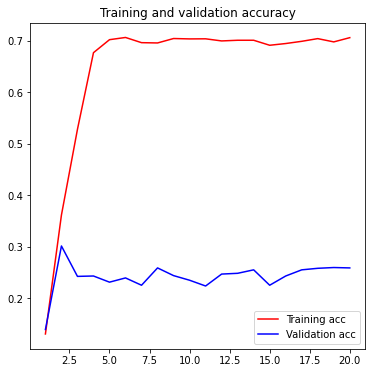

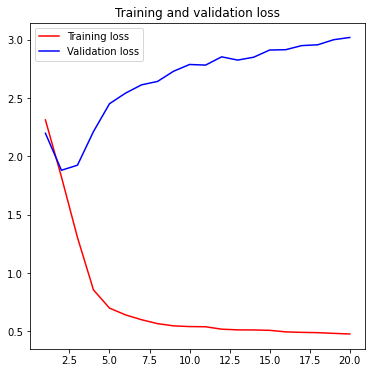

In [57]:
acc = textcnn_history.history['accuracy']
val_acc = textcnn_history.history['val_accuracy']
loss = textcnn_history.history['loss']
val_loss = textcnn_history.history['val_loss']
epochs = range(1, len(acc) + 1)

plt.title('Training and validation accuracy')
plt.plot(epochs, acc, 'red', label='Training acc')
plt.plot(epochs, val_acc, 'blue', label='Validation acc')
plt.legend()

plt.figure()
plt.title('Training and validation loss')
plt.plot(epochs, loss, 'red', label='Training loss')
plt.plot(epochs, val_loss, 'blue', label='Validation loss')
plt.legend()

plt.show()

In [118]:
predictedCNN = TextCNN.predict(x_val)
sklearn.metrics.top_k_accuracy_score(y_val.argmax(axis=1), predictedCNN, k=3)

0.7673896783844428

In [119]:
print(sklearn.metrics.classification_report(y_val.argmax(axis=1), predictedCNN.argmax(axis=1)))

              precision    recall  f1-score   support

           0       0.27      0.41      0.32       173
           1       0.55      0.67      0.60       131
           2       0.09      0.13      0.10        69
           3       0.31      0.32      0.31       149
           4       0.68      0.31      0.43        74
           5       0.10      0.07      0.08       165
           6       0.00      0.00      0.00        33
           7       0.19      0.22      0.20       189
           8       0.02      0.01      0.01       184
           9       0.19      0.14      0.16        50
          10       0.35      0.38      0.36       120

    accuracy                           0.26      1337
   macro avg       0.25      0.24      0.24      1337
weighted avg       0.24      0.26      0.24      1337



# BIDIRECTIONAL LSTM

In [46]:
# Bidrectional LSTM with convolution
# from https://www.kaggle.com/eashish/bidirectional-gru-with-convolution
#am schimbat din maxlen in 1000
inp = Input(shape=(maxlen,), dtype='int32')
x = embedding_layer(inp)
x = SpatialDropout1D(0.2)(x)
x = Bidirectional(GRU(128, return_sequences=True, dropout=0.1, recurrent_dropout=0.1))(x)
x = Conv1D(64, kernel_size=3)(x)
avg_pool = GlobalAveragePooling1D()(x)
max_pool = GlobalMaxPooling1D()(x)
x = concatenate([avg_pool, max_pool])
outp = Dense(len(int_category), activation="softmax")(x)

BiGRU = Model(inp, outp)
BiGRU.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['acc'])

BiGRU.summary()

Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, 500)]        0           []                               
                                                                                                  
 embedding_1 (Embedding)        (None, 500, 100)     54962200    ['input_6[0][0]']                
                                                                                                  
 spatial_dropout1d (SpatialDrop  (None, 500, 100)    0           ['embedding_1[3][0]']            
 out1D)                                                                                           
                                                                                                  
 bidirectional (Bidirectional)  (None, 500, 256)     176640      ['spatial_dropout1d[0][0]']

In [48]:
# training

bigru_history = BiGRU.fit(x_train, 
                          y_train, 
                          batch_size=32, 
                          epochs=20, 
                          validation_data=(x_val, y_val))

Epoch 1/20
167/167 [==============================] - 730s 4s/step - loss: 2.0467 - acc: 0.2667 - val_loss: 1.8149 - val_acc: 0.3373
Epoch 2/20
167/167 [==============================] - 708s 4s/step - loss: 1.8654 - acc: 0.3215 - val_loss: 1.8013 - val_acc: 0.3426
Epoch 3/20
167/167 [==============================] - 747s 4s/step - loss: 1.7742 - acc: 0.3561 - val_loss: 1.8286 - val_acc: 0.2992
Epoch 4/20
167/167 [==============================] - 747s 4s/step - loss: 1.7220 - acc: 0.3694 - val_loss: 1.6911 - val_acc: 0.3717
Epoch 5/20
167/167 [==============================] - 715s 4s/step - loss: 1.6526 - acc: 0.3956 - val_loss: 1.6629 - val_acc: 0.3747
Epoch 6/20
167/167 [==============================] - 716s 4s/step - loss: 1.6244 - acc: 0.4083 - val_loss: 1.6803 - val_acc: 0.3717
Epoch 7/20
167/167 [==============================] - 713s 4s/step - loss: 1.5722 - acc: 0.4231 - val_loss: 1.6465 - val_acc: 0.3657
Epoch 8/20
167/167 [==============================] - 748s 4s/step - 

In [50]:
BiGRU.save(r"C:/Users/live_/Beautifulsupa/Models/BiGRU.h5")

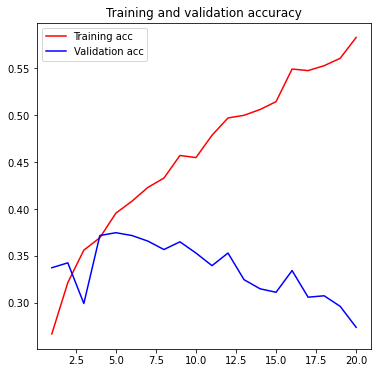

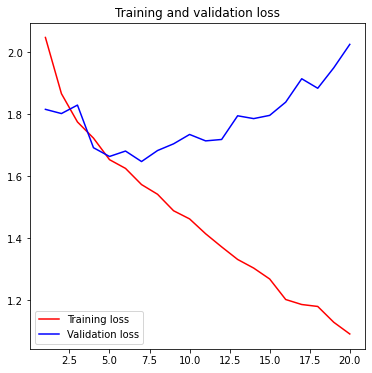

In [49]:
plt.rcParams['figure.figsize'] = (6,6)

acc = bigru_history.history['acc']
val_acc = bigru_history.history['val_acc']
loss = bigru_history.history['loss']
val_loss = bigru_history.history['val_loss']
epochs = range(1, len(acc) + 1)

plt.title('Training and validation accuracy')
plt.plot(epochs, acc, 'red', label='Training acc')
plt.plot(epochs, val_acc, 'blue', label='Validation acc')
plt.legend()

plt.figure()
plt.title('Training and validation loss')
plt.plot(epochs, loss, 'red', label='Training loss')
plt.plot(epochs, val_loss, 'blue', label='Validation loss')
plt.legend()

plt.show()

In [116]:
predictedBiGRU = BiGRU.predict(x_val)
sklearn.metrics.top_k_accuracy_score(y_val.argmax(axis=1), predictedBiGRU, k=3)

0.7524308152580403

In [117]:
print(sklearn.metrics.classification_report(y_val.argmax(axis=1), predictedBiGRU.argmax(axis=1)))

              precision    recall  f1-score   support

           0       0.34      0.18      0.23       173
           1       0.49      0.57      0.53       131
           2       0.12      0.07      0.09        69
           3       0.25      0.32      0.28       149
           4       0.37      0.57      0.45        74
           5       0.23      0.33      0.27       165
           6       0.00      0.00      0.00        33
           7       0.21      0.15      0.18       189
           8       0.21      0.19      0.20       184
           9       0.20      0.38      0.26        50
          10       0.32      0.23      0.26       120

    accuracy                           0.27      1337
   macro avg       0.25      0.27      0.25      1337
weighted avg       0.27      0.27      0.26      1337



# LSTM

In [14]:
class Attention(Layer):
    def __init__(self, step_dim,
                 W_regularizer=None, b_regularizer=None,
                 W_constraint=None, b_constraint=None,
                 bias=True, **kwargs):
        self.supports_masking = True
        self.init = initializers.get('glorot_uniform')
        self.W_regularizer = regularizers.get(W_regularizer)
        self.b_regularizer = regularizers.get(b_regularizer)
        self.W_constraint = constraints.get(W_constraint)
        self.b_constraint = constraints.get(b_constraint)
        self.bias = bias
        self.step_dim = step_dim
        self.features_dim = 0
        super(Attention, self).__init__(**kwargs)

    def build(self, input_shape):
        assert len(input_shape) == 3
        self.W = self.add_weight(shape = (input_shape[-1],),
                                 initializer=self.init,
                                 name='{}_W'.format(self.name),
                                 regularizer=self.W_regularizer,
                                 constraint=self.W_constraint)
        self.features_dim = input_shape[-1]
        if self.bias:
            self.b = self.add_weight(shape = (input_shape[1],),
                                     initializer='zero',
                                     name='{}_b'.format(self.name),
                                     regularizer=self.b_regularizer,
                                     constraint=self.b_constraint)
        else:
            self.b = None
        self.built = True

    def compute_mask(self, input, input_mask=None):
        return None

    def call(self, x, mask=None):
        features_dim = self.features_dim
        step_dim = self.step_dim
        eij = K.reshape(K.dot(K.reshape(x, (-1, features_dim)), K.reshape(self.W, (features_dim, 1))), (-1, step_dim))
        if self.bias:
            eij += self.b
        eij = K.tanh(eij)
        a = K.exp(eij)
        if mask is not None:
            a *= K.cast(mask, K.floatx())
        a /= K.cast(K.sum(a, axis=1, keepdims=True) + K.epsilon(), K.floatx())
        a = K.expand_dims(a)
        weighted_input = x * a
        return K.sum(weighted_input, axis=1)

    def compute_output_shape(self, input_shape):
        return input_shape[0],  self.features_dim
    
    def get_config(self):
        config = super().get_config().copy()
        config.update({
            'step_dim': self.step_dim,
            'W_regularizer': self.W_regularizer,
            'b_regularizer': self.b_regularizer,
            'W_constraint': self.W_constraint,
            'b_constraint': self.b_constraint,
            'bias': self.bias,
        })
        return config
    

lstm_layer = LSTM(300, dropout=0.25, recurrent_dropout=0.25, return_sequences=True)

inp = Input(shape=(maxlen,), dtype='int32')
embedding= embedding_layer(inp)
x = lstm_layer(embedding)
x = Dropout(0.25)(x)
merged = Attention(maxlen)(x)
merged = Dense(256, activation='relu')(merged)
merged = Dropout(0.25)(merged)
merged = BatchNormalization()(merged)
outp = Dense(len(int_category), activation='softmax')(merged)

AttentionLSTM = Model(inputs=inp, outputs=outp)
AttentionLSTM.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['acc'])

AttentionLSTM.summary()
#with maxlen de 500

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 500)]             0         
                                                                 
 embedding (Embedding)       (None, 500, 100)          23239900  
                                                                 
 lstm (LSTM)                 (None, 500, 300)          481200    
                                                                 
 dropout (Dropout)           (None, 500, 300)          0         
                                                                 
 attention (Attention)       (None, 300)               800       
                                                                 
 dense (Dense)               (None, 256)               77056     
                                                                 
 dropout_1 (Dropout)         (None, 256)               0     

In [64]:
attlstm_history = AttentionLSTM.fit(x_train, 
                                    y_train, 
                                    batch_size=32, 
                                    epochs=20, 
                                    validation_data=(x_val, y_val))

Epoch 1/20
167/167 [==============================] - 1594s 10s/step - loss: 2.1040 - acc: 0.2756 - val_loss: 2.1693 - val_acc: 0.1571
Epoch 2/20
167/167 [==============================] - 1558s 9s/step - loss: 1.8787 - acc: 0.3219 - val_loss: 2.0825 - val_acc: 0.2625
Epoch 3/20
167/167 [==============================] - 1541s 9s/step - loss: 1.7949 - acc: 0.3486 - val_loss: 1.8138 - val_acc: 0.3298
Epoch 4/20
167/167 [==============================] - 1558s 9s/step - loss: 1.7318 - acc: 0.3602 - val_loss: 2.0108 - val_acc: 0.3067
Epoch 5/20
167/167 [==============================] - 1562s 9s/step - loss: 1.6858 - acc: 0.3754 - val_loss: 1.7905 - val_acc: 0.3635
Epoch 6/20
167/167 [==============================] - 1561s 9s/step - loss: 1.6597 - acc: 0.3815 - val_loss: 1.7005 - val_acc: 0.3583
Epoch 7/20
167/167 [==============================] - 1562s 9s/step - loss: 1.6142 - acc: 0.3982 - val_loss: 1.7061 - val_acc: 0.3740
Epoch 8/20
167/167 [==============================] - 1579s 9

In [65]:
AttentionLSTM.save(r"C:/Users/live_/Beautifulsupa/Models/LSTMattention2.h5")

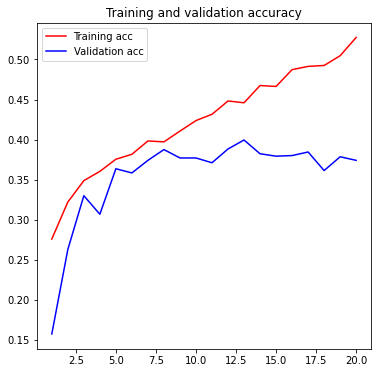

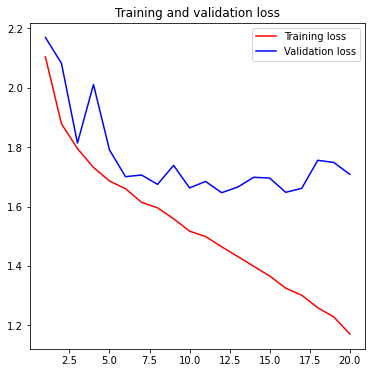

In [66]:
acc = attlstm_history.history['acc']
val_acc = attlstm_history.history['val_acc']
loss = attlstm_history.history['loss']
val_loss = attlstm_history.history['val_loss']
epochs = range(1, len(acc) + 1)

plt.title('Training and validation accuracy')
plt.plot(epochs, acc, 'red', label='Training acc')
plt.plot(epochs, val_acc, 'blue', label='Validation acc')
plt.legend()

plt.figure()
plt.title('Training and validation loss')
plt.plot(epochs, loss, 'red', label='Training loss')
plt.plot(epochs, val_loss, 'blue', label='Validation loss')
plt.legend()

plt.show()

In [67]:
# confusion matrix
predicted = AttentionLSTM.predict(x_val)
cm = pd.DataFrame(confusion_matrix(y_val.argmax(axis=1), predicted.argmax(axis=1)))

In [105]:
sklearn.metrics.top_k_accuracy_score(y_val.argmax(axis=1), predicted, k=3)

0.7950635751682872

In [114]:
print(sklearn.metrics.classification_report(y_val.argmax(axis=1), predicted.argmax(axis=1)))

              precision    recall  f1-score   support

           0       0.39      0.35      0.37       173
           1       0.47      0.69      0.56       131
           2       0.15      0.10      0.12        69
           3       0.32      0.53      0.40       149
           4       0.56      0.53      0.54        74
           5       0.26      0.27      0.27       165
           6       0.30      0.09      0.14        33
           7       0.35      0.16      0.22       189
           8       0.41      0.49      0.45       184
           9       0.26      0.18      0.21        50
          10       0.46      0.37      0.41       120

    accuracy                           0.37      1337
   macro avg       0.36      0.34      0.34      1337
weighted avg       0.37      0.37      0.36      1337



In [68]:
from IPython.display import display
pd.options.display.max_columns = None
display(cm)

,0,1,2,3,4,5,6,7,8,9,10
0,61,25,0,19,1,43,1,6,13,1,3
1,13,91,0,7,1,1,6,3,2,0,7
2,5,1,7,13,0,25,0,10,1,6,1
3,8,6,1,79,11,15,0,13,5,2,9
4,3,5,0,15,39,2,0,0,6,1,3
5,29,6,22,34,1,45,0,8,3,12,5
6,10,10,0,5,1,3,3,0,1,0,0
7,12,6,6,16,3,16,0,31,93,3,3
8,8,5,0,38,3,3,0,15,91,0,21
9,2,5,10,10,0,11,0,3,0,9,0


# Rezultate

In [42]:
def evaluate_accuracy(model):
    predicted = model.predict(x_val)
    diff = y_val.argmax(axis=-1) - predicted.argmax(axis=-1)
    corrects = np.where(diff == 0)[0].shape[0]
    total = y_val.shape[0]
    return float(corrects/total)

In [121]:
print("model TextCNN accuracy:          %.6f" % evaluate_accuracy(TextCNN))
print("model Bidirectional GRU + Conv:  %.6f" % evaluate_accuracy(BiGRU))
print("model LSTM with Attention:       %.6f" % evaluate_accuracy(AttentionLSTM))

model LSTM with Attention:       0.373972


In [70]:
def evaluate_accuracy_ensemble(models):
    res = np.zeros(shape=y_val.shape)
    for model in models:
        predicted = model.predict(x_val)
        res += predicted
    res /= len(models)
    diff = y_val.argmax(axis=-1) - res.argmax(axis=-1)
    corrects = np.where(diff == 0)[0].shape[0]
    total = y_val.shape[0]
    return float(corrects/total)

In [71]:
print(evaluate_accuracy_ensemble([TextCNN, BiGRU, AttentionLSTM]))

0.2887060583395662


# Simple LSTM 8

In [177]:
SimpleLSTM = Sequential()
SimpleLSTM.add(embedding_layer)
SimpleLSTM.add(LSTM(8))
SimpleLSTM.add(Dense(11, activation = 'softmax'))

SimpleLSTM.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['acc'])
SimpleLSTM.summary()

Model: "sequential_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_3 (Embedding)     (None, 500, 100)          54962200  
                                                                 
 lstm_16 (LSTM)              (None, 8)                 3488      
                                                                 
 dense_57 (Dense)            (None, 11)                99        
                                                                 
Total params: 54,965,787
Trainable params: 3,587
Non-trainable params: 54,962,200
_________________________________________________________________


In [154]:
SimpleLSTM_history = SimpleLSTM.fit(x_train, 
                                    y_train, 
                                    batch_size=64, 
                                    epochs=10, 
                                    validation_data=(x_val, y_val))

Epoch 1/10
84/84 [==============================] - 14s 141ms/step - loss: 2.3520 - acc: 0.1375 - val_loss: 2.3071 - val_acc: 0.1608
Epoch 2/10
84/84 [==============================] - 12s 137ms/step - loss: 2.2816 - acc: 0.1658 - val_loss: 2.2679 - val_acc: 0.1743
Epoch 3/10
84/84 [==============================] - 12s 137ms/step - loss: 2.2333 - acc: 0.2008 - val_loss: 2.2168 - val_acc: 0.2034
Epoch 4/10
84/84 [==============================] - 14s 168ms/step - loss: 2.1732 - acc: 0.2388 - val_loss: 2.1781 - val_acc: 0.2184
Epoch 5/10
84/84 [==============================] - 12s 140ms/step - loss: 2.1090 - acc: 0.2653 - val_loss: 2.1278 - val_acc: 0.2423
Epoch 6/10
84/84 [==============================] - 11s 131ms/step - loss: 2.1011 - acc: 0.2594 - val_loss: 2.1239 - val_acc: 0.2304
Epoch 7/10
84/84 [==============================] - 11s 136ms/step - loss: 2.0637 - acc: 0.2719 - val_loss: 2.0943 - val_acc: 0.2371
Epoch 8/10
84/84 [==============================] - 11s 134ms/step - 

In [155]:
predictedsimpleLSTM = SimpleLSTM.predict(x_val)
sklearn.metrics.top_k_accuracy_score(y_val.argmax(axis=1), predictedsimpleLSTM, k=3)

0.5796559461480928

In [156]:
print(sklearn.metrics.classification_report(y_val.argmax(axis=1), predictedsimpleLSTM.argmax(axis=1)))

              precision    recall  f1-score   support

           0       0.15      0.14      0.15       173
           1       0.31      0.72      0.43       131
           2       0.00      0.00      0.00        69
           3       0.22      0.32      0.26       149
           4       0.70      0.09      0.17        74
           5       0.18      0.36      0.24       165
           6       0.00      0.00      0.00        33
           7       0.41      0.56      0.47       189
           8       0.28      0.09      0.14       184
           9       0.00      0.00      0.00        50
          10       0.00      0.00      0.00       120

    accuracy                           0.27      1337
   macro avg       0.21      0.21      0.17      1337
weighted avg       0.23      0.27      0.22      1337



C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


# LSTM de 256

In [15]:
SimpleLSTM = Sequential()
SimpleLSTM.add(embedding_layer)
SimpleLSTM.add(LSTM(256))
SimpleLSTM.add(Dense(11, activation = 'softmax'))

SimpleLSTM.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['acc'])

In [16]:
SimpleLSTM_history = SimpleLSTM.fit(x_train, 
                                    y_train, 
                                    batch_size=64, 
                                    epochs=10, 
                                    validation_data=(x_val, y_val))

Epoch 1/10
84/84 [==============================] - 202s 2s/step - loss: 2.2090 - acc: 0.1946 - val_loss: 2.1911 - val_acc: 0.1942
Epoch 2/10
84/84 [==============================] - 218s 3s/step - loss: 2.1348 - acc: 0.2260 - val_loss: 2.1390 - val_acc: 0.2450
Epoch 3/10
84/84 [==============================] - 209s 2s/step - loss: 2.0593 - acc: 0.2725 - val_loss: 2.1206 - val_acc: 0.2315
Epoch 4/10
84/84 [==============================] - 218s 3s/step - loss: 2.0072 - acc: 0.2832 - val_loss: 2.1676 - val_acc: 0.2099
Epoch 5/10
84/84 [==============================] - 214s 3s/step - loss: 2.1411 - acc: 0.2471 - val_loss: 2.1755 - val_acc: 0.2196
Epoch 6/10
84/84 [==============================] - 207s 2s/step - loss: 2.0644 - acc: 0.2589 - val_loss: 2.1502 - val_acc: 0.2099
Epoch 7/10
84/84 [==============================] - 203s 2s/step - loss: 1.9829 - acc: 0.2846 - val_loss: 2.0289 - val_acc: 0.2674
Epoch 8/10
84/84 [==============================] - 215s 3s/step - loss: 1.8931 - a

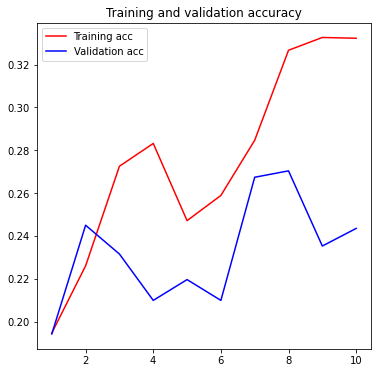

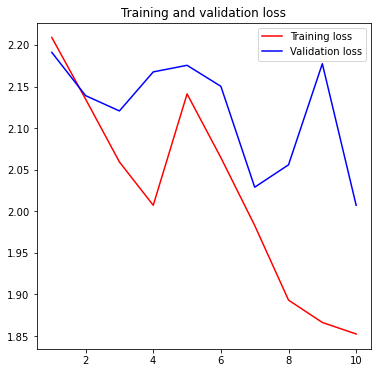

In [22]:
acc = SimpleLSTM_history.history['acc']
val_acc = SimpleLSTM_history.history['val_acc']
loss = SimpleLSTM_history.history['loss']
val_loss = SimpleLSTM_history.history['val_loss']
epochs = range(1, len(acc) + 1)

plt.title('Training and validation accuracy')
plt.plot(epochs, acc, 'red', label='Training acc')
plt.plot(epochs, val_acc, 'blue', label='Validation acc')
plt.legend()

plt.figure()
plt.title('Training and validation loss')
plt.plot(epochs, loss, 'red', label='Training loss')
plt.plot(epochs, val_loss, 'blue', label='Validation loss')
plt.legend()

plt.show()

In [159]:
predictedsimpleLSTM = SimpleLSTM.predict(x_val)
sklearn.metrics.top_k_accuracy_score(y_val.argmax(axis=1), predictedsimpleLSTM, k=3)

0.6462228870605834

In [160]:
print(sklearn.metrics.classification_report(y_val.argmax(axis=1), predictedsimpleLSTM.argmax(axis=1)))

              precision    recall  f1-score   support

           0       0.21      0.23      0.22       173
           1       0.40      0.66      0.50       131
           2       0.20      0.14      0.17        69
           3       0.25      0.36      0.30       149
           4       0.83      0.26      0.39        74
           5       0.23      0.34      0.27       165
           6       0.00      0.00      0.00        33
           7       0.34      0.30      0.32       189
           8       0.23      0.20      0.22       184
           9       0.08      0.02      0.03        50
          10       0.26      0.13      0.18       120

    accuracy                           0.28      1337
   macro avg       0.27      0.24      0.23      1337
weighted avg       0.28      0.28      0.27      1337



In [131]:
SimpleLSTM.save(r"C:/Users/live_/Beautifulsupa/Models/SimpleLSTM.h5")

# Simple LSTM 32

In [149]:
SimpleLSTM = Sequential()
SimpleLSTM.add(embedding_layer)
SimpleLSTM.add(LSTM(32))
SimpleLSTM.add(Dense(11, activation = 'softmax'))

SimpleLSTM.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['acc'])

In [150]:
SimpleLSTM_history = SimpleLSTM.fit(x_train, 
                                    y_train, 
                                    batch_size=64, 
                                    epochs=10, 
                                    validation_data=(x_val, y_val))

Epoch 1/10
84/84 [==============================] - 38s 348ms/step - loss: 2.3166 - acc: 0.1295 - val_loss: 2.2505 - val_acc: 0.1788
Epoch 2/10
84/84 [==============================] - 30s 353ms/step - loss: 2.1904 - acc: 0.2131 - val_loss: 2.1329 - val_acc: 0.2446
Epoch 3/10
84/84 [==============================] - 28s 337ms/step - loss: 2.0823 - acc: 0.2586 - val_loss: 2.0434 - val_acc: 0.2461
Epoch 4/10
84/84 [==============================] - 28s 338ms/step - loss: 2.0131 - acc: 0.2811 - val_loss: 2.0448 - val_acc: 0.2588
Epoch 5/10
84/84 [==============================] - 29s 342ms/step - loss: 2.0222 - acc: 0.2754 - val_loss: 2.0172 - val_acc: 0.2408
Epoch 6/10
84/84 [==============================] - 29s 340ms/step - loss: 1.9729 - acc: 0.2899 - val_loss: 2.0294 - val_acc: 0.2693
Epoch 7/10
84/84 [==============================] - 28s 332ms/step - loss: 1.9715 - acc: 0.3016 - val_loss: 2.0354 - val_acc: 0.2633
Epoch 8/10
84/84 [==============================] - 28s 336ms/step - 

In [151]:
predictedsimpleLSTM = SimpleLSTM.predict(x_val)
sklearn.metrics.top_k_accuracy_score(y_val.argmax(axis=1), predictedsimpleLSTM, k=3)

0.5946148092744952

In [152]:
print(sklearn.metrics.classification_report(y_val.argmax(axis=1), predictedsimpleLSTM.argmax(axis=1)))

              precision    recall  f1-score   support

           0       0.16      0.25      0.20       173
           1       0.47      0.62      0.53       131
           2       0.13      0.03      0.05        69
           3       0.22      0.42      0.29       149
           4       0.61      0.23      0.33        74
           5       0.22      0.24      0.23       165
           6       0.00      0.00      0.00        33
           7       0.36      0.34      0.35       189
           8       0.28      0.31      0.30       184
           9       0.00      0.00      0.00        50
          10       0.31      0.03      0.06       120

    accuracy                           0.28      1337
   macro avg       0.25      0.23      0.21      1337
weighted avg       0.28      0.28      0.26      1337



# Simple DNN with one dense

In [23]:
SimpleDense = Sequential()
SimpleDense.add(embedding_layer)
SimpleDense.add(Dense(256, activation='relu'))
SimpleDense.add(Flatten())
SimpleDense.add(Dense(11, activation = 'sigmoid'))
SimpleDense.compile(loss='binary_crossentropy', optimizer='adam', metrics=['acc'])
SimpleDense.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 500, 100)          23239900  
                                                                 
 dense_5 (Dense)             (None, 500, 256)          25856     
                                                                 
 flatten_1 (Flatten)         (None, 128000)            0         
                                                                 
 dense_6 (Dense)             (None, 11)                1408011   
                                                                 
Total params: 24,673,767
Trainable params: 1,433,867
Non-trainable params: 23,239,900
_________________________________________________________________


In [24]:
SimpleDense_history = SimpleDense.fit(x_train, 
                                    y_train, 
                                    batch_size=64, 
                                    epochs=10, 
                                    validation_data=(x_val, y_val))

Epoch 1/10
84/84 [==============================] - 14s 162ms/step - loss: 0.5404 - acc: 0.2036 - val_loss: 0.2729 - val_acc: 0.2375
Epoch 2/10
84/84 [==============================] - 10s 114ms/step - loss: 0.1953 - acc: 0.5596 - val_loss: 0.3043 - val_acc: 0.2278
Epoch 3/10
84/84 [==============================] - 9s 111ms/step - loss: 0.1554 - acc: 0.6582 - val_loss: 0.3480 - val_acc: 0.2106
Epoch 4/10
84/84 [==============================] - 9s 108ms/step - loss: 0.1403 - acc: 0.6645 - val_loss: 0.3657 - val_acc: 0.2211
Epoch 5/10
84/84 [==============================] - 9s 109ms/step - loss: 0.1317 - acc: 0.6621 - val_loss: 0.3731 - val_acc: 0.2330
Epoch 6/10
84/84 [==============================] - 10s 115ms/step - loss: 0.1271 - acc: 0.6657 - val_loss: 0.3768 - val_acc: 0.2442
Epoch 7/10
84/84 [==============================] - 9s 107ms/step - loss: 0.1229 - acc: 0.6683 - val_loss: 0.3843 - val_acc: 0.2285
Epoch 8/10
84/84 [==============================] - 9s 113ms/step - loss:

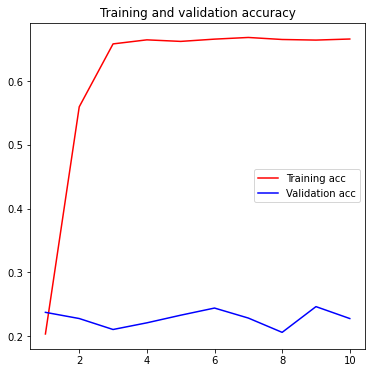

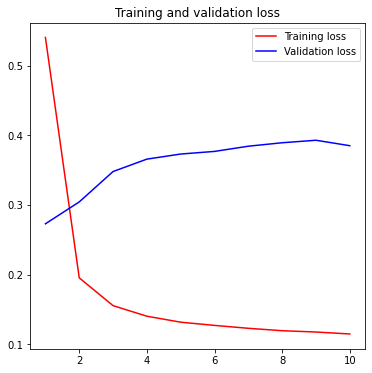

In [25]:
acc = SimpleDense_history.history['acc']
val_acc = SimpleDense_history.history['val_acc']
loss = SimpleDense_history.history['loss']
val_loss = SimpleDense_history.history['val_loss']
epochs = range(1, len(acc) + 1)

plt.title('Training and validation accuracy')
plt.plot(epochs, acc, 'red', label='Training acc')
plt.plot(epochs, val_acc, 'blue', label='Validation acc')
plt.legend()

plt.figure()
plt.title('Training and validation loss')
plt.plot(epochs, loss, 'red', label='Training loss')
plt.plot(epochs, val_loss, 'blue', label='Validation loss')
plt.legend()

plt.show()

In [19]:
predictedsimpleDense = SimpleDense.predict(x_val)
sklearn.metrics.top_k_accuracy_score(y_val.argmax(axis=1), predictedsimpleDense, k=3)

0.6221060492905153

In [20]:
print(sklearn.metrics.classification_report(y_val.argmax(axis=1), predictedsimpleDense.argmax(axis=1)))

              precision    recall  f1-score   support

           0       0.22      0.35      0.27       175
           1       0.52      0.60      0.56       130
           2       0.06      0.07      0.06        74
           3       0.31      0.36      0.34       164
           4       0.73      0.41      0.52        59
           5       0.10      0.07      0.08       165
           6       0.00      0.00      0.00        41
           7       0.14      0.11      0.13       176
           8       0.12      0.12      0.12       188
           9       0.04      0.02      0.03        46
          10       0.22      0.26      0.24       121

    accuracy                           0.23      1339
   macro avg       0.22      0.21      0.21      1339
weighted avg       0.22      0.23      0.22      1339



# Simple DNN with 2 dense

In [165]:
SimpleDense = Sequential()
SimpleDense.add(embedding_layer)
SimpleDense.add(Dense(256, activation='relu'))
SimpleDense.add(Dense(256, activation='relu'))
SimpleDense.add(Flatten())
SimpleDense.add(Dense(11, activation = 'sigmoid'))
SimpleDense.compile(loss='binary_crossentropy', optimizer='adam', metrics=['acc'])
SimpleDense.summary()

Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_3 (Embedding)     (None, 500, 100)          54962200  
                                                                 
 dense_51 (Dense)            (None, 500, 256)          25856     
                                                                 
 dense_52 (Dense)            (None, 500, 256)          65792     
                                                                 
 flatten_4 (Flatten)         (None, 128000)            0         
                                                                 
 dense_53 (Dense)            (None, 11)                1408011   
                                                                 
Total params: 56,461,859
Trainable params: 1,499,659
Non-trainable params: 54,962,200
_________________________________________________________________


In [166]:
SimpleDense_history = SimpleDense.fit(x_train, 
                                    y_train, 
                                    batch_size=64, 
                                    epochs=10, 
                                    validation_data=(x_val, y_val))

Epoch 1/10
84/84 [==============================] - 25s 288ms/step - loss: 0.3603 - acc: 0.2053 - val_loss: 0.2653 - val_acc: 0.2281
Epoch 2/10
84/84 [==============================] - 23s 280ms/step - loss: 0.2430 - acc: 0.3597 - val_loss: 0.2650 - val_acc: 0.2184
Epoch 3/10
84/84 [==============================] - 23s 276ms/step - loss: 0.1890 - acc: 0.5535 - val_loss: 0.2914 - val_acc: 0.2064
Epoch 4/10
84/84 [==============================] - 24s 280ms/step - loss: 0.1423 - acc: 0.6654 - val_loss: 0.3299 - val_acc: 0.1945
Epoch 5/10
84/84 [==============================] - 24s 285ms/step - loss: 0.1220 - acc: 0.6845 - val_loss: 0.3586 - val_acc: 0.1945
Epoch 6/10
84/84 [==============================] - 23s 273ms/step - loss: 0.1131 - acc: 0.6783 - val_loss: 0.3653 - val_acc: 0.2057
Epoch 7/10
84/84 [==============================] - 23s 274ms/step - loss: 0.1077 - acc: 0.6789 - val_loss: 0.3691 - val_acc: 0.2012
Epoch 8/10
84/84 [==============================] - 23s 270ms/step - 

In [167]:
predictedsimpleDense = SimpleDense.predict(x_val)
sklearn.metrics.top_k_accuracy_score(y_val.argmax(axis=1), predictedsimpleDense, k=3)

0.5953627524308153

In [168]:
print(sklearn.metrics.classification_report(y_val.argmax(axis=1), predictedsimpleDense.argmax(axis=1)))

              precision    recall  f1-score   support

           0       0.18      0.31      0.23       173
           1       0.41      0.66      0.50       131
           2       0.04      0.04      0.04        69
           3       0.26      0.24      0.25       149
           4       0.62      0.28      0.39        74
           5       0.10      0.08      0.09       165
           6       0.00      0.00      0.00        33
           7       0.11      0.11      0.11       189
           8       0.15      0.15      0.15       184
           9       0.00      0.00      0.00        50
          10       0.05      0.02      0.02       120

    accuracy                           0.20      1337
   macro avg       0.17      0.17      0.16      1337
weighted avg       0.18      0.20      0.18      1337



In [148]:
SimpleDense.save(r"C:/Users/live_/Beautifulsupa/Models/SimpleDense.h5")